In [111]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import math

In [112]:
def coth(a):
    if a>0: return (1+tf.math.exp(-2*a))/(1-tf.math.exp(-2*a))
    if a<0: return (tf.math.exp(2*a)+1)/(tf.math.exp(2*a)-1)
    if a==0: return 0

def tanh(a):
    if a>0: return (1-tf.math.exp(-2*a))/(1+tf.math.exp(-2*a))
    if a<0: return (tf.math.exp(2*a)-1)/(tf.math.exp(2*a)+1)
    if a==0: return 0

In [113]:
data=10000
batch=100
set=100
layer=10
n_ini=1.0
n_fin=0.1
dn=-0.1
c_reg1=0.01
c_reg2=0.0001
d=2

m^2= <tf.Variable 'Variable:0' shape=() dtype=float64, numpy=0.9555282568323624>
lam= <tf.Variable 'Variable:0' shape=() dtype=float64, numpy=1.7792157162006763>
alpha= <tf.Variable 'Variable:0' shape=() dtype=float64, numpy=-0.08121022944044676>
beta= <tf.Variable 'Variable:0' shape=() dtype=float64, numpy=0.2799038113714387>
<tf.Variable 'Variable:0' shape=(10,) dtype=float64, numpy=
array([1.34741989, 0.45154038, 1.32905177, 1.69808508, 2.50775107,
       2.17747968, 2.48221008, 1.09208727, 2.04096481, 3.03627889])>


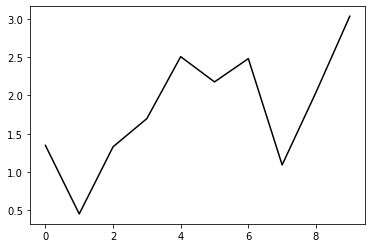

In [151]:
h=tf.zeros(layer)
h_in=[]
for i in range (layer):
    h_inn=np.float64(np.random.normal(2, 1))
    h_in.append(h_inn)
h=tf.Variable(h_in)
m2=tf.Variable(np.float64(np.random.normal(2, 1)))
lam=tf.Variable(np.float64(np.random.normal(1, 1)))
alpha=tf.Variable(np.float64(np.random.uniform(-0.5, 0.5)))
beta=tf.Variable(np.float64(np.random.uniform(-0.5, 0.5)))
#m2=tf.constant(np.float64(5.6))
#lam=tf.constant(np.float64(0.61))
#alpha=tf.constant(np.float64(1.444635))
#beta=tf.constant(np.float64(0.00615))
print("m^2=", m2)
print("lam=", lam)
print("alpha=", alpha)
print("beta=", beta)
print(h)
plt.plot(h.numpy(), 'k-')
plt.show()

In [115]:
def F_func(m, la, a,b):
    return 2*b/n_fin-m*a-la*(a**3)

def t_func(a):
    return 0.5*(tf.math.tanh(100*(a-0.1))-tf.math.tanh(100*(a+0.1))+2)

In [116]:
x=[i*0.2 for i in range (30)]
y=[0.0, 0.018, 0.035, 0.053, 0.0715, 0.0895, 0.107, 0.125, 0.146, 0.1665, 0.1875, 0.2085, 0.229, 0.25, 0.265, 0.281, 0.296, 0.3115, 0.3275, 0.343, 0.3565, 0.385, 0.4375, 0.5, 0.6, 0.675, 0.735, 0.815, 0.865, 0.885]
y[:]=[2*v for v in y]
fp1 = np.polyfit(x, y, 15)
print(fp1)

[ 1.59046394e-05 -6.81729682e-04  1.31412795e-02 -1.50525136e-01
  1.14052774e+00 -6.02241647e+00  2.27455168e+01 -6.20704699e+01
  1.22166922e+02 -1.71187074e+02  1.66428955e+02 -1.07461552e+02
  4.28229887e+01 -9.20544914e+00  9.55260239e-01 -1.30911492e-04]


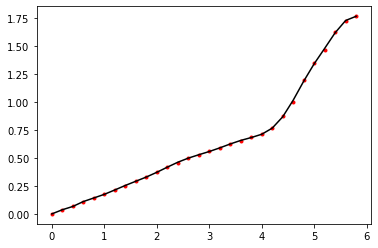

In [117]:
def f(x):
    y=0
    for i in range (16):
        y=y+fp1[i]*x**(15-i)
    return y
yy=[f(i*0.2) for i in range (30)]
plt.plot(x, y, 'r.')
plt.plot(x, yy, 'k-')
plt.show()

In [118]:
def NN_func_p(f):
    Positive=[]
    append=Positive.append
    while len(Positive)<batch:
        H=np.random.uniform(0.0, 6.0)
        M=np.random.uniform(0.0, 2.0)
        noise=np.abs(np.random.normal(0, 0.1))
        if np.abs(M-f(H))<=noise: append([H, M])
        else: continue
    return Positive
def NN_func_n(f):
    Negative=[]
    append=Negative.append
    while len(Negative)<batch:
        H=np.random.uniform(0.0, 6.0)
        M=np.random.uniform(0.0, 2.0)
        noise=np.abs(np.random.normal(0, 0.1))
        if np.abs(M-f(H))>noise: append([H, M])
        else: continue
    return Negative

In [119]:
Positive=[]
Negative=[]
for i in range (set):
    Positive.insert(i, NN_func_p(f))
    Negative.insert(i, NN_func_n(f))

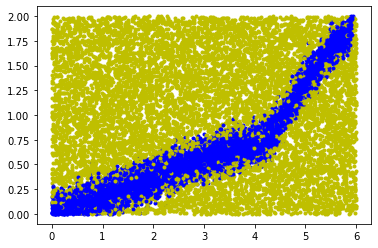

In [120]:
x_data1=[]
y_data1=[]
x_data2=[]
y_data2=[]
for i in range (set):
    x_data1.insert(i, [v[0] for v in Positive[i]])
    y_data1.insert(i, [v[1] for v in Positive[i]])
    x_data2.insert(i, [v[0] for v in Negative[i]])
    y_data2.insert(i, [v[1] for v in Negative[i]])
    plt.plot(x_data2[i], y_data2[i], 'y.')
    plt.plot(x_data1[i], y_data1[i], 'b.')
plt.show()

In [121]:
def Dfunc(hh, m):
    D=tf.math.sqrt(tf.math.abs(1+4*m/(hh[0]**2)))
    return D

In [122]:
def LP2(hh, m, la, alpha, beta, HH, MM):
    D=Dfunc(hh, m)
    phi=alpha*HH+beta*MM
    pi=(d/2)*(D-1)*alpha*HH+(d/2)*(-D-1)*beta*MM
    for j in range (layer-1):
        phi1=phi+dn*pi
        pi1 =phi*m*dn+(1-dn*hh[j])*pi+dn*la*(phi1**3)
        phi=phi1
        pi=pi1
    return phi, pi
def NN_func_01(hh, m, la, alpha, beta, list_hr):
    PP=[]
    NN=[]
    H=np.array(list_hr)[:, 0]
    M=np.array(list_hr)[:, 1]
    F=np.array(tf.math.abs(LP2(hh, m, la, alpha, beta, H, M)[1]))
    for i in range (len(H[F<0.1])):
        PP.append([H[F<0.1][i], M[F<0.1][i]])
    for i in range (len(H[F>=0.1])):
        NN.append([H[F>=0.1][i], M[F>=0.1][i]])
    return PP, NN

In [152]:
Positive0=[]
Positive1=[]
Negative0=[]
Negative1=[]
for i in range (set):
    Positive0.insert(i, NN_func_01(h, m2, lam, alpha, beta, Positive[i])[0])
    Positive1.insert(i, NN_func_01(h, m2, lam, alpha, beta, Positive[i])[1])
    Negative0.insert(i, NN_func_01(h, m2, lam, alpha, beta, Negative[i])[0])
    Negative1.insert(i, NN_func_01(h, m2, lam, alpha, beta, Negative[i])[1])

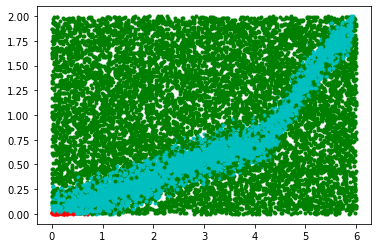

In [153]:
x_data1=[]
y_data1=[]
x_data2=[]
y_data2=[]
x_data3=[]
y_data3=[]
x_data4=[]
y_data4=[]
for i in range (set):
    x_data1.insert(i, [v[0] for v in Positive0[i]])
    y_data1.insert(i, [v[1] for v in Positive0[i]])
    x_data2.insert(i, [v[0] for v in Positive1[i]])
    y_data2.insert(i, [v[1] for v in Positive1[i]])
    x_data3.insert(i, [v[0] for v in Negative0[i]])
    y_data3.insert(i, [v[1] for v in Negative0[i]])
    x_data4.insert(i, [v[0] for v in Negative1[i]])
    y_data4.insert(i, [v[1] for v in Negative1[i]])
    plt.plot(x_data4[i], y_data4[i], 'g.')
    plt.plot(x_data2[i], y_data2[i], 'c.')
    plt.plot(x_data1[i], y_data1[i], 'r.')
    plt.plot(x_data3[i], y_data3[i], 'm.')
plt.show()

# Error function

$E=\sum_{data} \left\vert y(\bar{x}^{(1)}) - \bar{y} \right\vert+E_{reg}(W)$
, $E_{reg}=c_{reg}^{(1)}\sum_{n=1}^{N-1}(\eta^{(n)})^{4}(h(\eta^{(n+1)})-h(\eta^{(n)}))^{2}+c_{reg}^{(2)}(h(\eta^{(N)})-1/\eta^{(N)})^{2}$

In [154]:
def Error_func(hh, m, la, alpha, beta, list1, list2):
    H0=np.array([v[0] for v in list1])
    M0=np.array([v[1] for v in list1])
    H1=np.array([v[0] for v in list2])
    M1=np.array([v[1] for v in list2])
    H_0, M_0=LP2(hh, m, la, alpha, beta, H0, M0)
    H_1, M_1=LP2(hh, m, la, alpha, beta, H1, M1)
    PPlist=t_func(M_0)
    NNlist=t_func(M_1)
    sum_p=sum(PPlist)/batch
    sum_n=(batch-sum(NNlist))/batch

    inside=0
    for k in range (layer-1):
        second=((n_ini+k*dn)**4)*((hh[k+1]-hh[k])**2)
        inside=inside+second
    E_reg1=c_reg1*inside
    E_reg2=c_reg2*((hh[layer-1]-1/n_fin)**2)
    return sum_p+sum_n+E_reg1+E_reg2

In [155]:
for i in range (set):
    print(Error_func(h, m2, lam, alpha, beta, Positive[i], Negative[i]))

tf.Tensor(1.0185230235134943, shape=(), dtype=float64)
tf.Tensor(1.0008445921683053, shape=(), dtype=float64)
tf.Tensor(1.0208421875466052, shape=(), dtype=float64)
tf.Tensor(1.0108424359109514, shape=(), dtype=float64)
tf.Tensor(1.016622909500164, shape=(), dtype=float64)
tf.Tensor(1.0208314825091296, shape=(), dtype=float64)
tf.Tensor(1.0193251085218176, shape=(), dtype=float64)
tf.Tensor(1.0206909677653035, shape=(), dtype=float64)
tf.Tensor(1.0307097885838095, shape=(), dtype=float64)
tf.Tensor(0.9953825438436471, shape=(), dtype=float64)
tf.Tensor(1.0208421866951483, shape=(), dtype=float64)
tf.Tensor(1.0008545710612338, shape=(), dtype=float64)
tf.Tensor(1.0208421875466052, shape=(), dtype=float64)
tf.Tensor(1.0108456375529933, shape=(), dtype=float64)
tf.Tensor(1.019396039181158, shape=(), dtype=float64)
tf.Tensor(1.0208421848177827, shape=(), dtype=float64)
tf.Tensor(1.0208421712811109, shape=(), dtype=float64)
tf.Tensor(1.006569741169634, shape=(), dtype=float64)
tf.Tensor(1.0

# Optimize

0 0.9459934499383013
0.8356901111447093 1.7444349372941856 -0.04603226544891894 0.10344089270118707
[1.32003136 1.09241215 1.0115684  1.24375001 1.73448701 1.80196178
 1.82247073 0.83019831 1.48066404 3.95546203]


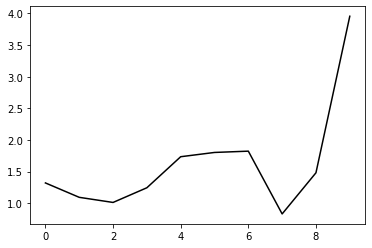

1100 0.8103942605178399
0.7535992126806751 1.6815649027175392 -0.032761858339013114 0.022093062715278007
[1.45495032 1.04456826 0.90944987 0.98985276 1.33263416 1.45376945
 1.45423592 0.51562767 1.13003979 4.48847485]


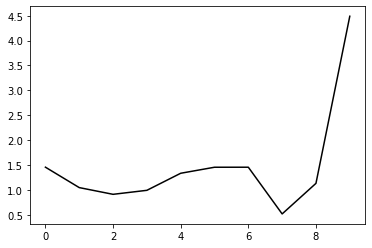

2200 0.8664858598433336
0.7135043775985701 1.5905930715772976 -0.04240023205760636 0.035416553592455505
[1.39746394 1.06604838 0.89210885 0.89597698 1.12167879 1.24462729
 1.21414095 0.30244625 0.868646   4.99837103]


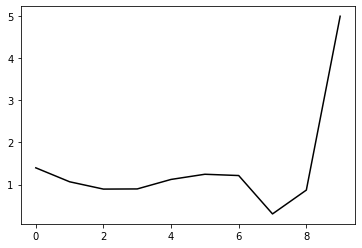

3300 0.8066273786331055
0.6788543089289599 1.498627479216749 -0.038038914886971205 0.02753379938040494
[1.32897242 1.09835551 0.85440441 0.78597664 0.93112907 1.04269285
 0.99472576 0.10251477 0.63960835 5.48956056]


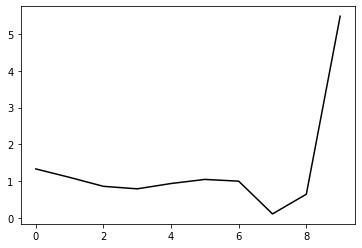

4400 1.0055737655691133
0.6292174081984603 1.4545091554453862 0.0016323319508339076 -0.0006787422432030656
[ 1.51290086  1.01091026  0.70041125  0.59095549  0.6873263   0.79620198
  0.74764949 -0.11326716  0.41166301  5.96586866]


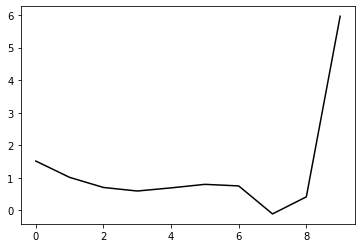

5500 1.003886110846776
0.6291887241396344 1.454503908633009 0.0016651950578089499 -0.0006880377437365819
[ 1.4836338   1.16410539  0.84239019  0.66371871  0.68552277  0.77789221
  0.72643043 -0.08447571  0.41769853  6.43032902]


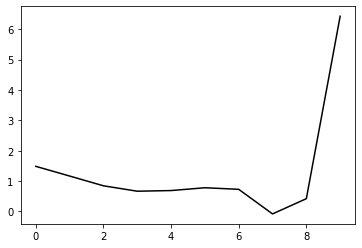

6600 1.0027974728627607
0.6291887255614019 1.4545039085830187 0.0016651950751129286 -0.0006881033951947677
[ 1.45167156  1.25342875  1.00478993  0.79148711  0.71371068  0.75356028
  0.69349597 -0.03819512  0.43013308  6.88049968]


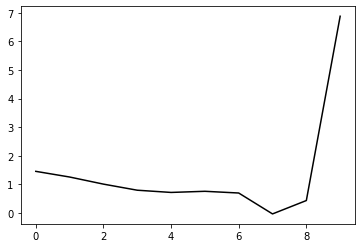

7700 1.0021107059767969
0.6291887274565262 1.4545039085850768 0.001665191984107244 -0.0006881801175244748
[1.41796404 1.30038129 1.13540733 0.94771958 0.7992238  0.74086404
 0.64898888 0.03220204 0.45526123 7.3110511 ]


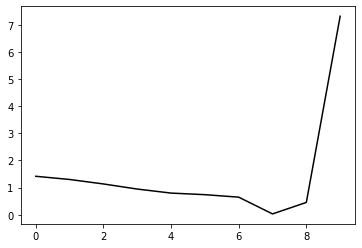

8800 1.0017138438010564
0.6291887297283354 1.4545039085876594 0.001665186953694071 -0.0006882739629916746
[1.3841685  1.31785023 1.21812112 1.08265015 0.92551312 0.77623066
 0.61136055 0.13152078 0.50492505 7.71428973]


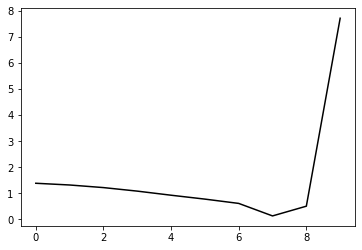

9900 1.0014885229760235
0.6291887323750387 1.4545039085912546 0.0016651765420156717 -0.0006883894836933821
[1.35157509 1.31477638 1.25681185 1.16859493 1.0408285  0.86621753
 0.63159689 0.26382418 0.59942377 8.07849177]


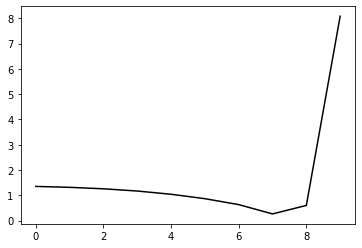

11000 1.001325256443592
0.6291887354405198 1.4545039085963887 0.0016651561260938776 -0.0006885345511433795
[1.31978446 1.29847728 1.26400736 1.20820106 1.11790282 0.97262662
 0.74492753 0.44373715 0.76756574 8.38638143]


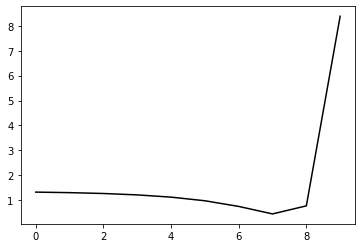

12100 1.0011776792270195
0.629188738507878 1.4545039086048048 0.0016651057264093175 -0.0006887197290740152
[1.28755514 1.27554607 1.25481942 1.22178426 1.16563214 1.07017342
 0.90933725 0.68745601 1.0351705  8.61723335]


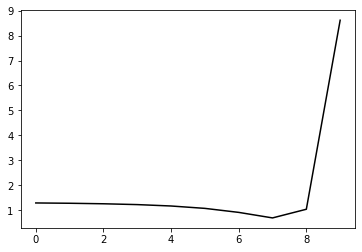

13200 1.0010498458989985
0.6291887400469733 1.4545039086191924 0.001664979423835673 -0.0006889467496345543
[1.26101278 1.2566022  1.24687778 1.22891007 1.19787026 1.15100812
 1.07022861 0.97157984 1.39596593 8.76257621]


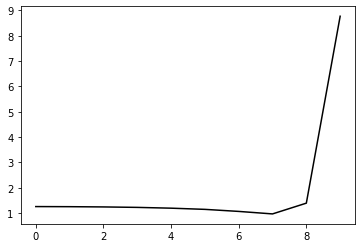

14300 1.0009521176937988
0.6291887369207994 1.4545039086444638 0.0016646885833920006 -0.0006892121696151676
[1.24525413 1.24397815 1.24109648 1.23650034 1.22989858 1.22227977
 1.2163212  1.25085964 1.80339463 8.84936121]


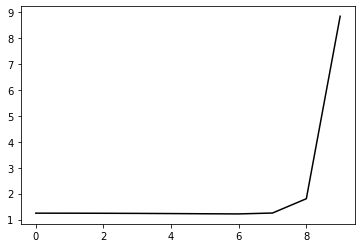

15400 1.0009938270094674
0.6291887222031528 1.4545039086895035 0.0016640583522799666 -0.0006894790344067204
[1.28861508 1.20478933 1.26956713 1.23227044 1.26217262 1.26993012
 1.33355128 1.48837956 2.20770142 8.91532263]


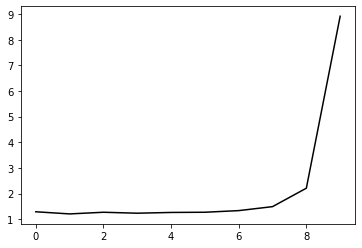

16500 1.0008525798947556
0.6291886931800255 1.4545039087587137 0.0016630251776460084 -0.0006897253591999923
[1.25084966 1.25166211 1.2552119  1.26359464 1.28226945 1.32309535
 1.41861054 1.66832917 2.56602101 8.97005821]


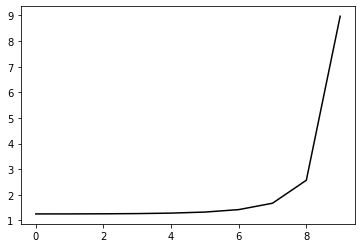

17600 1.0012626175592794
0.6291886438821886 1.4545039088624852 0.0016614612908739882 -0.0006898832748859791
[1.21177503 1.34112502 1.21615221 1.35881668 1.2527295  1.44965891
 1.42459481 1.83659478 2.85107084 9.01218414]


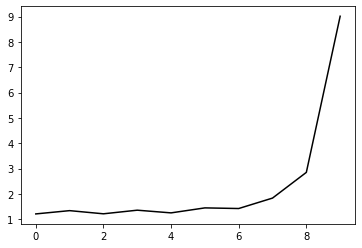

18700 1.000826572132757
0.6291885617935274 1.4545039090130243 0.0016590875338591967 -0.0006898357333377326
[1.28870026 1.29026943 1.29689075 1.31186778 1.34265113 1.40582004
 1.54531065 1.89716801 3.02986507 9.03807731]


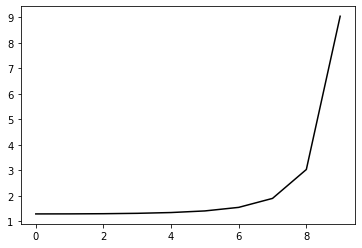

19800 1.0008212758481134
0.6291885054206783 1.454503909168881 0.0016571261296200678 -0.0006902484407798281
[1.31519045 1.32241019 1.32436685 1.34676807 1.37424882 1.44854406
 1.58719331 1.9584572  3.11349409 9.00409848]


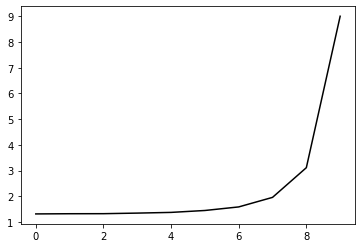

20900 1.0008155235231495
0.629188458879419 1.454503909338019 0.001655248638081293 -0.0006909501271178943
[1.34249859 1.34423954 1.35184954 1.36862846 1.40254608 1.47061668
 1.61778356 1.98372792 3.14743245 9.05502848]


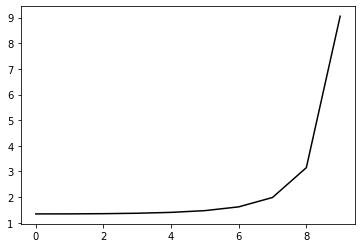

22000 1.0008105992291523
0.6291884265084113 1.454503909510116 0.0016536083170014578 -0.0006919098607958745
[1.36830508 1.37049605 1.37773253 1.3950174  1.42864054 1.49716309
 1.64385983 2.00914714 3.17011351 9.0492733 ]


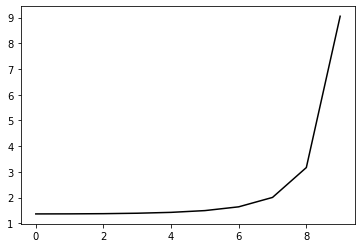

23100 1.0008061478917212
0.6291883934806075 1.4545039097037429 0.0016518465983604133 -0.000693028008770001
[1.3961008  1.40550163 1.40564238 1.42972708 1.45690945 1.53101314
 1.66953984 2.03671801 3.18148962 9.03307648]


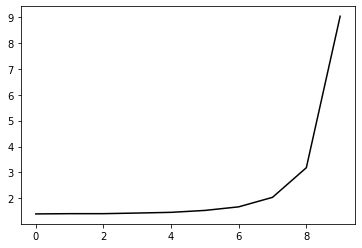

24200 1.0008006991085387
0.6291883779428719 1.4545039098957515 0.0016504026151182417 -0.0006944340393490791
[1.42140702 1.42332535 1.43073967 1.44761133 1.48120589 1.54893976
 1.694813   2.05786952 3.21095591 9.06924217]


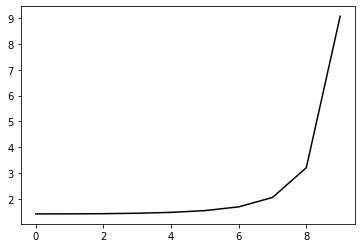

25300 1.001380962147666
0.6291883715775418 1.454503910096896 0.0016490628612845723 -0.000696091246082565
[1.53288118 1.3820042  1.54410771 1.40248946 1.59126531 1.51859163
 1.77748099 2.04794936 3.27044946 9.05038397]


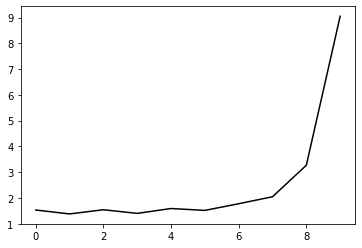

26400 1.0007906487369036
0.6291883785324349 1.4545039103059787 0.00164789174625782 -0.0006980868857903286
[1.47530925 1.47720705 1.48466776 1.50154827 1.5352086  1.60280952
 1.74820277 2.10945879 3.25446275 9.07806767]


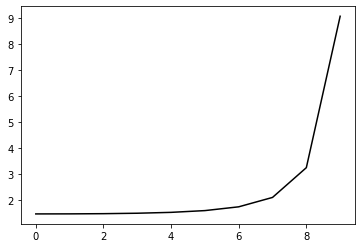

27500 1.0008292753620578
0.6291883908412658 1.4545039105314836 0.001646725479941645 -0.0007003189299510992
[1.51059042 1.50355281 1.52664455 1.50633221 1.61569031 1.57695768
 1.82098261 2.1018606  3.30322823 9.05715953]


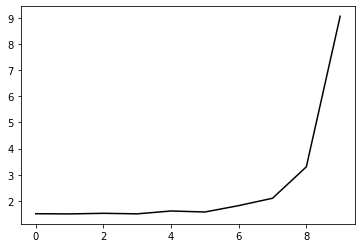

28600 1.0007806645604806
0.6291883979197413 1.4545039107949678 0.0016453222205154163 -0.0007026914935731391
[1.52975598 1.53157292 1.53921166 1.55571588 1.58946026 1.65602977
 1.79991288 2.16090334 3.29143429 9.09807707]


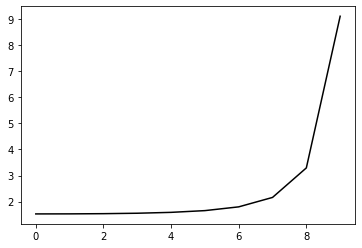

29700 1.0008376885383468
0.6291884242670761 1.4545039110760947 0.0016441384292634833 -0.0007055868264684414
[1.56074246 1.55532248 1.58676336 1.53953858 1.6724798  1.63953624
 1.85932243 2.16072219 3.33882443 9.05949575]


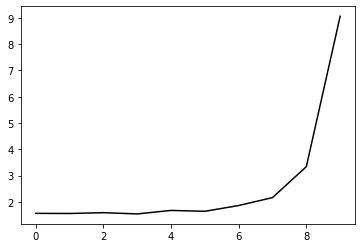

30800 1.0007713097751425
0.6291884780591197 1.4545039113679181 0.0016432110209197198 -0.0007093271919052402
[1.58104341 1.58268434 1.59057299 1.60733524 1.6401344  1.70912616
 1.84728194 2.21456219 3.32664179 9.11001509]


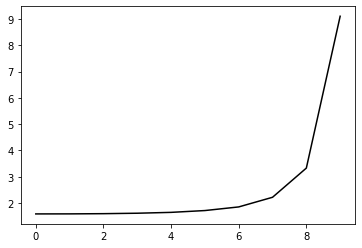

31900 1.0009958014255285
0.6291885556532024 1.4545039116732037 0.0016425051403377339 -0.0007138124366651438
[1.65747807 1.55943532 1.67403572 1.59340114 1.69677195 1.71338252
 1.89069375 2.21880997 3.37082971 9.07035466]


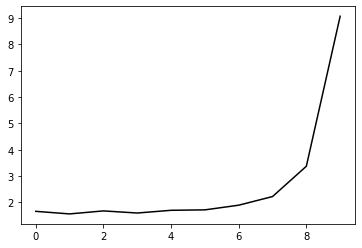

33000 1.0007625903182784
0.6291886532012411 1.454503912009713 0.0016418633569658392 -0.0007191053544026224
[1.63108175 1.63288655 1.64041702 1.65803612 1.68883699 1.76188565
 1.89084862 2.27097419 3.35551601 9.11787427]


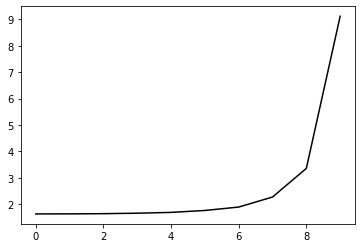

34100 1.0007820772557126
0.6291887715265603 1.4545039123814465 0.0016412792187134662 -0.0007252624953477697
[1.6755711  1.6439319  1.68551713 1.6698045  1.72641555 1.77376439
 1.93032645 2.27002872 3.40575602 9.07853037]


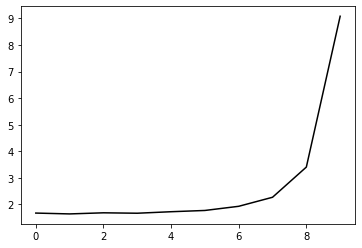

35200 1.0007570078537498
0.6291889131649006 1.4545039127907349 0.0016407825921271645 -0.0007323286755667155
[1.68160464 1.68388041 1.69013614 1.71135097 1.73263569 1.8251349
 1.92024106 2.33662981 3.38567096 9.11345992]


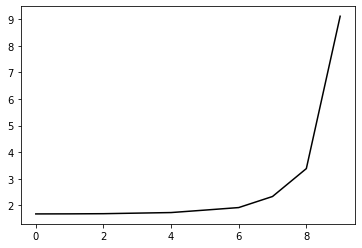

36300 1.0007483000819093
0.6291890757610394 1.4545039132522524 0.0016402468175699206 -0.0007404014145611982
[1.70742817 1.71077031 1.71688521 1.73233845 1.76801704 1.82653058
 1.97695663 2.31701288 3.44555063 9.08155168]


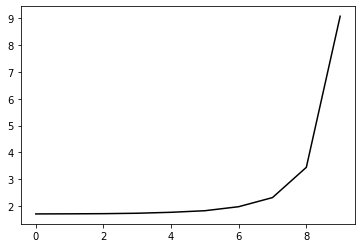

37400 1.0007765126452597
0.6291892782668191 1.4545039137624236 0.0016399001598395128 -0.0007499527160650826
[1.73161038 1.73954662 1.73336368 1.78385639 1.75150488 1.90425832
 1.95633239 2.38186582 3.43152544 9.11627786]


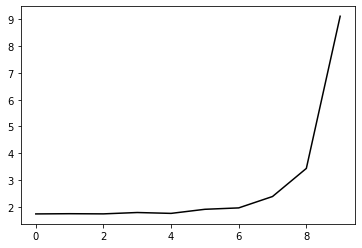

38500 1.000739496742536
0.6291895143768468 1.454503914355459 0.001639483886297212 -0.0007610743665971024
[1.75622746 1.75849184 1.76558928 1.78205675 1.81570683 1.87808844
 2.02528519 2.36217946 3.49100692 9.07699531]


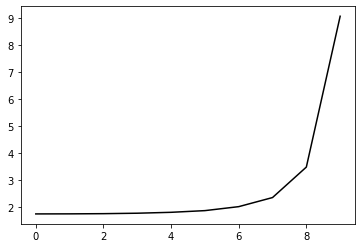

39600 1.0009241059596299
0.6291898023928609 1.4545039150577976 0.0016391374420561757 -0.0007743030903105741
[1.74966717 1.83113863 1.73993576 1.8560378  1.80668567 1.92977969
 2.02726319 2.40693181 3.48509491 9.11730162]


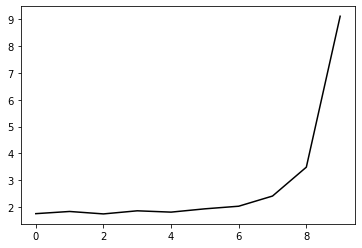

40700 1.0007310687821012
0.6291901528160693 1.4545039159386062 0.001638597601756882 -0.0007904375751679176
[1.80531234 1.80730675 1.8147836  1.83059098 1.86544296 1.92484577
 2.07699567 2.40092205 3.54052278 9.07391876]


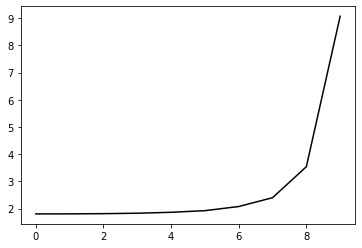

41800 1.00077791741953
0.6291906511353428 1.454503916938938 0.0016387135179378254 -0.0008118270697638554
[1.80846507 1.86216421 1.81927378 1.87440545 1.87770362 1.96209974
 2.08490284 2.44428736 3.52940547 9.11922738]


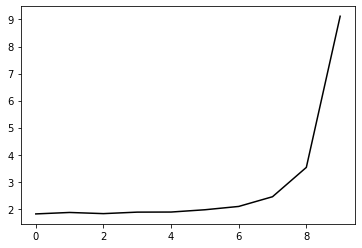

42900 1.0007247801977501
0.6291913382866267 1.4545039181795003 0.0016392322106473308 -0.0008402792641278196
[1.85584847 1.85744921 1.86592116 1.87876777 1.92095449 1.96372974
 2.14311141 2.42898513 3.59105733 9.08918182]


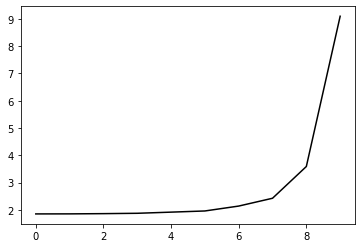

44000 1.0007173724459761
0.6291923364840947 1.454503919859813 0.0016402795765944017 -0.0008800583760879548
[1.88180267 1.88202809 1.88999213 1.90734217 1.93472806 2.00675059
 2.13516196 2.48925155 3.56912054 9.12649283]


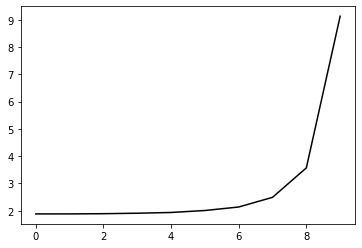

45100 1.0007391496299194
0.6291939494665463 1.4545039224016874 0.001642362750356779 -0.000941053249688897
[1.90762152 1.90511356 1.92279718 1.91238715 1.99937609 1.98198099
 2.20858171 2.47104994 3.62645937 9.09787002]


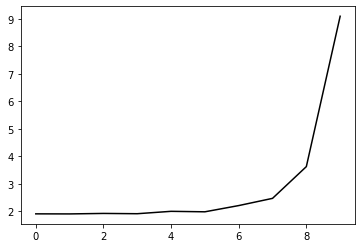

46200 1.000708798005628
0.629197093004635 1.4545039273053075 0.0016466710300973347 -0.0010513017986236409
[1.92862223 1.92994715 1.93762054 1.95363929 1.98471797 2.05171923
 2.18301019 2.53642568 3.60376011 9.14107858]


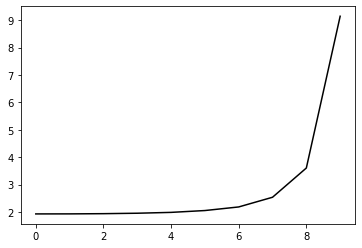

47300 1.0008518135860427
0.6292110966615649 1.4545039544701097 0.0016640623865726613 -0.0014600239568730582
[1.98298339 1.92435034 2.01591466 1.9312175  2.05073668 2.04822954
 2.23392912 2.53962482 3.65590848 9.10756193]


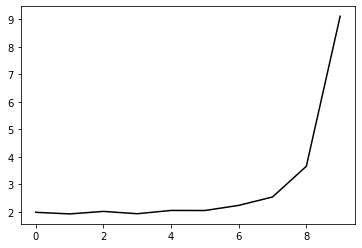

48400 1.0368334311052885
0.6077185075246528 1.5661561480471937 -0.13218395922289006 -0.03083833363049861
[1.31494348 1.9681778  2.0654755  2.06633518 2.05944153 2.10263211
 2.20960817 2.57523369 3.7353429  9.12783758]


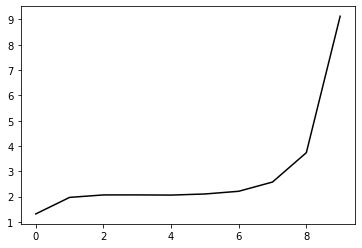

49500 1.1085574793079662
0.6533888101356204 1.4796408369974348 -0.11174650790195138 -0.02523288882452148
[1.21378055 1.95956559 2.16903251 2.19472539 2.18134153 2.18452066
 2.22539765 2.51678759 3.62297809 9.10574774]


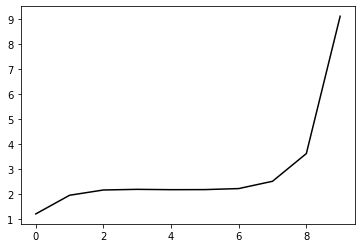

50600 0.44018582838033543
0.6478914187366936 1.4408917553209952 -0.0621476218881331 -0.03946207141322925
[1.24861508 1.71786464 1.96694431 1.98114343 1.9098199  1.84180817
 1.82754226 2.08236157 3.17401169 9.06821117]


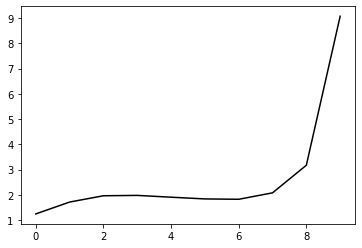

51700 0.4575876608231042
0.628197059267462 1.4238630048596541 -0.057222705586863355 -0.024326552529148227
[1.28887396 1.56723318 1.77718611 1.77696548 1.6715478  1.56087202
 1.50792795 1.73093106 2.80166628 9.0075965 ]


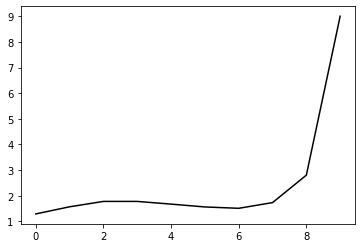

52800 0.4708066150673561
0.6374125302253276 1.4023234969335452 -0.04946046289575943 -0.033004308085266554
[1.3225894  1.53985039 1.75531695 1.78562087 1.69910689 1.59647557
 1.55022437 1.77713889 2.85246981 9.07004128]


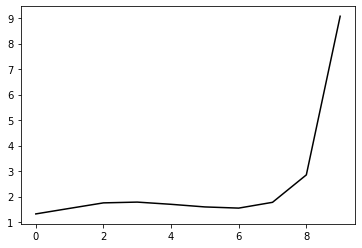

53900 0.4271490128245686
0.6293758230222026 1.3939537514429725 -0.05840577073625649 -0.028609572721743606
[1.25490726 1.52732537 1.70956111 1.72519713 1.61161468 1.46643716
 1.37191045 1.54847535 2.58030379 8.95383511]


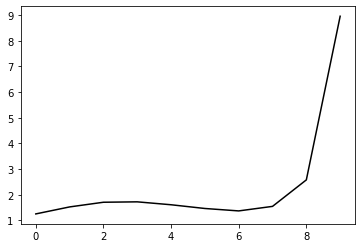

55000 0.3075356681467799
0.6248603052608971 1.3932652636343112 -0.06163456949054866 -0.030269943128713676
[1.25848627 1.49391328 1.66054213 1.67501203 1.55400868 1.38794986
 1.26494949 1.40821982 2.41143461 8.97276503]


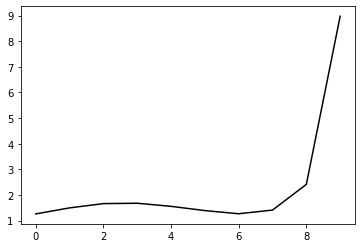

56100 0.3818249451800265
0.6305953436280609 1.3708059863671929 -0.059423699478151466 -0.03194984645570692
[1.22737824 1.52706935 1.69510531 1.72251129 1.61394858 1.45107326
 1.32662894 1.46389557 2.46097651 8.96278973]


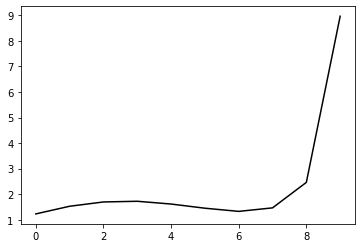

57200 0.2939558193693001
0.6333947902216173 1.3573035602551204 -0.055074931323964696 -0.03589397489330868
[1.22650822 1.51639516 1.69818091 1.74268515 1.65153706 1.49559127
 1.37269509 1.50750698 2.50356687 8.95324041]


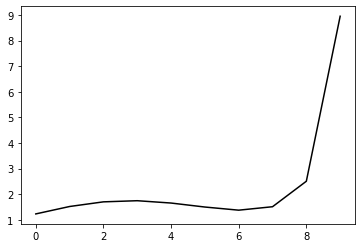

58300 0.442659450400178
0.6390207086108878 1.3504135163368567 -0.05943641642890425 -0.03349227720732497
[1.15295351 1.56037665 1.75785477 1.82252145 1.75107873 1.60235424
 1.47691248 1.60112641 2.58599356 8.95410383]


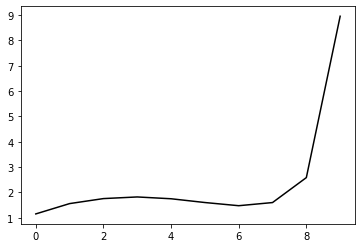

59400 0.3965799168020277
0.635817468302816 1.3191418342529908 -0.05081126429545295 -0.031790658691804356
[1.180152   1.46781351 1.64662783 1.70150377 1.61843612 1.44850703
 1.29540838 1.38979089 2.34993846 8.93797911]


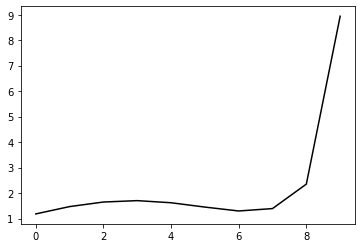

60500 0.4013389712737348
0.6428825268337872 1.3051727152086998 -0.05018834099605902 -0.036070695435634514
[1.1814719  1.46481493 1.67887292 1.76124425 1.70706721 1.55746824
 1.41623329 1.51692411 2.48382067 8.93624431]


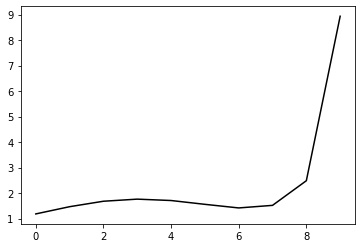

61600 0.46533773409102797
0.6380412934650496 1.295687679672841 -0.04679357857709335 -0.035128323933625284
[1.1761379  1.39641373 1.59604848 1.6769017  1.61855787 1.45561448
 1.29250761 1.36811289 2.31531742 8.95551115]


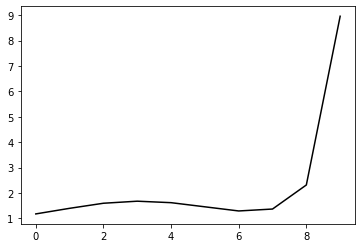

62700 0.4576335925500774
0.6430595493275649 1.291135988075629 -0.05112559226005487 -0.03413722638337471
[1.11437292 1.43473366 1.63746331 1.73522487 1.69752061 1.54454922
 1.37668043 1.43791709 2.37286545 8.93620308]


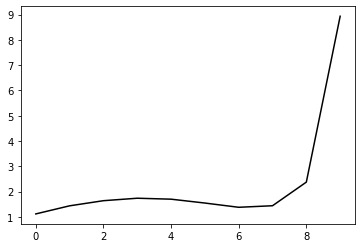

63800 0.39832777615751674
0.6340766183530933 1.2797466613236148 -0.045922777210416675 -0.03565405707399759
[1.14456763 1.34337232 1.5181346  1.59656927 1.538482   1.3556302
 1.14521652 1.15678381 2.04838034 8.92621148]


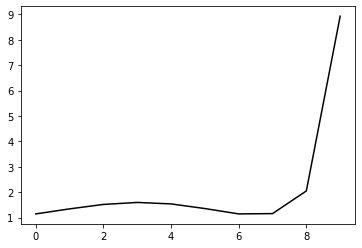

64900 0.41967830912253007
0.6389698291646789 1.2731017732665046 -0.049835709338510864 -0.03512939848489533
[1.12232009 1.37167015 1.55038464 1.64245781 1.60481273 1.4404164
 1.24022376 1.25398437 2.14695962 8.92393735]


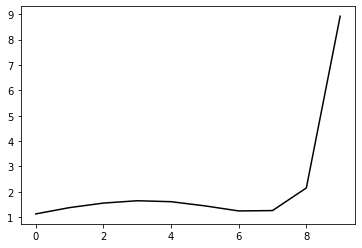

66000 0.3076945466505686
0.6375189765468791 1.2626180169492618 -0.04682621805571482 -0.036153465059293836
[1.11119134 1.34209788 1.52293394 1.61633964 1.5846237  1.42267992
 1.21379774 1.20845176 2.08202831 8.92867954]


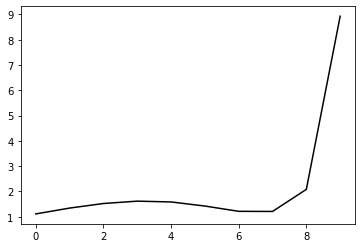

67100 0.3734474314984525
0.6390565565210888 1.258060022367803 -0.049646343849059964 -0.038223411788542626
[1.09721733 1.34109047 1.51743047 1.61368467 1.58806089 1.42984206
 1.2164382  1.19976045 2.06477073 8.89018762]


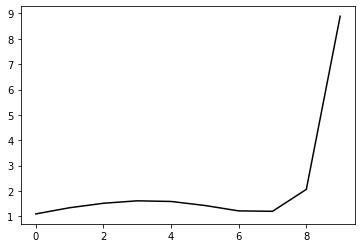

68200 0.2871545448916298
0.6399482406393842 1.246277679947203 -0.04820620152762753 -0.03895562370996834
[1.11014539 1.31878544 1.5008932  1.60405439 1.58991347 1.44204066
 1.23011062 1.20635109 2.06552874 8.9049241 ]


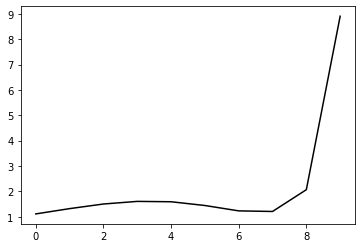

69300 0.44357647905442654
0.6419584205436847 1.2313755630396266 -0.04749234642041462 -0.03873303805880057
[1.10494434 1.31382561 1.49680056 1.60523829 1.59955746 1.4593087
 1.24733466 1.21513431 2.0667992  8.85821228]


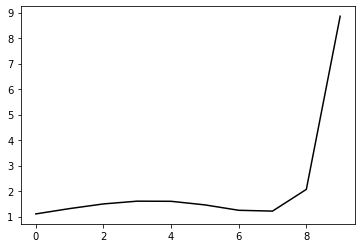

70400 0.36663502263296427
0.645848410343104 1.214205339368142 -0.050033106556738045 -0.0355711196647301
[1.03313754 1.33227563 1.51371184 1.61952503 1.61319813 1.47140158
 1.25020327 1.19995185 2.03399067 8.89386733]


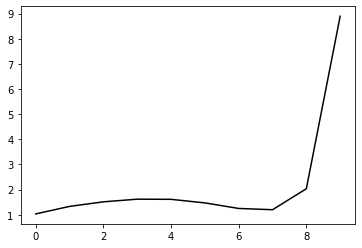

71500 0.3856663136648989
0.6424789744913892 1.1925187069543477 -0.04818813412566237 -0.034900061209024974
[1.07890813 1.25345852 1.41206157 1.50611502 1.48984394 1.33716378
 1.09944893 1.02627524 1.83988173 8.87403722]


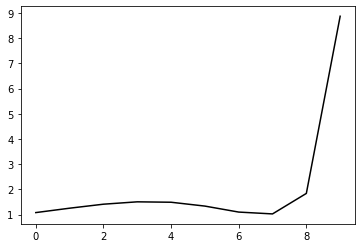

72600 0.41465841976054363
0.639741956379932 1.1878624464972103 -0.047043133523547116 -0.03536701271884256
[1.08639306 1.21516488 1.35573125 1.4444492  1.42765388 1.27431925
 1.02991452 0.9422352  1.7426025  8.87312773]


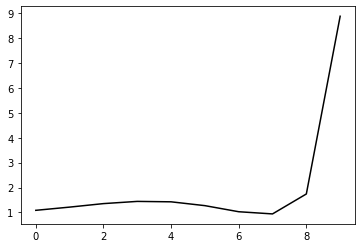

73700 0.3994315757779949
0.6394258374150542 1.1689612415264177 -0.05023048299024561 -0.03231939023631983
[1.03189772 1.23206718 1.34772923 1.41665715 1.38254447 1.20935549
 0.9368714  0.81101703 1.57280533 8.81583114]


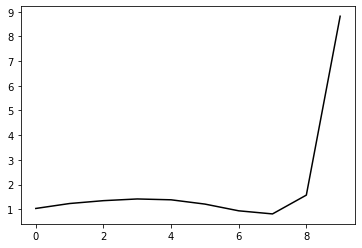

74800 0.370553668142785
0.6414474839931711 1.1528657306308598 -0.05100818533978848 -0.03432115844445655
[1.01755351 1.24774236 1.35458469 1.41848836 1.3851679  1.21348885
 0.93776912 0.80169549 1.55376365 8.84138788]


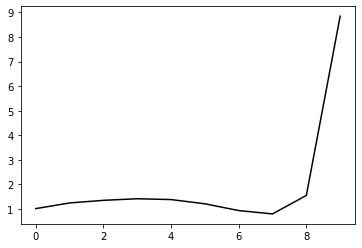

75900 0.3973365718054282
0.6390300297946861 1.1361568868950027 -0.04701557888937237 -0.0405950288344384
[1.06232062 1.22081846 1.3307506  1.39700878 1.37191886 1.21123866
 0.94198211 0.80368501 1.55285821 8.82829004]


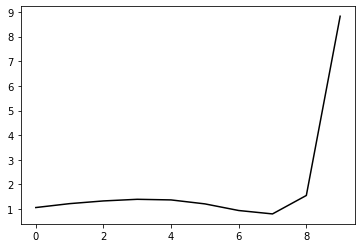

77000 0.30525789928785946
0.6441234387471652 1.1195637968534733 -0.04879428563272447 -0.03982557373202426
[1.04961295 1.2153959  1.34605008 1.41646683 1.39834039 1.24751552
 0.98339006 0.84017206 1.58238643 8.87966305]


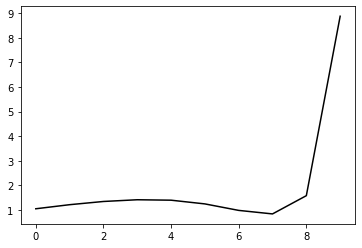

78100 0.40832410878554837
0.6444629476700054 1.1144947263362277 -0.04759524643725552 -0.043090388666252775
[1.06837378 1.18654317 1.33609716 1.41425804 1.40200239 1.25795973
 0.99478494 0.84078012 1.569565   8.84085637]


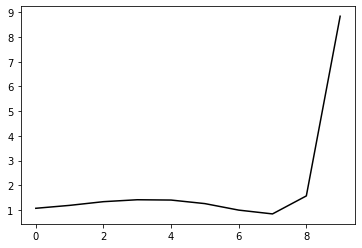

79200 0.3755219522920941
0.6468477107877275 1.108863870469423 -0.05107115487182975 -0.041333302337091475
[0.96006009 1.26337866 1.4107777  1.49046082 1.4763616  1.3301352
 1.05920201 0.88501542 1.5897267  8.83524282]


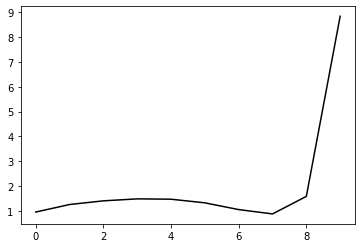

80300 0.4054882728030521
0.6446213577365667 1.0748094137071227 -0.04632965824676415 -0.04156184119325141
[1.02923818 1.16299636 1.29508968 1.3722268  1.35680974 1.21137068
 0.93959473 0.75711117 1.4541781  8.82578244]


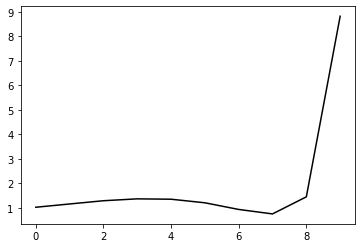

81400 0.43428509211913213
0.6469008148032994 1.0706760202397887 -0.046587284778396874 -0.043030579589446186
[1.00549991 1.18265482 1.32310549 1.41229063 1.41327542 1.28575335
 1.02779023 0.84647223 1.54039514 8.79417803]


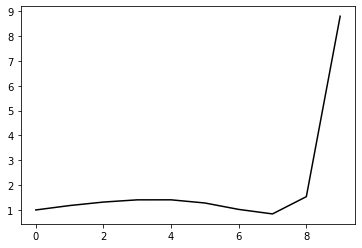

82500 0.3762497533388361
0.6444256079976204 1.0584570400742204 -0.04521899367927639 -0.041638428794504675
[0.99665517 1.14430434 1.26282367 1.34143713 1.33307417 1.19600638
 0.92428222 0.71795414 1.38446596 8.76828153]


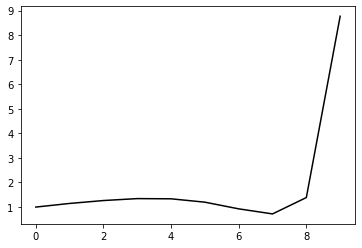

83600 0.4128881485258086
0.6474621922795015 1.0375886928019682 -0.04794721778268107 -0.038751440109150256
[0.97690287 1.14620169 1.26381673 1.33652138 1.32547411 1.18611876
 0.90869532 0.68672361 1.33369116 8.83888446]


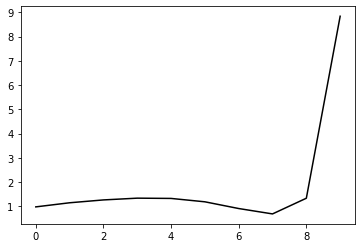

84700 0.45597989756272617
0.6481792801809247 1.0210219732811703 -0.048017480489645686 -0.04239427897453884
[0.95948607 1.1704528  1.28397418 1.35477637 1.34407069 1.20510867
 0.92460543 0.69080446 1.32245124 8.80944733]


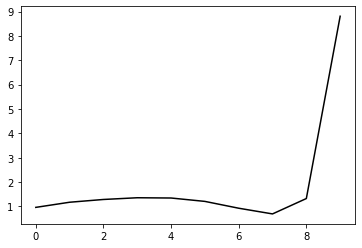

85800 0.3673169706371262
0.6483362010936994 1.0137322906045794 -0.046261620311770196 -0.04457726156541807
[0.98152282 1.14231655 1.27043479 1.35026966 1.35108558 1.22616259
 0.95750441 0.72629524 1.35685822 8.81350736]


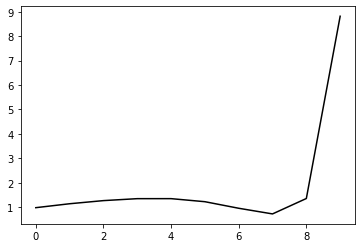

86900 0.4246406643572579
0.6467031681690143 0.99544951716632 -0.04557376521658014 -0.041204660313877865
[0.98530863 1.05733864 1.18372495 1.25556229 1.24732102 1.11523338
 0.83807885 0.59048371 1.20307257 8.739432  ]


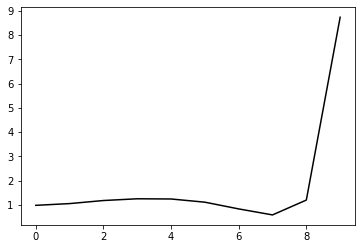

88000 0.3910672451398625
0.645196432123256 0.9701049818431207 -0.0428592546999756 -0.041456624310597524
[1.0352626  0.98305386 1.09686103 1.16685384 1.15804948 1.0270955
 0.7508289  0.49859071 1.10488746 8.75856603]


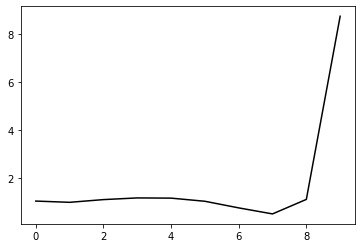

89100 0.43923492139227555
0.6439497650298401 0.9435421377661529 -0.04044018130288635 -0.045031355990077605
[1.0181134  1.02559735 1.12171779 1.18945345 1.181845   1.052521
 0.77609791 0.51644632 1.11204085 8.77538107]


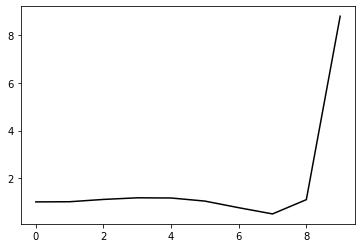

90200 0.39368534641262826
0.6424196311905761 0.9098999776239891 -0.03868696995807779 -0.045032570493124265
[0.99710926 1.01393108 1.09700866 1.15133083 1.13334596 0.99428006
 0.70627451 0.42762253 1.0010165  8.73972503]


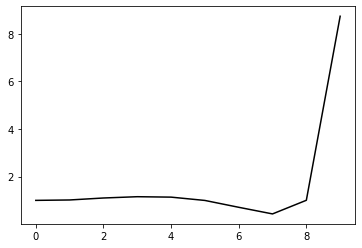

91300 0.4348830602073514
0.6529732904064153 0.9037848462508984 -0.04471583297422962 -0.04701663757463757
[0.96110552 1.09905225 1.22108388 1.29441745 1.29825492 1.18245839
 0.9146801  0.64635668 1.22297159 8.78244487]


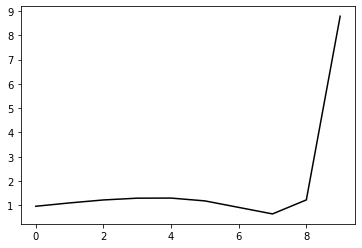

92400 0.6219029439781382
0.6570991699488113 0.8830163226437887 -0.05030497668639837 -0.04605380845042883
[0.82075534 1.13635259 1.27147107 1.33302646 1.31728923 1.1835363
 0.89838035 0.60608973 1.15622216 8.80468282]


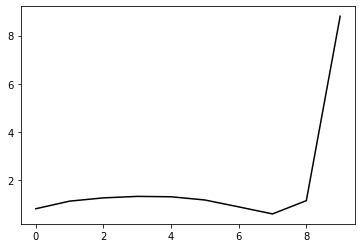

93500 0.37849873328931505
0.6527022792596388 0.8615671285385206 -0.04497984594854535 -0.048100119348096645
[0.85605121 1.07760855 1.19578851 1.26009871 1.24453103 1.11204738
 0.82941543 0.5355887  1.08248691 8.75541769]


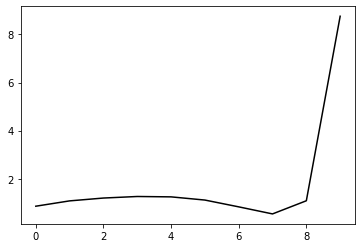

94600 0.4074495762487966
0.6453472048902086 0.8418248086310705 -0.04546779596681384 -0.042305902650399504
[0.89721006 0.96412095 1.05557713 1.1067229  1.07808386 0.93201097
 0.63546247 0.32304302 0.8484572  8.75446313]


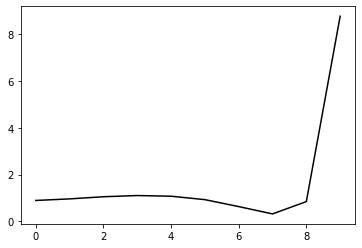

95700 0.431178212852473
0.6442519012196889 0.8264715218734345 -0.04603453858630074 -0.0433955051108849
[0.89887969 0.98866814 1.05581244 1.10369503 1.07732997 0.93310392
 0.63731712 0.3207002  0.83840904 8.72262102]


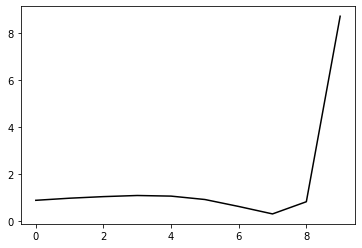

96800 0.3185224667390423
0.6463625252943296 0.8002105088331365 -0.047370908310910786 -0.04374549009572737
[0.86187135 1.00132108 1.06758396 1.1041123  1.07271529 0.92503446
 0.62551856 0.30000592 0.80558761 8.75829814]


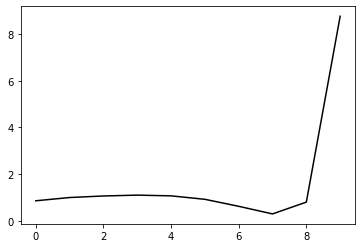

97900 0.4282834742344748
0.6502281345335574 0.7927696323904382 -0.04686950853452577 -0.04832019709766371
[0.82799186 1.05962718 1.14346644 1.18952372 1.16952364 1.03626573
 0.75114803 0.43361618 0.9421275  8.70598925]


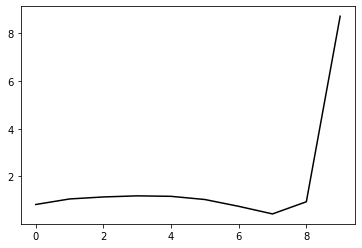

99000 0.30237789149909977
0.6459272800672636 0.7902902425597393 -0.047971645619685165 -0.04991948383395473
[0.89373876 0.97348173 1.0487043  1.08816021 1.06142662 0.9231897
 0.63328751 0.30583159 0.80087072 8.73885853]


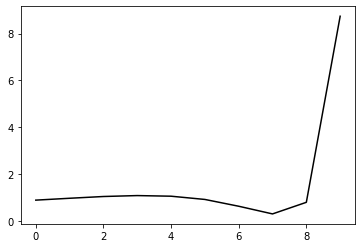

100100 0.3832237286822153
0.6455581173714865 0.7786171350229609 -0.0472141052466515 -0.05152261271028236
[0.88286865 0.97268696 1.04398954 1.08222733 1.05494171 0.91697641
 0.62657373 0.29319324 0.77764432 8.72101993]


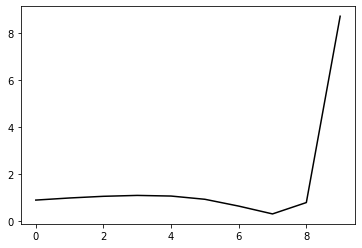

101200 0.2910080271871518
0.6387126048816973 0.754847407408111 -0.0448537968482067 -0.04984667164660872
[0.89977111 0.88089862 0.93238243 0.95510471 0.91342397 0.76268516
 0.46026582 0.11190838 0.57904842 8.74319618]


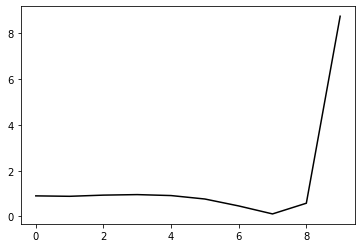

102300 0.4027855723090575
0.64237069895971 0.7081565408672961 -0.04591772144176184 -0.04967936173528277
[0.9073216  0.91931703 0.95681915 0.98076103 0.94418241 0.79982178
 0.50397273 0.15889623 0.62598041 8.71982345]


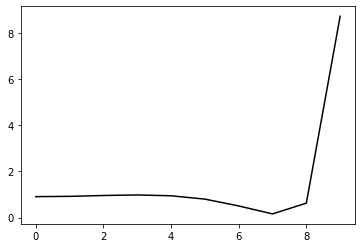

103400 0.3843210587295403
0.6496834189388284 0.6892875144161449 -0.04829234441437461 -0.0519149560400518
[0.850711   0.99872005 1.05045277 1.07597808 1.04507916 0.9082433
 0.61988004 0.27784464 0.74289502 8.71358091]


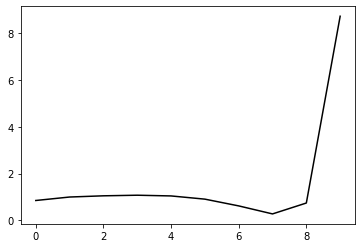

104500 0.37315761048574064
0.6498363658175833 0.6605028538937199 -0.04784820680950566 -0.05040702034507612
[0.84021594 0.9769608  1.02648834 1.04513476 1.00728189 0.86601628
 0.57424226 0.22484378 0.67826949 8.70839912]


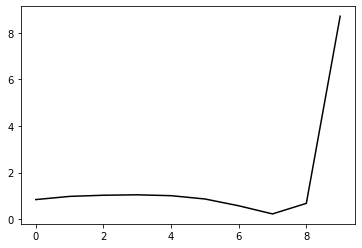

105600 0.4328504984841832
0.6481058444345458 0.6359149990835482 -0.04485931069579968 -0.054439451191452645
[0.85457848 0.93213992 0.98729502 1.00055474 0.95579271 0.80948223
 0.51383392 0.15716912 0.59891799 8.65886341]


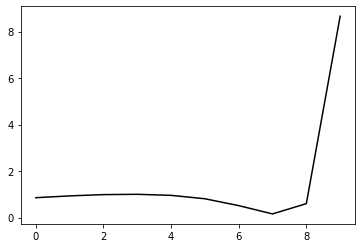

106700 0.40231366843783384
0.6545917234561719 0.6258872903321783 -0.05000745135700223 -0.05222072773383633
[0.7869115  0.97769279 1.04838998 1.06631749 1.02325643 0.87943672
 0.58679536 0.2288937  0.66371353 8.70196847]


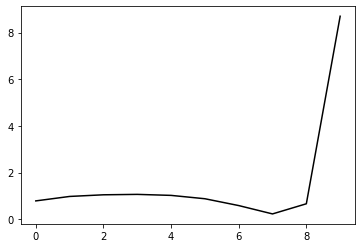

107800 0.42439389833172175
0.6415009082973591 0.5923718062593093 -0.044565554392190364 -0.05058602350927705
[ 0.93573775  0.7837227   0.82221666  0.82925679  0.77444586  0.6195465
  0.31702279 -0.05233505  0.3688942   8.67593155]


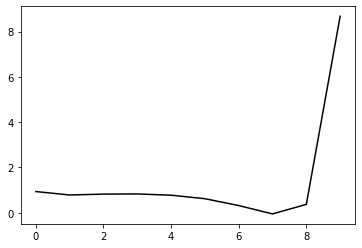

108900 0.40241724350418084
0.6424006075183761 0.5608530748686409 -0.04800635208287329 -0.04836546863127047
[ 0.84364431  0.88597182  0.89947686  0.89791159  0.83758991  0.67687474
  0.36828371 -0.01025929  0.39749812  8.64012712]


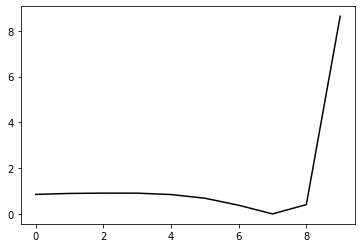

110000 0.3087785897322972
0.6441542096607052 0.5450432635813403 -0.046857680551309 -0.051803844595646326
[0.82564647 0.90039885 0.92795973 0.9256486  0.86740801 0.7100962
 0.4056288  0.02894138 0.43523388 8.70745896]


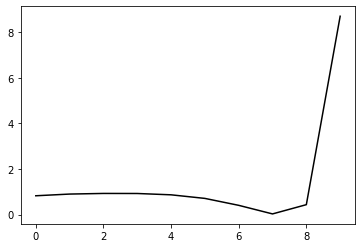

111100 0.4939140326710987
0.6343063544154249 0.48913994788443194 -0.03913674010343386 -0.057593482895940164
[ 0.93130788  0.77980622  0.79957848  0.79211963  0.72964714  0.56966211
  0.26374994 -0.1154259   0.28661007  8.64737954]


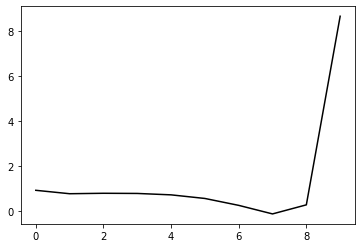

112200 0.2628457627120022
0.644208230318984 0.46091166391792093 -0.04896227230729498 -0.056544556505733624
[0.85728368 0.91012063 0.92867612 0.92499731 0.86730537 0.7111882
 0.4069494  0.02407062 0.41563243 8.70302795]


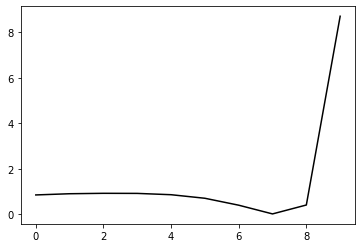

113300 0.40710538035776794
0.6467531835518271 0.444246599088708 -0.04891190472093947 -0.05811967426048615
[0.86295674 0.89624063 0.93432952 0.93524631 0.88215053 0.73258597
 0.43571903 0.05730571 0.44903788 8.66991697]


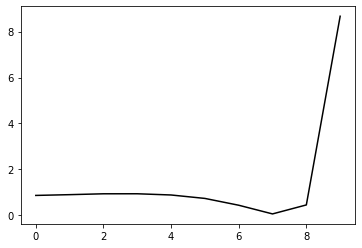

114400 0.36210965068595347
0.6515302360659684 0.423215049276774 -0.05196234862062918 -0.0561736101092893
[0.80125964 0.95143119 1.00609381 1.01019405 0.95492475 0.80158665
 0.49902806 0.10884031 0.48161245 8.68150067]


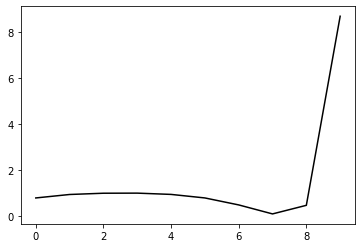

115500 0.371219419060881
0.6510230056691972 0.4215145839063223 -0.05138569787833108 -0.059098640242857374
[0.81604197 0.95146157 1.00683315 1.01960014 0.97171892 0.82629551
 0.53268417 0.14763744 0.51831244 8.70171186]


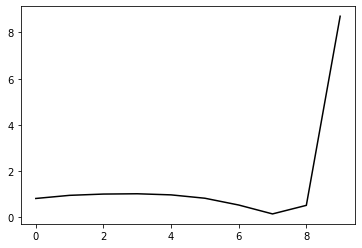

116600 0.4917757808815755
0.6389920270322487 0.4055549174502372 -0.047059150012898475 -0.05904471337491421
[ 0.90365714  0.81866415  0.84608086  0.84509264  0.78205226  0.62034086
  0.31052042 -0.09303274  0.25536342  8.6558737 ]


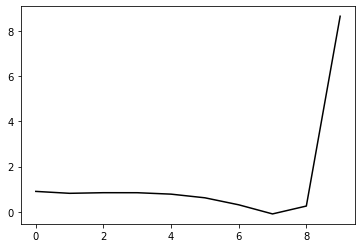

117700 0.49404004593937
0.6432927635789273 0.3934204110284092 -0.04803330219620213 -0.06307548147443076
[8.83906868e-01 8.75347389e-01 9.09851870e-01 9.14021929e-01
 8.58943752e-01 7.05552559e-01 4.04447929e-01 7.32667922e-03
 3.57175036e-01 8.71992489e+00]


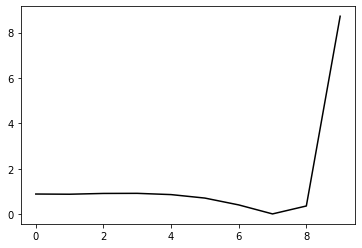

118800 0.3565667109222332
0.6454500276639803 0.37856727441106675 -0.05179173280660727 -0.060167705011331944
[0.82100731 0.9224781  0.95303563 0.9511767  0.8900484  0.72995558
 0.42131202 0.01296944 0.34468486 8.64723415]


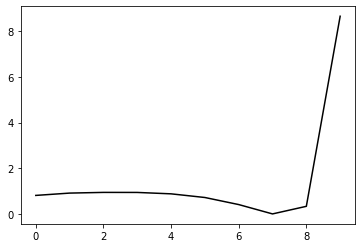

119900 0.4269530422240687
0.6454873382605251 0.3663894806037846 -0.05650162764860028 -0.056811706083318946
[ 0.80152273  0.89764819  0.92235637  0.90819591  0.83247936  0.65683051
  0.33235618 -0.09353238  0.21723986  8.66483766]


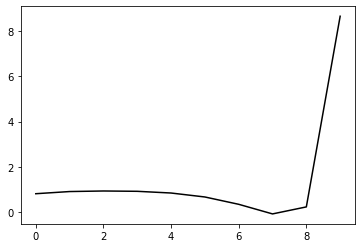

121000 0.32140021297382637
0.6377471411933666 0.31041841373274515 -0.05504410348959555 -0.055049950917251976
[ 0.86579475  0.80128761  0.80411993  0.77916506  0.69397314  0.50999948
  0.17891729 -0.25312033  0.05081542  8.6258309 ]


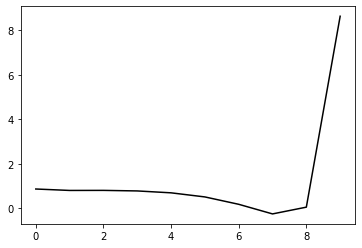

122100 0.3729663865507103
0.6396206066316165 0.2877183405369256 -0.054716593915841084 -0.0573784823173185
[ 0.82570233  0.86696943  0.86388437  0.83732631  0.75289916  0.56967674
  0.23891617 -0.19508797  0.10251355  8.64874395]


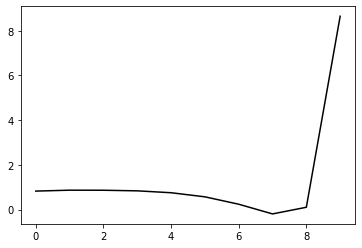

123200 0.26634914795650955
0.6407784776163812 0.2511908770092198 -0.05397964765129305 -0.058651147754681124
[ 0.84410634  0.86533255  0.8682356   0.84340841  0.76309245  0.58518986
  0.26026156 -0.16916786  0.12984621  8.63796375]


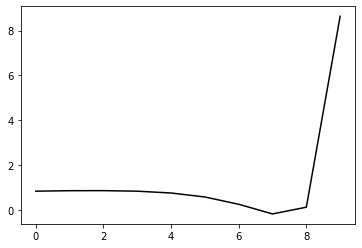

124300 0.3911293052657527
0.6468402747774864 0.2384476466519557 -0.05505520584609784 -0.06159576271061612
[ 0.81447338  0.89991598  0.93541015  0.91989516  0.84654899  0.67659382
  0.35963099 -0.0641433   0.23582     8.62812109]


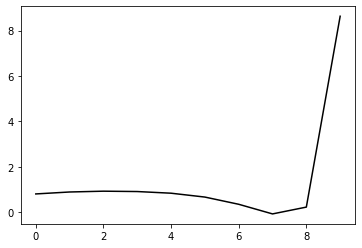

125400 0.6246075264618475
0.6494583682301229 0.21823505464803525 -0.05957243054326841 -0.05724727868282045
[ 0.73244976  0.93883144  0.96678975  0.94371725  0.85743126  0.67278595
  0.34026059 -0.10195656  0.17384222  8.61551671]


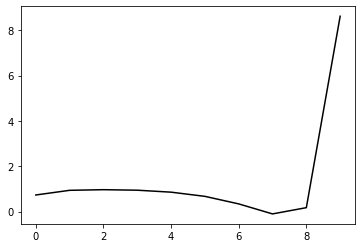

126500 0.4499381997208183
0.6417573515937872 0.1948054563891452 -0.053077179050506844 -0.06582263942905989
[ 0.91383116  0.78631918  0.80322086  0.7843692   0.7043659   0.52773181
  0.20612207 -0.22358454  0.06446013  8.61383586]


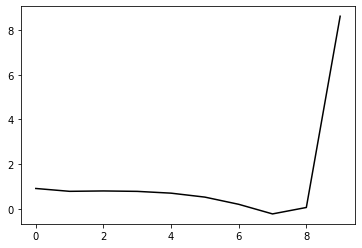

127600 0.47566099559600644
0.6402184126599775 0.18935728480127237 -0.05338798704972295 -0.06799703103826643
[ 0.86795048  0.83572345  0.84533639  0.82124202  0.73638607  0.5535927
  0.22459105 -0.21563393  0.0557185   8.62607041]


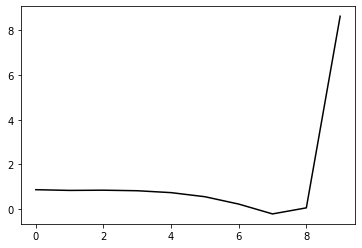

128700 0.47247572255560105
0.639773643752025 0.18058290276671463 -0.053939753405250666 -0.06813560099590299
[ 0.84969717  0.84219992  0.8522876   0.82442188  0.73526123  0.54772073
  0.2137008  -0.23330216  0.02659671  8.63742862]


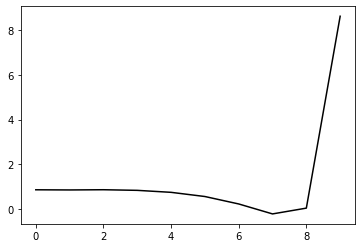

129800 0.35796357605644297
0.6400526851640597 0.17644935277931714 -0.05786606638820504 -0.06712047952116759
[ 8.20547912e-01  8.81691597e-01  8.85292046e-01  8.53108156e-01
  7.58115071e-01  5.62584806e-01  2.17878506e-01 -2.44506383e-01
 -7.77759614e-03  8.59456366e+00]


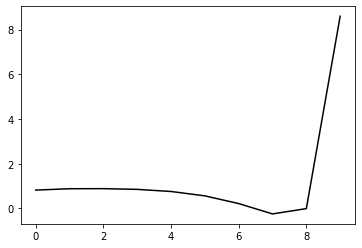

130900 0.4077809532667996
0.639901476438034 0.15804463082630432 -0.0589972631326575 -0.06598937756664904
[ 0.83991131  0.8619977   0.86834792  0.83582659  0.74068549  0.54485858
  0.19934391 -0.2664356  -0.04047392  8.61071395]


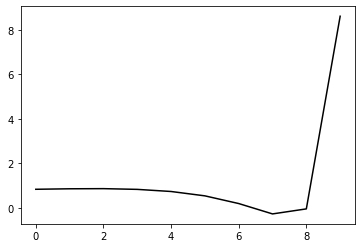

132000 0.3019971427820392
0.6415597133307357 0.14443774797235465 -0.05878004357930044 -0.06763777950099005
[ 8.37131605e-01  8.73017040e-01  8.89694687e-01  8.62522711e-01
  7.72557064e-01  5.82413263e-01  2.42788004e-01 -2.18599758e-01
  6.64715091e-03  8.64699199e+00]


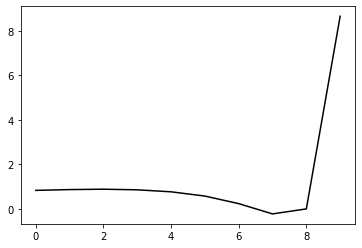

133100 0.3965815156041816
0.6386019343138539 0.12031731369877227 -0.06070776690958621 -0.06248348331058605
[ 0.79611042  0.85455391  0.85548385  0.81791717  0.71477439  0.51020781
  0.15514952 -0.32408823 -0.12209874  8.58476484]


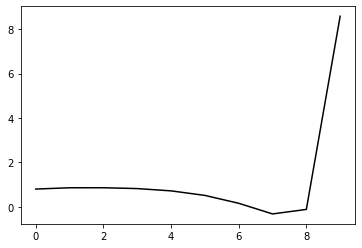

134200 0.26733831268825914
0.6353997029173333 0.09118355631828909 -0.05978853721939022 -0.06243988077131245
[ 0.84411031  0.81680223  0.79995306  0.75797314  0.65283709  0.44602867
  0.08854934 -0.39417386 -0.19855043  8.61616967]


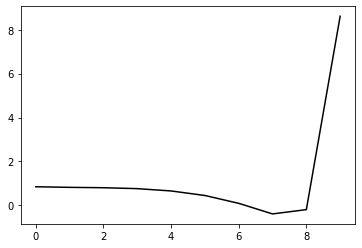

135300 0.4155517916013306
0.6336039058708001 0.039263480042235316 -0.05869748750417828 -0.06400231247336248
[ 0.83590306  0.83412227  0.8067135   0.76018227  0.65354052  0.44522028
  0.0856656  -0.40077017 -0.21262814  8.63194886]


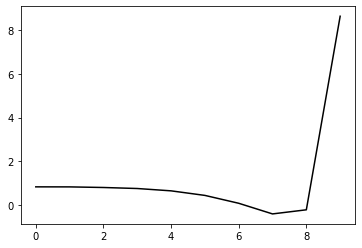

136400 0.38075080578988035
0.6402697552368909 0.026854694650477885 -0.059759236917016026 -0.06946872056733329
[ 0.80810641  0.9260765   0.92298365  0.88569521  0.79200954  0.59778365
  0.252156   -0.22161643 -0.02392923  8.61645552]


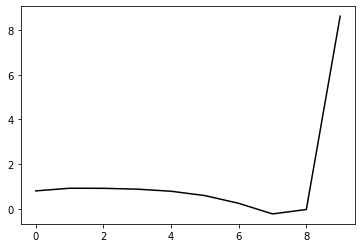

137500 0.38889315150763054
0.6293057744949986 -0.0123447422203625 -0.059422581994043704 -0.06303454045619265
[ 0.83967916  0.81822723  0.79693277  0.74420625  0.63335328  0.42267946
  0.06062534 -0.43062715 -0.25365051  8.57767341]


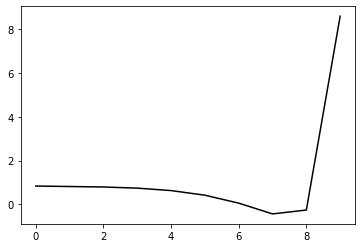

138600 0.388648599630641
0.6295532103413498 -0.0603105319187935 -0.06165014389774874 -0.06070109071299303
[ 0.84212174  0.80890563  0.77881458  0.72105789  0.606326    0.39213953
  0.02641139 -0.46958495 -0.29995392  8.57871864]


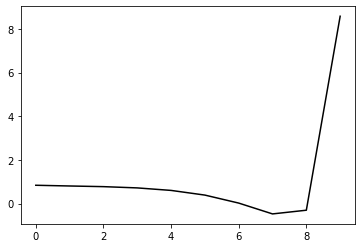

139700 0.4610098894904176
0.6284486312602952 -0.10113707738891875 -0.05916085305328527 -0.0670788787888005
[ 0.84720382  0.83607308  0.80709046  0.75023528  0.63792568  0.42699931
  0.06477251 -0.42826436 -0.25752635  8.59409452]


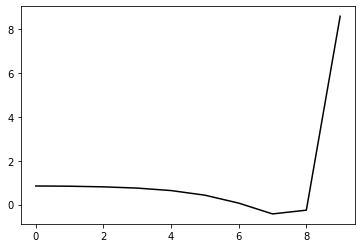

140800 0.3614669611918386
0.6353821426667516 -0.09976960665353252 -0.06147223837160038 -0.06986221024296514
[ 0.84737751  0.84435962  0.83683348  0.78468458  0.67725832  0.4725698
  0.11719469 -0.36938236 -0.19413789  8.56966201]


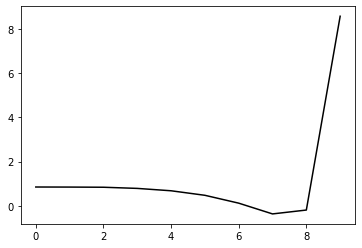

141900 0.4139311271214345
0.6285333223673433 -0.13852712221898178 -0.06081927203136209 -0.06717589099820322
[ 0.85346383  0.81157303  0.79432574  0.73981037  0.62634023  0.41577618
  0.05458736 -0.43901237 -0.27409215  8.58099975]


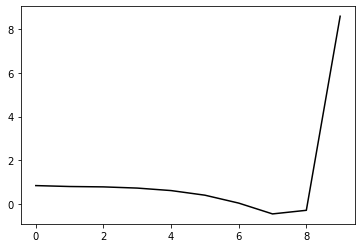

143000 0.30871739974641893
0.625744779352979 -0.1923121825414071 -0.06300965918851742 -0.06379898256351922
[ 8.48993576e-01  7.83768964e-01  7.60705461e-01  7.03035731e-01
  5.85318983e-01  3.70293789e-01  4.70741941e-03 -4.94474319e-01
 -3.38367671e-01  8.51046633e+00]


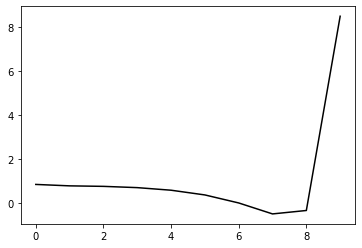

144100 0.3622618577635682
0.6234979639244047 -0.25222274239273634 -0.06476193024906773 -0.06543936182293769
[ 8.32819458e-01  8.04377848e-01  7.77560099e-01  7.16815107e-01
  5.95667772e-01  3.76322184e-01  5.72918441e-03 -5.00213662e-01
 -3.54654987e-01  8.55997409e+00]


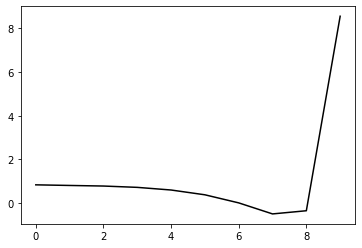

145200 0.3218008548891787
0.6123779069270598 -0.3245806703543866 -0.06442948109339507 -0.06444772043864343
[ 0.92071612  0.69643132  0.64793981  0.57838295  0.44878744  0.21985551
 -0.16146897 -0.6802804  -0.55156286  8.57157567]


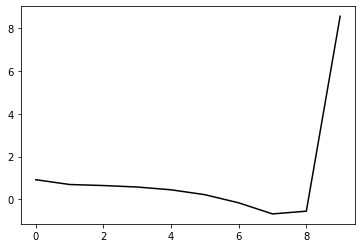

146300 0.4034139595331036
0.606551803795704 -0.36536815670711015 -0.06506245542992677 -0.0696662601127007
[ 0.87391692  0.75499961  0.6816612   0.60310358  0.4677091   0.23235163
 -0.15640321 -0.68453339 -0.56871112  8.53077604]


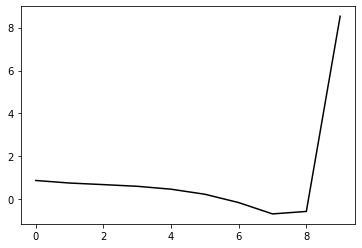

147400 0.4381967748867834
0.6079844719464434 -0.39532942880018074 -0.06711042893902625 -0.07340493546185482
[ 0.87439207  0.80361381  0.72919094  0.65110508  0.52197531  0.294516
 -0.08545562 -0.60444664 -0.48027884  8.55308734]


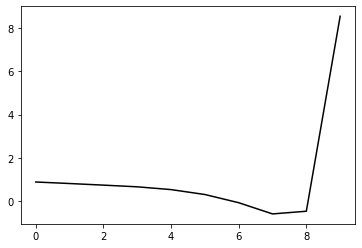

148500 0.3945229879344543
0.6075060888223972 -0.4254212319124914 -0.07216833338437573 -0.07249627012775624
[ 0.84091403  0.84102082  0.76874183  0.683603    0.55082711  0.32106994
 -0.06138835 -0.58427776 -0.46770679  8.51446255]


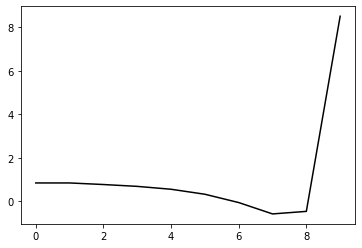

149600 0.3175439484338179
0.5976823289630728 -0.49699426819335984 -0.07995217031888163 -0.0692793137409551
[ 0.84128843  0.77970464  0.7055629   0.60551281  0.45468068  0.20407546
 -0.20374127 -0.75767793 -0.67834189  8.55173293]


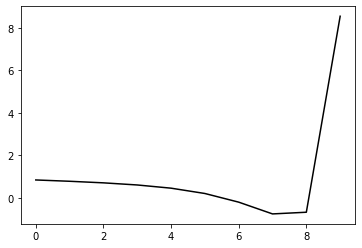

150700 0.29369052847980476
0.587326450933228 -0.5342882801784682 -0.08058058615323725 -0.07405085829106933
[ 0.84750211  0.77940851  0.68871545  0.58402051  0.42907244  0.17450069
 -0.23832143 -0.7996697  -0.73242165  8.53541908]


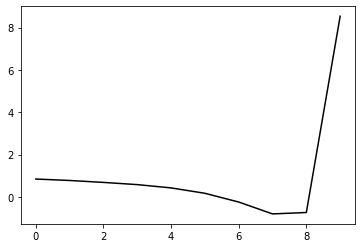

151800 0.27300697704860616
0.5691575209544818 -0.6178745485817594 -0.08885942761841326 -0.0775233967617237
[ 0.92313239  0.69839804  0.60151353  0.49436834  0.33763339  0.08090733
 -0.33541211 -0.90221351 -0.84195526  8.48666074]


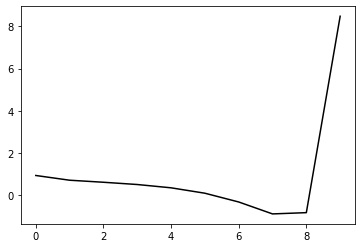

152900 0.2683517564942621
0.5538211156511126 -0.6710487857990144 -0.0957131689965843 -0.08383730775160429
[ 0.9317193   0.72144563  0.61119291  0.50753882  0.35943517  0.11460077
 -0.28678704 -0.83554107 -0.75529855  8.50680224]


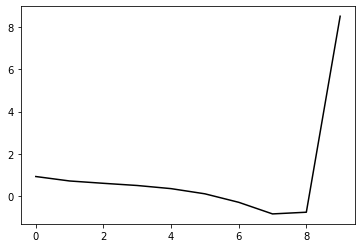

154000 0.21367648323363653
0.5448437145653545 -0.7031037327078878 -0.1024009726026772 -0.08811386876382296
[ 0.96503566  0.74372913  0.63591517  0.54050625  0.40845066  0.18380453
 -0.19528832 -0.72160363 -0.62172291  8.5718823 ]


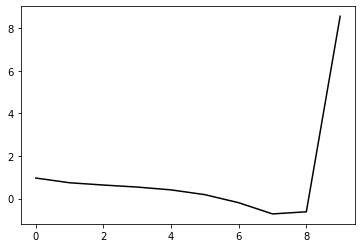

155100 0.2017426564634332
0.5306087786978058 -0.7275982957608944 -0.10814230082620199 -0.09565336548145957
[ 1.00280499  0.78923047  0.670662    0.57762404  0.45685513  0.24840625
 -0.11129146 -0.61552363 -0.49215487  8.55650537]


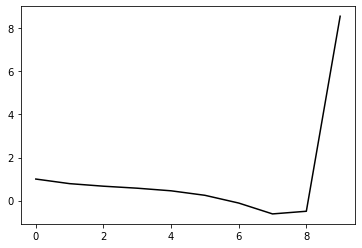

156200 0.12364419459410542
0.5316631433837226 -0.7308132537600469 -0.10897959008514917 -0.10073129345278838
[ 9.95563073e-01  8.78805211e-01  7.59824048e-01  6.61623777e-01
  5.44582147e-01  3.44992933e-01 -5.35450126e-03 -5.02490143e-01
 -3.76021003e-01  8.57392189e+00]


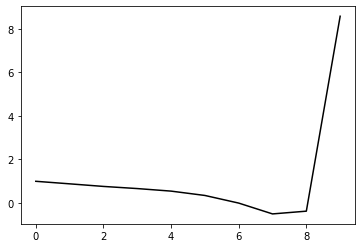

157300 0.2613267532820367
0.5214093860746872 -0.7374224607258802 -0.11048832804346406 -0.1018848348873257
[ 1.03466674  0.79439376  0.65863235  0.53569725  0.4014257   0.19916713
 -0.14209838 -0.62358993 -0.48005273  8.55987279]


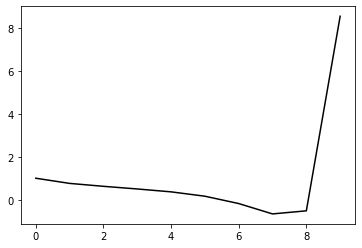

158400 0.21641927906349498
0.5276735660222734 -0.7410430615216387 -0.11409275040779215 -0.10235255162108493
[ 9.23529829e-01  9.62999586e-01  8.38776774e-01  7.07590086e-01
  5.63918622e-01  3.55372271e-01  8.42476590e-03 -4.81123773e-01
 -3.50191990e-01  8.59158956e+00]


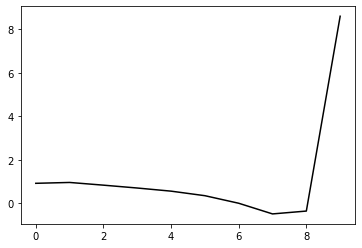

159500 0.27950728652777285
0.5207631950821519 -0.748504513762503 -0.11762204485038752 -0.10302647764100498
[ 0.96898052  0.94289816  0.83602225  0.71616336  0.58077144  0.38485697
  0.05217047 -0.42722378 -0.29448364  8.55993832]


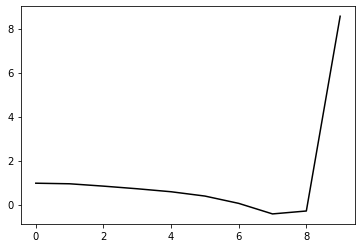

160600 0.20402283430448845
0.5190883990652918 -0.7443591106492916 -0.11538237579971725 -0.10458952555084125
[ 1.03272339  0.91122871  0.81866191  0.70395433  0.56848971  0.37524364
  0.04859179 -0.42673212 -0.29754457  8.59574679]


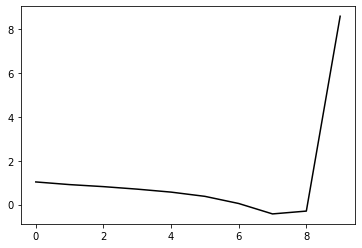

161700 0.22032735620945254
0.5233369694685511 -0.7396738304531396 -0.11423483747844583 -0.10524732073972613
[ 1.01459749  1.00213984  0.93362553  0.83013339  0.69896317  0.50733728
  0.18169707 -0.29721945 -0.18038602  8.5767793 ]


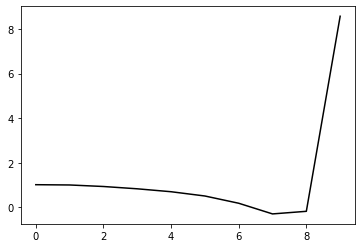

162800 0.23250985227466014
0.5132706041579993 -0.7485012996695799 -0.11859349209892238 -0.10388869764313789
[ 1.06211711  0.8503351   0.80364604  0.7149537   0.59031512  0.40514756
  0.08860934 -0.38235785 -0.26349139  8.60531732]


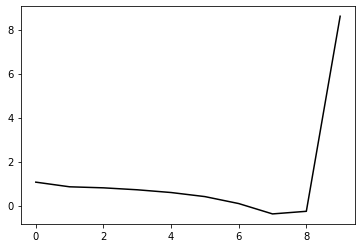

163900 0.2141052657637452
0.5144432863568555 -0.7494833481188261 -0.11972499155004702 -0.10504354526322537
[ 1.00401777  0.98374519  0.92667451  0.84538122  0.72467954  0.54000188
  0.22410301 -0.24822725 -0.13653056  8.56953977]


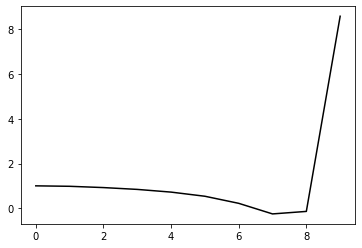

165000 0.22048671542815781
0.5131803165885885 -0.7417659458906046 -0.11666635060043289 -0.10319004716930756
[ 1.0696503   0.92101932  0.86392032  0.77873404  0.6539275   0.46319572
  0.14233019 -0.33629099 -0.23740662  8.57570819]


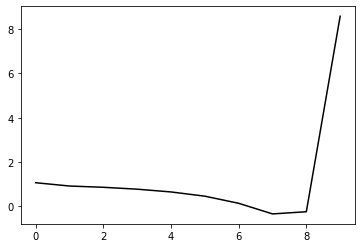

166100 0.18539463511576995
0.5128963344222589 -0.7367000461095767 -0.1144379689565785 -0.103829713470027
[ 1.06003435  0.95322501  0.90514652  0.82566337  0.70488918  0.5154137
  0.19494598 -0.28654501 -0.20082366  8.58180964]


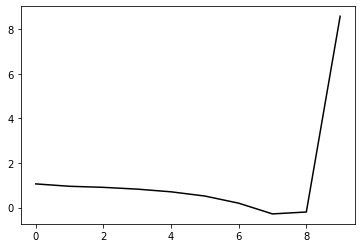

167200 0.16001628227749637
0.49698782108827116 -0.7472362755829238 -0.11993130294298653 -0.09949509758372002
[ 1.0249569   0.92407489  0.86010958  0.77178307  0.63852427  0.43297676
  0.09468523 -0.40760179 -0.35134119  8.58963324]


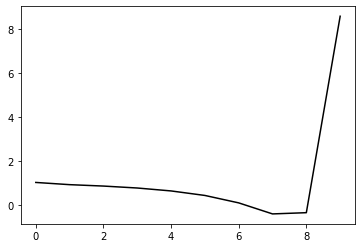

168300 0.38147261179336156
0.48959013906164844 -0.7524294366050648 -0.12515267925470636 -0.09428309220712688
[ 1.00594182  0.94973367  0.86312289  0.76248391  0.61763636  0.3979884
  0.044742   -0.47354825 -0.43794293  8.51571834]


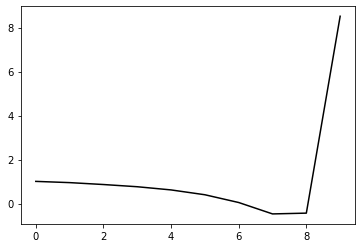

169400 0.2111346581022314
0.49802427850275416 -0.7354149160496124 -0.11500173264043959 -0.10141284009043547
[ 1.04845028  1.01900745  0.92240213  0.81812583  0.67484537  0.45722888
  0.1064449  -0.40990076 -0.3769556   8.58028726]


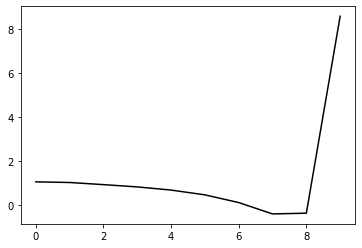

170500 0.2378007535678315
0.5109232952190509 -0.7309436882109769 -0.11572706812397655 -0.1004376684416867
[ 1.04878552  1.06028146  1.02011855  0.92739014  0.79168459  0.58064803
  0.23494451 -0.2786715  -0.24961164  8.58711679]


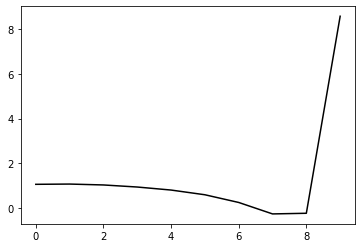

171600 0.20846002089327206
0.503952777757856 -0.7316867857584304 -0.11613656546715088 -0.09985236265914722
[ 1.07024741  1.00949174  0.98500045  0.90282967  0.76869907  0.55718846
  0.20973629 -0.30792592 -0.29041335  8.60516599]


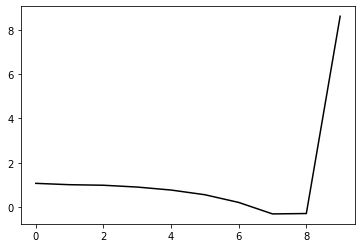

172700 0.21503367592371075
0.5036858333135733 -0.7290285111170566 -0.11488297750721015 -0.10148136170192484
[ 1.07593591  1.05829708  1.036378    0.97035151  0.84909271  0.64822574
  0.3108593  -0.19828464 -0.17940849  8.57224763]


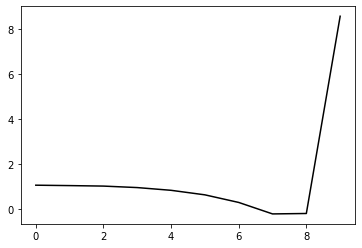

173800 0.1998664464491605
0.49092350560454057 -0.7407595344574714 -0.12256128593323902 -0.09703484080581547
[ 1.04963076  0.92460241  0.9026226   0.83775739  0.71513011  0.51117034
  0.17088296 -0.34139051 -0.33089627  8.60353598]


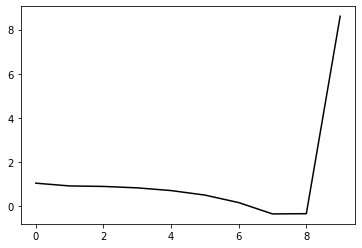

174900 0.21737645960502905
0.49817759829695774 -0.7330296191804537 -0.11961973132353584 -0.09719609090122285
[ 1.0028132   1.09074017  1.0456419   0.9771542   0.8542681   0.64585245
  0.29825768 -0.22408605 -0.23083413  8.58978827]


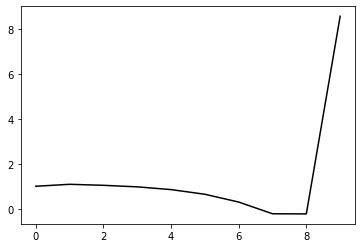

176000 0.25548651664343475
0.49015415670676643 -0.7288396286645976 -0.1160639319313469 -0.0987481948601503
[ 1.12511186  0.91025127  0.86455305  0.78617604  0.6572647   0.44384616
  0.09262867 -0.43116102 -0.4409552   8.59511035]


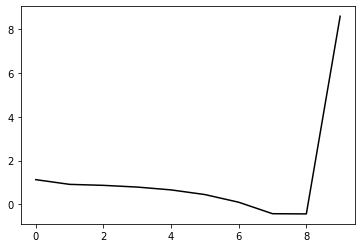

177100 0.1885458887374692
0.48824660097848493 -0.7284402138759858 -0.1167476995648907 -0.09928035486130621
[ 1.0968102   1.03703281  0.98147615  0.89917259  0.76552964  0.54370132
  0.18064921 -0.3571019  -0.38521308  8.55112929]


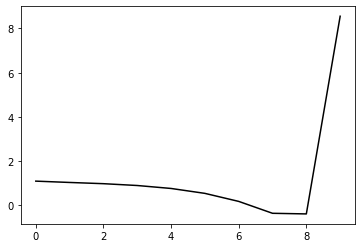

178200 0.13342980930269324
0.4913147567252276 -0.7251014556183935 -0.11554929161900117 -0.10055049406394864
[ 1.06155678  1.07843551  1.03970151  0.95546558  0.8169578   0.59008796
  0.22128459 -0.32266879 -0.36145978  8.60092224]


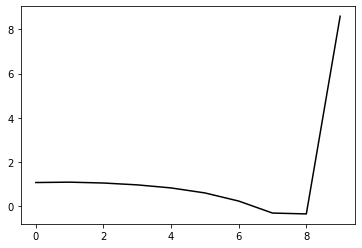

179300 0.263315218399948
0.4907017646084899 -0.7232435822596135 -0.1150563665483442 -0.10113957535183661
[ 1.08367424  1.07489003  1.064584    0.99972036  0.873061    0.65530242
  0.29226306 -0.24973314 -0.29494588  8.55442966]


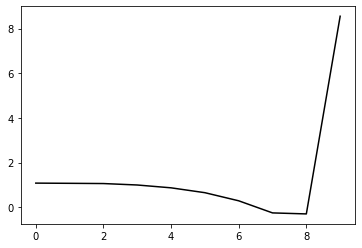

180400 0.27958064703086555
0.4743112741219396 -0.7298146833556804 -0.12012864516281888 -0.093797506519396
[ 1.08906993  0.96095664  0.90659886  0.81122274  0.64871522  0.39065266
 -0.01511716 -0.60112671 -0.69440858  8.55331996]


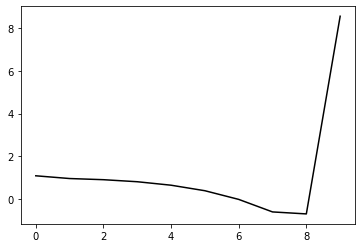

181500 0.26594191689854113
0.486184081903262 -0.7252923974088411 -0.11952894403660234 -0.09475395229757486
[ 1.03328291  1.04230263  1.00145998  0.90810305  0.74846343  0.4917549
  0.08651743 -0.4994367  -0.59680785  8.51394207]


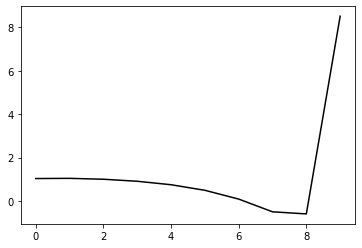

182600 0.21343468083368328
0.48182520530042755 -0.7243712799769451 -0.11828725345268583 -0.09785134321037658
[ 1.06896282  1.04411427  1.01384195  0.9345564   0.78674746  0.53948342
  0.14139351 -0.43921294 -0.53594324  8.56275957]


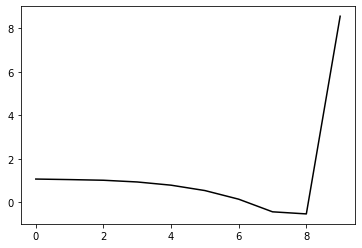

183700 0.21044053264116677
0.48991703382464974 -0.718718115558781 -0.11590654423000749 -0.10098378250922867
[ 1.06065976  1.14051652  1.15135805  1.0986939   0.97248908  0.74135977
  0.35316331 -0.22386841 -0.32706107  8.54834737]


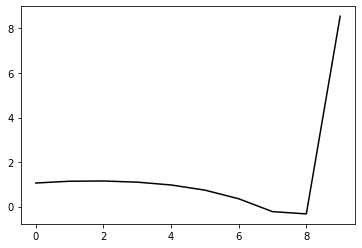

184800 0.19824060528371515
0.4706197089244364 -0.729600836278732 -0.12253005327415556 -0.09538029623823528
[ 1.07759383  0.98700129  0.9898684   0.93660387  0.80359402  0.56249909
  0.16230665 -0.42799878 -0.54899969  8.56219298]


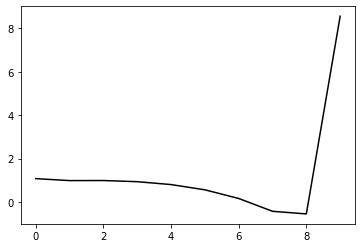

185900 0.21958454778561268
0.4861116676189514 -0.7199910678631143 -0.11861526440807989 -0.0991305535094012
[ 1.05221328  1.15643126  1.17516451  1.14224399  1.0303772   0.8044046
  0.41346168 -0.17273131 -0.29722438  8.5581439 ]


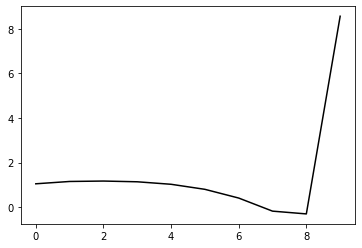

187000 0.183159073820419
0.4790029349428641 -0.7232988098333465 -0.12015368929560985 -0.09837705027574348
[ 1.05919982  1.06502542  1.08865797  1.06086728  0.95422837  0.73252479
  0.34422541 -0.24022655 -0.36645126  8.56007976]


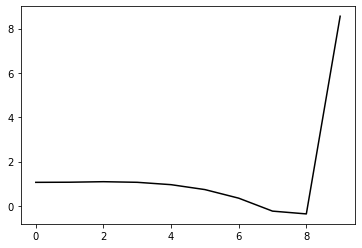

188100 0.19395575724520134
0.47368546405555484 -0.723248531154993 -0.12003694148398915 -0.09830560087801854
[ 1.08800591  1.0462231   1.0572951   1.03285165  0.9318245   0.71497619
  0.32997907 -0.25224219 -0.37923979  8.56510441]


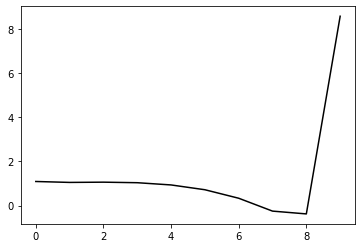

189200 0.16296572790072023
0.46151412260197544 -0.7239156880980625 -0.12062780818414584 -0.09611573226534614
[ 1.04378194  1.01519589  0.97001236  0.91397581  0.78912919  0.5486437
  0.13942409 -0.46641143 -0.6179814   8.5437508 ]


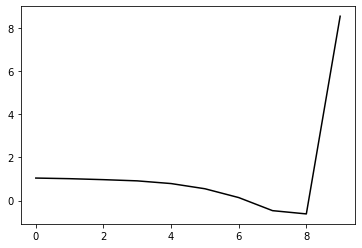

190300 0.2562041308738755
0.4728240830825448 -0.7145771197571702 -0.11563856220634139 -0.1007430311725788
[ 1.09443596  1.08632408  1.04845484  0.99142037  0.87394256  0.64186105
  0.23867358 -0.36348782 -0.51554996  8.53134701]


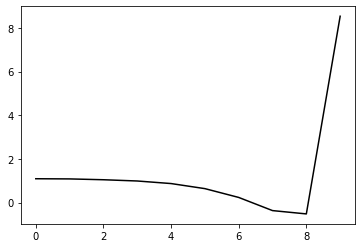

191400 0.1564301336928865
0.48330752323859255 -0.713909208258066 -0.11782592706726788 -0.09863183274547448
[ 1.04102413  1.21401604  1.22042038  1.17179405  1.05928739  0.83268254
  0.43137644 -0.17263845 -0.33210958  8.58300041]


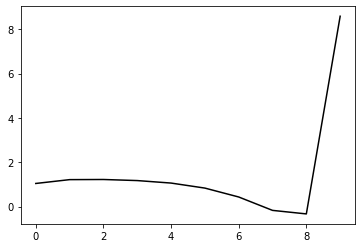

192500 0.3255593908135316
0.48620988906669715 -0.711104168904174 -0.11606461090952332 -0.10213651250098882
[ 1.10290533  1.21515635  1.24075222  1.20848537  1.10676522  0.89062849
  0.49763311 -0.10057136 -0.25790329  8.58122307]


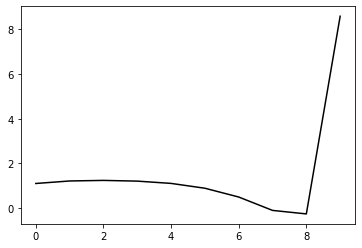

193600 0.20593420063509607
0.4704253399266181 -0.7177410553688917 -0.11935900169773928 -0.10225693419951007
[ 1.10754355  1.09805673  1.10720632  1.0850009   0.99301908  0.78596105
  0.40059191 -0.19167453 -0.3454501   8.56749779]


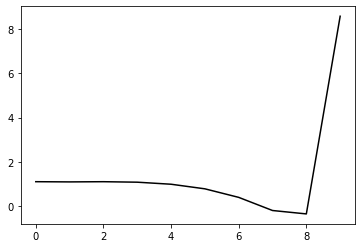

194700 0.22037202871606323
0.4727726269479612 -0.7132317073557836 -0.1178874261431988 -0.09826845219243203
[ 1.09054958  1.06653095  1.06703206  1.03354138  0.93435053  0.72101302
  0.32860571 -0.27277465 -0.43985747  8.56725852]


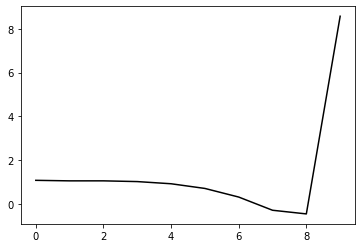

195800 0.26977525606820174
0.457244698298639 -0.7248697658211037 -0.126381318791604 -0.09217572407162107
[ 1.04184789  1.00237234  0.98223637  0.93365461  0.81996664  0.59290452
  0.18661893 -0.42946337 -0.61354456  8.50677006]


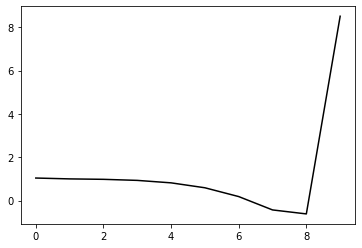

196900 0.22659149136263376
0.4749795099364907 -0.7125815242799567 -0.12061022849755117 -0.0942876008203296
[ 1.01385087  1.17548814  1.16536349  1.11401614  0.9989302   0.76744343
  0.3517569  -0.27948074 -0.48606853  8.52937648]


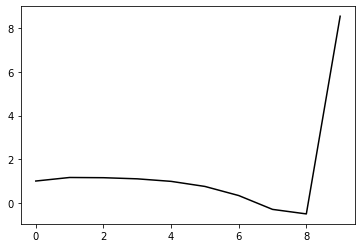

198000 0.17901605751542746
0.4743649012073915 -0.7071995120211688 -0.11739261136869686 -0.0955116219472251
[ 1.05815662  1.15045943  1.13977224  1.07773001  0.94979294  0.70660229
  0.27947204 -0.36355751 -0.58328067  8.54545987]


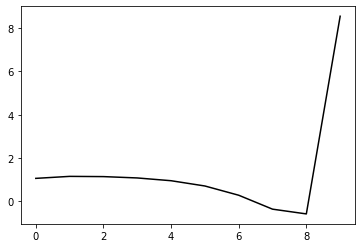

199100 0.18544697966884222
0.4770683818790351 -0.7051289240007097 -0.11588574340389769 -0.10003968730163978
[ 1.09689457  1.13765946  1.19148215  1.15830198  1.04556381  0.81538688
  0.39894752 -0.23660181 -0.45274     8.5381847 ]


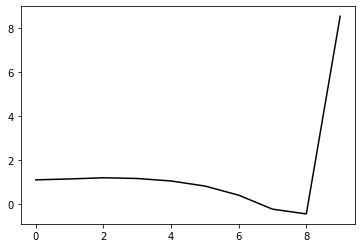

200200 0.13143685101787358
0.46809918693714797 -0.7073579601151557 -0.11717771381868552 -0.09916649469175827
[ 1.07312978  1.09510855  1.13125827  1.10600199  0.99220287  0.75640189
  0.33159724 -0.31684133 -0.5530324   8.51872481]


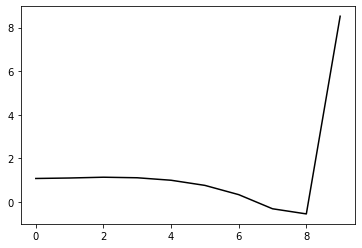

201300 0.2615622043209995
0.46806737690005734 -0.7040823864370681 -0.11584986424403937 -0.09913067475191163
[ 1.0851862   1.11335987  1.14957315  1.13287765  1.02726677  0.79507035
  0.37062585 -0.28183393 -0.52836775  8.55123783]


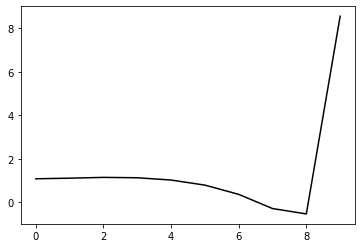

202400 0.20383443301116003
0.4674856883111953 -0.7053475460010461 -0.1190854376494627 -0.0926257495139455
[ 1.04934056  1.09968958  1.13891277  1.12416999  1.01957584  0.78404857
  0.35193919 -0.3139553  -0.58247753  8.51863628]


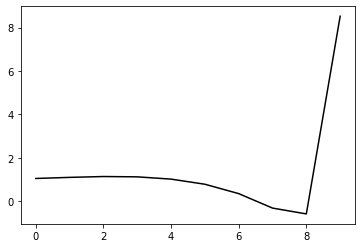

203500 0.36681187028912554
0.473304218285198 -0.704595692787176 -0.12084535714686889 -0.0911923543850742
[ 1.01205209  1.15062833  1.18229291  1.17117714  1.07663476  0.8489026
  0.42101654 -0.24552235 -0.52197292  8.53068004]


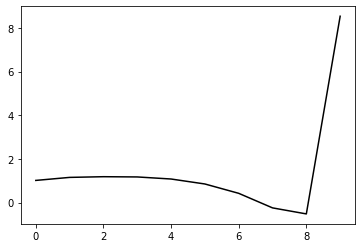

204600 0.19715165995280365
0.47232301611515476 -0.6948412301295342 -0.11436425071252097 -0.09371158986588587
[ 1.05417379  1.13257347  1.14414617  1.11483409  1.00529806  0.76133314
  0.31465082 -0.373197   -0.67416739  8.53564052]


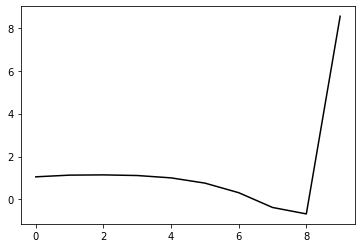

205700 0.22269526504301287
0.47295951637017836 -0.6965396109165388 -0.11569450105048854 -0.09532773693793477
[ 1.0677048   1.1075598   1.14904089  1.13798737  1.04613137  0.81932429
  0.38581155 -0.29337501 -0.59033116  8.54060943]


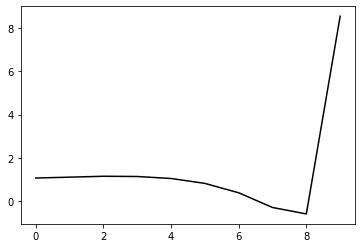

206800 0.2000292123910298
0.4580831216656764 -0.7070032586518105 -0.1219349746917898 -0.09300682904279048
[ 1.08876617  1.00614306  1.03308454  1.024575    0.93659214  0.71510358
  0.28665569 -0.38854579 -0.68297889  8.55999622]


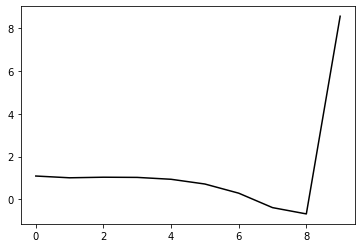

207900 0.2107446803552654
0.46717574327845435 -0.7009690370827159 -0.12041309726439764 -0.09163923033889884
[ 1.06081199  1.10401159  1.12042584  1.10504324  1.01706264  0.79437795
  0.36093075 -0.32418401 -0.63454051  8.52791475]


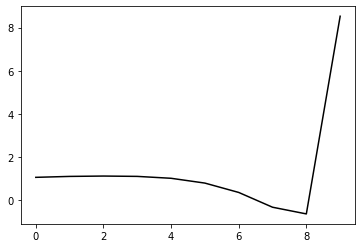

209000 0.2083409443579656
0.4651776758061486 -0.696794601756335 -0.11760063258830263 -0.09384655754684769
[ 1.10546173  1.03980724  1.07178589  1.06349636  0.99039724  0.78821344
  0.37372022 -0.29811489 -0.60276644  8.55132755]


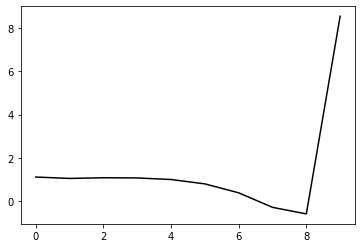

210100 0.1930799724996537
0.4545565376976727 -0.7002844528403924 -0.1184855579487991 -0.09746396177915981
[ 1.12575741  1.0406561   1.05572173  1.05535832  0.99346166  0.80489591
  0.40243211 -0.26134492 -0.56222837  8.52921308]


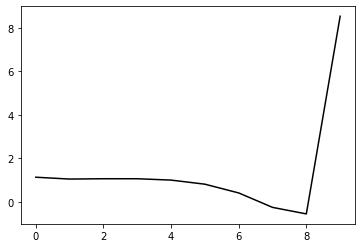

211200 0.13628902521582797
0.45752710370532973 -0.6958476374299385 -0.11654886309291529 -0.09762130924615982
[ 1.08178261  1.08904016  1.0863447   1.06781062  0.9935561   0.79684251
  0.38686699 -0.28741534 -0.60363242  8.55079597]


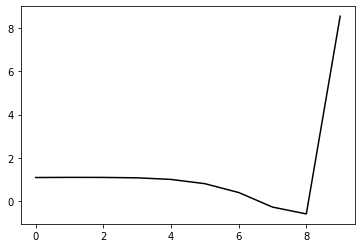

212300 0.2845566005196734
0.46806951246239964 -0.6916799093689888 -0.11682259104254483 -0.09389611530321366
[ 1.05735915  1.12413513  1.15584576  1.1437082   1.0726502   0.88118378
  0.47391915 -0.20574609 -0.53843125  8.52863144]


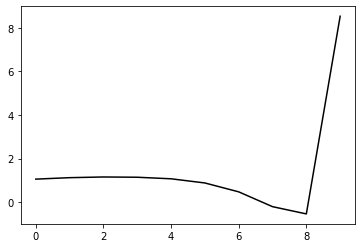

213400 0.24271632098251888
0.44535357557848526 -0.7013967044005476 -0.12256976367554326 -0.08941013943629389
[ 1.04285526  1.03371183  1.02669826  0.99298841  0.8996215   0.69186467
  0.27460742 -0.41170872 -0.74911056  8.52528166]


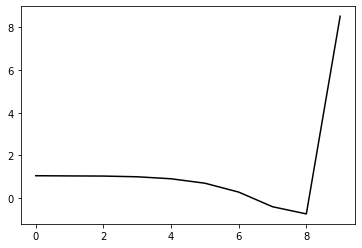

214500 0.3056055182299627
0.45447316264838816 -0.6957095558726648 -0.12061015065450688 -0.09075867540415321
[ 1.02316351  1.08247388  1.06257171  1.01819058  0.91893257  0.70727894
  0.2879691  -0.401604   -0.74527142  8.48254357]


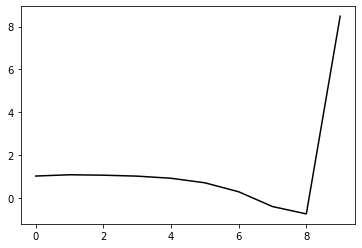

215600 0.21378265103551475
0.45357876642285094 -0.6930070816031254 -0.11868147046635856 -0.09462723883120513
[ 1.04761182  1.14277285  1.13285147  1.09975821  1.01154812  0.81016094
  0.3995561  -0.28614834 -0.63236353  8.55927255]


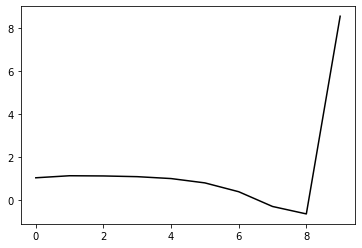

216700 0.32303848563842374
0.45479944689365176 -0.6846176169708681 -0.11267473083625922 -0.09924566884098701
[ 1.10167971  1.12936246  1.15958141  1.13449214  1.04867428  0.85131773
  0.44625898 -0.23691222 -0.58704721  8.52104743]


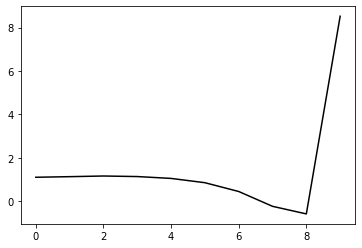

217800 0.2526349269753384
0.4541685979949951 -0.6893200321192905 -0.1180525853758363 -0.09382069193739657
[ 1.00198396  1.1862477   1.18595851  1.14898068  1.04850511  0.83713904
  0.42071542 -0.27400581 -0.63847088  8.52840258]


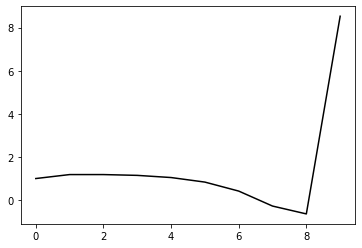

218900 0.22302932555009722
0.44011586418735515 -0.698975281645516 -0.12340088619315852 -0.09403081098134745
[ 1.05752226  1.02995978  1.02895314  0.99410915  0.89928614  0.69726529
  0.2951296  -0.3833824  -0.7320168   8.47854003]


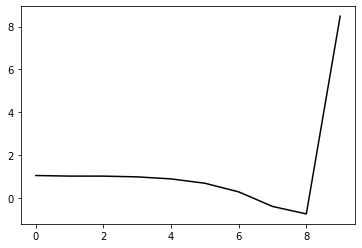

220000 0.19227141953628182
0.4484113687076618 -0.6912704055567915 -0.11935548533599545 -0.0965914024760544
[ 1.07891404  1.06138099  1.07419497  1.04314154  0.95134114  0.75076206
  0.35005047 -0.32980826 -0.68619668  8.5617252 ]


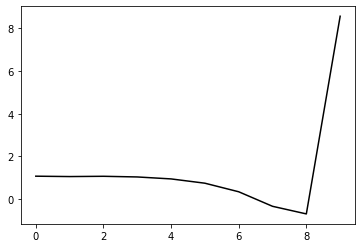

221100 0.18105768380880072
0.4494122853798896 -0.6878398645812548 -0.11728517375145796 -0.09925809422955338
[ 1.08996693  1.11636565  1.16030838  1.14958451  1.07184218  0.8820833
  0.49001259 -0.18577741 -0.54648562  8.53052777]


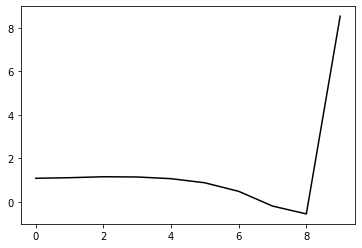

222200 0.1524708514338215
0.44151308866815275 -0.6875265064226732 -0.11657031287635833 -0.09934600636208124
[ 1.08517369  1.07851366  1.11342841  1.10430503  1.0228516   0.82674372
  0.42762384 -0.25782796 -0.6353068   8.56871876]


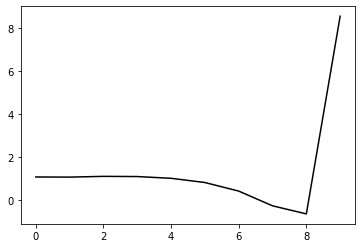

223300 0.3026833332233184
0.448526399661994 -0.6823871320263527 -0.11486691471310344 -0.09904938147464198
[ 1.10875782  1.13042693  1.16869545  1.17369741  1.11044984  0.93082653
  0.5466957  -0.1287617  -0.5083528   8.51524128]


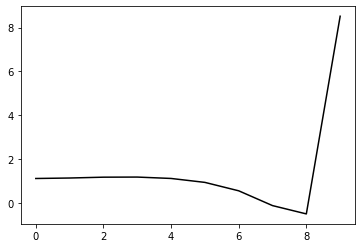

224400 0.3320748527843779
0.450782599029104 -0.6863039135703386 -0.11998439921823861 -0.09388758967413338
[ 0.97149423  1.17265995  1.1964542   1.18384312  1.10347066  0.90635927
  0.50686329 -0.18247115 -0.57974364  8.57077807]


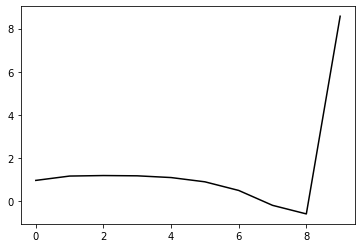

225500 0.2552577386897432
0.44163027184255366 -0.6864848318121987 -0.11893263887737968 -0.09790199030294885
[ 1.04303967  1.12578343  1.11868435  1.08599443  0.99255401  0.78687527
  0.38475041 -0.30161693 -0.69344862  8.55882187]


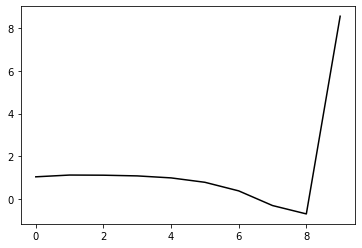

226600 0.22270986003421278
0.4483898829750025 -0.684011701926507 -0.11834581137203323 -0.09941818250498469
[ 1.0110283   1.11275516  1.15711237  1.13534247  1.04717426  0.84662551
  0.44842459 -0.23604512 -0.63150072  8.54365169]


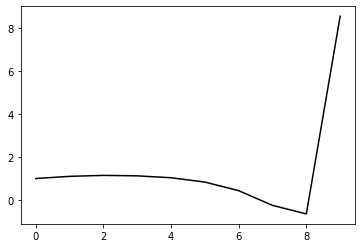

227700 0.21957063632775126
0.43087695343439375 -0.6899715606111484 -0.12142582287631089 -0.09876305975708467
[ 1.09558815  1.00959224  1.03415542  1.03356817  0.96566186  0.78400449
  0.40305929 -0.26704028 -0.65377878  8.53171725]


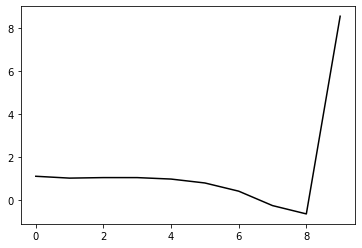

228800 0.19969628177527277
0.4443050558297414 -0.6824840441720583 -0.11937757983049237 -0.09768511316650567
[ 1.03024839  1.16593419  1.19132601  1.18763406  1.12017864  0.93524708
  0.54684497 -0.13572224 -0.54425906  8.57864957]


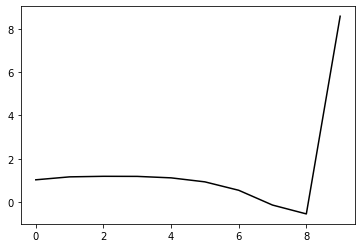

229900 0.22998729221822606
0.42923863752932667 -0.6879770520226511 -0.12247173793710844 -0.09605517839667761
[ 1.07952788  1.0238314   1.04585433  1.04406169  0.98053028  0.79971232
  0.41383291 -0.26891107 -0.68374053  8.50643294]


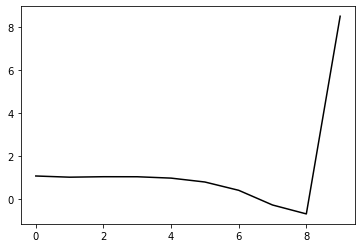

231000 0.2542728700624195
0.4351045671928236 -0.6775234265242258 -0.11702512263082772 -0.09459577815755492
[ 1.13333536  0.9511399   0.95984318  0.94532058  0.87554413  0.69094228
  0.30130571 -0.38666945 -0.81139885  8.54808696]


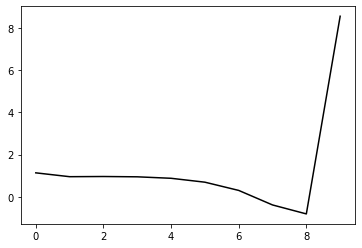

232100 0.196367042654689
0.43021718506969053 -0.6772409232037366 -0.11668446979576805 -0.09762425133416196
[ 1.11974748  1.04908634  1.037853    1.01572603  0.94307464  0.75719189
  0.36632071 -0.32337783 -0.75198146  8.50328088]


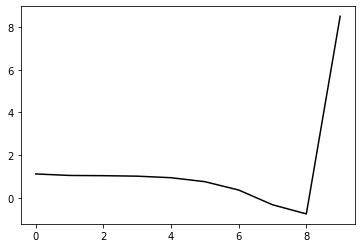

233200 0.13483417896281127
0.43857986621929856 -0.6753227270274935 -0.1170431580587362 -0.09871042575984589
[ 1.06911626  1.13374189  1.14562796  1.12072448  1.04527283  0.8588063
  0.46724757 -0.22437124 -0.65855372  8.54907443]


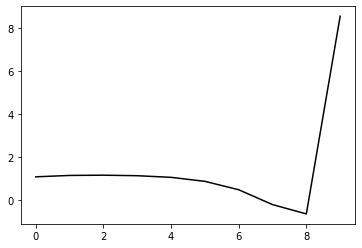

234300 0.2617764529675487
0.43691933670826183 -0.6744768883878371 -0.11699456886649905 -0.0990812558666912
[ 1.08999246  1.1249491   1.15233229  1.14063067  1.07302988  0.89530442
  0.51170477 -0.17497418 -0.61093612  8.49173618]


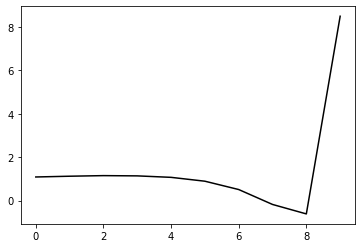

235400 0.21773717548298097
0.41988019378012065 -0.685751117193206 -0.1241286828881936 -0.09462001111751059
[ 1.07297184  1.0660215   1.06748694  1.04927919  0.97378561  0.78906442
  0.39983832 -0.29244405 -0.73717424  8.4992648 ]


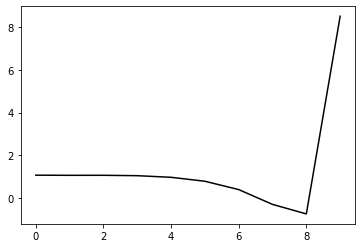

236500 0.2683132655856314
0.4245860993445673 -0.674855969985361 -0.11799617494438258 -0.09698802467611316
[ 1.10710402  1.06386895  1.04576996  1.00792715  0.91774137  0.72048706
  0.32057847 -0.38217802 -0.84010975  8.47914818]


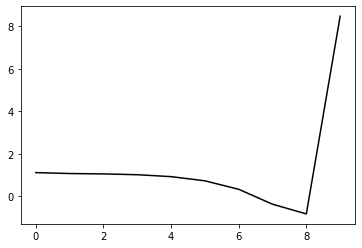

237600 0.2026144152849365
0.4372745774667554 -0.6692246174717768 -0.11654323730363686 -0.09659156392649547
[ 1.08142112  1.13017465  1.15137858  1.10815081  1.0071014   0.79937937
  0.38955918 -0.32414583 -0.79760803  8.51716346]


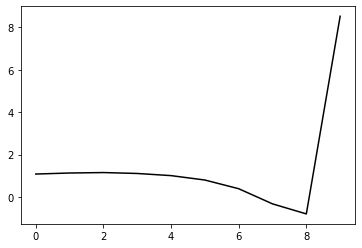

238700 0.223975930077728
0.43766590106808145 -0.6699845005749511 -0.11810796564312473 -0.09591914637385317
[ 1.06016663  1.15215032  1.17621617  1.14140353  1.04114715  0.83364852
  0.42497827 -0.28787898 -0.76327178  8.51269204]


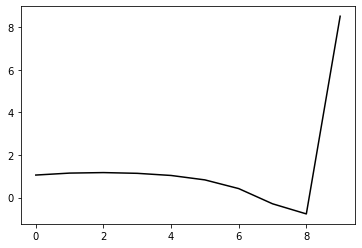

239800 0.21090635389755952
0.4303197062939615 -0.6765210344926064 -0.12251028583242561 -0.09484781364198457
[ 1.08847231  1.02577519  1.07277153  1.05648823  0.9677287   0.76954207
  0.37059168 -0.33295354 -0.80154213  8.53309777]


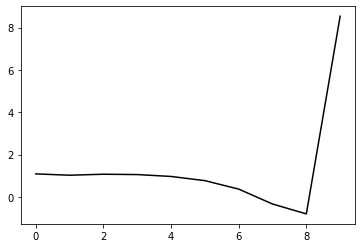

240900 0.21448205466625625
0.43238407059827627 -0.6742592703689232 -0.1218922059703426 -0.09658891847605727
[ 1.04787598  1.14773655  1.16982216  1.15540387  1.06779941  0.86736711
  0.46608192 -0.2402869  -0.71500227  8.49685557]


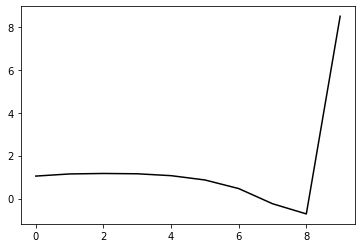

242000 0.18100957993024122
0.43136763747588225 -0.6733783894529032 -0.1221276436082629 -0.09643764121924914
[ 1.0648644   1.11565382  1.15449606  1.1530623   1.07902633  0.88932904
  0.49705258 -0.20318142 -0.67895317  8.51434497]


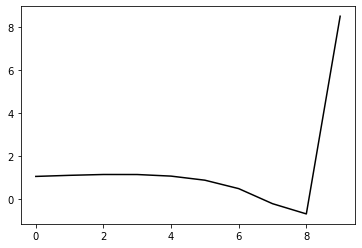

243100 0.25418806569087044
0.43497187170519636 -0.6646389258733754 -0.11651512858268016 -0.09878595760110805
[ 1.12189999  1.12967759  1.18627107  1.19523248  1.12943741  0.94391999
  0.55205734 -0.15280103 -0.64469029  8.52571225]


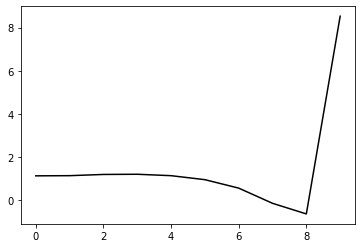

244200 0.122731336031533
0.43561320313397184 -0.6626593040074009 -0.11693890232269145 -0.09463749815572063
[ 1.07624808  1.14743181  1.1703391   1.16870867  1.0972621   0.90425073
  0.50294191 -0.21409592 -0.72646296  8.57430946]


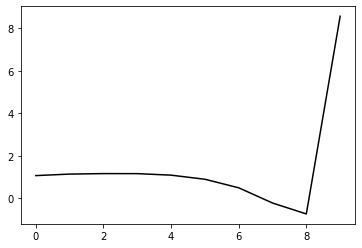

245300 0.2594386756066156
0.4348050221566978 -0.6620873402918777 -0.11714760344993315 -0.0951780738762279
[ 1.09475785  1.14262607  1.1868011   1.19520119  1.13541509  0.95296861
  0.55946833 -0.15276059 -0.66702724  8.51487911]


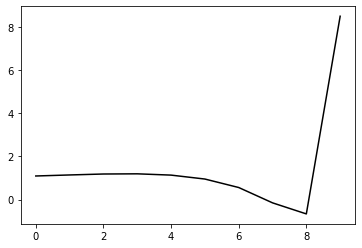

246400 0.20480497652264704
0.4278616515732374 -0.6683339939856409 -0.12201546683976475 -0.09103956472702215
[ 1.07414046  1.12825821  1.16750568  1.17376412  1.1117815   0.92641681
  0.5281946  -0.19084044 -0.71728806  8.55395676]


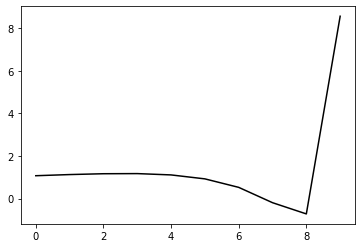

247500 0.23706781121604903
0.42968268601293386 -0.6664617607797094 -0.12135040414444268 -0.09485715891462748
[ 1.0996927   1.15608364  1.20155435  1.22231865  1.1802091   1.01610599
  0.638237   -0.06222498 -0.57478951  8.53120503]


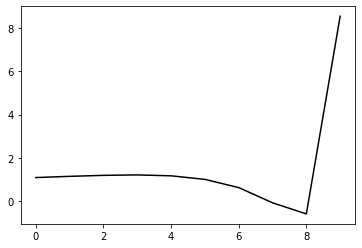

248600 0.2118381154639246
0.42631747365064104 -0.6619371190393436 -0.11869470687787399 -0.09497262968535822
[ 1.08491068  1.15773877  1.19581084  1.20773238  1.15743603  0.98439448
  0.5944943  -0.12252767 -0.66112653  8.54117457]


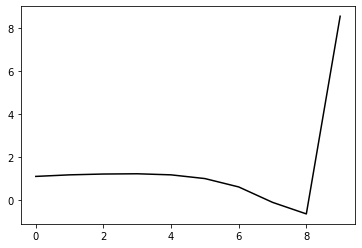

249700 0.22331821459984247
0.42390940284093226 -0.6612413493385875 -0.11914432207197943 -0.0920436997615578
[ 1.08270159  1.10875801  1.13643162  1.13859586  1.07940244  0.89907357
  0.50165218 -0.22426145 -0.77653537  8.50475353]


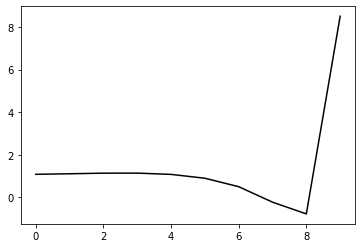

250800 0.2573845111836988
0.41429712783829825 -0.6732864767416012 -0.1270172325521687 -0.08936596481789802
[ 1.05448559  1.05307446  1.07573183  1.0774231   1.0192333   0.84176681
  0.44784269 -0.27450603 -0.82506315  8.51110631]


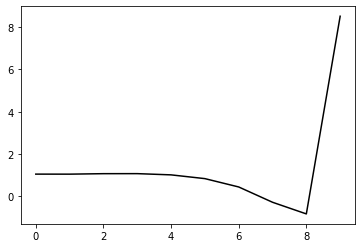

251900 0.22923336845320663
0.42367367341352674 -0.660926774265308 -0.11982363731071163 -0.0940639978170964
[ 1.08236425  1.16633708  1.19606889  1.19586323  1.13969543  0.96413927
  0.57001519 -0.15579152 -0.71588342  8.51853195]


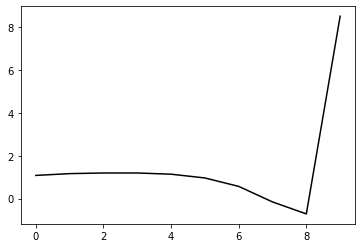

253000 0.20217319601861136
0.42554305023153743 -0.6610513059535001 -0.12138826808089428 -0.09346628184138789
[ 1.04666655  1.19514325  1.25949717  1.27486797  1.22547119  1.05717713
  0.66869685 -0.05544632 -0.62133555  8.53151486]


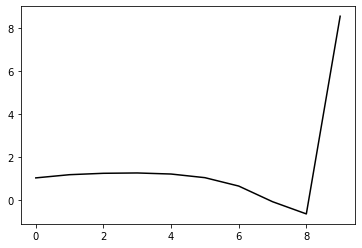

254100 0.19693544400761992
0.40657354041161164 -0.664365115819854 -0.12102959702310426 -0.09696584701742056
[ 1.10998091  0.95947495  0.98225349  0.9884858   0.93396111  0.76518082
  0.38126269 -0.33637275 -0.89812151  8.50725117]


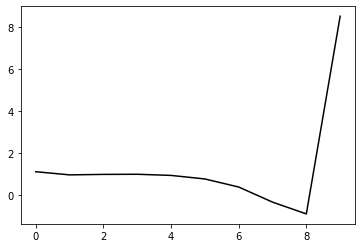

255200 0.14490892455727708
0.41199680021817175 -0.6647576264720884 -0.12339093592227118 -0.0952433947207577
[ 1.1213509   1.11590877  1.12127232  1.12218884  1.07028486  0.90361682
  0.52113896 -0.19646279 -0.76145486  8.54756585]


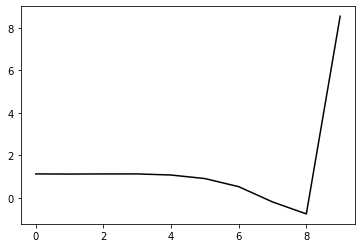

256300 0.2856032772481598
0.42588481872845096 -0.6556681118820094 -0.12009344048185018 -0.09281085923014698
[ 1.07942912  1.1619544   1.20905084  1.20292171  1.14205436  0.96802233
  0.5774833  -0.15111211 -0.73428883  8.50446108]


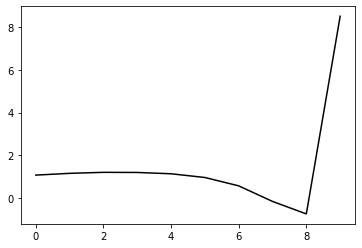

257400 0.1708983318933144
0.42733765482327174 -0.6517884686294999 -0.11819999911318743 -0.09296291883027201
[ 1.04839925  1.23368372  1.28483075  1.28933616  1.22837815  1.05330182
  0.66158556 -0.07004104 -0.66104477  8.54061327]


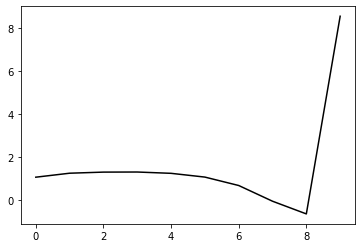

258500 0.4801723843820897
0.42808063350501235 -0.6467403097577525 -0.11410033595596573 -0.09727646495541385
[ 1.16033786  1.14891951  1.23101633  1.25871743  1.21533564  1.05530596
  0.67847067 -0.04016456 -0.62326133  8.52618352]


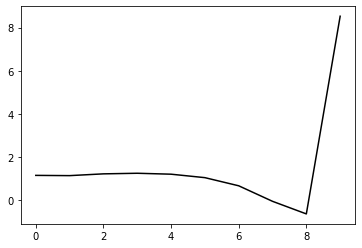

259600 0.225339506339762
0.4278777981044167 -0.6531052363762615 -0.12013562630372629 -0.09395705694363367
[ 1.05504914  1.20576564  1.27550814  1.2955562   1.24324822  1.07186752
  0.68500383 -0.04228075 -0.63546508  8.54273285]


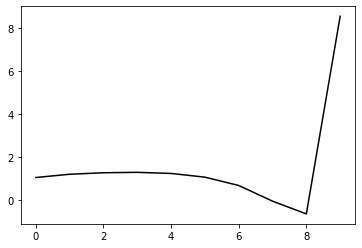

260700 0.21878884728882414
0.41075707284848484 -0.6607023562939071 -0.12408725008678428 -0.0928982932398815
[ 1.11740775  1.0431906   1.08059434  1.10813312  1.07096961  0.91606369
  0.54641198 -0.16470043 -0.74630354  8.51794917]


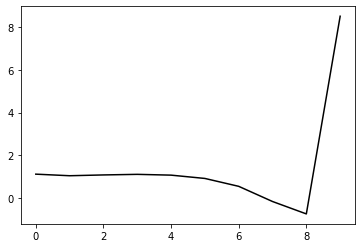

261800 0.23858957668715514
0.4241983480027945 -0.6525401611002887 -0.12108939321529001 -0.09310794274425152
[ 1.04199812  1.25718428  1.29598475  1.31703268  1.28067083  1.12400431
  0.74835225  0.02623118 -0.57582225  8.57510419]


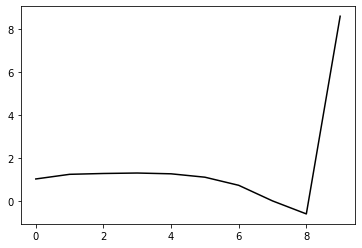

262900 0.22557415007249051
0.41563353631557287 -0.6509736635459189 -0.1203050438376479 -0.08819095801929112
[ 1.07694005  1.0892637   1.11474468  1.11026696  1.05060411  0.87594342
  0.48515041 -0.25088831 -0.87038713  8.5017807 ]


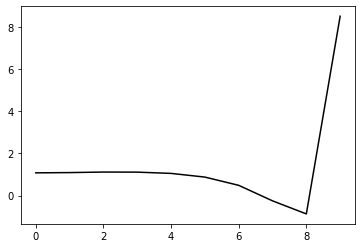

264000 0.21021024903497523
0.42156945542148255 -0.647922351962925 -0.11959911422610017 -0.09110574866399335
[ 1.12721083  1.14505047  1.18971548  1.20055592  1.15464771  0.99162322
  0.60938339 -0.12142341 -0.74067294  8.5645624 ]


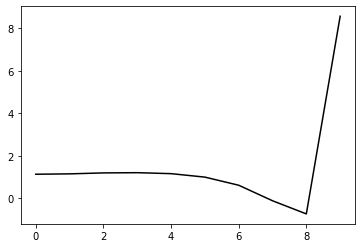

265100 0.2050548357897746
0.41483691961980657 -0.6475922598665615 -0.11845210212836645 -0.09523382389399707
[ 1.14089336  1.14597795  1.19136398  1.20514808  1.1621157   1.00339431
  0.62572392 -0.10120168 -0.71938394  8.5134274 ]


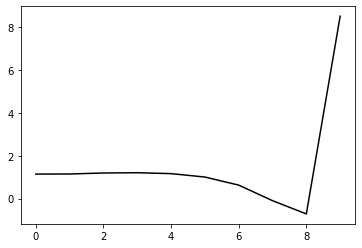

266200 0.12593227979023933
0.4157067115370681 -0.6470272108492329 -0.11921920019209534 -0.09365776361540941
[ 1.09085528  1.15791912  1.21062208  1.22083013  1.16940448  1.00192365
  0.61499186 -0.12285002 -0.75712469  8.53200123]


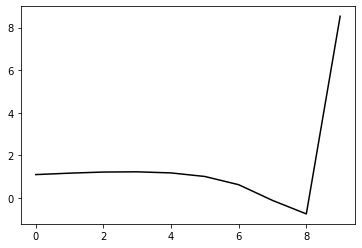

267300 0.27933137480624703
0.40902223370772867 -0.6485190430783137 -0.11949248445858446 -0.09552736184187353
[ 1.16736338  1.10448083  1.15198262  1.18256491  1.15169024  1.00512114
  0.63912024 -0.07943387 -0.69880943  8.48986294]


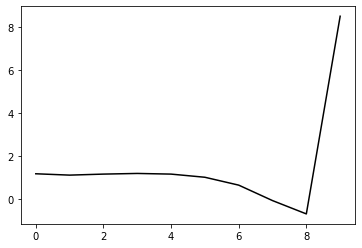

268400 0.23815676903194818
0.4055149928249041 -0.6543140889103191 -0.1260250087334584 -0.08649162436630231
[ 1.08695429  1.10259673  1.08218024  1.06465789  1.00040994  0.82624718
  0.43784474 -0.29937963 -0.9369267   8.49568402]


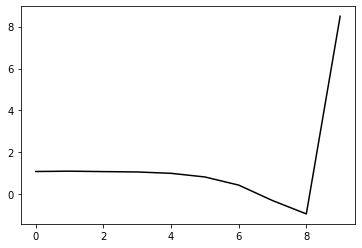

269500 0.260688607050486
0.41802321526427055 -0.6468939951490821 -0.12219416420870824 -0.08982492036686685
[ 1.08285792  1.15869998  1.17812013  1.14978794  1.07800325  0.90079748
  0.51117252 -0.22697904 -0.86810904  8.45888289]


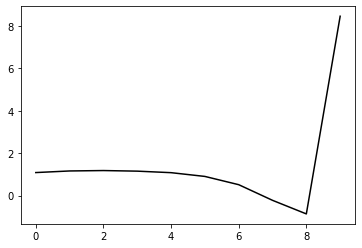

270600 0.21847001405030286
0.41096000950975325 -0.6489999317998624 -0.1225493794622351 -0.09401377232414652
[ 1.10590781  1.19080356  1.23046281  1.21860013  1.15042165  0.97636375
  0.58997271 -0.14584234 -0.78785415  8.49581291]


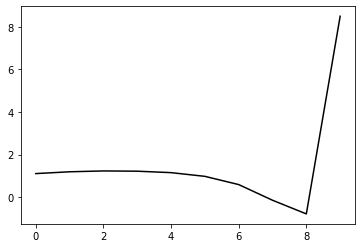

271700 0.21253880008917322
0.4111617122689494 -0.6424902894821575 -0.11860164217240926 -0.09541466217611985
[ 1.11218546  1.20248452  1.22678873  1.20660138  1.12400822  0.93550407
  0.53680758 -0.21056486 -0.86647049  8.4577201 ]


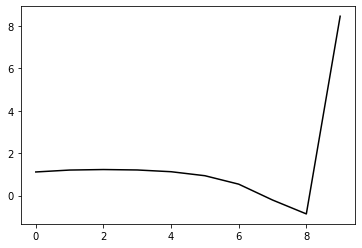

272800 0.41473007305431697
0.42917858030343414 -0.6407956110599576 -0.12209437574990416 -0.09024020585533635
[ 0.98732731  1.3434436   1.40648315  1.39067669  1.30227318  1.10380449
  0.69457203 -0.06473569 -0.73746136  8.54246981]


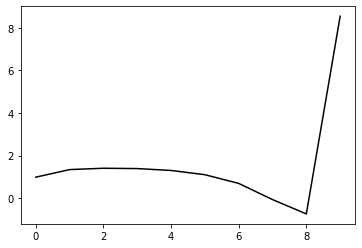

273900 0.20835266940564368
0.41461894906625046 -0.646395213797408 -0.12425135933634252 -0.09375096561588933
[ 1.06335713  1.2029724   1.2807549   1.29154718  1.22230016  1.0397764
  0.6467692  -0.09647095 -0.7552702   8.50082255]


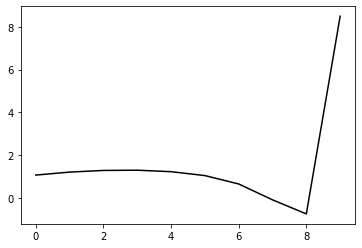

275000 0.3287245974914175
0.40685189537143607 -0.643403261613866 -0.12054071353643549 -0.09863992790057453
[ 1.19162579  1.07422128  1.14542525  1.17031396  1.11559062  0.94381051
  0.56133891 -0.17163275 -0.82329668  8.54146548]


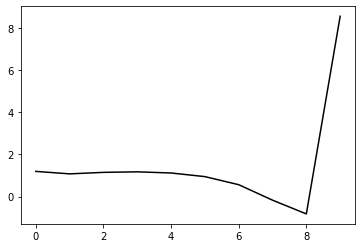

276100 0.20772103011290977
0.40275128743194777 -0.6444120729448496 -0.12133837236351694 -0.09773223250712507
[ 1.154004    1.14153809  1.17098942  1.18043359  1.11802763  0.93753901
  0.54716657 -0.19251107 -0.85202231  8.47881068]


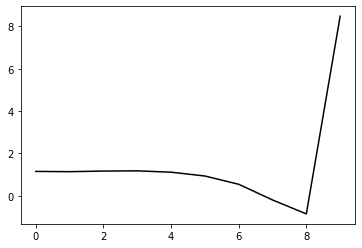

277200 0.14120078402067743
0.40221069230093914 -0.6441733515615955 -0.12202600376832197 -0.09579235117081147
[ 1.10121923  1.1374761   1.17069979  1.16280803  1.08736008  0.89378804
  0.49039127 -0.26185674 -0.93681144  8.49719127]


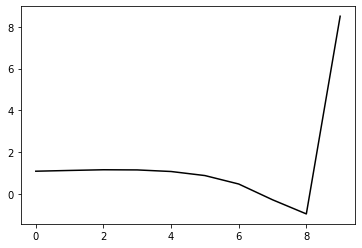

278300 0.259687619546374
0.41488849301201286 -0.6366883485244054 -0.1191689341346507 -0.09613865757307286
[ 1.1059818   1.21794176  1.28662082  1.29133227  1.22292204  1.03399117
  0.63247903 -0.12035068 -0.80142671  8.48518469]


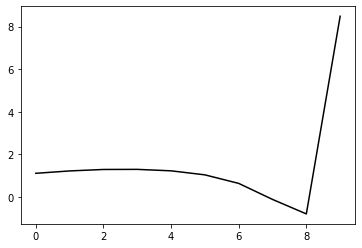

279400 0.182099564055875
0.4135659924497467 -0.6396211644139613 -0.12213078774323413 -0.09445818417685123
[ 1.0453982   1.24146635  1.31462966  1.33506999  1.27714358  1.09649938
  0.70155768 -0.04615169 -0.72697253  8.53286802]


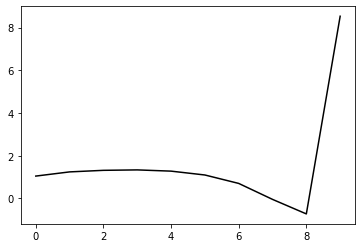

280500 0.263467799576012
0.41069818470251684 -0.6398124954770327 -0.12308721344886916 -0.09184913483707731
[ 1.06793224  1.16393975  1.22226989  1.23971104  1.18008057  0.99550201
  0.59510517 -0.15894437 -0.85099507  8.49521975]


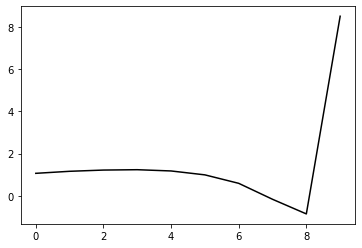

281600 0.2307618691653266
0.4032014808270913 -0.6418130986858361 -0.12463810842552561 -0.09039921218787975
[ 1.08025999  1.12408085  1.1540855   1.15655961  1.08556265  0.88839703
  0.4742442  -0.29389913 -1.00338503  8.49566646]


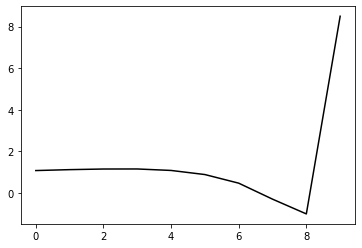

282700 0.21753759808610015
0.40246444298491735 -0.6409164916836908 -0.12384754024541274 -0.09462922789320627
[ 1.11405676  1.11338046  1.16067748  1.17932775  1.12901338  0.95106056
  0.55247513 -0.20249822 -0.90236055  8.47028277]


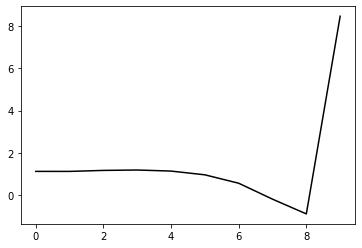

283800 0.21221986405061743
0.40745149247966395 -0.6394867448472601 -0.12412915631010757 -0.09503088684707407
[ 1.05450774  1.23533966  1.29936205  1.32240242  1.27610867  1.10115815
  0.70234035 -0.0553606  -0.76286617  8.53441686]


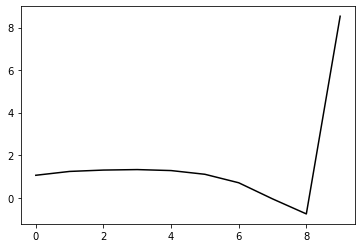

284900 0.23127350090749926
0.3996067270155299 -0.642483187684909 -0.12558986387360208 -0.09645628989233154
[ 1.11016193  1.16824297  1.21606567  1.23648084  1.18945416  1.01463424
  0.61561276 -0.14224851 -0.85128646  8.53136768]


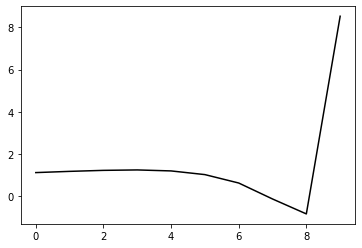

286000 0.19252104356008898
0.4102185527417347 -0.6324029821658015 -0.12101626579349295 -0.09500958371232426
[ 1.08772428  1.19950285  1.28015374  1.28947874  1.22751452  1.03882289
  0.62506825 -0.14922822 -0.87977161  8.4880872 ]


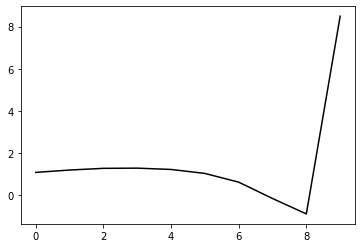

287100 0.18560902095332835
0.40092463504729486 -0.6342515663010018 -0.12122048828217985 -0.09681825383686564
[ 1.09691494  1.11960442  1.21776995  1.24715444  1.19439638  1.01409074
  0.60824456 -0.15904907 -0.88509348  8.4944506 ]


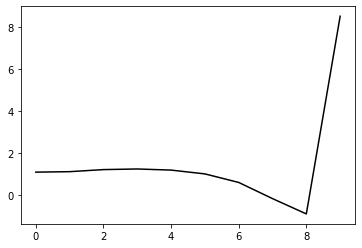

288200 0.16613056951851407
0.39587437486080096 -0.6336893952124338 -0.12025762243409477 -0.09898014556585961
[ 1.10860937  1.09115892  1.15745178  1.19490415  1.15003071  0.97563658
  0.57514379 -0.18753123 -0.91102802  8.47954432]


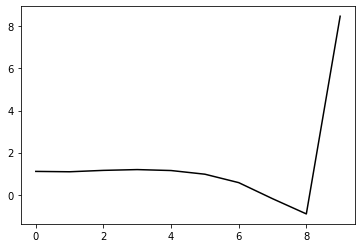

289300 0.3133295056022785
0.3963270603470103 -0.6396110059352139 -0.12713252472117711 -0.09104825855481488
[ 1.04347428  1.07931659  1.11739958  1.13663928  1.08176613  0.8960912
  0.48344602 -0.2923084  -1.03199059  8.4531829 ]


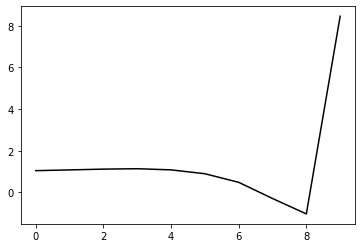

290400 0.17238371216042062
0.4039225403868234 -0.6300304070477446 -0.12118087411681916 -0.09635375879043369
[ 1.04680179  1.21030864  1.25860964  1.2786988   1.22983341  1.04890227
  0.63821726 -0.13804029 -0.88205536  8.52058744]


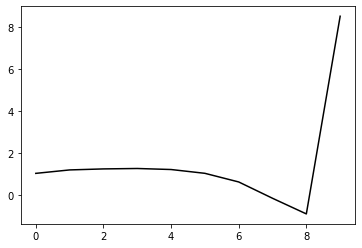

291500 0.24011293713112278
0.40335275869764503 -0.6307832490538209 -0.12211491418850305 -0.09721928723926293
[ 1.10374842  1.14315179  1.22151603  1.2570227   1.22296016  1.05803814
  0.66186136 -0.10163937 -0.83584853  8.49894194]


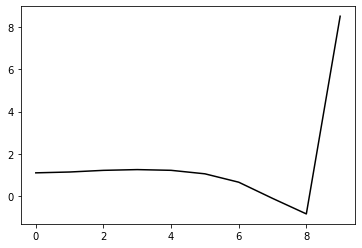

292600 0.21584556155291978
0.3990069517137372 -0.6330015987741295 -0.12413219618714376 -0.09460235807332455
[ 1.0664172   1.14188936  1.19299717  1.22268893  1.1854765   1.01758421
  0.61640087 -0.15548085 -0.9045829   8.55574867]


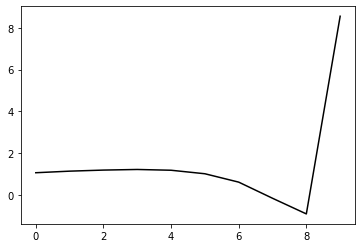

293700 0.21291427367530139
0.39911871384247555 -0.6298174160641015 -0.12215439287636638 -0.09603574609153231
[ 1.0816534   1.14117592  1.2091167   1.24539668  1.21856411  1.06318893
  0.67256328 -0.09294587 -0.84309003  8.499726  ]


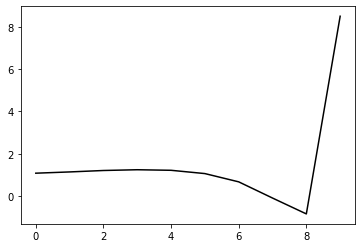

294800 0.2069871258148619
0.39687677568600244 -0.6316141917680741 -0.12399809638435097 -0.0945068189715755
[ 1.04755355  1.16698328  1.21606824  1.25147045  1.22697463  1.07601106
  0.6895153  -0.07417411 -0.82748329  8.50866415]


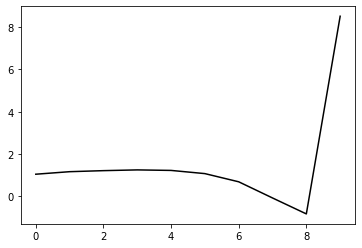

295900 0.22500798295321325
0.39227729178013937 -0.6333774862323382 -0.1252633130274384 -0.09543355968467962
[ 1.07606278  1.15566042  1.17773866  1.19663297  1.16213753  1.00351426
  0.61028925 -0.16006923 -0.92122656  8.51238902]


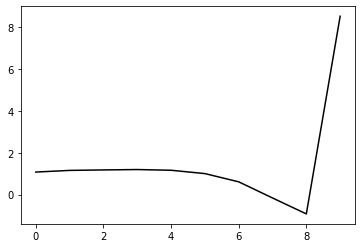

297000 0.23123653938384484
0.4062121667665578 -0.6207162086711695 -0.11945458607071209 -0.09616825030168438
[ 1.12148456  1.17776407  1.26285397  1.28388654  1.24870137  1.0907697
  0.69667783 -0.07820227 -0.84996399  8.51543078]


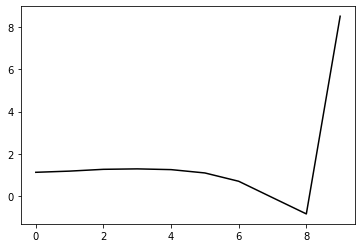

298100 0.20973142194106728
0.3953528029897797 -0.6240821204162591 -0.12033690443473948 -0.09793781637767723
[ 1.1308222   1.12574643  1.19771932  1.23039555  1.19926302  1.04566212
  0.65582692 -0.11664227 -0.88921696  8.50666734]


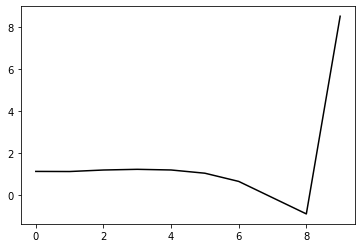

299200 0.15070652044136681
0.40003724781838407 -0.6222415450405069 -0.12166329423732516 -0.09249095667677776
[ 1.05054277  1.15294092  1.21904909  1.24739324  1.20894057  1.04636207
  0.64639682 -0.14006019 -0.93412382  8.52451129]


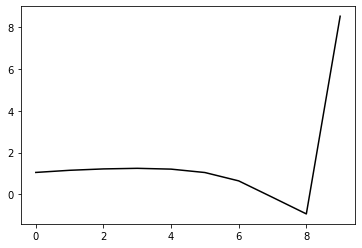

300300 0.29688921524391265
0.3891807702481599 -0.6274729564302614 -0.1255748337009612 -0.08681710001409364
[ 1.06610876  1.0053351   1.01977836  1.03239836  0.98395828  0.81396791
  0.40922168 -0.38219925 -1.18448011  8.4328885 ]


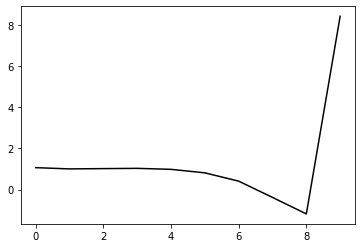

301400 0.20846405453157518
0.40197705404131245 -0.6199308928691751 -0.12213559487776682 -0.09150237847413457
[ 1.01430399  1.19875123  1.21361758  1.21026074  1.15576733  0.98132163
  0.57298798 -0.22211405 -1.02969667  8.49108884]


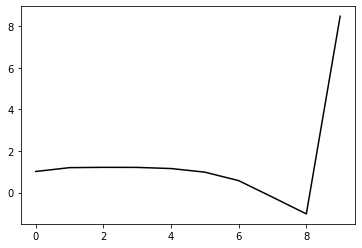

302500 0.24267176136675578
0.4038104150782998 -0.6177743357740335 -0.12115159555933044 -0.0947261618347765
[ 1.07299788  1.23419705  1.2928725   1.31118307  1.27698186  1.12406787
  0.73510686 -0.04516625 -0.84408758  8.50195119]


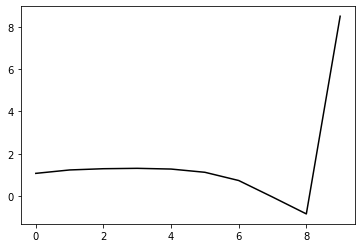

303600 0.20101797087785647
0.39768294983121244 -0.6172069261994043 -0.11997957288887738 -0.09516103003983074
[ 1.12703071  1.05814198  1.12643543  1.1540968   1.12061073  0.97083183
  0.58728201 -0.1884891  -0.98697795  8.4863382 ]


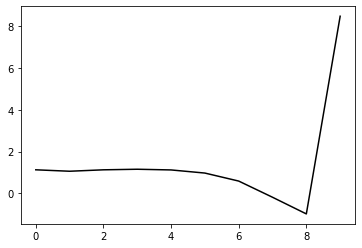

304700 0.2231330188749009
0.40402815023438177 -0.61720576781761 -0.12228359579965678 -0.09429527630864876
[ 1.07479611  1.19773084  1.26483422  1.30032937  1.27454548  1.12963389
  0.74956742 -0.02618737 -0.83129179  8.47034628]


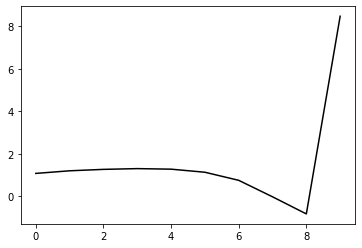

305800 0.6005900556214187
0.3908797435481229 -0.6058977158110094 -0.11117769547048838 -0.1025178821037736
[ 1.13970823  1.05733865  1.11959682  1.14569655  1.11060414  0.95765405
  0.57124265 -0.21136381 -1.02734523  8.45751765]


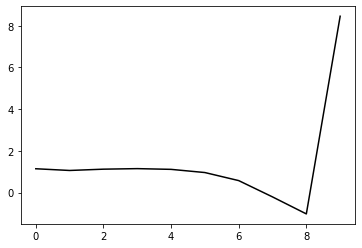

306900 0.23273892966452425
0.39666290180801134 -0.6122391026691255 -0.12007784514314448 -0.09203372814751255
[ 1.06915683  1.13617814  1.17294114  1.19133047  1.15029599  0.99128605
  0.59952543 -0.18852916 -1.01155246  8.48293417]


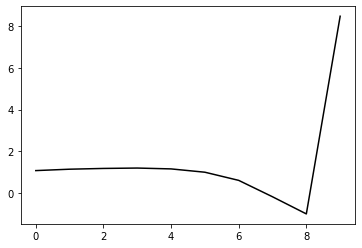

308000 0.22839176583932783
0.3930190102313718 -0.6159247613658313 -0.1224427134447837 -0.09357277273751215
[ 1.12987545  1.06181132  1.10915937  1.13678632  1.11011079  0.9660585
  0.58918186 -0.18511189 -0.99667303  8.48976   ]


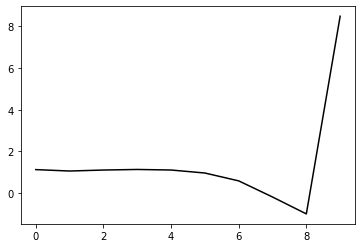

309100 0.288169342249201
0.3990581387764942 -0.6078188930864008 -0.11820418091115162 -0.09685326329343831
[ 1.11804434  1.19914569  1.27206393  1.29924209  1.27120411  1.12477238
  0.74356239 -0.03835986 -0.86392495  8.47568295]


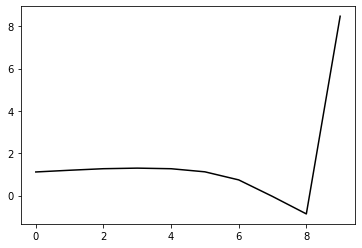

310200 0.1437768725759253
0.3802197324022048 -0.619723332707725 -0.12470895424215622 -0.0961915929324878
[ 1.09940808  1.10347225  1.13010484  1.14312836  1.10135574  0.94425391
  0.55543413 -0.23175035 -1.06156639  8.47306876]


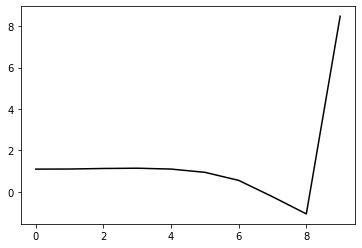

311300 0.28392118606754524
0.3911852961755126 -0.6124316564346235 -0.12322210285632025 -0.09458939590021871
[ 1.06444238  1.14338928  1.17360106  1.17482906  1.12247122  0.95543799
  0.55702683 -0.24073837 -1.08493421  8.47846659]


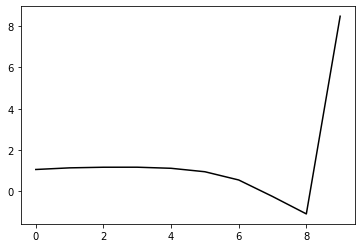

312400 0.17361992202633042
0.39534618735726473 -0.6110078595217695 -0.12331688510980501 -0.09694047382022478
[ 1.04375942  1.22309126  1.2774391   1.29012307  1.245141    1.08515176
  0.69354579 -0.09849001 -0.93962119  8.47796065]


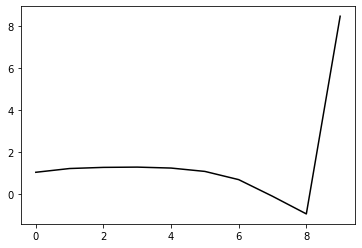

313500 0.23296181643874359
0.39512517841706507 -0.6085420591070475 -0.12216961379826935 -0.09805930595082717
[ 1.08597426  1.18968653  1.26060657  1.28556002  1.24635186  1.0911437
  0.70450103 -0.08373747 -0.92490819  8.50031029]


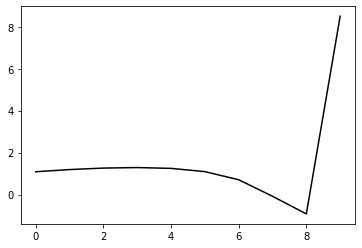

314600 0.20994033637645998
0.39251621668491166 -0.6103431512350397 -0.12358944216911534 -0.09720034608989525
[ 1.09133078  1.14208634  1.1851199   1.20688519  1.16749034  1.01224447
  0.62754342 -0.15819816 -0.99960356  8.46667526]


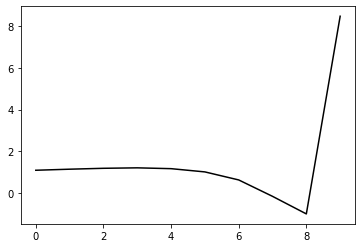

315700 0.21646026988314088
0.39036102730370964 -0.6043676262304559 -0.11982492054593746 -0.09770438365403836
[ 1.0935168   1.13460202  1.16508934  1.17354317  1.12245846  0.95550826
  0.55964602 -0.23772972 -1.09455073  8.43910208]


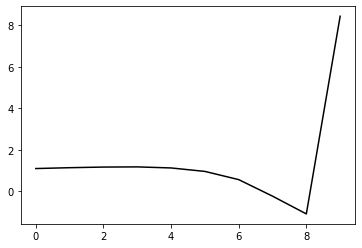

316800 0.1972923391899899
0.3914197690059382 -0.6096082511443421 -0.12497201015811461 -0.09535589390039981
[ 1.04991759  1.14865161  1.19943783  1.21817988  1.17755442  1.02142354
  0.63654134 -0.15044969 -0.9995438   8.47414999]


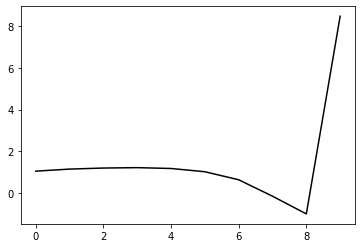

317900 0.21339194360265648
0.39955316835809485 -0.6055746680718558 -0.12431892246180702 -0.09610563729756888
[ 1.01743358  1.21941564  1.29207732  1.3204638   1.28797446  1.13864812
  0.75914539 -0.02506363 -0.87748981  8.43979887]


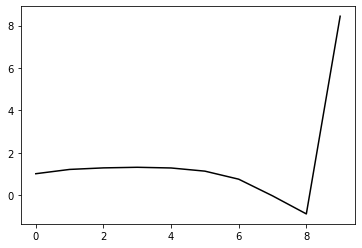

319000 0.20615694767872728
0.3904472907125714 -0.6058308091240959 -0.12367494690951245 -0.09610106672463721
[ 1.09327598  1.03720274  1.11100152  1.14408101  1.11277219  0.96608257
  0.59145545 -0.18706194 -1.03722383  8.48920477]


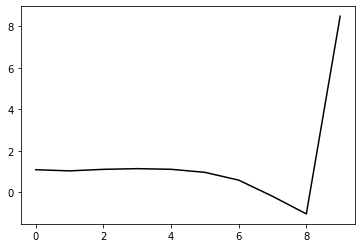

320100 0.18428929273618969
0.3929111515701246 -0.6041447841376921 -0.12339326599207917 -0.09671375818512244
[ 1.07200483  1.14191926  1.20872768  1.25132369  1.23333604  1.09752251
  0.73191267 -0.0401603  -0.8900584   8.4737903 ]


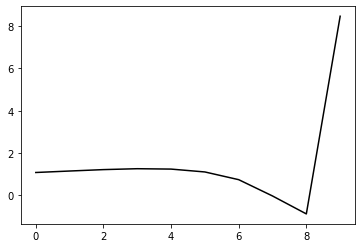

321200 0.14365476155960127
0.388223055325075 -0.6033884864475368 -0.1222564457580391 -0.0986746307438762
[ 1.08134136  1.11693868  1.17116216  1.21355171  1.20041572  1.07081078
  0.71180087 -0.05432394 -0.90358765  8.51535166]


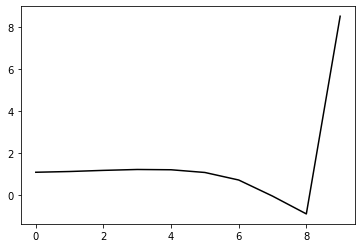

322300 0.29109131016084855
0.384257328640797 -0.6077693178423742 -0.12613668527788205 -0.09362666278547521
[ 1.05208527  1.04925303  1.06580116  1.08597507  1.05814843  0.91633799
  0.54634931 -0.23026407 -1.09412159  8.45133612]


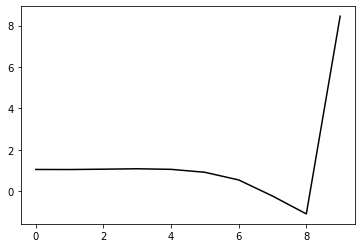

323400 0.19889935183485194
0.3917066202924928 -0.5970545037557637 -0.12097754123349427 -0.09418857182194232
[ 1.02784764  1.17821903  1.19359818  1.20027315  1.16650481  1.02072702
  0.64520577 -0.1399395  -1.01965967  8.48935511]


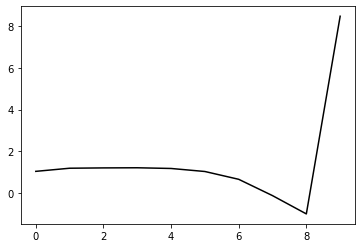

324500 0.2737999794129254
0.38517528538789364 -0.5987478359799572 -0.12407709460223496 -0.08715530772664142
[ 1.0508156   1.01897078  1.00384108  0.98914422  0.94060354  0.78878654
  0.41173031 -0.37298855 -1.25315499  8.45274615]


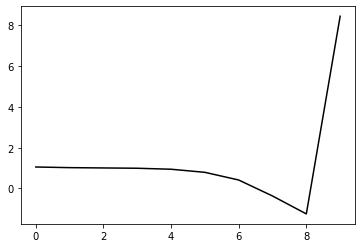

325600 0.20813383032827332
0.38702331785599103 -0.5945146359807202 -0.12018700058146402 -0.09950720500002001
[ 1.09416983  1.13826989  1.14835435  1.14243436  1.10108852  0.95758058
  0.58872556 -0.18858151 -1.06311027  8.51739067]


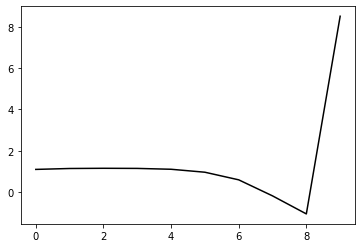

326700 0.2317733721894887
0.3892621434730519 -0.5997040660813424 -0.1255397286821421 -0.09789809409152579
[ 1.01739684  1.16996193  1.18929705  1.1805644   1.13337399  0.98734063
  0.61845105 -0.1581438  -1.03331225  8.4691703 ]


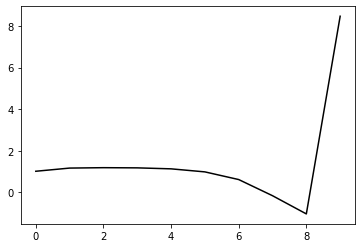

327800 0.26178170406823087
0.39332028136482733 -0.5980491131288628 -0.12587318850180723 -0.09804724848863201
[ 1.00014908  1.23968563  1.2928119   1.29461903  1.24822111  1.10204831
  0.73333693 -0.04458436 -0.92548804  8.50003087]


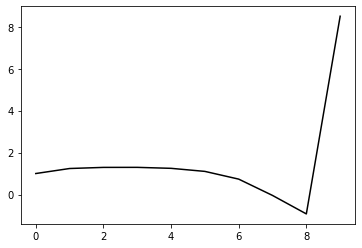

328900 0.22024881308302707
0.38727323012262277 -0.6023273536417605 -0.1290253481745614 -0.09638208758724992
[ 1.02067281  1.19080903  1.21802045  1.21652245  1.16349332  1.01135655
  0.63997113 -0.13898377 -1.02226287  8.4359186 ]


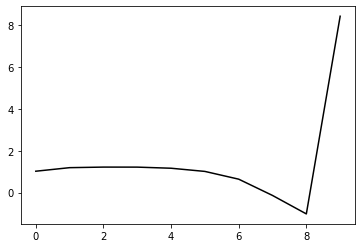

330000 0.21270935335641042
0.39086180548145494 -0.5937829194900938 -0.12415773706022105 -0.09928368483226543
[ 1.09643553  1.13758745  1.20932224  1.22191209  1.17771719  1.03177967
  0.66667663 -0.10760468 -0.9919076   8.49148037]


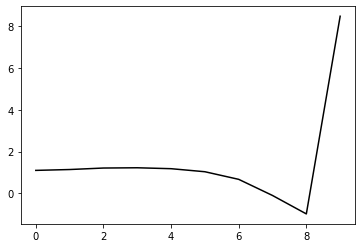

331100 0.19932036686526836
0.38224406067051464 -0.5998879468253869 -0.12796607511776445 -0.09847014231216361
[ 1.08553537  1.11836154  1.18444464  1.21709585  1.18411416  1.04498002
  0.68602406 -0.08314178 -0.96628731  8.4791423 ]


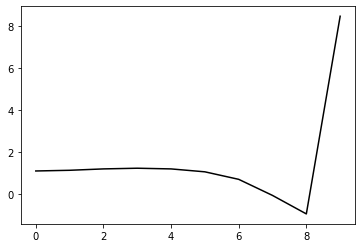

332200 0.13590344672821086
0.38123814478083023 -0.5946872664105979 -0.12472700424305203 -0.09930859545240124
[ 1.06427211  1.08503137  1.09745308  1.10840349  1.06388796  0.91273705
  0.5438493  -0.23361074 -1.12702131  8.48648739]


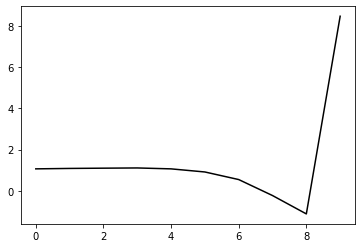

333300 0.25883924733372543
0.38550133855828456 -0.5916952475011761 -0.12407262568372492 -0.10070159786079165
[ 1.0929255   1.17950862  1.21685158  1.23186098  1.19541847  1.05025237
  0.68521057 -0.09040261 -0.98721905  8.45562476]


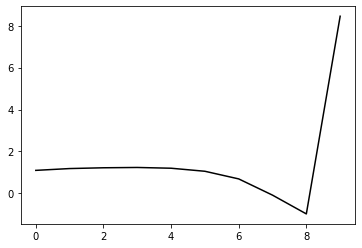

334400 0.20402502196658864
0.3876727700460727 -0.5926904792689182 -0.12694441381512225 -0.09379883791232088
[ 1.04695451  1.14717626  1.20883078  1.2207758   1.17304116  1.01613023
  0.63914487 -0.14860528 -1.06209925  8.47316278]


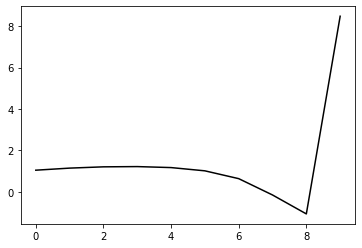

335500 0.23687268127461283
0.3841361806271559 -0.5886336010786724 -0.12342044125126818 -0.09789686416842812
[ 1.08311596  1.17999786  1.23015986  1.25295948  1.21353416  1.06273179
  0.69092703 -0.09246489 -1.00580945  8.49250902]


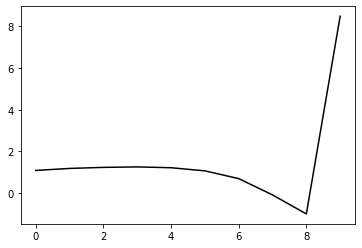

336600 0.21630848243241477
0.37213890633023616 -0.5882026684639279 -0.12245017209466788 -0.09600633165175695
[ 1.12603745  1.01035519  1.01761123  1.01991799  0.96586965  0.80245541
  0.42044155 -0.37101133 -1.29291534  8.43695431]


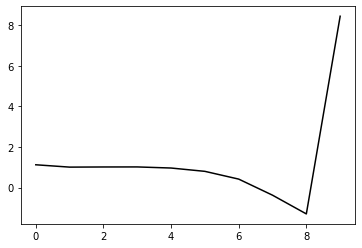

337700 0.22429412650224154
0.3806267738277199 -0.5878788517700436 -0.12408607009564072 -0.09809512610925894
[ 1.09051909  1.14071265  1.15721538  1.15882765  1.10952319  0.95040831
  0.57223304 -0.2149212  -1.13340436  8.49055599]


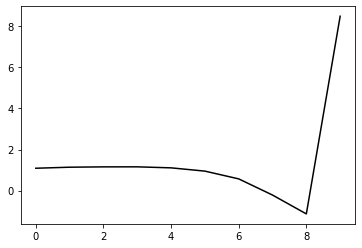

338800 0.19521452080559573
0.38997716254294756 -0.5858130494457949 -0.1250625958316898 -0.09869075148222364
[ 1.03280831  1.26807396  1.33346353  1.34289147  1.29555194  1.13752861
  0.75892167 -0.02982892 -0.95371731  8.50867638]


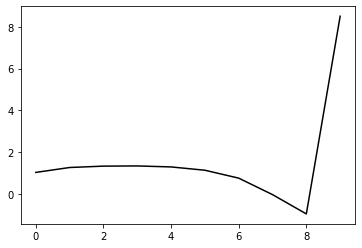

339900 0.21457704127589622
0.3903540224380325 -0.5832038813498851 -0.12516892615324154 -0.09293672488070925
[ 1.00699175  1.16565014  1.21711223  1.22641569  1.16940053  1.00080228
  0.61174741 -0.18791866 -1.12785029  8.44795712]


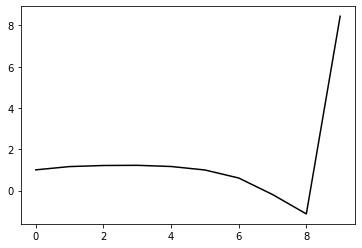

341000 0.23899181541577103
0.38372640099859595 -0.5836114381455942 -0.12472514374526365 -0.09550124782652357
[ 1.12068155  0.9976429   1.05246949  1.07516555  1.034729    0.88124536
  0.50710113 -0.27749751 -1.2039862   8.48828823]


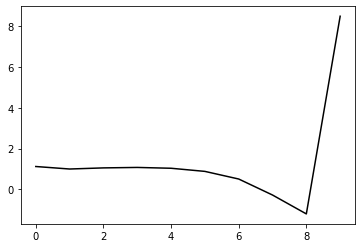

342100 0.18965596028316134
0.38688664517184257 -0.5837363321924859 -0.1258893018987297 -0.09760494284012344
[ 1.07508907  1.15528204  1.21162036  1.24011449  1.20751199  1.05899662
  0.68766243 -0.09529725 -1.02327154  8.47110881]


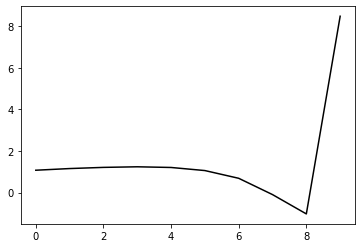

343200 0.14220730328595518
0.37427255760632566 -0.5882791845799026 -0.12734693562928956 -0.09836299148479412
[ 1.08061523  1.0339972   1.0693548   1.09064773  1.05497574  0.90530997
  0.53391981 -0.24752987 -1.17504899  8.45765835]


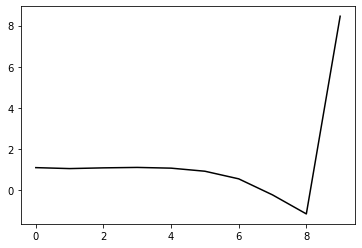

344300 0.259229989480675
0.37989311643807655 -0.5827609380826725 -0.12504118949862422 -0.10058613179036278
[ 1.09552402  1.14409357  1.17713211  1.20212722  1.17535965  1.03376474
  0.66792099 -0.11041095 -1.03973804  8.48715392]


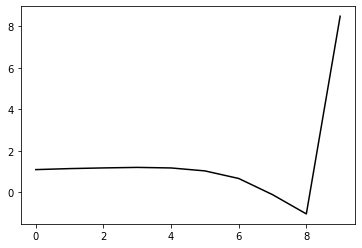

345400 0.15662504857896042
0.39290141397832207 -0.5727995149456512 -0.12220618539736738 -0.09739939977347645
[ 1.0218275   1.26998459  1.34096634  1.36190672  1.32763705  1.17813119
  0.80174855  0.00983342 -0.94015218  8.486432  ]


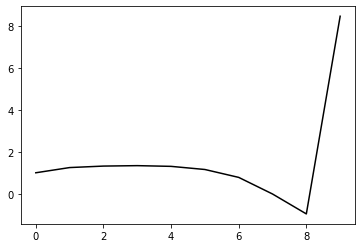

346500 0.26645615278887563
0.38376310578497447 -0.582838403397338 -0.1288849273306686 -0.09305216301060366
[ 1.0465696   1.05782386  1.11295698  1.13840665  1.10696533  0.96318694
  0.59460517 -0.18786845 -1.12860651  8.45825902]


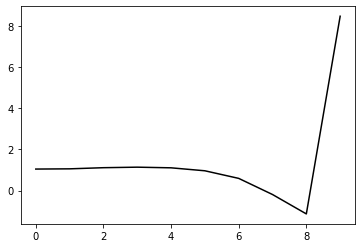

347600 0.21652123774968624
0.3816699649803246 -0.5808352512040372 -0.12772594930956685 -0.09452872274752248
[ 1.07226237  1.05935791  1.10893576  1.13837544  1.116096    0.98227302
  0.6232081  -0.15105343 -1.08763166  8.50490102]


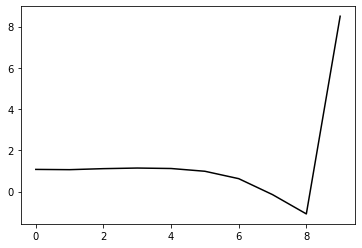

348700 0.21612874923337536
0.38024377862166364 -0.5763431852255112 -0.12380590678397713 -0.10037030840669822
[ 1.09856746e+00  1.14818791e+00  1.20274665e+00  1.24129726e+00
  1.23027065e+00  1.10791967e+00  7.59115477e-01 -6.57426224e-03
 -9.38677102e-01  8.48121058e+00]


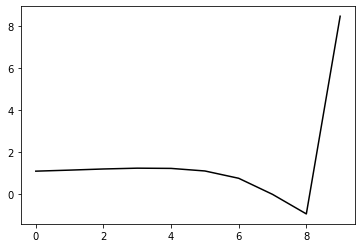

349800 0.18992254694141375
0.38581894510987813 -0.5732130771793434 -0.12425485680584493 -0.09625078267776872
[ 1.04589207  1.14707773  1.2106145   1.24142828  1.22140237  1.09079707
  0.73347895 -0.04172666 -0.98775349  8.48286139]


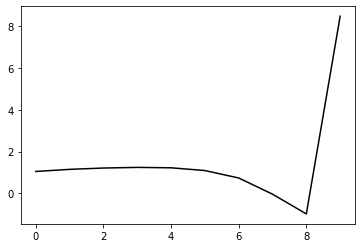

350900 0.22158199576613272
0.3800685809265867 -0.577675524328523 -0.1265882233291188 -0.09627134657034275
[ 1.04273502  0.98406715  1.05362102  1.1005195   1.09379707  0.97862423
  0.63818413 -0.11973985 -1.05014026  8.46057931]


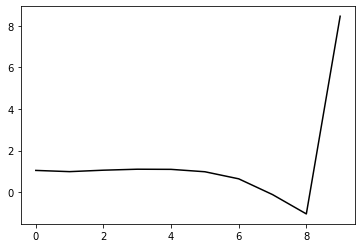

352000 0.21108328710892912
0.378010089972372 -0.5783269543580013 -0.1274348536730807 -0.09719303698420471
[ 1.11147314  1.03339503  1.0621927   1.10193387  1.10446914  0.99954485
  0.66919442 -0.07963031 -1.00390795  8.50941907]


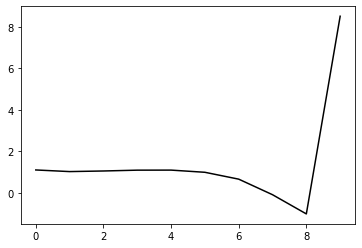

353100 0.19363166068735901
0.3770381606085135 -0.5730271041773976 -0.12386440237597636 -0.09898089028903506
[ 1.11867666  1.07400632  1.10976892  1.13908457  1.13713957  1.03250492
  0.70273138 -0.04679267 -0.97620188  8.46349036]


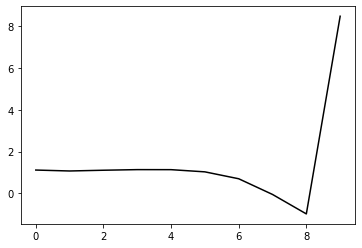

354200 0.13731276776862794
0.37999345083584773 -0.5714038021297905 -0.12406550550481513 -0.09828165886523008
[ 1.0786559   1.13678178  1.18322857  1.21142191  1.20572221  1.10159169
  0.77373475  0.02506949 -0.90835625  8.51065402]


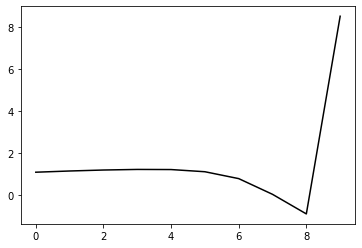

355300 0.28967717981225255
0.35961465203645027 -0.5879944474139713 -0.13437377989963017 -0.09230506318570893
[ 1.10017229  0.95369588  0.96600031  0.98281356  0.96678332  0.85737754
  0.52895292 -0.2175565  -1.14865725  8.46127017]


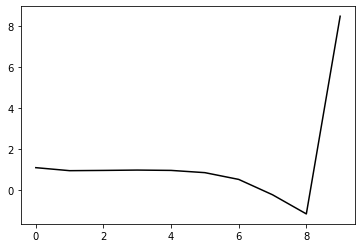

356400 0.2081948394600363
0.37276381099325784 -0.5732910991830354 -0.1258110751254926 -0.09718090705934308
[ 1.08004112  1.11379894  1.10669676  1.10744305  1.08063261  0.96248423
  0.62708473 -0.12607111 -1.06575289  8.49403286]


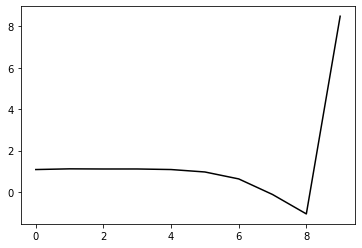

357500 0.2478404719513922
0.3773588087073842 -0.5758261983648549 -0.1296125119161985 -0.0946221832417566
[ 1.07924337  1.04670344  1.07764119  1.08155015  1.05573245  0.94223945
  0.61421656 -0.13095543 -1.0642954   8.45674264]


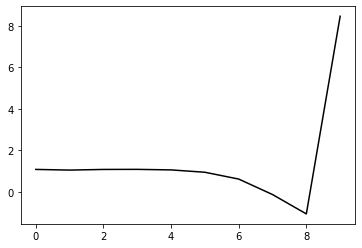

358600 0.20567598733876985
0.37017860827600335 -0.5692351107633336 -0.123546821272257 -0.10005633933818939
[ 1.10443506  1.0620038   1.05982114  1.05296828  1.01414227  0.89067967
  0.55675758 -0.19233671 -1.13045148  8.47273321]


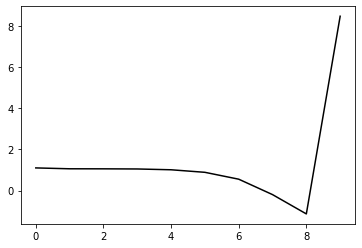

359700 0.20659831572904247
0.38442354462216466 -0.563397684347652 -0.12254312049660745 -0.09837158117405945
[ 1.08293989  1.19432567  1.23470265  1.22822874  1.18415266  1.05514564
  0.71731041 -0.03598838 -0.9820767   8.45594398]


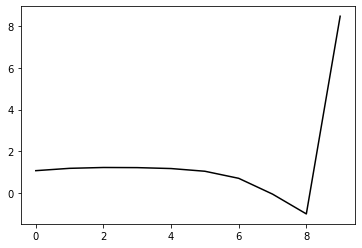

360800 0.3477977194336583
0.3881601296938909 -0.5678951597445453 -0.12796809597680417 -0.09608381112857561
[ 0.97930367  1.25363142  1.31608498  1.32146554  1.27590089  1.14261879
  0.80218441  0.04691732 -0.90379383  8.50733199]


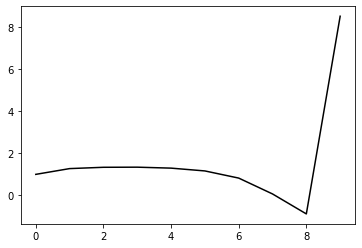

361900 0.21864626128355333
0.38820813529061693 -0.5655765122854249 -0.12693574602306043 -0.09636755562887782
[ 1.01075074  1.22175974  1.30279666  1.32429725  1.28608092  1.15591021
  0.82002136  0.07014127 -0.87809335  8.49035944]


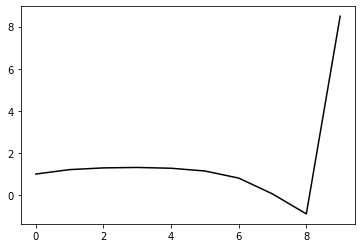

363000 0.2773731791980058
0.37519919885012576 -0.5663230975599431 -0.12529291381704732 -0.10053517902848313
[ 1.14994357  1.02804599  1.08924342  1.12541046  1.10123579  0.98160885
  0.65819416 -0.07708163 -1.01203727  8.51257723]


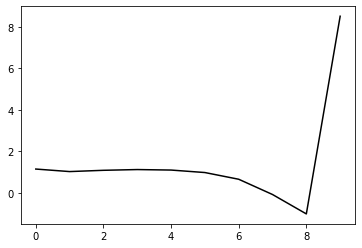

364100 0.3049505367054713
0.3693599187185705 -0.562947478787288 -0.12210938312286161 -0.10286086986562239
[ 1.11801667  1.06954199  1.0891121   1.10352537  1.06669077  0.93230337
  0.59463656 -0.15355847 -1.10330044  8.42389586]


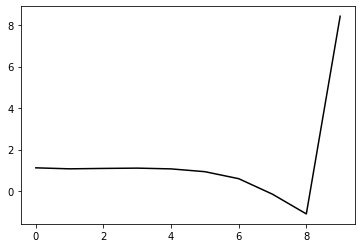

365200 0.1366927159531487
0.3729077109477501 -0.5665315237503102 -0.1269542220085511 -0.09881247276405641
[ 1.08681003  1.1487246   1.16895958  1.17400605  1.13352139  0.99522302
  0.65372097 -0.09706389 -1.05030906  8.48474337]


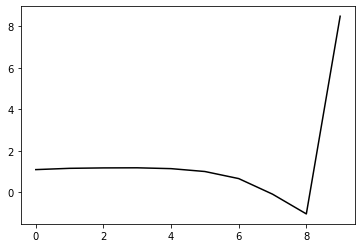

366300 0.2573346458016181
0.3748080403025445 -0.564233160139068 -0.12585701284421957 -0.10045029265836504
[ 1.08931508  1.16568769  1.20682163  1.21612729  1.17809775  1.04263206
  0.70362272 -0.04381284 -0.9958767   8.46656581]


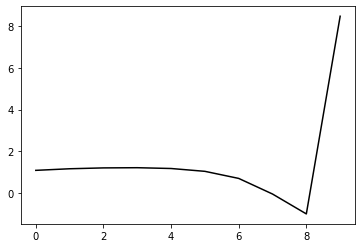

367400 0.17768877380534573
0.381484533958897 -0.5605792040330556 -0.1255028175335101 -0.0973660409831039
[ 1.02229768e+00  1.22037717e+00  1.28608105e+00  1.29943969e+00
  1.25428108e+00  1.10949168e+00  7.60262086e-01  2.89247924e-03
 -9.63189423e-01  8.52092075e+00]


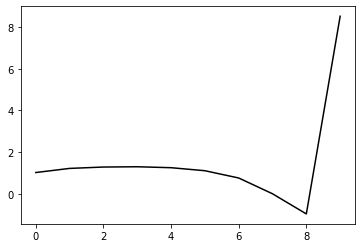

368500 0.2590751082240378
0.37489321386239366 -0.5656821098017548 -0.128689878976981 -0.0972756403015451
[ 1.0538044   1.15234813  1.18880244  1.20183265  1.15721576  1.01141569
  0.66272856 -0.09041446 -1.05044659  8.48285007]


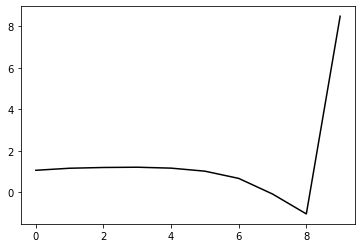

369600 0.21200164234262364
0.3699970453423191 -0.5612137326799511 -0.1247843370757027 -0.10113339069739546
[ 1.11035687  1.1446081   1.17800962  1.19262423  1.15096379  1.00541029
  0.65529487 -0.0991731  -1.0631786   8.47530355]


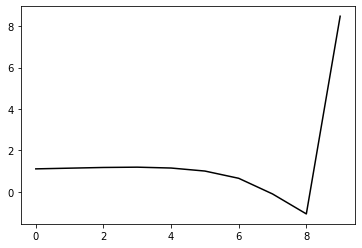

370700 0.2115648127371996
0.3772095922540334 -0.5591983187859145 -0.12558987045688952 -0.10065081914612062
[ 1.09566712e+00  1.23024291e+00  1.28647468e+00  1.29975943e+00
  1.25750621e+00  1.10985429e+00  7.56357966e-01 -9.59126386e-04
 -9.69381314e-01  8.43282467e+00]


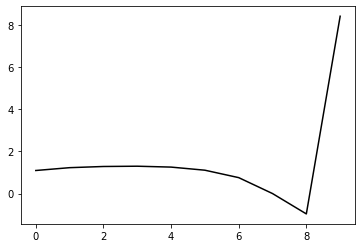

371800 0.19684338105082713
0.37885351119357324 -0.5587993211632435 -0.12677364888640966 -0.09850208819545433
[ 1.03137316  1.24978617  1.32288794  1.34184812  1.29829396  1.14821109
  0.79126629  0.03058886 -0.94400285  8.49457427]


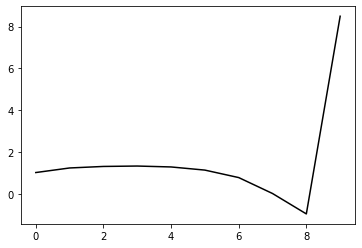

372900 0.21785171059462735
0.36817472480586244 -0.5665397849376004 -0.13149845389430675 -0.09546488024038144
[ 1.06854863  1.05500223  1.12746177  1.16171641  1.12823295  0.98564892
  0.6349373  -0.11927668 -1.08871248  8.45578905]


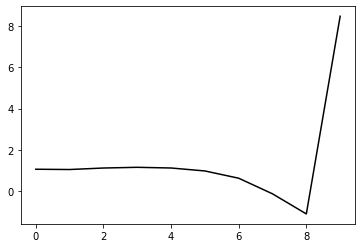

374000 0.22085238587751707
0.37682715995335125 -0.5556404492055451 -0.1259014728725233 -0.09810285415623905
[ 1.11561224  1.13141334  1.21163954  1.2498327   1.22299978  1.08291425
  0.7316006  -0.02483651 -1.00039992  8.51191662]


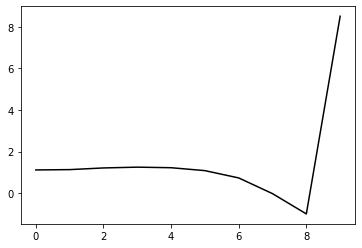

375100 0.19030389771217984
0.3672405159813442 -0.5608120442641632 -0.1290045705433569 -0.0964325481379241
[ 1.11262069  1.08962863  1.14671654  1.19644951  1.18227931  1.0519346
  0.70712987 -0.04421494 -1.01729143  8.45370955]


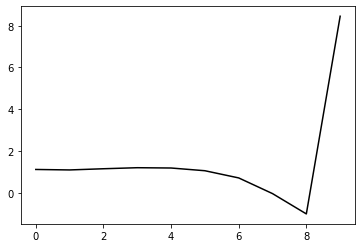

376200 0.13086818863080846
0.3807286268130869 -0.5492269803028302 -0.1243776354933795 -0.0962446872944856
[ 1.04480278  1.19679072  1.27593436  1.31685159  1.29725406  1.1601431
  0.80538368  0.04216773 -0.94722063  8.52556278]


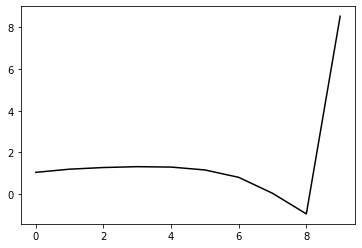

377300 0.27132925728317764
0.36230371436852793 -0.5583697896213622 -0.12827416061211577 -0.09743053439235747
[ 1.10924241  1.06050655  1.10479827  1.14313045  1.12366619  0.98964759
  0.63941726 -0.11697663 -1.09765869  8.46423606]


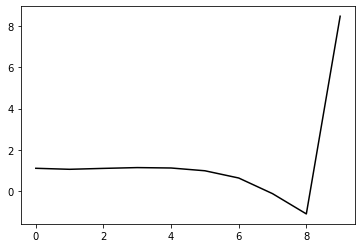

378400 0.20213184504005055
0.3656658461415708 -0.5552180662123619 -0.12760233069602914 -0.09674962760521136
[ 1.07835749  1.11289772  1.13460972  1.16207713  1.1403639   1.00518541
  0.65257265 -0.10675197 -1.092156    8.46563853]


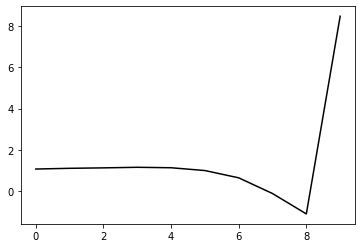

379500 0.23359452159765667
0.3624354044559258 -0.5613784939559806 -0.13232203476280052 -0.09572290305914977
[ 1.0864631   1.10826998  1.14366696  1.17040859  1.15227882  1.02305937
  0.67579713 -0.07812386 -1.05837367  8.47734482]


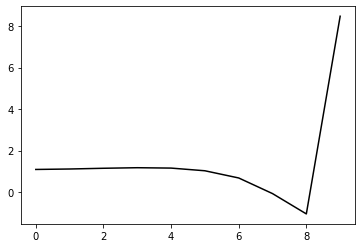

380600 0.21343722649561242
0.36886884512009604 -0.5536689558779281 -0.12795103161516236 -0.10139068542961874
[ 1.11630186  1.21440464  1.27766722  1.307616    1.29220175  1.16738106
  0.82314983  0.07072292 -0.91053066  8.48073357]


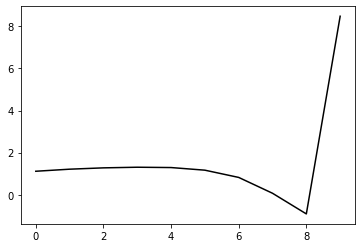

381700 0.21914191163988028
0.36373348129024546 -0.5534650421159316 -0.1284357432951794 -0.09697908987294217
[ 1.09712707  1.12129555  1.15370858  1.17273491  1.14419047  1.00939431
  0.6564466  -0.10429602 -1.09493427  8.43159724]


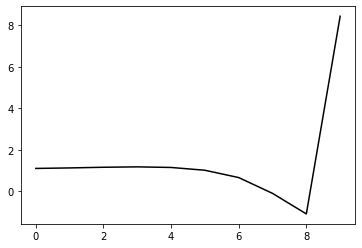

382800 0.2769397443860462
0.374891508286761 -0.5505274482659834 -0.1292203835123278 -0.09672309711102466
[ 1.00772951  1.2785129   1.34338012  1.36194676  1.32866728  1.188681
  0.82944301  0.06052446 -0.94175413  8.49400528]


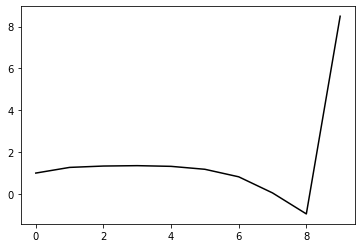

383900 0.21317571693013285
0.37277852186626476 -0.5519111151679088 -0.130864277540966 -0.09455004064085176
[ 1.06447578  1.13784785  1.20822861  1.23022107  1.19288622  1.04922593
  0.68852877 -0.08006488 -1.08110446  8.47473031]


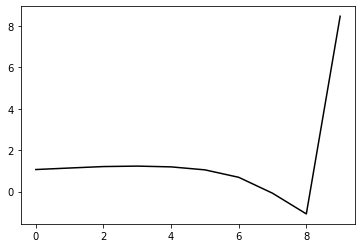

385000 0.197245002239626
0.37161029210364027 -0.5473326560118242 -0.12787921656884366 -0.09633296788120356
[ 1.09607079  1.11914226  1.20182136  1.23918747  1.21381958  1.07827664
  0.72372051 -0.04136845 -1.0430624   8.49375596]


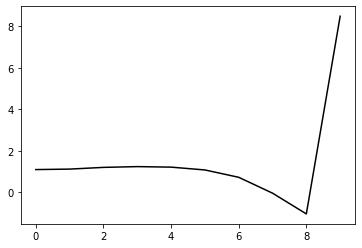

386100 0.19023364606880025
0.3617053972909203 -0.5499799611447346 -0.1277464070168476 -0.0988651617848339
[ 1.12712819  1.06831807  1.12852842  1.17604907  1.16274801  1.03859756
  0.69626288 -0.0555262  -1.04308624  8.487782  ]


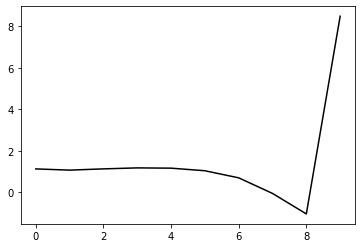

387200 0.21356427633189518
0.37235387866159975 -0.5441905422059166 -0.12755696513254478 -0.09471856643408903
[ 1.00389218  1.14533066  1.20303201  1.23437522  1.21111201  1.07589609
  0.72048089 -0.04706658 -1.0562675   8.49606472]


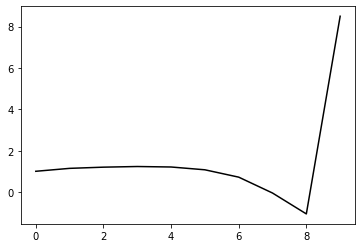

388300 0.2783769321944759
0.3592675525184207 -0.5486898446369695 -0.12912925448878282 -0.09797091556390282
[ 1.09110734  1.08068727  1.08697642  1.105972    1.0779593   0.94060749
  0.58462303 -0.18186585 -1.18839427  8.46356259]


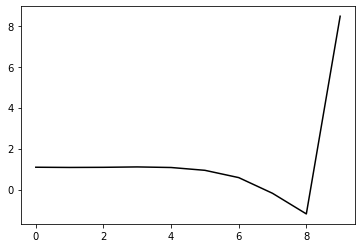

389400 0.2121289516306993
0.362646761016421 -0.5463111606675126 -0.12845151205376917 -0.09881152379183243
[ 1.06363474  1.11446265  1.11480592  1.11926848  1.085077    0.94484566
  0.58687071 -0.18091763 -1.18859442  8.44729367]


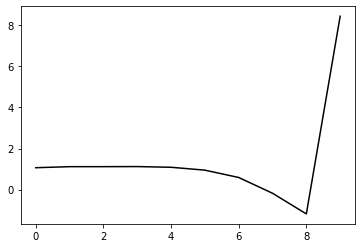

390500 0.23370005170977654
0.36733592075403654 -0.5430115213637926 -0.12732750830275233 -0.10133389689294733
[ 1.07330157  1.2401489   1.27316442  1.2768875   1.23966146  1.09855085
  0.73960263 -0.02962296 -1.03987133  8.46336352]


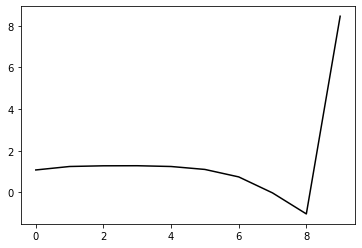

391600 0.20666519890448615
0.36597232708518307 -0.5447331073618267 -0.12871169040281052 -0.10156278056790045
[ 1.09210811  1.15567107  1.20772675  1.22233557  1.19028822  1.05619828
  0.70506148 -0.05635126 -1.05912151  8.50087012]


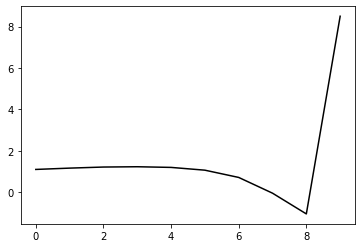

392700 0.2390953944737102
0.367671930472032 -0.5457140753229404 -0.13110646289340352 -0.0978450385901649
[ 1.00167984  1.10850723  1.15775421  1.16892271  1.12722777  0.98437964
  0.6263138  -0.14152654 -1.15184792  8.47104108]


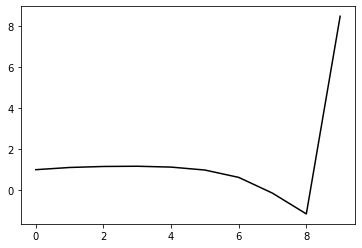

393800 0.1868696335228809
0.36877977845480425 -0.5422546587526187 -0.12926235551009135 -0.09846919855932208
[ 1.05868571  1.14866026  1.20050572  1.21979351  1.18536777  1.04756563
  0.69415809 -0.07005945 -1.0787164   8.52534312]


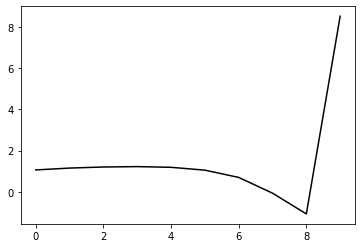

394900 0.232381073649563
0.35544435653227224 -0.5505052715870912 -0.1329200206826021 -0.09872369694088046
[ 1.09301119  1.02094405  1.06301703  1.08221891  1.04639135  0.90849204
  0.55815106 -0.2002697  -1.20118865  8.43593508]


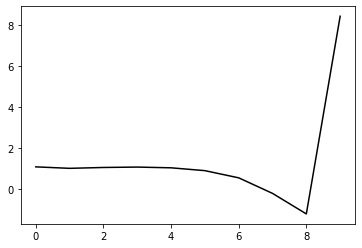

396000 0.18781920230069002
0.3666384924761824 -0.540382928577425 -0.12889001358576474 -0.09862718779812127
[ 1.0745335   1.12504447  1.17479591  1.1913091   1.1549175   1.01384559
  0.65860124 -0.10703698 -1.11983248  8.47880623]


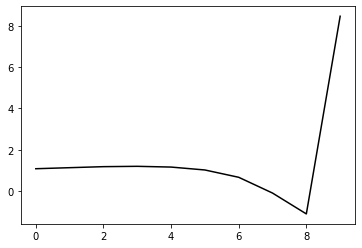

397100 0.40520341834549306
0.3571534768678302 -0.5336567484936939 -0.12230204753798325 -0.10391065125974802
[ 1.13354158  1.00826049  1.05954371  1.07490096  1.03379482  0.88856986
  0.53059949 -0.23651485 -1.250964    8.41312564]


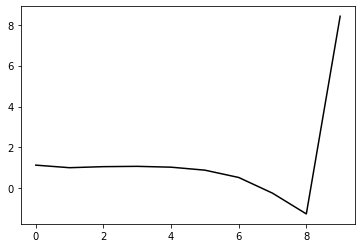

398200 0.1534093367992782
0.36318632126829764 -0.5372964336264531 -0.12709268007447738 -0.10269827223714095
[ 1.07752118  1.15092476  1.18494561  1.19389033  1.14821465  0.9978605
  0.6356042  -0.13446302 -1.15110526  8.47693121]


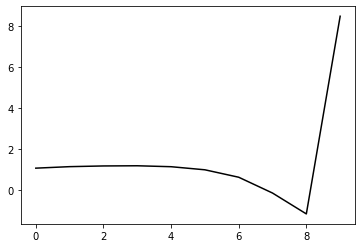

399300 0.3051044543081934
0.3702131603633358 -0.5375832916007689 -0.13037353906064894 -0.09710934599115881
[ 1.01772491  1.14568121  1.20650956  1.21528877  1.16482841  1.00841394
  0.63942048 -0.13807662 -1.16457023  8.44383132]


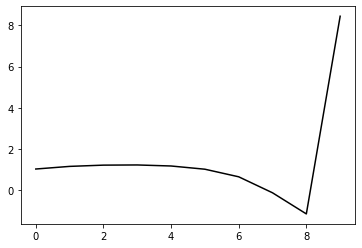

400400 0.22426094943409702
0.3547492056440641 -0.5404847325840432 -0.12947916272755522 -0.10076704041024717
[ 1.09721332  1.04623667  1.08147173  1.10159106  1.0611463   0.9138183
  0.55417934 -0.21337637 -1.2298056   8.46037929]


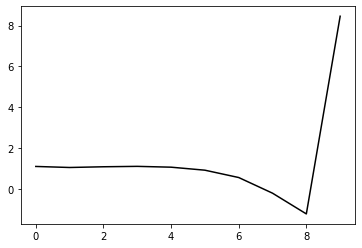

401500 0.26353543620162667
0.3651178565710388 -0.5386536767935116 -0.1323117315926383 -0.09600862467027897
[ 1.03722337  1.12471963  1.15996864  1.1679063   1.11903213  0.96197582
  0.59170584 -0.18736344 -1.21814295  8.4545946 ]


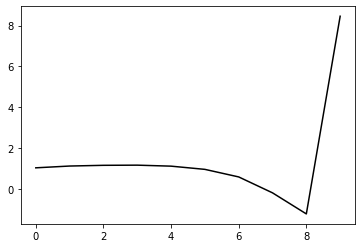

402600 0.21347077853294744
0.36700654592133514 -0.5341208025779401 -0.12912786681895233 -0.10190084084186894
[ 1.06706839  1.1848485   1.24463699  1.26398044  1.22528503  1.07721431
  0.71474624 -0.05698717 -1.08113934  8.50763266]


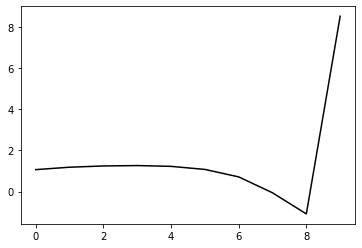

403700 0.24335766577917067
0.36962224956339135 -0.5343039399393064 -0.1308546630469542 -0.09892666335562064
[ 0.99426419  1.10522798  1.18339581  1.20832582  1.16888487  1.01919613
  0.65482849 -0.11854822 -1.14510362  8.47753219]


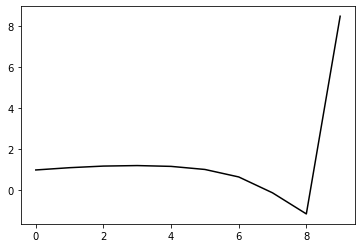

404800 0.21409854850652055
0.364978340834385 -0.535725093455837 -0.13146188738270023 -0.10027731066656989
[ 1.02285273  1.18361053  1.23580154  1.27094849  1.24335713  1.1027964
  0.74587507 -0.02099461 -1.04234513  8.46433085]


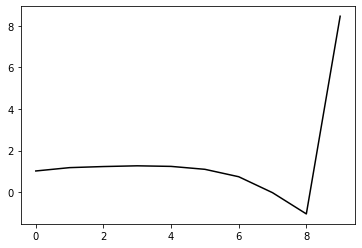

405900 0.22987574077740633
0.36394051488577317 -0.5349913761963675 -0.13102438389664411 -0.10196392966108549
[ 1.06637481  1.15842877  1.21468602  1.24714542  1.2223214   1.08412025
  0.72874718 -0.0366239  -1.05702941  8.49804753]


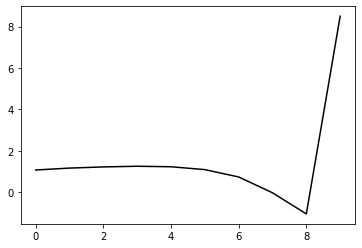

407000 0.18668762932070068
0.3674585091875528 -0.5334412880312082 -0.13160174030529678 -0.09945338689178393
[ 1.03152176  1.13695259  1.21093728  1.24547576  1.22108331  1.0840682
  0.72901279 -0.03660172 -1.05887483  8.43310936]


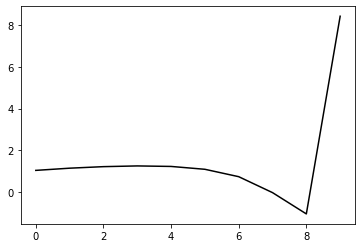

408100 0.2469671717481246
0.3552779435113114 -0.530216769761934 -0.12676949109400618 -0.10541711275204609
[ 1.11922078  0.99390737  1.02779885  1.06112719  1.04113001  0.91009967
  0.56134858 -0.19751185 -1.21311102  8.43552606]


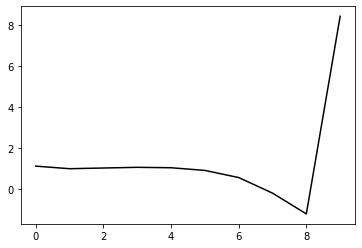

409200 0.15215226465326354
0.3640543085641588 -0.527567444886176 -0.12784603894875388 -0.1016010878796585
[ 1.08487582  1.16561055  1.18495995  1.19576472  1.16526303  1.0256312
  0.66766272 -0.10085577 -1.12753849  8.48104278]


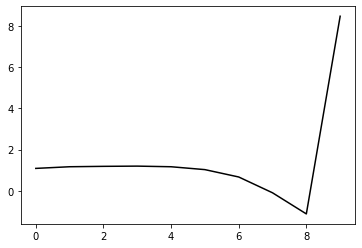

410300 0.2578073266015849
0.361181390802059 -0.5290769339601382 -0.12888768553991162 -0.10302731524695904
[ 1.08451981  1.13710946  1.17243669  1.19186657  1.17047207  1.04472358
  0.70045645 -0.05596974 -1.07304641  8.45556103]


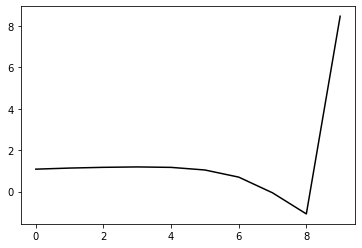

411400 0.21462376087192916
0.3534113798581198 -0.5353556894823152 -0.13323688161283165 -0.09897483863429843
[ 1.06888951  1.06498037  1.07977719  1.08903475  1.05557092  0.92116536
  0.57065314 -0.19037895 -1.21080144  8.45132138]


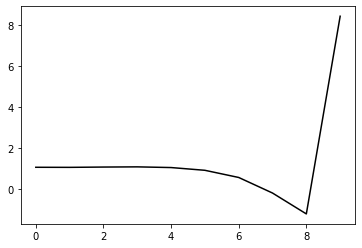

412500 0.24929477592461713
0.36000288930180635 -0.5314928355274846 -0.13225461590906867 -0.10116104033221701
[ 1.07577522  1.11333666  1.1421946   1.15264564  1.12211407  0.99185158
  0.64588498 -0.11117921 -1.12864751  8.46837387]


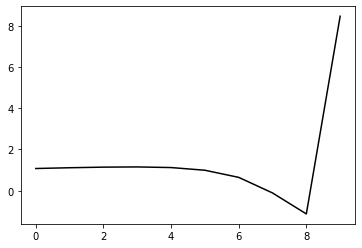

413600 0.21338142733537271
0.3647157780397853 -0.5268077078331809 -0.1305125223292396 -0.1007137505450022
[ 1.05186355  1.16888953  1.21637457  1.22440833  1.18642032  1.04948239
  0.69746257 -0.06671477 -1.09403598  8.47022333]


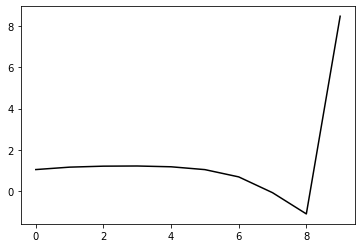

414700 0.21704160162867106
0.35904499826087766 -0.52745933151592 -0.13046132729567325 -0.10092216862990495
[ 1.0880672   1.11300512  1.16858816  1.19019135  1.15846546  1.02654245
  0.67979942 -0.0801952  -1.10559311  8.45893153]


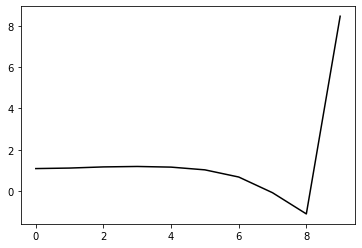

415800 0.20005141717120184
0.3593187444100934 -0.5285327719945392 -0.13212372932122712 -0.10022093999140935
[ 1.03195157  1.19687993  1.22516315  1.23740022  1.19649549  1.05362198
  0.69641827 -0.07402619 -1.11118016  8.45674049]


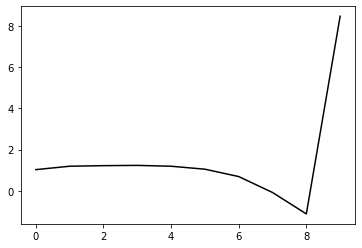

416900 0.24257716538555346
0.354555349740171 -0.5234443449276611 -0.12837683527684343 -0.09963844186322769
[ 1.07346793  1.10770672  1.10811328  1.09776804  1.03949509  0.88074297
  0.50998404 -0.2722828  -1.32087501  8.43740255]


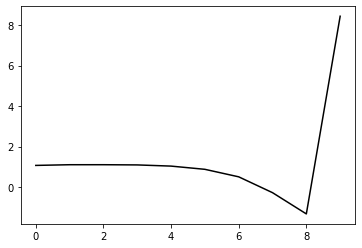

418000 0.17795133430288979
0.3574063064800585 -0.5289291625252615 -0.13382571263899817 -0.09695741224462077
[ 1.04386019  1.08699064  1.12725283  1.13106415  1.08373443  0.93600075
  0.57654402 -0.19442019 -1.23202501  8.47447154]


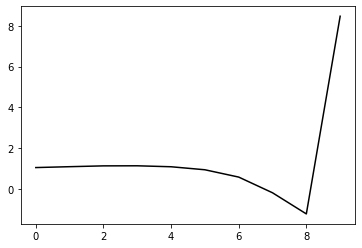

419100 0.18702173777661021
0.3579263044454809 -0.5241631075551665 -0.13055131048044882 -0.10195458030605656
[ 1.1134695   1.15583325  1.19787791  1.21359989  1.17726876  1.03789337
  0.68610437 -0.07737495 -1.10767983  8.46950052]


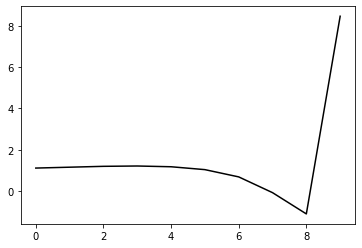

420200 0.16194528351416057
0.35502110780734697 -0.5278790389437676 -0.1341822947611836 -0.09657686342650601
[ 1.05714541  1.09100209  1.1564954   1.1668551   1.11715417  0.96345381
  0.59741324 -0.18074885 -1.22893305  8.43867589]


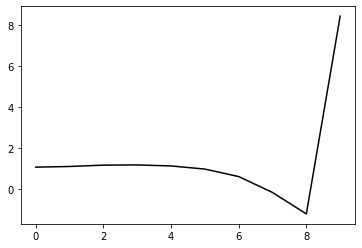

421300 0.28814029955061443
0.34436024218342715 -0.532335865085394 -0.13721254812633704 -0.09377222019828411
[ 1.07035558  0.99835824  1.0182298   1.02224212  0.96768932  0.81001829
  0.44213398 -0.33614974 -1.38388003  8.43305767]


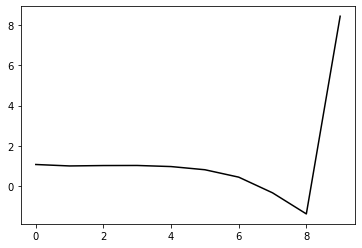

422400 0.19046472069921122
0.36059363976804887 -0.5189376648455637 -0.13018476204283835 -0.09873318488956952
[ 1.0487149   1.22672036  1.25100409  1.23946648  1.17328002  1.00347256
  0.62427589 -0.16421964 -1.22238915  8.43464824]


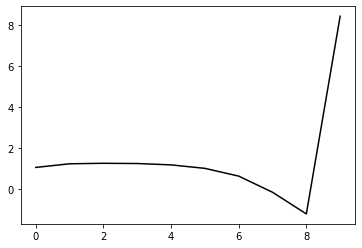

423500 0.2539747017340904
0.3634803345781016 -0.5200467004725537 -0.1318641055505549 -0.0985903286478329
[ 1.06432791  1.21988625  1.29237127  1.30081999  1.24377762  1.08089752
  0.70826525 -0.07299855 -1.12345549  8.46575557]


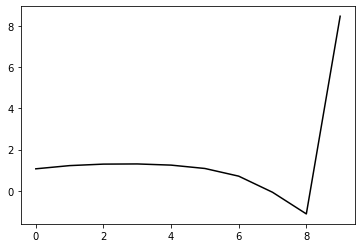

424600 0.20037313080676994
0.3567845879695694 -0.5194665583615111 -0.1306036471967035 -0.09798880748084547
[ 1.09850452  1.09594987  1.15935339  1.16994849  1.10639047  0.93362686
  0.55118431 -0.23911742 -1.29953775  8.44124612]


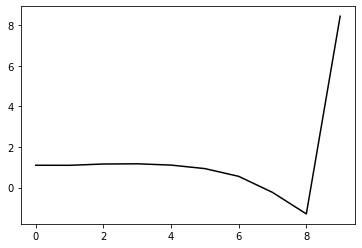

425700 0.20869814973505532
0.3612542199684806 -0.518204026838474 -0.13076083012570655 -0.10045321450799184
[ 1.0709042   1.21632486  1.3010699   1.33441635  1.29159431  1.1337619
  0.76337097 -0.01628031 -1.06819499  8.46414418]


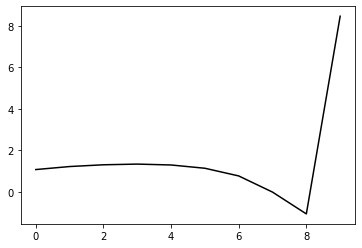

426800 0.20364820102942263
0.35315284203501207 -0.5264959294800718 -0.1366290624298869 -0.09529757094616188
[ 1.10121349  1.02768371  1.1092873   1.14664694  1.10699575  0.95006364
  0.57993082 -0.19868335 -1.24973481  8.46043362]


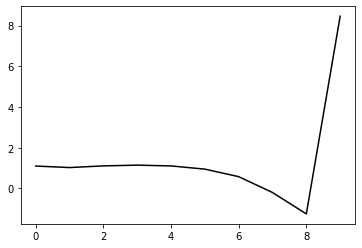

427900 0.21041354423200045
0.3638928834924099 -0.5186019534189411 -0.13411578389258577 -0.09476317665694292
[ 1.06619617  1.18077119  1.24625067  1.27858022  1.23975834  1.0795149
  0.7028901  -0.08366222 -1.14531224  8.42785586]


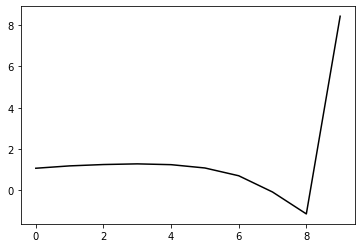

429000 0.20955673910149833
0.3603308276979494 -0.5145917515955186 -0.1306964492927631 -0.09760399815025683
[ 1.10509899  1.12407761  1.20602668  1.2462872   1.21828311  1.06791021
  0.6983667  -0.08190688 -1.13831578  8.46742098]


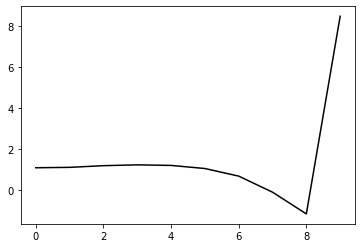

430100 0.18493445996647942
0.3548100976258427 -0.5161791058655503 -0.1310750303020223 -0.09929682706340724
[ 1.12718569  1.08410033  1.171652    1.23004465  1.21935045  1.08487728
  0.72790744 -0.04118135 -1.08718598  8.45383637]


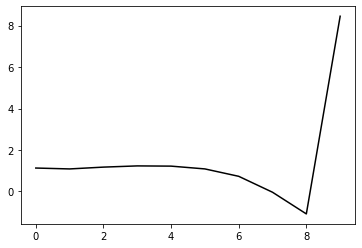

431200 0.12908771836135358
0.3546650601835673 -0.5140550174216388 -0.13027521501151057 -0.09891574014370161
[ 1.076568    1.11503398  1.16893603  1.21202972  1.19416719  1.05428166
  0.69106402 -0.08412121 -1.13674136  8.47985028]


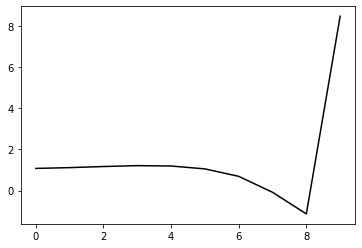

432300 0.26088339973656277
0.35908928708736365 -0.5098102551878508 -0.12892550037581163 -0.0976790318329073
[ 1.07936919  1.15778357  1.22310565  1.26531377  1.25128246  1.11574394
  0.75240954 -0.02658932 -1.08656708  8.43760937]


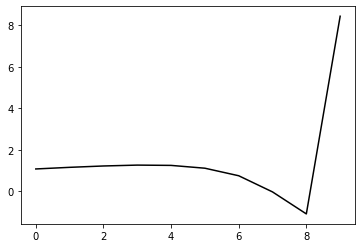

433400 0.17364125888388177
0.36499946403286027 -0.5084467171112379 -0.1293274985945541 -0.09752207107203957
[ 1.02049048  1.25667245  1.34196434  1.3910883   1.3806309   1.25042001
  0.89122618  0.11539257 -0.94152403  8.50815492]


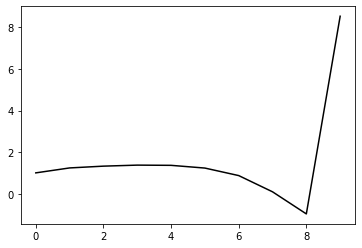

434500 0.25345242398476037
0.3531700579210754 -0.5169730537475659 -0.13371037215992307 -0.0970545109962266
[ 1.05945099  1.1809501   1.22203658  1.27168764  1.26864333  1.14826383
  0.79985781  0.03570523 -1.00718399  8.45329987]


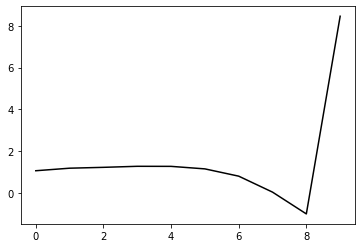

435600 0.22752223627750298
0.34428059759853114 -0.519688215323535 -0.1353662092357155 -0.09461929834494645
[ 1.09362831  1.07614122  1.08338375  1.10817443  1.09192791  0.96283075
  0.60741513 -0.16285678 -1.21112021  8.4416977 ]


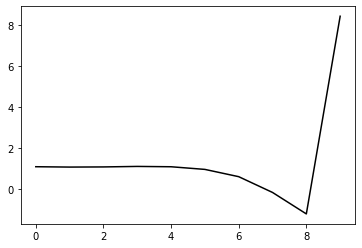

436700 0.2208066161841926
0.35140983344480947 -0.5131445476572556 -0.13191478345517713 -0.0993866743505566
[ 1.11649188  1.16970756  1.20679733  1.22934701  1.21610519  1.0931485
  0.74334707 -0.0225177  -1.06703029  8.47414755]


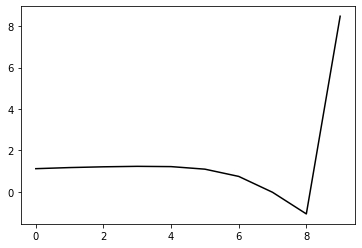

437800 0.2518695131957957
0.35563780149772384 -0.5131106171644989 -0.13374825459577366 -0.0969699729343956
[ 1.02063513  1.23463894  1.28925394  1.3087816   1.28608258  1.15709485
  0.80156051  0.02809289 -1.02681607  8.49515523]


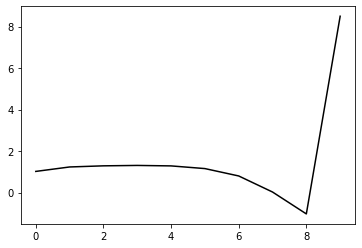

438900 0.23089709680193438
0.35986923121066466 -0.5109869192089102 -0.13434415845413714 -0.09414216380322088
[ 1.02259512e+00  1.26167337e+00  1.30542065e+00  1.31740622e+00
  1.28378589e+00  1.14504806e+00  7.80599161e-01 -2.70906024e-03
 -1.06901301e+00  8.44072184e+00]


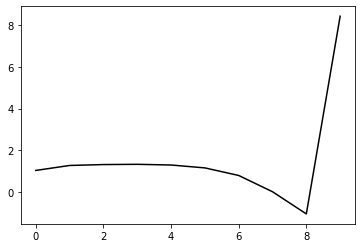

440000 0.2548709077365909
0.35322727657394154 -0.5062432697811478 -0.1297743330087555 -0.09795705979025866
[ 1.14451644  1.07932931  1.13840298  1.14762111  1.1082213   0.96604666
  0.60060235 -0.18303013 -1.24913067  8.49006304]


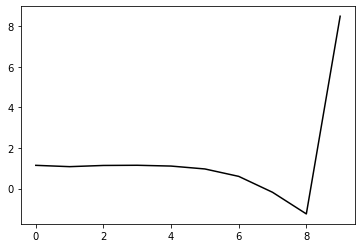

441100 0.20133535034636532
0.3526022105109579 -0.5069658474152621 -0.1313989987598784 -0.09603339414458599
[ 1.08050316  1.15471818  1.1828674   1.18246363  1.13239305  0.98120346
  0.60945608 -0.17922626 -1.24956108  8.43837733]


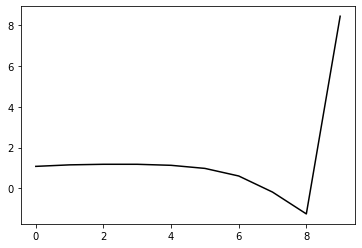

442200 0.13094041188131111
0.3526336808092556 -0.5057496069779304 -0.1304966034542526 -0.0993285286562344
[ 1.08052998  1.17074796  1.21885794  1.22705006  1.18095148  1.03273674
  0.66504267 -0.11978908 -1.1863862   8.46685447]


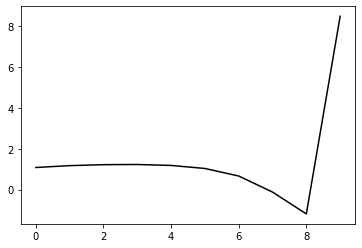

443300 0.2559919268942154
0.35644305790454456 -0.503472103119707 -0.12998798059070082 -0.09940385049320277
[ 1.08960542  1.18798915  1.26589762  1.29373727  1.25818531  1.11663606
  0.75552815 -0.02401591 -1.08702414  8.44016317]


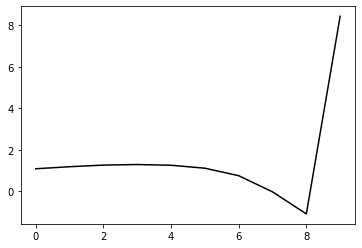

444400 0.16861456562874444
0.35640649117204365 -0.5036837299038743 -0.13081840660666602 -0.09773522263697779
[ 1.04438355e+00  1.21463052e+00  1.29204385e+00  1.32376937e+00
  1.28770482e+00  1.14240520e+00  7.77998025e-01 -4.74800619e-03
 -1.07197956e+00  8.49692554e+00]


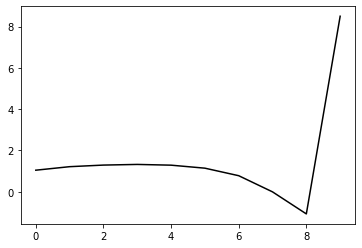

445500 0.2353009550706482
0.35507950966175855 -0.5021334135483276 -0.12992405701410675 -0.09857723197476283
[ 1.08036425  1.18068711  1.25438618  1.29358009  1.26481318  1.12361679
  0.76348243 -0.01433164 -1.07609985  8.45476319]


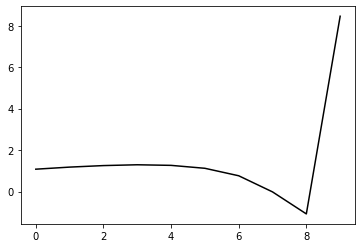

446600 0.2118814804558504
0.3560380846868393 -0.5019587517049618 -0.13034195074067453 -0.09910044821794967
[ 1.06086336e+00  1.20382613e+00  1.27956585e+00  1.32014074e+00
  1.29311091e+00  1.15025961e+00  7.87067317e-01  5.91691757e-03
 -1.05988420e+00  8.48710778e+00]


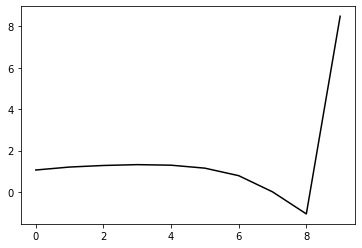

447700 0.22882072424288824
0.345231734921916 -0.5019173787427585 -0.1290099840530119 -0.09932445560175568
[ 1.10626037  1.06011476  1.08801411  1.11542696  1.08303274  0.93699157
  0.57255424 -0.20773839 -1.27092262  8.43758818]


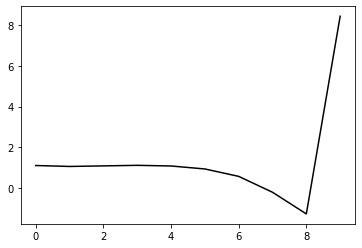

448800 0.19504193788202437
0.35232536358887195 -0.5054409536776554 -0.133705703787917 -0.09685664734866693
[ 1.05510307  1.15153687  1.19741761  1.22181308  1.19368841  1.05206694
  0.69073145 -0.08657433 -1.14661792  8.46811091]


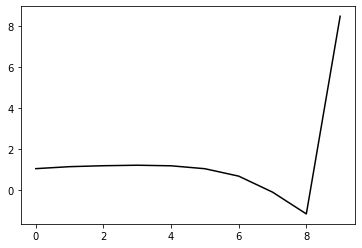

449900 0.21342169717187004
0.35908901472037086 -0.503863989896396 -0.13454869707868639 -0.09660752214509535
[ 1.02459133  1.21917889  1.2944705   1.32415749  1.2991809   1.16088371
  0.80079841  0.02313541 -1.03924787  8.46156145]


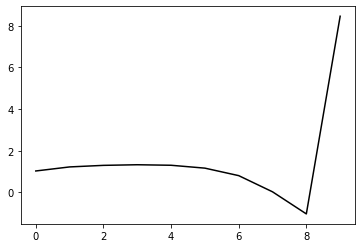

451000 0.24629413665283656
0.35062240284057217 -0.5021143900957895 -0.1317727106159552 -0.09977516616192564
[ 1.13711479  1.06107629  1.13457491  1.17193771  1.151251    1.01858842
  0.66451719 -0.10682343 -1.16268211  8.48249645]


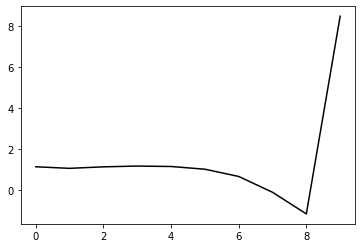

452100 0.17958120840815017
0.35109496816994956 -0.50120351047635 -0.1319452652657721 -0.09978708330215867
[ 1.10830408  1.15308778  1.20642127  1.23813197  1.21491728  1.0785319
  0.71920924 -0.05896998 -1.12389922  8.46396965]


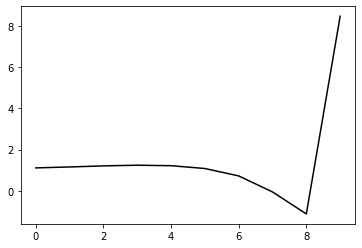

453200 0.14411751694267833
0.34917996770055904 -0.5007422631581816 -0.13156210892426867 -0.10064104273166585
[ 1.0890743   1.14247043  1.19030671  1.2208548   1.19963009  1.06766785
  0.71326404 -0.0601733  -1.12095948  8.48788605]


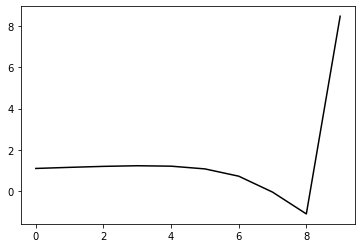

454300 0.28107130449360695
0.3382167542253719 -0.5096159322059849 -0.1366924840461475 -0.09733324555735831
[ 1.09281952  1.0003107   1.02241796  1.04439561  1.01896914  0.88599616
  0.53208574 -0.24025966 -1.2999145   8.42691581]


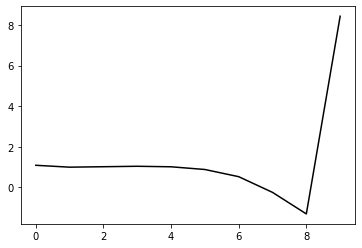

455400 0.1918257859290314
0.34956110287318487 -0.5026537216882759 -0.13458873716417608 -0.09967457524692235
[ 1.0432276   1.15603695  1.18813876  1.20425655  1.17783695  1.04538171
  0.69201321 -0.08017297 -1.14023611  8.47785502]


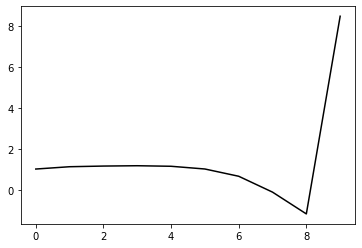

456500 0.2500796320780053
0.35483093861178183 -0.5004713281985984 -0.1344236832919048 -0.1000120277638208
[ 1.06724249  1.23205527  1.29831873  1.31844575  1.29046711  1.15803116
  0.8052496   0.03366779 -1.02572816  8.46248671]


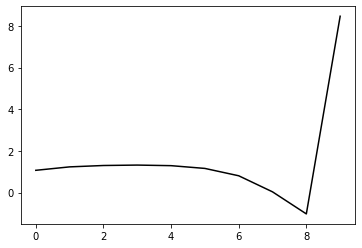

457600 0.21135824021390065
0.35509898595276074 -0.4956156887522086 -0.13179366315008087 -0.09988500020758259
[ 1.06267682  1.20041477  1.2816351   1.30611759  1.27019218  1.12891675
  0.76791873 -0.01297329 -1.08467768  8.4912209 ]


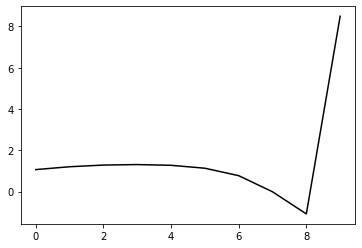

458700 0.2302837440391368
0.34547221998804456 -0.49633055406963905 -0.13117380840886894 -0.10057612936856793
[ 1.08969978  1.08688232  1.10305381  1.11293839  1.06584564  0.91650986
  0.55245499 -0.22766048 -1.29533553  8.43507476]


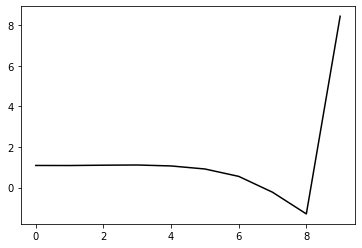

459800 0.1999248197998386
0.3521272968842727 -0.4979209074318506 -0.13468369888215567 -0.09797238459559271
[ 1.06525896  1.0767797   1.12479488  1.13702937  1.09504886  0.94927876
  0.58858974 -0.18862096 -1.25426757  8.4748018 ]


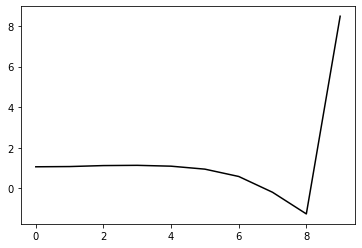

460900 0.21599024444184006
0.35195061468183125 -0.49795580187276606 -0.13513310134948103 -0.09896819481693485
[ 1.04680566  1.14220976  1.1840127   1.20482433  1.17206017  1.034535
  0.68178827 -0.08818132 -1.14788498  8.44624635]


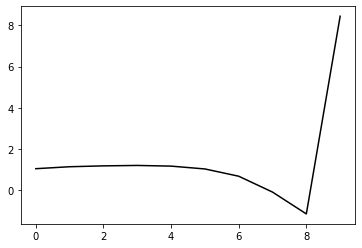

462000 0.17770036284336396
0.35111754745293045 -0.49893359877769405 -0.13623697538024754 -0.09935212163739712
[ 1.06050902  1.11618445  1.15781237  1.18536383  1.16477145  1.04083109
  0.70214467 -0.05433293 -1.10241577  8.46285713]


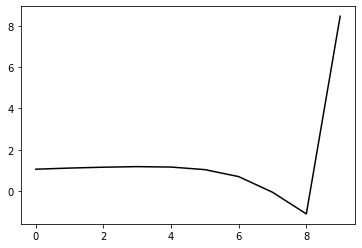

463100 0.18531471819749026
0.34923954262530676 -0.4942769817399484 -0.13255152537872567 -0.1029278907219914
[ 1.11065544  1.10198396  1.14770468  1.17533493  1.15803664  1.0394691
  0.70692524 -0.04330302 -1.08614235  8.44841488]


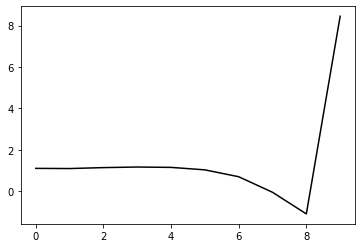

464200 0.1587121517002871
0.3456567928874114 -0.4914128842113693 -0.13037139329850755 -0.10360818889466179
[ 1.07841189  1.05491871  1.08662023  1.09716608  1.06137131  0.9275532
  0.58327751 -0.17579079 -1.22652063  8.49196003]


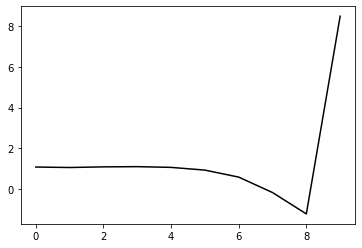

465300 0.26517220838621025
0.35363339875060723 -0.48958197744887727 -0.13139377200912172 -0.10167658773288832
[ 1.05614742  1.14090581  1.19269218  1.20826076  1.17495537  1.04256903
  0.69913899 -0.06003981 -1.11316059  8.4437047 ]


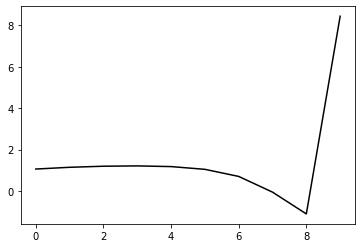

466400 0.16628980493445014
0.3592225739133981 -0.48751766668436075 -0.13191926599719137 -0.10102036642712081
[ 1.00932974  1.22811851  1.31492231  1.35318281  1.33237436  1.20901508
  0.87278967  0.11866753 -0.93291569  8.49022372]


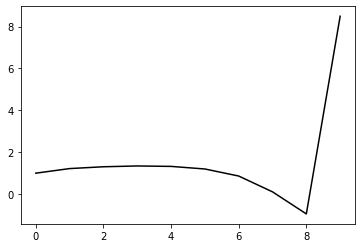

467500 0.25184272623248843
0.34776405653556663 -0.4941969056305267 -0.13518315929268243 -0.09893984561358617
[ 1.06052926  1.08625857  1.1219434   1.1577287   1.13977358  1.01885926
  0.68657176 -0.06194144 -1.1066824   8.44730586]


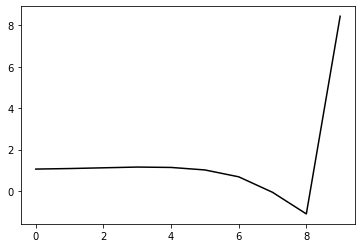

468600 0.22673160367601583
0.34405745813647026 -0.49779370307543946 -0.13793769356457578 -0.09742945559065058
[ 1.07340925  0.99257702  1.01878464  1.05203505  1.04522845  0.93711723
  0.61722922 -0.1194133  -1.15381642  8.46844644]


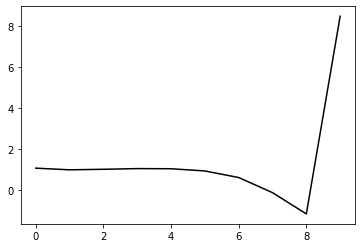

469700 0.23665680774286743
0.3381121418443913 -0.49435790235636135 -0.1343007822839959 -0.1004663039889247
[ 1.11054604  1.0483843   1.01494418  1.0207769   0.99962286  0.8819907
  0.55491558 -0.18652043 -1.22372786  8.48219868]


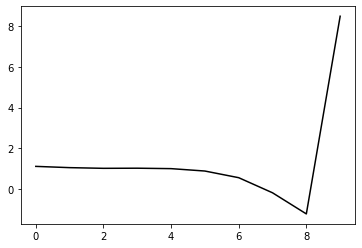

470800 0.2001514175432043
0.34739504625076695 -0.4965018353471152 -0.13857842654627742 -0.09786069168610431
[ 1.05520515  1.09614907  1.09536865  1.08947288  1.06456221  0.94838547
  0.6237723  -0.1145531  -1.14822213  8.43458053]


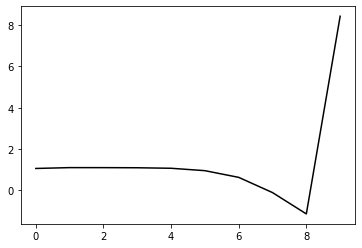

471900 0.21206781138063963
0.3510788075873723 -0.49434143929086943 -0.1380569689555406 -0.09892645884782968
[ 1.02333685  1.20239978  1.22629907  1.22062543  1.19021033  1.07359072
  0.74993795  0.0123547  -1.021999    8.49517392]


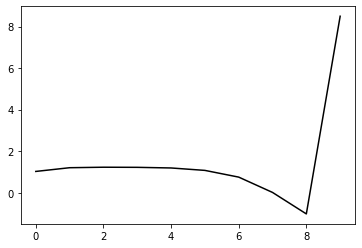

473000 0.1971752185146906
0.3453593985898121 -0.4940408606304222 -0.13715341914556373 -0.10034877411713437
[ 1.1099835   1.06246715  1.08862059  1.09179437  1.06186094  0.94958122
  0.63405776 -0.09419719 -1.11941317  8.47328336]


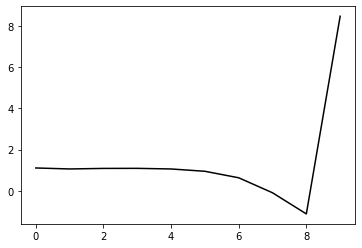

474100 0.18721438209779578
0.34607913678602414 -0.4875246276011406 -0.13338780685817295 -0.09929763697376418
[ 1.099746    1.07372495  1.09429808  1.09651265  1.06382572  0.94849491
  0.63114375 -0.10047248 -1.13363867  8.45702912]


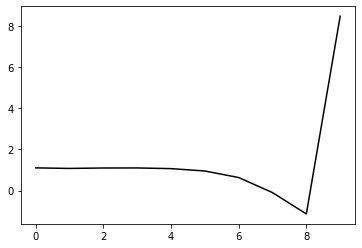

475200 0.12896145017841076
0.34809334715942664 -0.4861068313138605 -0.133254588848857 -0.09956818851678742
[ 1.0813477   1.15118828  1.17448919  1.18100922  1.1486572   1.032435
  0.71608513 -0.01398619 -1.04676411  8.49146702]


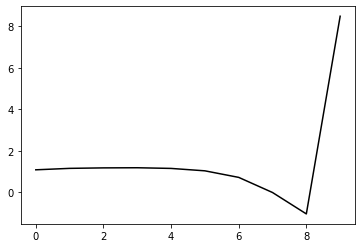

476300 0.2551866057547652
0.3530672509190472 -0.4820709814685625 -0.13151543966354878 -0.10014956118961266
[ 1.08818118e+00  1.15983283e+00  1.21079778e+00  1.21769078e+00
  1.17890116e+00  1.05550989e+00  7.34891979e-01  2.58823334e-03
 -1.03271356e+00  8.46681364e+00]


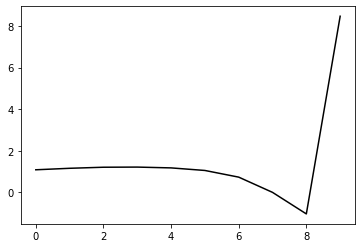

477400 0.20492870569411686
0.34370421004664925 -0.4881599571216889 -0.134964937220684 -0.0996459556609792
[ 1.06544878  1.11531297  1.1185683   1.11532467  1.06672716  0.9336048
  0.60752544 -0.12555513 -1.15809759  8.4508819 ]


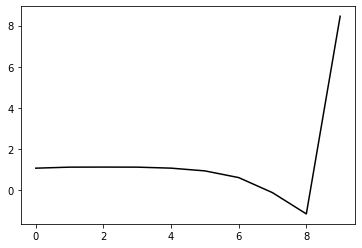

478500 0.2418005946887656
0.34700685856870367 -0.4900215523629233 -0.1377765087219135 -0.09917394737364735
[ 1.07275066  1.110196    1.15198265  1.16533916  1.13152533  1.0098722
  0.69494198 -0.02623069 -1.04718977  8.45184203]


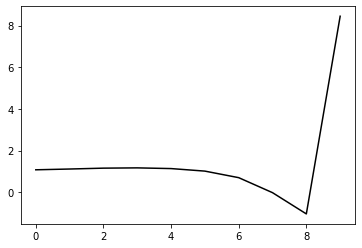

479600 0.21941577046945132
0.3460263980630864 -0.4910522231591638 -0.13903422703867602 -0.09886409737274274
[ 1.08896220e+00  1.09192188e+00  1.13333476e+00  1.15877460e+00
  1.13733312e+00  1.02413112e+00  7.16639219e-01  3.55551447e-03
 -1.01085871e+00  8.50822376e+00]


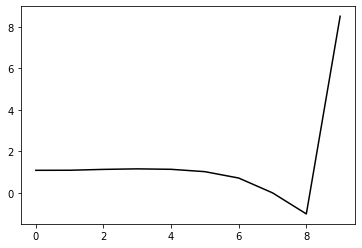

480700 0.2865039794810317
0.3474192236770903 -0.4822979713646222 -0.13252633530503677 -0.10295286943629722
[ 1.12338304  1.21961014  1.27654813  1.29173158  1.25894365  1.13431169
  0.81595034  0.09390767 -0.93130858  8.52536386]


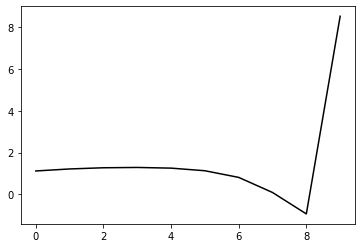

481800 0.20664164874537994
0.35559415359566277 -0.4796080364682779 -0.13327386611656913 -0.09746521148268066
[ 1.03686432  1.25643682  1.3122754   1.31987565  1.27359916  1.13395481
  0.80092623  0.06582074 -0.97293776  8.46711481]


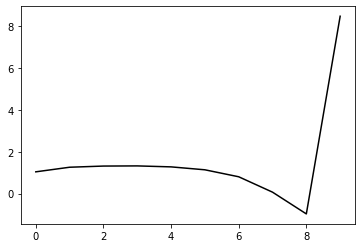

482900 0.20390161434807058
0.348065533789203 -0.48682699783320676 -0.1379172457930935 -0.09624014832682294
[ 1.04334637  1.17048056  1.2228657   1.24306223  1.20589692  1.07383153
  0.74877028  0.02343    -1.00461319  8.48151935]


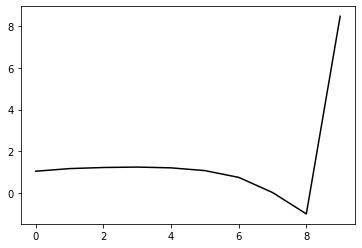

484000 0.33427245794253024
0.3427507815563416 -0.4808996961815776 -0.1323124253228743 -0.10236184288966553
[ 1.17586113  1.06402754  1.11633483  1.14026132  1.10989023  0.98305721
  0.66300759 -0.05578186 -1.07681142  8.50175339]


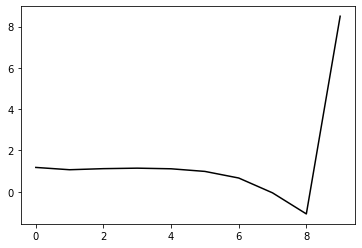

485100 0.1888837715349499
0.3427159229108157 -0.484180113772644 -0.13566456750569 -0.09940725870177868
[ 1.11681502  1.15293146  1.16779916  1.17523586  1.13539753  0.99993807
  0.67233446 -0.051851   -1.07677602  8.47437698]


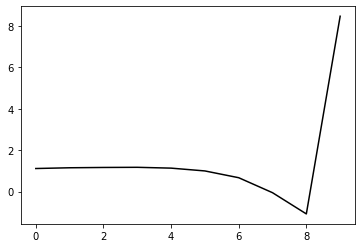

486200 0.12650234623062193
0.35114672536518454 -0.47684189538767874 -0.13240914377504798 -0.09824859908217408
[ 1.06446702  1.17169303  1.22763704  1.2272711   1.17539776  1.02818634
  0.68826268 -0.04778527 -1.08608017  8.47684555]


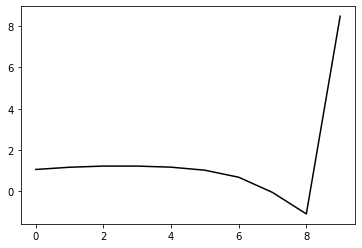

487300 0.2576251927428144
0.3524021678806215 -0.47485775477306635 -0.13177699977323432 -0.09726279023101507
[ 1.0879978   1.14195085  1.21399754  1.2334084   1.18603316  1.03975541
  0.69946402 -0.03653114 -1.07539681  8.42946162]


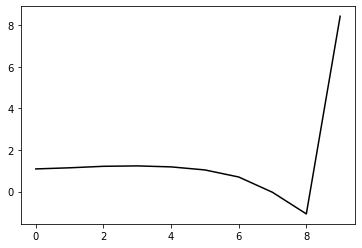

488400 0.20097642209267846
0.3502067264543619 -0.4776749765577701 -0.1342952443198686 -0.09639324248196399
[ 1.03059848  1.11950785  1.17092124  1.19797296  1.15727691  1.01358919
  0.675348   -0.05672609 -1.08992881  8.4986476 ]


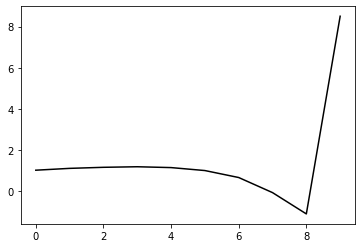

489500 0.23217760236029586
0.3540720167557983 -0.4750857635827224 -0.1330624293945083 -0.09888629660537679
[ 1.08201636  1.1990922   1.26140511  1.29560673  1.26950617  1.13752277
  0.80890851  0.0873188  -0.93397737  8.47486552]


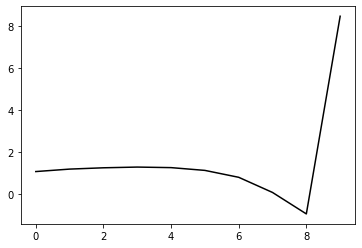

490600 0.215590662957502
0.34687040838014044 -0.4806862409397056 -0.13709418410071275 -0.0945598444030472
[ 1.10178733  1.02112147  1.04417914  1.06085378  1.02594018  0.88763929
  0.55386975 -0.16942497 -1.18912407  8.47607994]


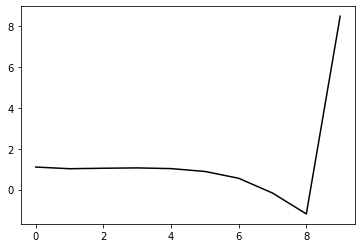

491700 0.21964406827916508
0.35175747817537045 -0.47261005367758646 -0.13169271743711147 -0.09968270312052346
[ 1.10293102  1.17684355  1.23129847  1.25454173  1.22900747  1.0993902
  0.77010722  0.04980158 -0.96786751  8.45974332]


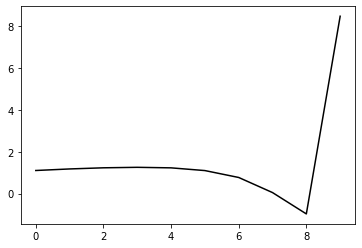

492800 0.217056720742516
0.35540328005283184 -0.4729633468653019 -0.13350047524036093 -0.09868966117955079
[ 1.02699321  1.24321777  1.31826503  1.34390031  1.31395488  1.17981876
  0.84438031  0.11790813 -0.90565498  8.50202625]


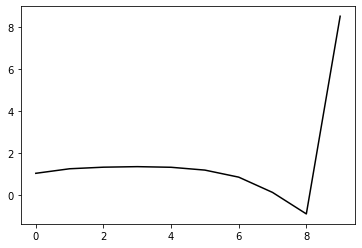

493900 0.20460812414128465
0.34560982066511275 -0.48178709483840115 -0.13874716587291877 -0.09717947662391307
[ 1.0485911   1.13833763  1.19166259  1.22722566  1.20628914  1.08190375
  0.75685844  0.04245642 -0.96619741  8.46785793]


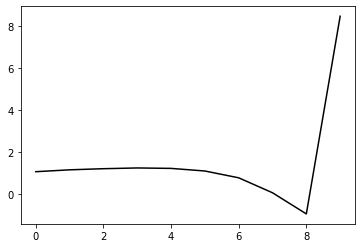

495000 0.29796013073804745
0.34183900834242376 -0.47673236183335127 -0.13419492419489662 -0.10225391614061344
[ 1.16890176  1.05632197  1.10370407  1.13793572  1.12419083  1.00784107
  0.69025197 -0.01668556 -1.01739612  8.51510076]


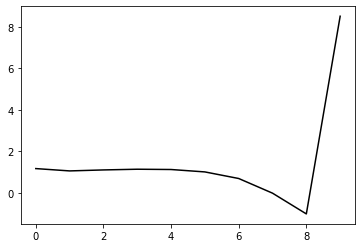

496100 0.19158019740970386
0.34006639825651647 -0.4804896602482302 -0.13730698984042572 -0.09993440618540592
[ 1.12569012  1.1329818   1.1459888   1.1616601   1.13813869  1.01436046
  0.68997887 -0.02265904 -1.02771508  8.45746512]


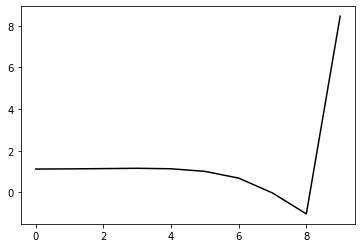

497200 0.13302956555465045
0.347973238075328 -0.47422667065636637 -0.13495819718190183 -0.09909301155415053
[ 1.06925926  1.21139941  1.23915552  1.23546235  1.19328519  1.05511731
  0.71705843 -0.00892559 -1.0274945   8.49907204]


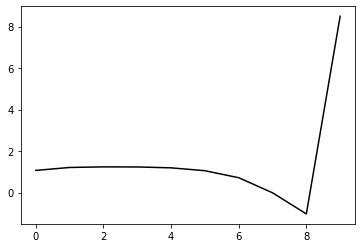

498300 0.2527334654041535
0.339762369771295 -0.4766383875071001 -0.13555667823636164 -0.09977490921260583
[ 1.12647363  1.11027494  1.14170236  1.15193648  1.1161346   0.98609235
  0.65702527 -0.05942741 -1.06687126  8.47078432]


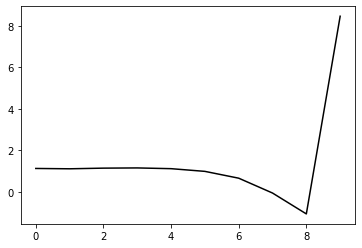

499400 0.16564669924622022
0.34627192451765587 -0.4732136728054122 -0.13499600259054229 -0.09907412555460363
[ 1.0564155   1.20570957  1.25031134  1.25690605  1.21357521  1.07618304
  0.74077819  0.01836259 -0.99486985  8.49067135]


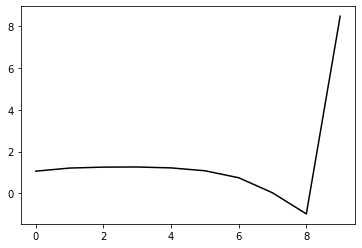

In [157]:
optimizer=tf.optimizers.Adam(learning_rate=0.0005)
for j in range (5000):    
    with tf.GradientTape() as g:
        loss=Error_func(h, m2, lam, alpha, beta, Positive[j%10], Negative[j%10])
        gradients=g.gradient(loss, [h, m2, lam, alpha, beta])
        if np.isnan(loss)==True: break
    for i in range (90):
        optimizer.apply_gradients(zip(gradients, [h]))
        if any(np.isnan(h.numpy()))==True: break
    for i in range (10):
        optimizer.apply_gradients(zip(gradients, [h, m2, lam, alpha, beta]))
        if any(np.isnan(h.numpy()))==True: break
    if j%11==0: 
        print(j*100, Error_func(h, m2, lam, alpha, beta, Positive[j%10], Negative[j%10]).numpy())
        print(m2.numpy(), lam.numpy(), alpha.numpy(), beta.numpy()), print(h.numpy())
        plt.plot(h.numpy(), 'k-'), plt.show()

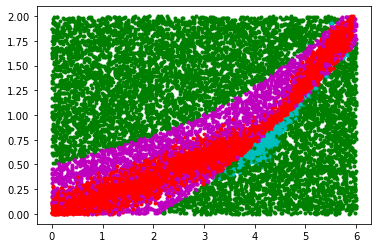

In [150]:
for i in range (set):
    [Positive0[i], Positive1[i]]=NN_func_01(h, m2, lam, alpha, beta, Positive[i])
    [Negative0[i], Negative1[i]]=NN_func_01(h, m2, lam, alpha, beta, Negative[i])
for i in range (set):
    x_data1[i]=[v[0] for v in Positive0[i]]
    y_data1[i]=[v[1] for v in Positive0[i]]
    x_data2[i]=[v[0] for v in Positive1[i]]
    y_data2[i]=[v[1] for v in Positive1[i]]
    x_data3[i]=[v[0] for v in Negative0[i]]
    y_data3[i]=[v[1] for v in Negative0[i]]
    x_data4[i]=[v[0] for v in Negative1[i]]
    y_data4[i]=[v[1] for v in Negative1[i]]
    plt.plot(x_data4[i], y_data4[i], 'g.')
    plt.plot(x_data2[i], y_data2[i], 'c.')
    plt.plot(x_data1[i], y_data1[i], 'r.')
    plt.plot(x_data3[i], y_data3[i], 'm.')
plt.show()

0 0.2889926277103472
0.3465527085603948 -0.46346011026301703 -0.12796633352798856 -0.10520880030904717
[ 1.06623883  1.22424467  1.29447094  1.30760021  1.26628003  1.12875015
  0.79187123  0.06648415 -0.95139477  8.52543752]


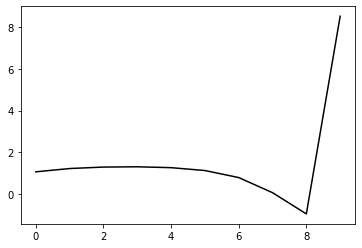

1100 0.19914725076001125
0.3119686443097831 -0.4784377760875512 -0.13490622941960717 -0.10108854245659747
[ 1.06135147  1.05203344  1.10066207  1.11130545  1.06497499  0.92278612
  0.58250253 -0.14521746 -1.16427542  8.45513585]


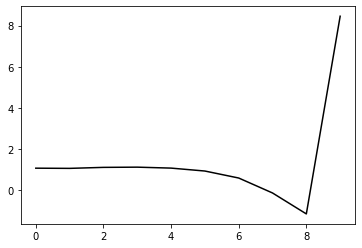

2200 0.12536623290355178
0.329144574516477 -0.4680821639131913 -0.13210680161393756 -0.10286027800918246
[ 1.039256    1.13487559  1.18748414  1.20173144  1.15707119  1.01390835
  0.67201426 -0.05795539 -1.07994373  8.44298757]


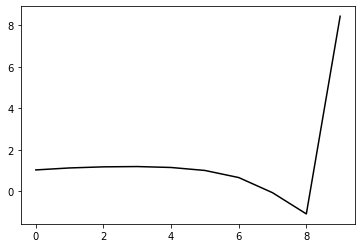

3300 0.28908208872117835
0.32495464901226995 -0.4719040965307708 -0.13619189151366423 -0.09602212443174399
[ 1.03423331  0.97693188  1.01492852  1.03023581  0.9865635   0.84386013
  0.50350583 -0.22369521 -1.24122265  8.42437301]


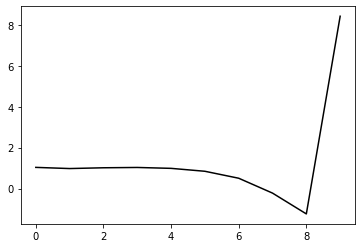

4400 0.21601574147216582
0.32454549583759323 -0.46914294266892703 -0.13490008768612155 -0.10319074998289879
[ 1.03178154  1.05636432  1.05447756  1.0616533   1.01987234  0.87854264
  0.53977729 -0.18502905 -1.19873122  8.44438597]


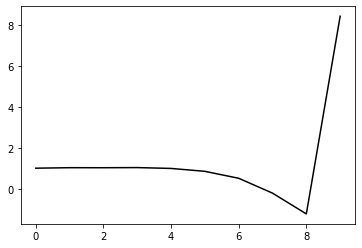

5500 0.25023383449153347
0.3255195645591531 -0.47639413042278533 -0.141696063198678 -0.10074004309029999
[ 1.04438563  0.97146929  0.99560326  1.00547148  0.9723367   0.84063549
  0.51087299 -0.20468538 -1.20763959  8.40507763]


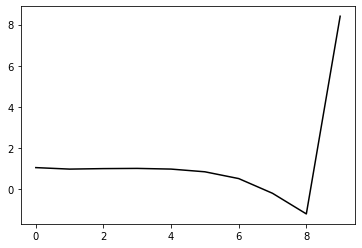

6600 0.2092185929330474
0.328332332585347 -0.47008357074598833 -0.137364711087427 -0.10622752170597334
[ 1.06477689  1.10052196  1.13290372  1.14171896  1.1109135   0.98396953
  0.65877552 -0.05234223 -1.05064171  8.44795483]


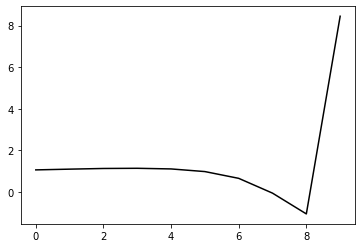

7700 0.21673300602228865
0.32334495585344447 -0.47144463046904656 -0.13857481886409104 -0.10455061148586865
[ 1.0735322   1.02866003  1.0557175   1.06904435  1.04041337  0.91770524
  0.59694175 -0.11011453 -1.10439204  8.43609668]


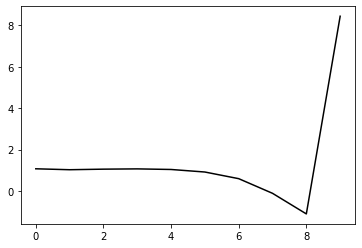

8800 0.21042561435570534
0.32843905171257975 -0.4668591783664645 -0.13713975740129145 -0.10410780046948269
[ 1.06815441  1.09660396  1.12848608  1.14281042  1.11865313  1.00100023
  0.68433642 -0.0204269  -1.01427882  8.48599765]


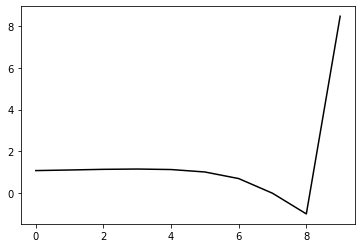

9900 0.31550832287127106
0.32421193741405635 -0.4741713958736023 -0.1441851185850475 -0.0931120487755455
[ 1.00240027  0.96031869  0.96971025  0.95432844  0.89841842  0.75454813
  0.41591068 -0.30841657 -1.3207713   8.42957882]


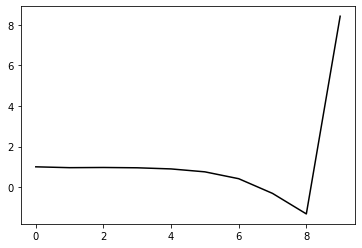

11000 0.23164021484526284
0.32754622862739313 -0.46469249659455847 -0.137185934948856 -0.10569371564009433
[ 1.08866402  1.07224906  1.06722109  1.05482318  1.00624933  0.86952171
  0.53815133 -0.17895277 -1.18324474  8.49236358]


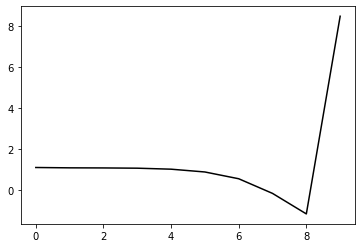

12100 0.1930988040443133
0.3318854326179922 -0.4590676707382768 -0.13472121793752537 -0.10367111999410805
[ 1.04141953  1.12323886  1.1108251   1.07786806  1.01296284  0.86351794
  0.52210133 -0.20342751 -1.21501359  8.44943638]


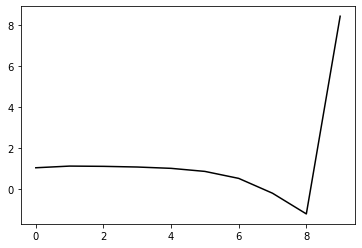

13200 0.14883074340534738
0.3233579018106192 -0.4666617667106722 -0.13880464835854878 -0.10458243254091441
[ 1.0267333   1.01034108  1.02734942  1.00001045  0.93150104  0.78090314
  0.4412896  -0.28027609 -1.28537305  8.42385895]


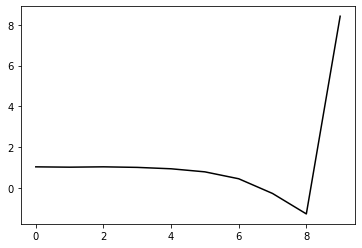

14300 0.2612516565614898
0.32640627916371817 -0.46225872209735924 -0.1365719789331159 -0.10917600413054843
[ 1.05719616  1.08461804  1.10793938  1.09876725  1.04232013  0.90126524
  0.57090411 -0.14242042 -1.14043568  8.44691965]


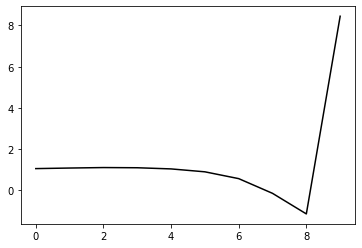

15400 0.21820179120249067
0.3267037911000399 -0.4568824712348798 -0.13436867922399168 -0.10519113506945084
[ 1.03417638  1.03706827  1.03872735  1.02391611  0.96041085  0.81025253
  0.47132116 -0.25094709 -1.25945853  8.45263634]


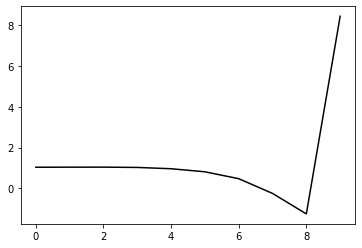

16500 0.25475947167094304
0.33037117926227905 -0.4604882156118085 -0.13864875474643384 -0.10235215899879983
[ 1.03146615  1.07147658  1.10562825  1.09659506  1.03498524  0.88397274
  0.54419198 -0.1784546  -1.18703908  8.4427659 ]


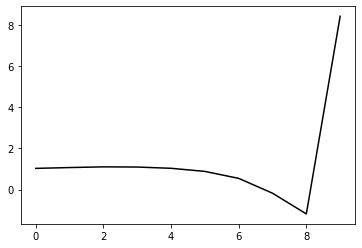

17600 0.21063210677857472
0.3310911250654836 -0.45545022561682347 -0.1353166406276886 -0.10676030964537023
[ 1.04985697  1.12114381  1.17253493  1.17968549  1.12846882  0.98377508
  0.64921401 -0.06844427 -1.07225345  8.48058371]


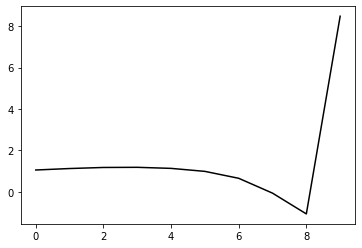

18700 0.221010733103148
0.3270493233590205 -0.4604334177522281 -0.13885061767959353 -0.10503017918913404
[ 1.03323255  1.04555007  1.11403554  1.13504521  1.09092029  0.94917674
  0.61656325 -0.09870996 -1.09937422  8.41710929]


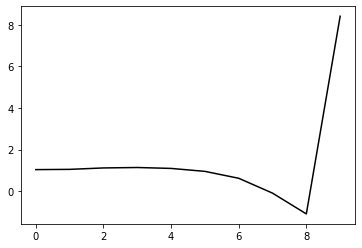

19800 0.2221819808658252
0.33056030681926407 -0.45825561120208025 -0.13855814666733032 -0.10594244229633704
[ 0.99067041  1.15441203  1.21251511  1.23812934  1.19960988  1.05926444
  0.72635136  0.01053333 -0.9913155   8.48716309]


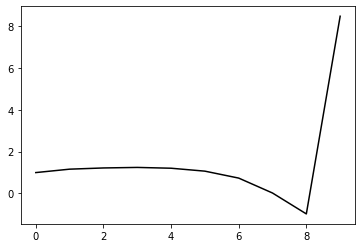

20900 0.21201220158562864
0.3253108896617748 -0.4641761502171378 -0.14261238435737364 -0.10343593917842227
[ 1.02808459  1.05924045  1.10044776  1.1237026   1.08717505  0.94649132
  0.6117724  -0.10540039 -1.10778551  8.45829066]


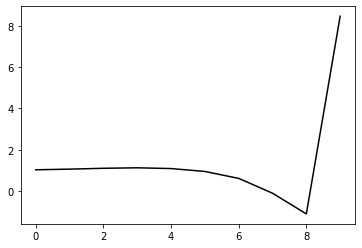

22000 0.29122242440886875
0.3246300149884702 -0.45441910420246234 -0.13585104309963655 -0.10801456458570231
[ 1.12884789  0.9810099   1.02993605  1.05084014  1.01775533  0.88027459
  0.54710775 -0.16837494 -1.16869024  8.48349627]


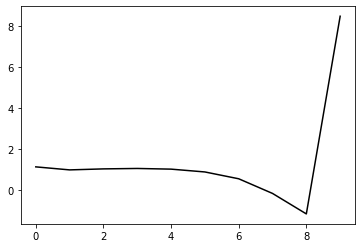

23100 0.1856272964052527
0.32753850576374105 -0.45414997358849063 -0.13731499172967204 -0.10751108361922061
[ 1.07696822  1.12713969  1.15024801  1.15729442  1.11598836  0.97096633
  0.6296313  -0.09339806 -1.10053011  8.50811674]


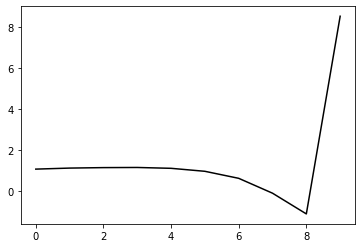

24200 0.13543983098211101
0.3284341781674725 -0.4507168330451175 -0.1358176941404505 -0.10707932747677473
[ 1.04203862  1.11010491  1.15247459  1.15615056  1.1088473   0.95928816
  0.61219302 -0.11729772 -1.13195014  8.46709526]


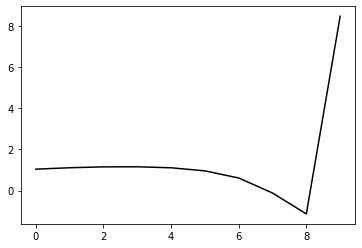

25300 0.3229445099872718
0.32737628197480056 -0.45886867528644454 -0.1434062546260567 -0.09787678597081124
[ 1.002374    0.9903261   1.0224441   1.02298704  0.96879044  0.81315214
  0.45974435 -0.27594421 -1.29658469  8.43028082]


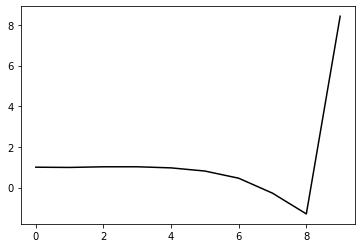

26400 0.1794375800649062
0.3345537783067247 -0.44607644454646317 -0.1356849671141741 -0.10388598141090441
[ 0.99947887  1.18334087  1.21951839  1.21873322  1.16256703  1.00349545
  0.64541196 -0.0953677  -1.12103076  8.48849637]


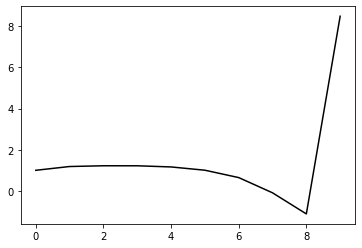

27500 0.23405852475533526
0.3355202352082052 -0.44469797708760544 -0.13532750843518784 -0.10638066377281692
[ 1.03577279e+00  1.18021461e+00  1.25591882e+00  1.27422339e+00
  1.22829372e+00  1.07734995e+00  7.26151313e-01 -7.94106561e-03
 -1.02573900e+00  8.45930672e+00]


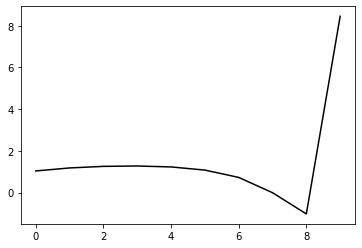

28600 0.21058160852355023
0.3281381818848787 -0.4497822118428966 -0.13757454392537952 -0.10783795433486018
[ 1.0541638   1.08303665  1.13565608  1.16809174  1.13663661  0.99774409
  0.65774213 -0.0648978  -1.06941935  8.48132276]


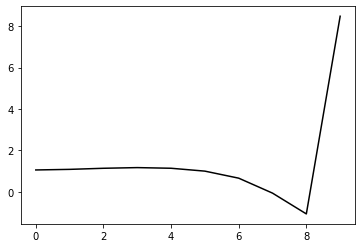

29700 0.24087344713033948
0.3294621695691366 -0.4542846095282559 -0.14259570900991478 -0.10206571083278401
[ 0.99913797  1.04280668  1.09646517  1.12646584  1.09574098  0.95513942
  0.61096754 -0.11751565 -1.12935158  8.432762  ]


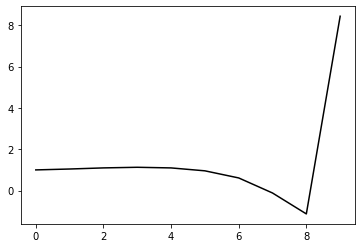

30800 0.19232940506616913
0.32848678666952835 -0.45142195505167376 -0.14064253355359335 -0.10546000265704479
[ 1.02300361  1.13761724  1.17664203  1.20644281  1.18319354  1.04908115
  0.70930794 -0.01574158 -1.02394856  8.49243729]


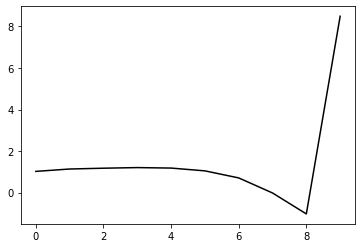

31900 0.27234999557915784
0.3288584759613051 -0.4533333307149291 -0.14390102422185808 -0.09872262259248313
[ 0.98700245  1.05131193  1.08043544  1.09947096  1.07080393  0.93355965
  0.58906822 -0.14242583 -1.158855    8.43128749]


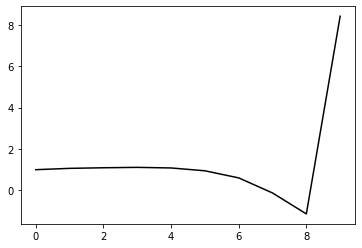

33000 0.18020364248459325
0.31891907348668785 -0.4537635200713958 -0.1428045211264902 -0.10122079756660604
[ 1.03319298  1.0513887   1.01782935  1.01399299  0.97419539  0.82982733
  0.47997513 -0.25498892 -1.27216263  8.44035647]


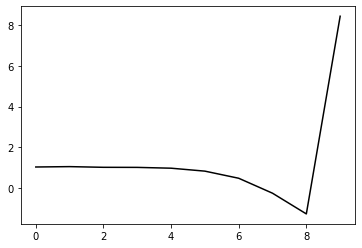

34100 0.19702652205127705
0.32185615953823415 -0.4499299155416665 -0.14016696490213826 -0.10918997882042711
[ 1.08646755  1.12884085  1.14810229  1.1447206   1.10946956  0.97291252
  0.63005083 -0.0987628  -1.10945625  8.45998174]


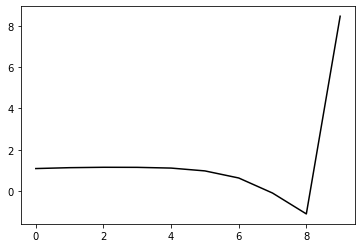

35200 0.15015169231085185
0.32534903157566253 -0.4460996314702053 -0.13873442206451708 -0.10919657215687452
[ 1.0556393   1.12843015  1.17843418  1.18068709  1.13798228  0.99771266
  0.65176777 -0.0807446  -1.09506334  8.4953006 ]


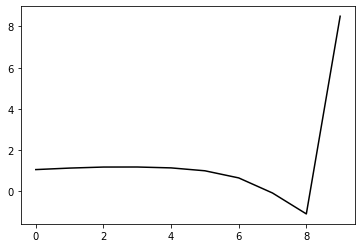

36300 0.2950649574716307
0.328268500255548 -0.4479847565261579 -0.1423023606917781 -0.10273255875097877
[ 1.02031804  1.05574965  1.09055998  1.09816958  1.0526868   0.90969187
  0.56222927 -0.17291316 -1.19026699  8.42179509]


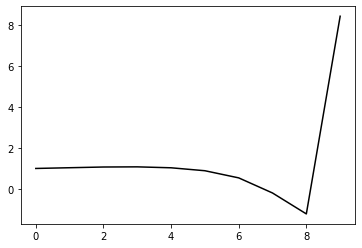

37400 0.17356891888880532
0.32996778495273393 -0.44371421482389356 -0.13945106986479286 -0.10690383570000465
[ 1.07162555  1.22708936  1.28439941  1.30676415  1.27598226  1.14253079
  0.80164332  0.06918867 -0.94848406  8.50596534]


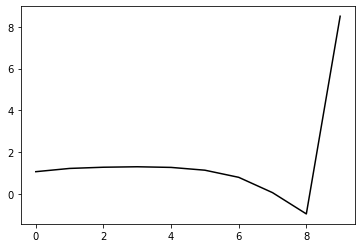

38500 0.24531898307701758
0.32512994645137017 -0.441443137765637 -0.13799060270084693 -0.10599918304015814
[ 1.06366364  1.14570528  1.17785235  1.18078886  1.13119229  0.98303588
  0.63136599 -0.10929139 -1.133058    8.47576896]


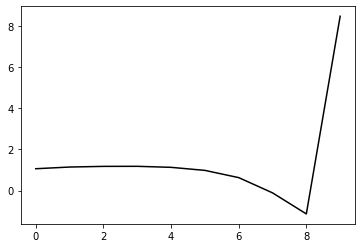

39600 0.21291037124094347
0.3286852887296584 -0.44079409950317844 -0.14008807563584103 -0.10182345825780698
[ 1.05497169  1.09219007  1.12131814  1.11617116  1.05840638  0.90264165
  0.54461147 -0.20184475 -1.23096239  8.4541993 ]


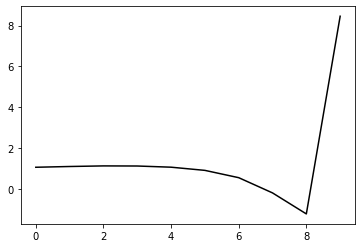

40700 0.22279657981081408
0.3312607814955378 -0.4403993731105411 -0.1405674703725595 -0.10290160853916974
[ 1.0466441   1.11221362  1.1576093   1.15713982  1.09980832  0.94357188
  0.58578878 -0.15977292 -1.18666556  8.4240343 ]


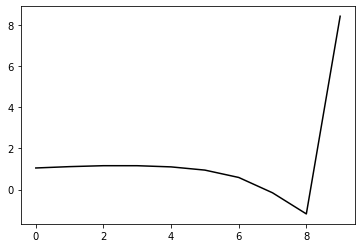

41800 0.21284483111682803
0.3329140856321562 -0.44016099027410144 -0.14094979062033586 -0.10573375911058192
[ 1.01015383  1.20318858  1.27424616  1.29608015  1.25267877  1.10574091
  0.7552696   0.01504024 -1.0081625   8.45745972]


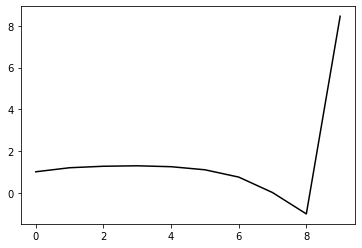

42900 0.2185466407322689
0.3264788054344647 -0.44591178059443703 -0.14465381412931141 -0.10099220452169011
[ 1.0372485   1.00821455  1.06372208  1.08545705  1.04094101  0.89133094
  0.53933227 -0.2006601  -1.2208629   8.46815258]


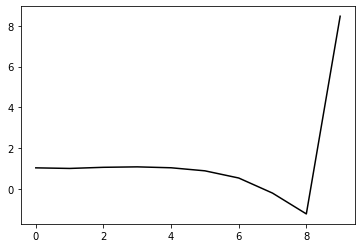

44000 0.19321245498131592
0.33243993310395514 -0.43742062138097626 -0.1400611378831786 -0.10405558808438284
[ 1.07292016  1.0895265   1.14273921  1.16554556  1.12853122  0.98304924
  0.6328799  -0.10681424 -1.12805581  8.49299557]


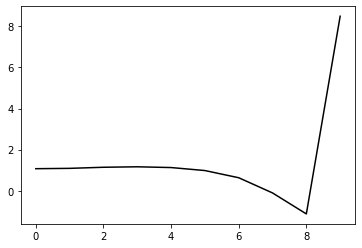

45100 0.2050795862244496
0.3250438672394035 -0.43657159957460834 -0.13797560949987242 -0.10775845662789324
[ 1.10131735  1.06032223  1.10291589  1.12846076  1.0980344   0.95941483
  0.61536998 -0.11814721 -1.13234819  8.45622526]


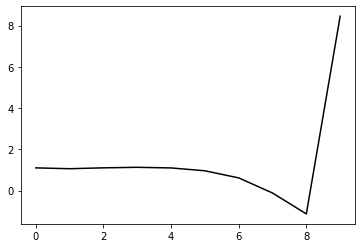

46200 0.1298463879486989
0.32559514377556525 -0.43569461305331464 -0.13853256281232618 -0.10455089107417691
[ 1.05242196  1.07041052  1.11112006  1.12936626  1.09428295  0.9505556
  0.59873873 -0.14492509 -1.17187597  8.47020002]


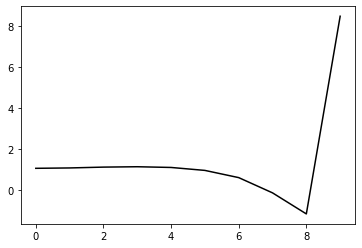

47300 0.25638267753946287
0.3266129085306782 -0.4318493664796923 -0.13679656484808214 -0.10442225519540359
[ 1.05621465  1.0736015   1.11405593  1.13669631  1.10761583  0.97108571
  0.62526765 -0.11391322 -1.13764277  8.4510737 ]


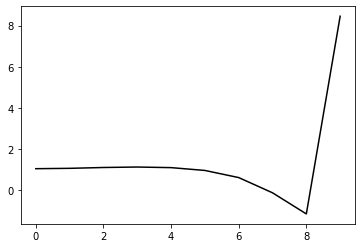

48400 0.1765178666861878
0.32557546170927093 -0.4341259853963874 -0.13892631927769533 -0.1041642500096266
[ 1.03836011  1.09275053  1.12491097  1.14887376  1.12350139  0.99198473
  0.65088517 -0.08376279 -1.10198473  8.48118326]


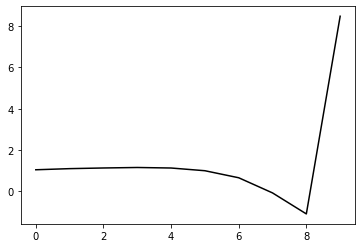

49500 0.26380499463913754
0.32236977419076485 -0.43717018970211796 -0.14184443177511685 -0.10038433879593713
[ 1.05298591  0.98527426  0.99125809  1.00058904  0.96646226  0.82919145
  0.4831488  -0.25628994 -1.27876034  8.42812967]


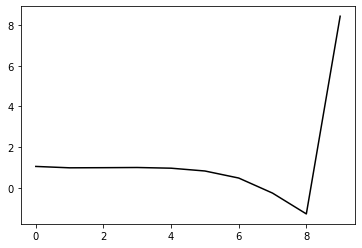

50600 0.21197095946395372
0.32819346348256623 -0.4319275584036026 -0.13918716593477054 -0.10510429239858474
[ 1.05390215  1.12499114  1.15140535  1.15827377  1.12566511  0.9917705
  0.64878611 -0.08817203 -1.10784567  8.49392148]


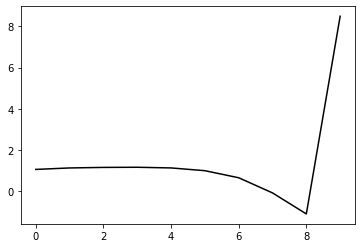

51700 0.295900461099086
0.33020278843351114 -0.42825422494278953 -0.1370684610489653 -0.10804836187341918
[ 1.08797453  1.17682475  1.2448821   1.26724524  1.24114628  1.1143078
  0.7777307   0.04582081 -0.96909343  8.46584797]


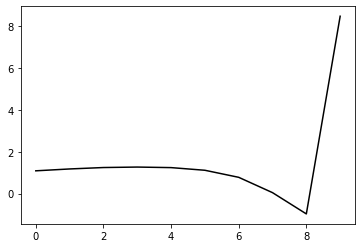

52800 0.19000227509539747
0.3309251709440493 -0.42887019171665375 -0.13900467801771496 -0.10470622283558789
[ 1.01648592  1.15101581  1.15236929  1.15110183  1.10595047  0.96467979
  0.617644   -0.12241109 -1.14359743  8.46711667]


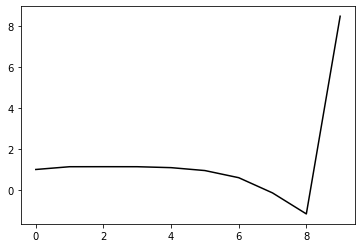

53900 0.21675211956846008
0.3384305543945841 -0.4281317391591354 -0.1406685946630871 -0.103959737279694
[ 0.98600131  1.19321175  1.23814171  1.2393747   1.19540415  1.0555572
  0.71032126 -0.02827522 -1.04794384  8.4649701 ]


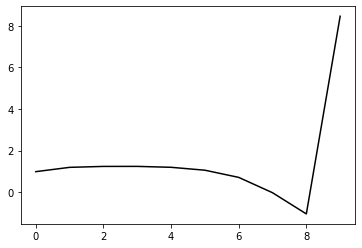

55000 0.24788044675088491
0.32969409077218076 -0.42918806158552675 -0.1397633791818782 -0.1066308629820321
[ 1.11213097  1.00897518  1.06411511  1.08551095  1.05514324  0.92831678
  0.59656397 -0.12907396 -1.13544793  8.48480111]


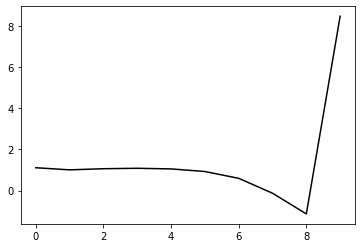

56100 0.4055310500939864
0.32747329850939744 -0.41997557569989735 -0.1332950035959512 -0.10878000774635257
[ 1.10653324  1.02608239  1.06471017  1.07859995  1.0421927   0.90793982
  0.56850133 -0.16616195 -1.18369865  8.43922354]


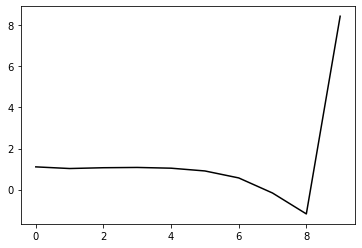

57200 0.1511170298485156
0.32993490898031774 -0.42498659308478476 -0.13827034994111842 -0.10781260323766508
[ 1.0613702   1.09740517  1.12807716  1.13925553  1.1026339   0.96850882
  0.63027368 -0.10237406 -1.11681502  8.49226202]


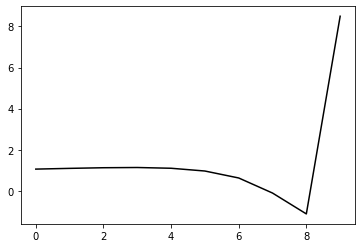

58300 0.31366615197106673
0.32782409961350994 -0.43416027904407795 -0.14621747197570342 -0.099746939543129
[ 1.01191739  0.98684568  1.00524585  1.00688669  0.9616113   0.82008059
  0.4758488  -0.2620734  -1.28140433  8.41116523]


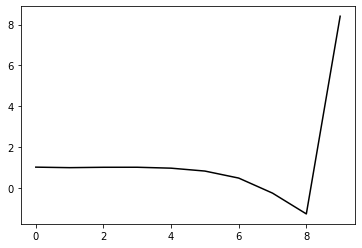

59400 0.1823207208691153
0.33239468939347605 -0.4244626837132264 -0.13992256768160866 -0.1055151271240216
[ 1.01965633  1.12566516  1.1398012   1.13635475  1.08856973  0.94454498
  0.59814975 -0.14175125 -1.16281598  8.4891497 ]


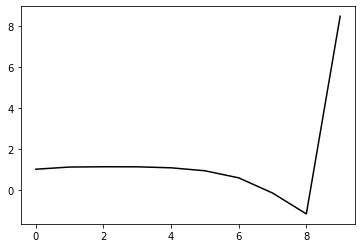

60500 0.25219866126909113
0.33320850907197513 -0.42202555440365297 -0.13871507299305919 -0.10634709680903777
[ 1.0647491   1.14355004  1.18195331  1.18764956  1.14591029  1.00748194
  0.66621505 -0.06925408 -1.08627922  8.44873442]


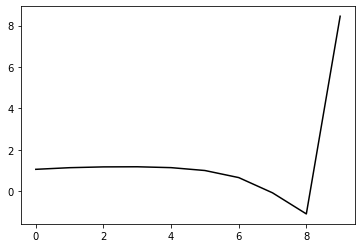

61600 0.213188013282797
0.3311357825432603 -0.4263190989773836 -0.14187226199837702 -0.10497204609397616
[ 1.04263977  1.11381363  1.12373002  1.12293718  1.07810534  0.93813126
  0.59724986 -0.13637155 -1.14997686  8.50372297]


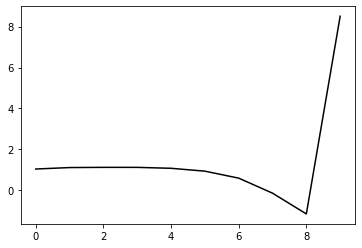

62700 0.2165588260756882
0.3277781402974677 -0.4212243633716263 -0.1379196182037184 -0.10615628481169959
[ 1.0752223   1.07572202  1.07701122  1.06403751  1.00838413  0.85906584
  0.51008041 -0.23087143 -1.25146869  8.42688784]


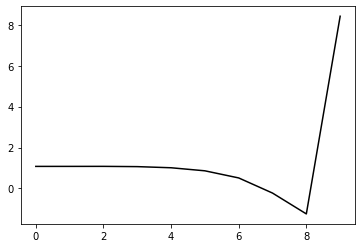

63800 0.18791284924199142
0.33065317469646055 -0.42440258658657437 -0.14146075820846452 -0.10548992115854242
[ 1.03268076  1.1346599   1.14746368  1.13398384  1.07614556  0.92567903
  0.57688001 -0.16253969 -1.17977059  8.48254858]


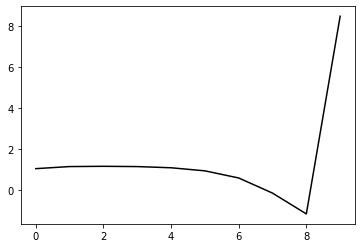

64900 0.21970763575596086
0.32648358546354056 -0.43361251820618596 -0.14776229886186257 -0.10356363980684159
[ 1.04042365  1.03255376  1.05898459  1.05356891  0.99898955  0.85309485
  0.51173516 -0.21734503 -1.22048951  8.49015192]


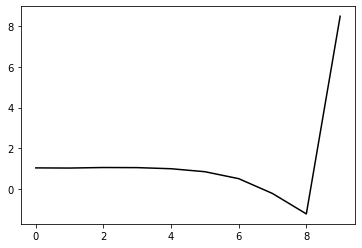

66000 0.18452743895264717
0.3302086811236402 -0.42674574629627177 -0.14382834401708972 -0.10665337528488131
[ 1.07230633  1.0787464   1.12152541  1.12193067  1.07241812  0.9290667
  0.58949551 -0.13864684 -1.1422435   8.45159704]


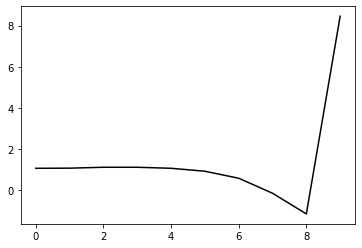

67100 0.19860648207180756
0.31527807665741703 -0.42893994165459687 -0.1425232411803899 -0.10966326331798497
[ 1.07563589  0.90085635  0.91930355  0.91539857  0.86094239  0.71356365
  0.37242599 -0.35458683 -1.35443163  8.44243918]


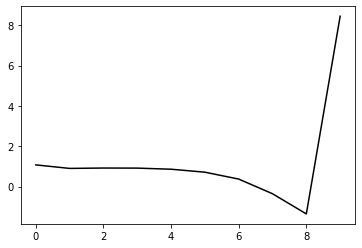

68200 0.14684384533465158
0.324684877915078 -0.427460617194885 -0.14386491900575252 -0.1073233163170474
[ 1.0811659   1.09814027  1.09579975  1.08349752  1.02603155  0.87524895
  0.53103336 -0.19835547 -1.20003637  8.43933348]


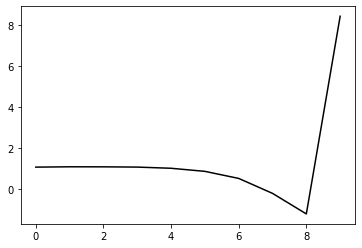

69300 0.298349202593249
0.3307223159682195 -0.420696476893141 -0.13994254223200212 -0.11034979856275956
[ 1.1060302   1.14186584  1.1870079   1.17878004  1.12102454  0.97011969
  0.62573207 -0.10372909 -1.10595478  8.45987434]


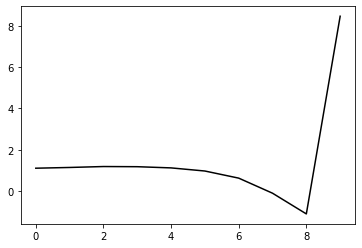

70400 0.17700869661238763
0.3313482611872864 -0.42321969730804354 -0.14286924721128727 -0.10772258996249408
[ 1.01209668  1.16166307  1.18521272  1.18030508  1.12293647  0.9714286
  0.62688534 -0.1019106  -1.10288013  8.47911499]


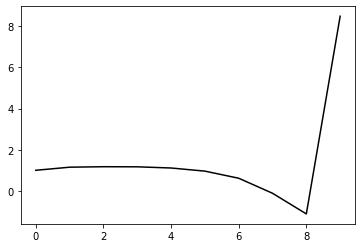

71500 0.23698498824382488
0.33458684926716464 -0.4225193692062863 -0.14340970644932777 -0.10757597184504471
[ 1.05230198  1.16101278  1.21720879  1.22634983  1.18109613  1.03964712
  0.70461099 -0.01452194 -1.00597462  8.47948115]


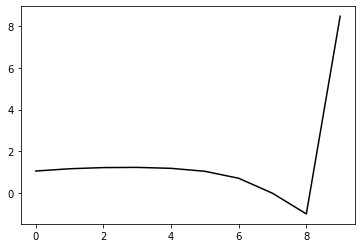

72600 0.20043166235828164
0.32364048670813983 -0.41937668960787816 -0.13993365873736383 -0.10678426776048658
[ 1.06752568  0.96630529  0.98347205  0.97651293  0.91256747  0.75273281
  0.40083766 -0.33384957 -1.34109745  8.44382872]


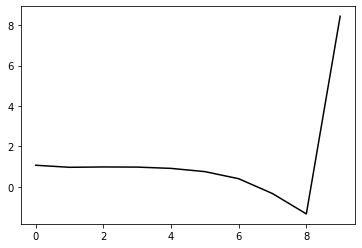

73700 0.22816003131421672
0.3287664869943542 -0.4229747118790612 -0.14435178647831767 -0.1049251482166248
[ 1.01749564  1.03461882  1.06168666  1.06054477  1.00671199  0.85490529
  0.51017696 -0.21663736 -1.21472654  8.43160874]


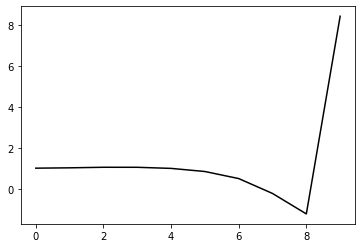

74800 0.22934766903582163
0.32690492095462365 -0.42197360930276945 -0.1432140442067294 -0.10721380438434519
[ 1.07804783  0.97687126  1.02992015  1.03791916  0.99441294  0.85191568
  0.51504851 -0.20358496 -1.19248349  8.50335956]


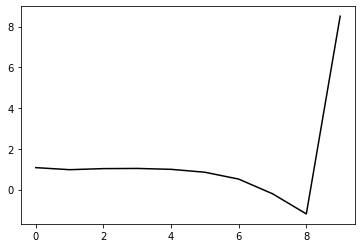

75900 0.22870834718011898
0.33146689710573374 -0.41986514302720823 -0.1429911296427873 -0.10692976211718329
[ 1.04480892  1.07944278  1.12684631  1.13547821  1.08939326  0.94304278
  0.60114456 -0.12248363 -1.11652907  8.48338058]


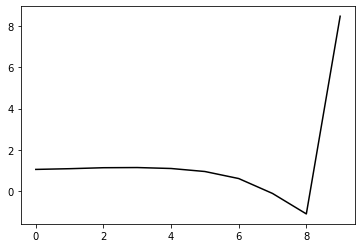

77000 0.1755833323444548
0.3201045910896461 -0.42652303560033117 -0.14625600320241236 -0.1048788046752365
[ 1.03039395  0.92688667  0.95405344  0.97389442  0.93914843  0.80397538
  0.4729462  -0.23918016 -1.22027373  8.45149791]


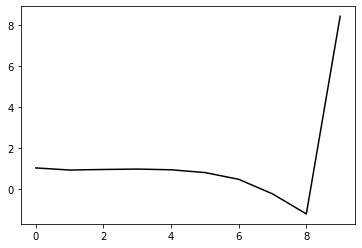

78100 0.19106729854231175
0.3186837948659146 -0.42147455203436346 -0.14226076214724065 -0.10963922028961504
[ 1.05794844  0.9383881   0.95996106  0.9728563   0.94104497  0.8085133
  0.47883991 -0.23217065 -1.21195805  8.46703014]


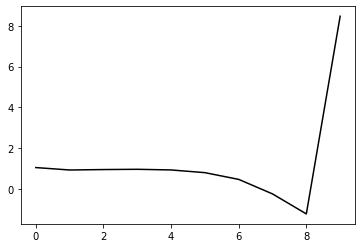

79200 0.15482007772171122
0.32188935025635473 -0.4196698896459348 -0.14176180792203896 -0.11066999900532976
[ 1.06026181  1.09118745  1.10026195  1.1061699   1.07310412  0.94118144
  0.61133716 -0.10024966 -1.08096763  8.5180163 ]


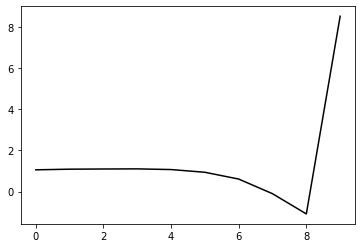

80300 0.28701854825899403
0.312058829587192 -0.4286093572566561 -0.14781438917327167 -0.10408717588251928
[ 1.04921286  0.91724922  0.91002913  0.89978599  0.85333581  0.71284528
  0.37627305 -0.34033339 -1.32414026  8.44387901]


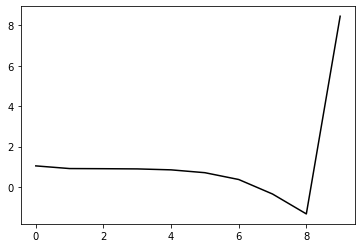

81400 0.1914300288480954
0.3204797411239958 -0.42097734333509634 -0.14353936829585354 -0.10992341969501357
[ 1.03623414  1.06723573  1.05831947  1.04415282  0.99813253  0.86072043
  0.5278595  -0.1844139  -1.16244249  8.45878454]


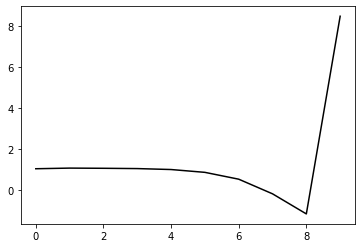

82500 0.3472180141653699
0.3276269374414926 -0.4159236382979854 -0.14150130679315565 -0.11126793397848102
[ 1.10017541  1.12963845  1.18497695  1.182937    1.13764097  1.00228839
  0.67136008 -0.03985817 -1.01754981  8.47837122]


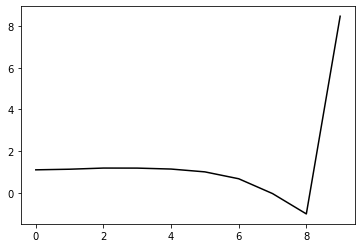

83600 0.22531119051844334
0.3171753370357554 -0.42718364196550546 -0.14911916965869718 -0.10956350317516456
[ 1.07041028  1.04260917  1.05767478  1.07518311  1.0482414   0.92952721
  0.61469466 -0.08117315 -1.04307291  8.47814504]


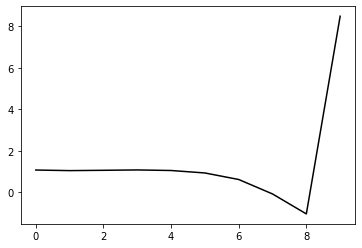

84700 0.23582428394906602
0.3208874313688337 -0.41910456878072827 -0.14419365587768804 -0.10941640319715162
[ 1.09846976  1.07832102  1.08464014  1.07642368  1.03206612  0.89838912
  0.57066783 -0.13670758 -1.10888877  8.45836429]


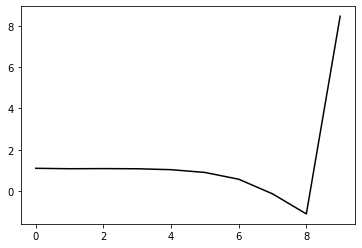

85800 0.18422991944454417
0.32180082675249216 -0.4207841810683256 -0.14648767546093647 -0.10750287355547207
[ 1.04397357  1.08570897  1.10321728  1.09774553  1.05295094  0.9225242
  0.60055677 -0.10080393 -1.06760838  8.48695707]


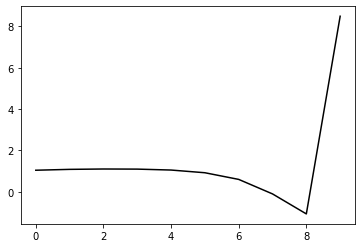

86900 0.21900710443682886
0.3252071085157388 -0.4210844577848525 -0.14823568404178789 -0.10562432584466251
[ 1.00761913  1.13922582  1.16331307  1.16383417  1.12400901  0.99789083
  0.6802628  -0.01853136 -0.98564875  8.47596304]


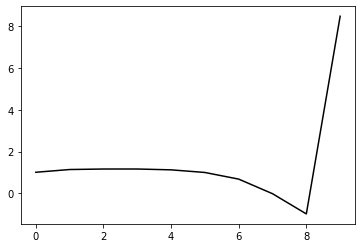

88000 0.18925798926174847
0.3277112527758757 -0.4106270121569871 -0.1415501347660578 -0.10539905626234557
[ 1.05041751  1.11646145  1.14652952  1.13034642  1.06820211  0.91685653
  0.57305328 -0.15352465 -1.15141817  8.4588152 ]


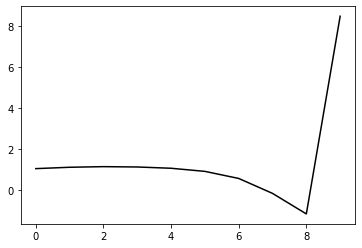

89100 0.18867935436247474
0.31766848445146595 -0.4118572805252419 -0.14038927662913636 -0.10974647383864725
[ 1.08064093  0.98579985  1.02928794  1.02559549  0.96543573  0.81508238
  0.47439444 -0.24656854 -1.23567574  8.44666572]


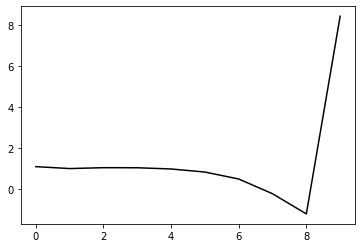

90200 0.14455087078972195
0.32289350629407365 -0.4101160534561667 -0.14083071088978058 -0.10882539421856338
[ 1.05397695  1.11761243  1.15035586  1.15201499  1.09707411  0.94802077
  0.6078829  -0.11277015 -1.1021487   8.51039367]


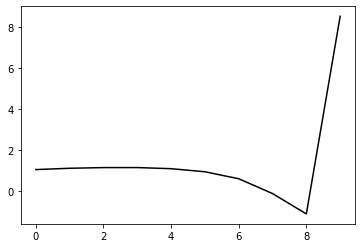

91300 0.24728263034536102
0.3181827669693094 -0.40936514342594227 -0.14008506204098953 -0.10808500290660641
[ 1.0715608   0.98900014  1.00375912  1.00190887  0.94535789  0.79485723
  0.45495925 -0.26358621 -1.24959216  8.43080222]


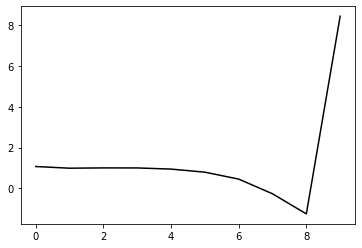

92400 0.19758980199951437
0.32126827028462585 -0.40809147763816256 -0.1407075339481541 -0.1070767617798331
[ 1.0499655   1.10719488  1.12637363  1.12151704  1.06365529  0.90870426
  0.56258482 -0.16252671 -1.15562131  8.45450093]


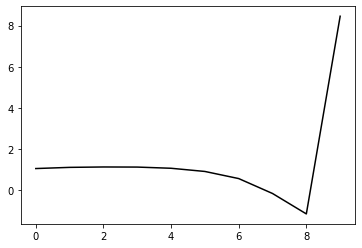

93500 0.24901343910046797
0.32412677886172053 -0.41471979421803684 -0.14675038799877133 -0.10440943147611075
[ 1.03017384  0.98457089  1.02674494  1.03077065  0.98014666  0.83271885
  0.49463296 -0.22076506 -1.20186236  8.44791679]


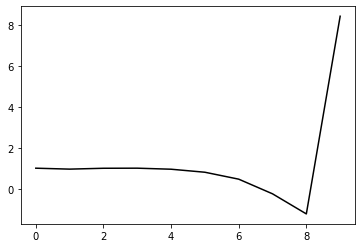

94600 0.2159506885646142
0.3236820089880286 -0.41412974684786585 -0.1464870982557568 -0.10624283075962669
[ 1.0398665   1.09102423  1.11622214  1.12113629  1.07506938  0.93056513
  0.59424348 -0.11903524 -1.09721328  8.49591306]


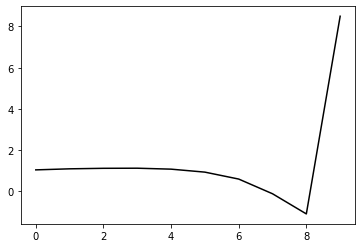

95700 0.21879755572020906
0.31997384669677187 -0.41141118662289045 -0.14427939728620084 -0.10661232270791182
[ 1.05273528  1.04601474  1.05937863  1.05732819  1.00564686  0.85545431
  0.51261543 -0.20694848 -1.19120607  8.45001021]


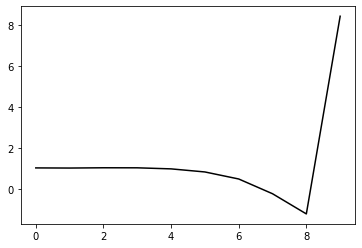

96800 0.217810694095686
0.3251415291578105 -0.4101655796524417 -0.14470222444668854 -0.10767153942688001
[ 0.99867814  1.1643265   1.19690841  1.19771619  1.14914677  1.00212751
  0.66137808 -0.05627983 -1.03852419  8.49211963]


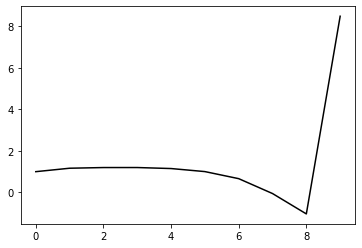

97900 0.21694519818721186
0.3200265994163119 -0.4163164909421365 -0.14884415278734256 -0.10435747644286783
[ 1.02742073  1.02645206  1.0466657   1.04440163  0.9919973   0.84226159
  0.49936179 -0.21926167 -1.20087562  8.47878115]


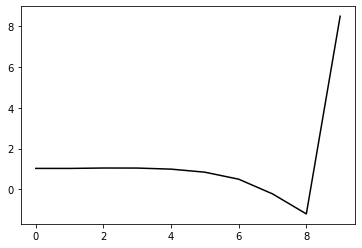

99000 0.28432022354261466
0.32108316586522573 -0.40721024167969727 -0.14219485408759555 -0.111259460150113
[ 1.1220517   1.04766678  1.0788246   1.07731511  1.02906899  0.88343041
  0.54388652 -0.17157804 -1.14985118  8.46910553]


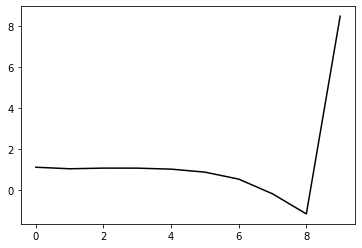

100100 0.1902536697301571
0.31992966291297376 -0.41085258837093375 -0.145381348364954 -0.10750381544953179
[ 1.0660894   1.11171863  1.1150529   1.10224689  1.04647425  0.89528358
  0.55110442 -0.16796052 -1.14875497  8.45576294]


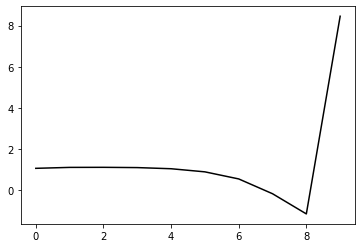

101200 0.13594302701742383
0.32385147211552207 -0.4058402958197374 -0.1429958220837813 -0.1092966663770089
[ 1.05454996  1.15281848  1.1739377   1.15398842  1.08855207  0.92943028
  0.5778133  -0.14821347 -1.13548001  8.47379643]


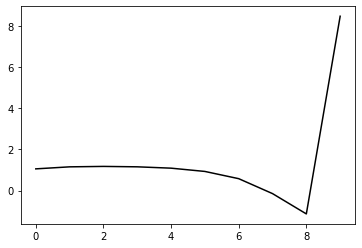

102300 0.255930802377429
0.32496912815140694 -0.40317361721690176 -0.141693418259075 -0.10973953402236492
[ 1.06198904  1.12601072  1.15426983  1.14419672  1.08205058  0.92539713
  0.57602984 -0.14808418 -1.13329063  8.43428506]


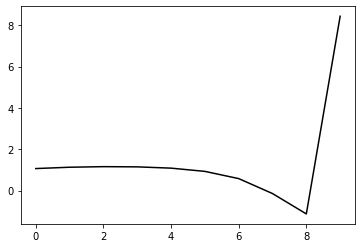

103400 0.18952500708893477
0.3273068136341551 -0.40395911834369364 -0.14366460290787833 -0.10712273715306854
[ 0.99205289  1.15239211  1.19461322  1.19194894  1.13163749  0.97494164
  0.62530797 -0.09939565 -1.08569314  8.49733553]


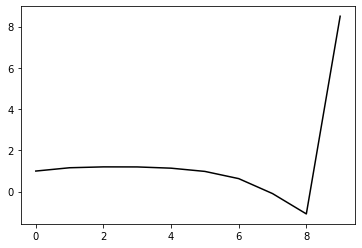

104500 0.2682934010781274
0.31743018739368445 -0.404596356744818 -0.14289282874968343 -0.1071233619779052
[ 1.0779183   1.01434581  1.02379081  1.01525886  0.94997835  0.78746381
  0.43297641 -0.2952576  -1.28346873  8.40100704]


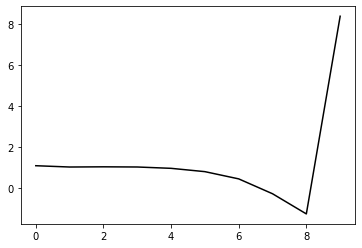

105600 0.20966464462371742
0.3274341418247931 -0.4015839054596225 -0.14299551532184435 -0.10797958490731956
[ 1.03522399  1.1492171   1.18380566  1.17508278  1.11077484  0.94735488
  0.59103083 -0.13912    -1.12903697  8.47906062]


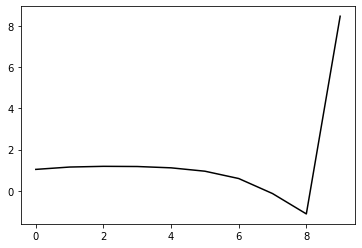

106700 0.23344354820670546
0.3166927174203441 -0.4016051610091408 -0.14155123988429963 -0.1086757360291859
[ 1.0723828   1.03842894  1.0374032   1.01871735  0.94296308  0.76764069
  0.40013091 -0.33951613 -1.33677781  8.43839098]


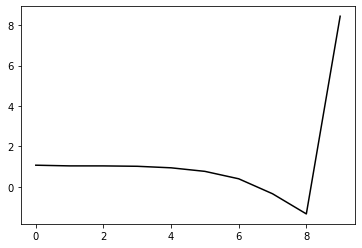

107800 0.20008857673755925
0.3230797821720872 -0.4046943082707456 -0.14590589973487314 -0.10585034960210125
[ 1.04620493  1.04595956  1.07508851  1.06450442  0.99828283  0.83174275
  0.47223914 -0.25899025 -1.2461949   8.41855525]


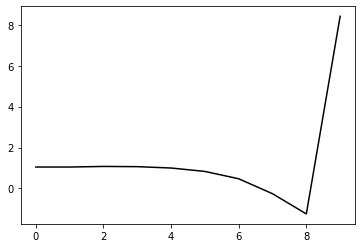

108900 0.21749011927030257
0.32908418887843044 -0.3991587208107676 -0.1436092997469234 -0.10690607623652361
[ 1.01815239  1.16913249  1.24609743  1.25521255  1.19833768  1.03637045
  0.67739514 -0.05600793 -1.04762538  8.45784982]


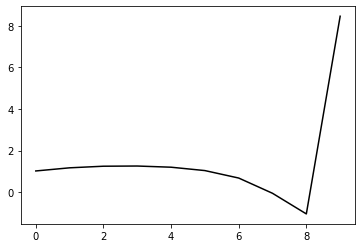

110000 0.1955624480980229
0.32592259732291273 -0.3989785773763077 -0.14331633362176652 -0.1059154401192367
[ 1.05347166  1.03253984  1.07994375  1.08380819  1.01757979  0.84461314
  0.47667022 -0.26202594 -1.25433651  8.44231924]


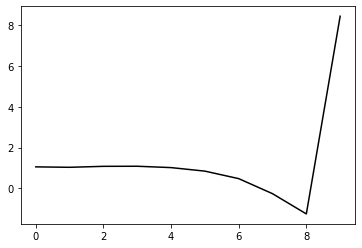

111100 0.21421264003976231
0.32427820707892674 -0.397530876410194 -0.14192934207608474 -0.11083169037537063
[ 1.07799489  1.0889363   1.15946195  1.18738188  1.14480337  0.99014239
  0.6364728  -0.08983853 -1.07014266  8.4206855 ]


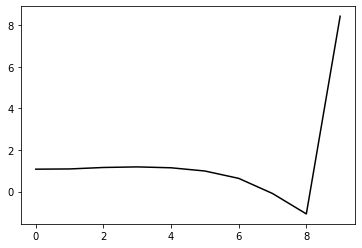

112200 0.1446274802171496
0.31473420874944247 -0.4070916445579905 -0.1472247254301712 -0.10894203100822436
[ 1.07249928  1.02516799  1.04577049  1.06733126  1.0260344   0.87279502
  0.52089031 -0.20125724 -1.17310896  8.46560464]


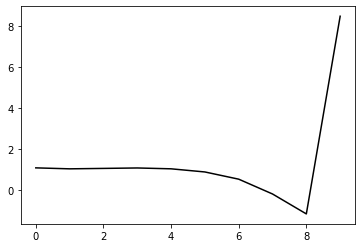

113300 0.28382455132310785
0.3230240515081479 -0.40053724763828674 -0.14534345247116284 -0.10600631281371693
[ 1.01931799  1.07367215  1.09919771  1.10113958  1.04805132  0.88330118
  0.51749357 -0.22010711 -1.20934639  8.43900731]


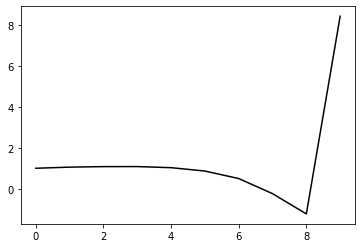

114400 0.21123855003166217
0.31866398325175316 -0.3988357146230169 -0.143091711350214 -0.108289661184212
[ 1.04432236  1.06666451  1.04640553  1.03485282  0.97718177  0.81146203
  0.44495817 -0.29212804 -1.27815428  8.43721883]


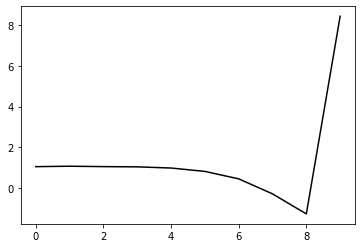

115500 0.23474954314981747
0.3290178546420898 -0.3942427573728227 -0.14240130034967705 -0.10887197631997932
[ 1.0431417   1.20313672  1.24797114  1.24041856  1.18273888  1.01860126
  0.6520002  -0.08615713 -1.07288285  8.47230603]


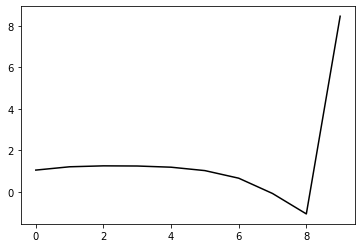

116600 0.2115980438930398
0.3227781096249218 -0.4001167386411709 -0.14621468536350257 -0.10635450549376435
[ 1.02916974  1.07624398  1.10520734  1.10464166  1.04917467  0.88847979
  0.52522544 -0.20982268 -1.19230915  8.48001278]


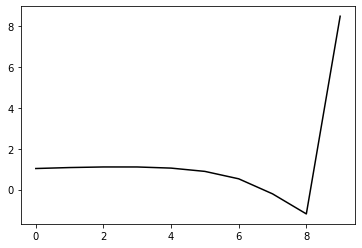

117700 0.22378001559876526
0.3212152574389403 -0.40175736141100465 -0.14747096604970636 -0.10650048462238211
[ 1.03785439  1.05877206  1.09680743  1.10490728  1.05757223  0.90525269
  0.5501116  -0.17733376 -1.15095584  8.46272741]


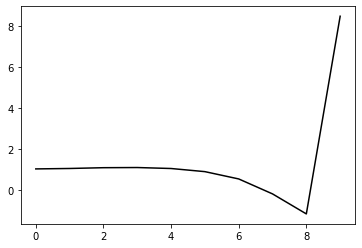

118800 0.18368281092223115
0.3210512778073875 -0.39926846211626893 -0.14594242123951068 -0.10826286232302813
[ 1.03135209  1.12716319  1.14457726  1.14788715  1.09958059  0.94675087
  0.59104112 -0.13720503 -1.10989761  8.42749472]


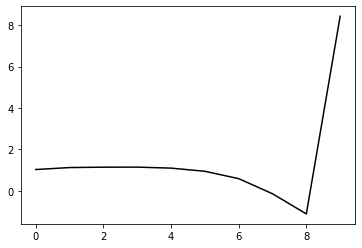

119900 0.2099727627645182
0.3246752382917171 -0.40098174994141295 -0.14925396172301253 -0.10352465382909341
[ 1.02978086  1.06198689  1.09394807  1.0929911   1.04103775  0.8858597
  0.52742424 -0.20492227 -1.1825418   8.46705861]


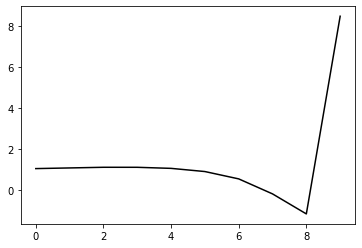

121000 0.175448812822308
0.322016013419283 -0.39693629330139685 -0.1460043876651466 -0.10631454526705257
[ 1.01741751  1.08869377  1.11766065  1.11965626  1.07181628  0.92098634
  0.56618966 -0.1639346  -1.13974665  8.42679037]


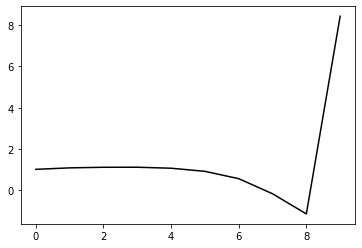

122100 0.19252898053048398
0.3115368370613228 -0.39758186205060614 -0.1441557514008303 -0.11075741571849763
[ 1.07833713  0.96816979  0.98824939  0.99224241  0.94740154  0.80175954
  0.4536242  -0.26906119 -1.23503417  8.4718645 ]


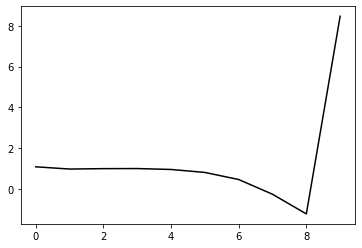

123200 0.15786193427319742
0.3133933531027277 -0.39717622402208286 -0.14490494728622982 -0.11062743464123381
[ 1.07124207  1.08903579  1.09446827  1.09523346  1.05281663  0.90992558
  0.56362981 -0.15905849 -1.12651541  8.47524596]


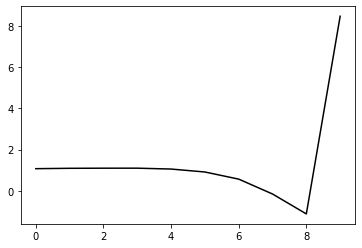

124300 0.2815528078985353
0.31434301352023386 -0.3958721006592127 -0.14596814269608355 -0.10378220675820748
[ 1.03676886  1.00632143  0.99036033  0.9732316   0.91775215  0.76500505
  0.40946156 -0.32357329 -1.30273462  8.43893786]


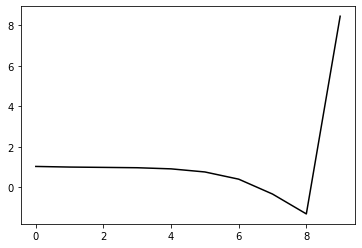

125400 0.187142627680812
0.3225619771411422 -0.3905054890149852 -0.14421372333128255 -0.1064729490842951
[ 1.0006222   1.16853807  1.18235657  1.164888    1.10825506  0.95585005
  0.60039578 -0.13393807 -1.11533604  8.47962629]


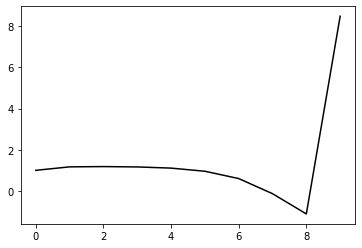

126500 0.24378047854936197
0.316093766792606 -0.3989986174382179 -0.14926115321147143 -0.10532804003617155
[ 1.04148246  1.05115606  1.08519436  1.08220438  1.0316959   0.88725452
  0.5417469  -0.18179001 -1.14995325  8.46871164]


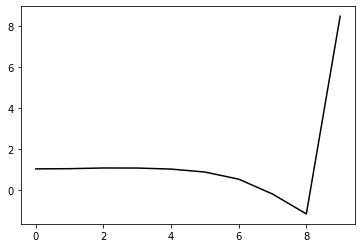

127600 0.2250950111146634
0.3133722132698131 -0.4004600168499746 -0.15020696828811084 -0.10755174937886851
[ 1.07106389  1.05003114  1.07591236  1.08020197  1.03627985  0.89740896
  0.55779819 -0.16095978 -1.12516664  8.42735711]


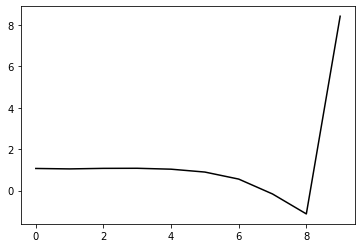

128700 0.22372576219872542
0.3173646883150313 -0.39525839299460774 -0.14830983524739105 -0.1059803958191964
[ 1.03724378  1.11770666  1.13972383  1.13255114  1.07910706  0.92998223
  0.58048526 -0.1489103  -1.12470105  8.44058859]


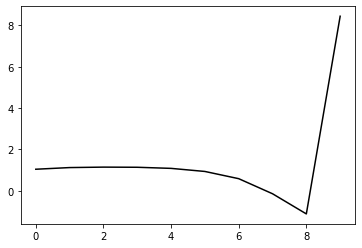

129800 0.18497384546660267
0.31656115324070827 -0.3933248322688146 -0.1472235476746487 -0.10682921418811045
[ 1.03404706  1.13802717  1.14742028  1.14265184  1.08914665  0.93910701
  0.58907645 -0.1412551  -1.11756966  8.47724229]


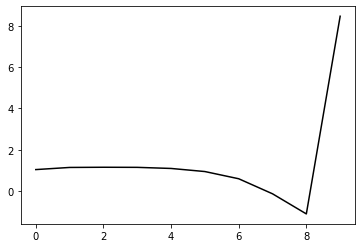

130900 0.21530078740297437
0.323298559749801 -0.3923894506517503 -0.14876625799425058 -0.10569356668688276
[ 0.99917787  1.18724781  1.24016264  1.24463614  1.19741667  1.05273216
  0.70732993 -0.02036966 -0.99663678  8.47783554]


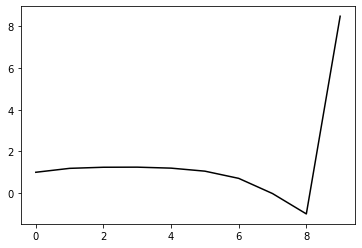

132000 0.176163752209396
0.31401647987533704 -0.3936674187251155 -0.14937679915063531 -0.10225533585555142
[ 1.04003885  1.03281082  1.03140242  1.02077345  0.95911598  0.80029667
  0.44175854 -0.2989715  -1.28899882  8.44267931]


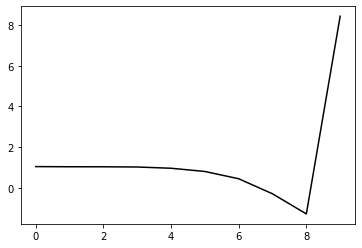

133100 0.2241176091834576
0.32290027570749347 -0.3820927927951796 -0.1425191518252617 -0.11004922474693903
[ 1.07235234  1.17602757  1.21971193  1.21241968  1.15302981  0.99508636
  0.6366341  -0.10489901 -1.09665356  8.42450788]


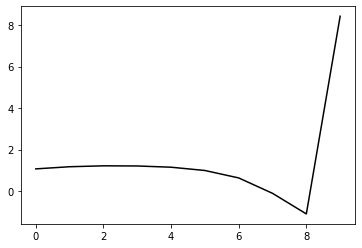

134200 0.1331523611574681
0.3176965821442474 -0.3901920493569422 -0.14736053027464813 -0.1101281924802555
[ 1.05247084  1.09637518  1.14334441  1.15440184  1.1039984   0.95387851
  0.60426975 -0.12690759 -1.10559233  8.47139737]


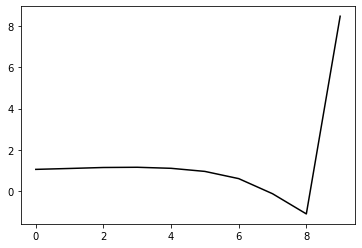

135300 0.2574068820779594
0.31628163087792827 -0.387196642485005 -0.14538214464172902 -0.11059325333238658
[ 1.0826634   1.10192451  1.11949283  1.12747522  1.08057234  0.9315983
  0.58250671 -0.14886423 -1.12890886  8.46161173]


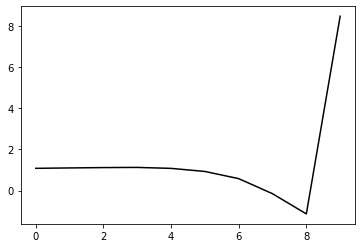

136400 0.17251985695111577
0.32094210810119417 -0.38742871947705465 -0.14721858412442346 -0.10838606925262038
[ 1.00824348  1.17800434  1.20695058  1.21093396  1.16522108  1.01795928
  0.67006173 -0.06009205 -1.03881188  8.48708377]


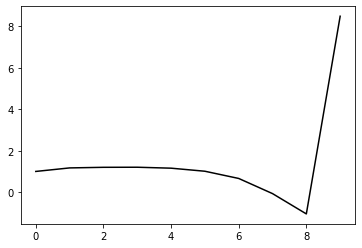

137500 0.24684832250135522
0.3192342222540475 -0.3869342899019621 -0.14764731787905738 -0.10649507440292547
[ 1.06178948  1.04805956  1.09503931  1.11073995  1.07418736  0.9364034
  0.59635263 -0.12860806 -1.10576337  8.45173309]


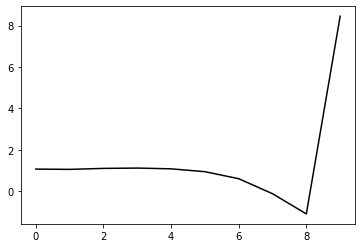

138600 0.2238290743044763
0.3126492445268269 -0.39314722047291045 -0.15102593604978987 -0.10662276690170293
[ 1.08081488  1.04349244  1.06070025  1.0723138   1.03349389  0.89336289
  0.55104951 -0.17588252 -1.15445656  8.47975517]


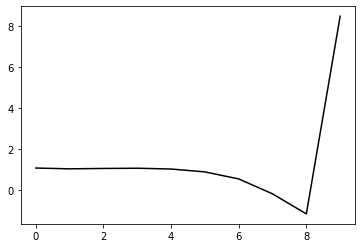

139700 0.23948671404767705
0.3146264562522428 -0.38484474250297585 -0.14533273710203065 -0.11120361126240212
[ 1.09192511  1.13011952  1.14827249  1.15573947  1.11829317  0.97957137
  0.63744494 -0.09068683 -1.07209988  8.46612434]


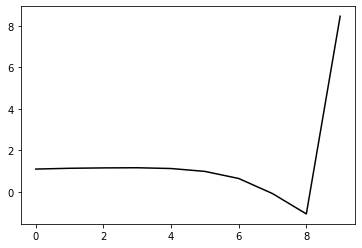

140800 0.20205932378950003
0.318740217190903 -0.3841491538323119 -0.14749495918485028 -0.10299226646902723
[ 1.04561867  1.03355678  1.0430614   1.03171799  0.97931047  0.82937109
  0.47747647 -0.25955509 -1.24915856  8.46219709]


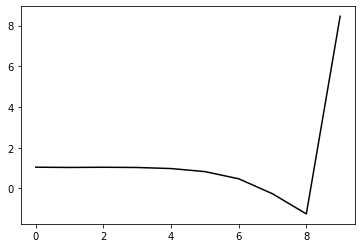

141900 0.21773117245397125
0.31734368166375143 -0.3855578798057103 -0.14863803103124942 -0.10508785777206714
[ 1.03514018  1.09117885  1.10977641  1.11013926  1.06820261  0.93109257
  0.59230558 -0.13243289 -1.11004367  8.45859272]


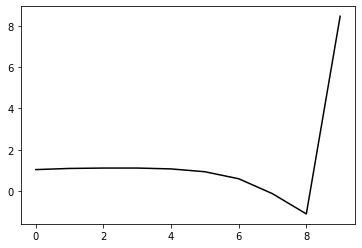

143000 0.19892432970193985
0.31924263699166666 -0.3825768631590953 -0.14732683691267548 -0.10627939759889604
[ 1.08136764  1.08355932  1.12340697  1.13053304  1.09351481  0.96181566
  0.62830677 -0.09276456 -1.06906459  8.51522743]


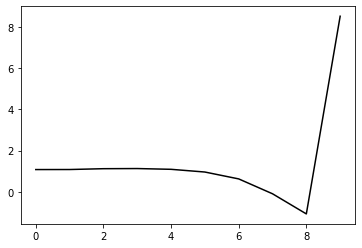

144100 0.19421418114609634
0.30957239933018355 -0.38650795623487866 -0.1479595303442466 -0.10832561091267641
[ 1.11858351  1.04501436  1.07276076  1.08521905  1.0518433   0.92446567
  0.59686519 -0.11700414 -1.08396084  8.45238102]


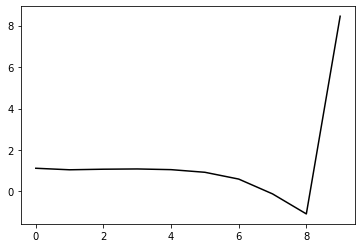

145200 0.12857862211357762
0.31576255538671105 -0.37938184529496716 -0.14534696276379303 -0.10634495187309193
[ 1.03898838  1.13199748  1.14890658  1.147837    1.10447485  0.96628077
  0.62683141 -0.10134749 -1.08701039  8.48967477]


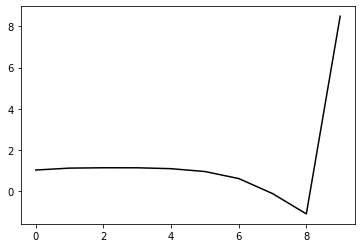

146300 0.25318671877132337
0.3101825435543034 -0.3808056956771687 -0.14554111631536068 -0.10828813356099089
[ 1.08089386  1.0962704   1.10823236  1.1067043   1.0621491   0.92380076
  0.58532    -0.14116707 -1.12425455  8.48681707]


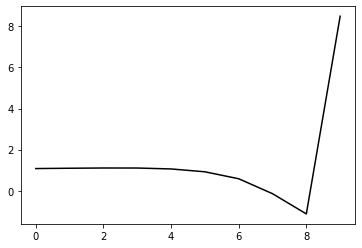

147400 0.1900209291185308
0.3108441267695864 -0.38006818138712956 -0.14627653655725217 -0.10632655272588613
[ 1.03674372  1.08502772  1.09460399  1.08807987  1.03933032  0.89785187
  0.55703175 -0.17202863 -1.1586885   8.48672871]


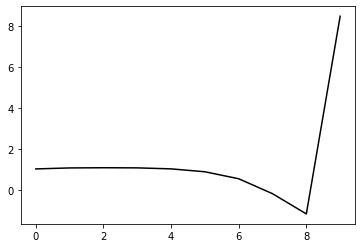

148500 0.2338419674306681
0.3132680138286645 -0.37983590333171685 -0.14671991448438548 -0.10795219108468522
[ 1.06502945  1.11862865  1.15497615  1.16014168  1.12050419  0.98865609
  0.65848603 -0.05923608 -1.03349497  8.46303154]


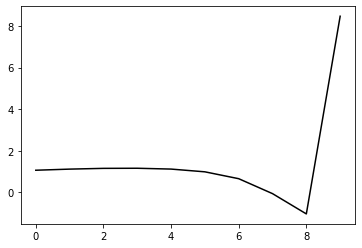

149600 0.2571165403444568
0.2877779365838574 -0.3817728894446848 -0.142636225607816 -0.11241775588605386
[ 1.09293075  0.81971295  0.82637016  0.815843    0.75825957  0.6094031
  0.26400181 -0.46818341 -1.45750988  8.43217137]


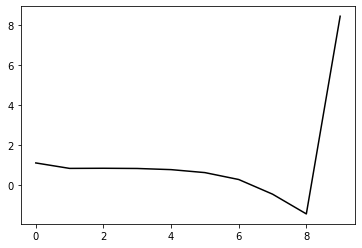

150700 0.22618192614654195
0.30250432276346134 -0.39181295953340833 -0.1547458177472881 -0.11039115675823448
[ 1.04818183  1.05548796  1.04885617  1.04665571  1.00081208  0.86270083
  0.52778621 -0.1938925  -1.17205954  8.47131077]


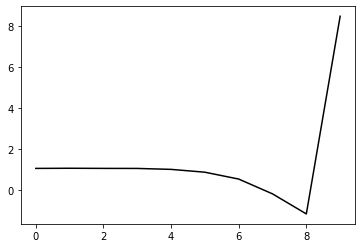

151800 0.18437775909960818
0.3084599186898176 -0.3838732125888072 -0.150989188476535 -0.11206296028971167
[ 1.02057088  1.13270822  1.14088349  1.13129506  1.08190181  0.94070653
  0.60278864 -0.12222704 -1.10482544  8.4599574 ]


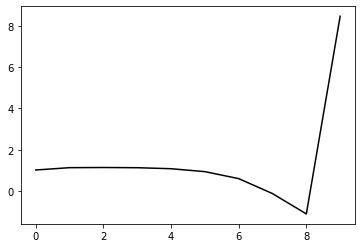

152900 0.20456352749258438
0.31017140392925324 -0.3847643564473891 -0.15283299427866923 -0.11009944363432868
[ 1.00072899  1.13228253  1.15892423  1.15451416  1.10689946  0.9683348
  0.63345032 -0.08870062 -1.06925733  8.45298845]


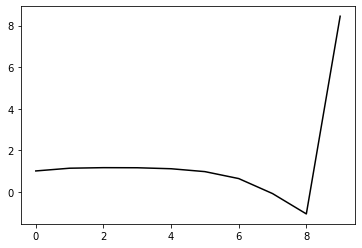

154000 0.27207594151083064
0.30662462788226424 -0.3798689719865418 -0.14861730996452188 -0.11332779993626427
[ 1.12250981  1.02390055  1.05533399  1.05508444  1.00867777  0.87199942
  0.54060582 -0.17708088 -1.15299772  8.50062029]


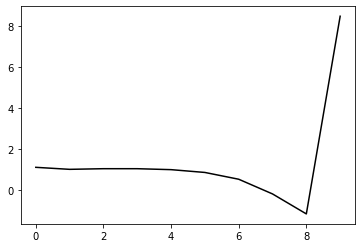

155100 0.421433617928568
0.3029587831407175 -0.3680710690639272 -0.14051990214107682 -0.11359985789297443
[ 1.11386397  0.99705553  0.9982776   0.97698504  0.91145721  0.75434299
  0.40223851 -0.33701617 -1.33727525  8.3992384 ]


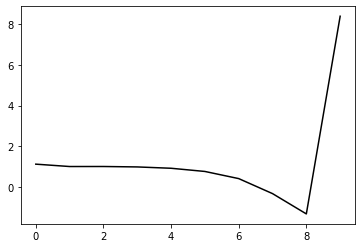

156200 0.1372803011462192
0.31261725368088095 -0.36961186783963684 -0.14478824692846712 -0.11163650944867666
[ 1.03695487  1.13066319  1.13596588  1.1027172   1.02675212  0.86094331
  0.50212755 -0.24190298 -1.24548735  8.46052023]


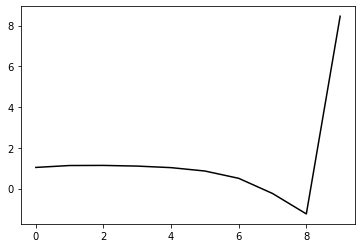

157300 0.264517136680526
0.31822315314434985 -0.36761682020623065 -0.1455761944818543 -0.11007104662412062
[ 1.0195521   1.14372238  1.19905286  1.18191986  1.10804469  0.94256234
  0.58382791 -0.16044658 -1.165364    8.44198913]


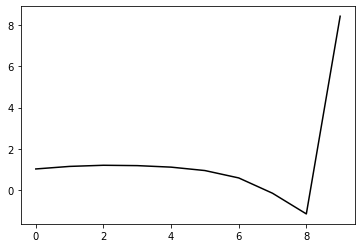

158400 0.19620543491205078
0.3103102827581988 -0.3733824142488141 -0.1480263793560513 -0.11078445096665746
[ 0.99243978  1.02449354  1.07182535  1.0747097   1.00997118  0.85041879
  0.49853213 -0.23721002 -1.2314798   8.50328626]


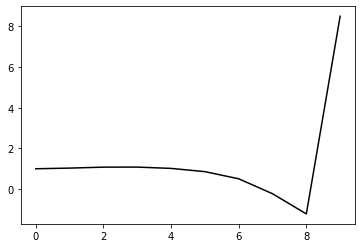

159500 0.24928746316843517
0.30956067160881073 -0.3767553849705334 -0.15099488675204015 -0.10939750165557828
[ 1.02533886  1.00462984  1.03009769  1.04030896  0.99044532  0.84116527
  0.49872899 -0.22706296 -1.21070757  8.43030524]


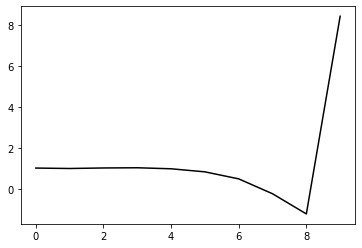

160600 0.22226532924802678
0.3057552585277926 -0.3795718951254288 -0.1527911001444776 -0.10988967513853687
[ 1.05194609  1.01495436  1.02940744  1.03690546  0.9928866   0.84740889
  0.50691149 -0.217316   -1.20034663  8.45527098]


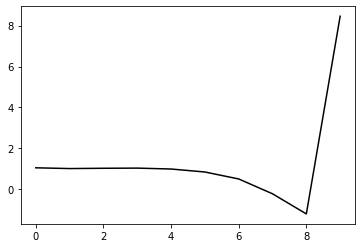

161700 0.2205298179558028
0.30621119123258267 -0.37566853109633047 -0.15033937248906176 -0.1125724074390581
[ 1.07141648  1.07396712  1.0884479   1.09270432  1.0540963   0.91483642
  0.57865603 -0.14183858 -1.12196547  8.44789497]


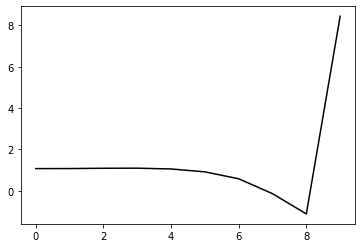

162800 0.19477035479021468
0.303766786408141 -0.3769475653094415 -0.1513407660807197 -0.11260403929642838
[ 1.03966081  1.10896638  1.09699483  1.08080659  1.02614891  0.87438947
  0.52677961 -0.20337255 -1.19173621  8.44546586]


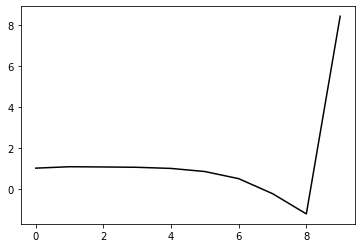

163900 0.20876811959010466
0.3100527591506406 -0.37621634610543797 -0.15379825857993756 -0.10696338281479503
[ 1.01155831  1.08208665  1.09828519  1.07569133  1.01205664  0.85383293
  0.49937914 -0.23835383 -1.23602274  8.44563127]


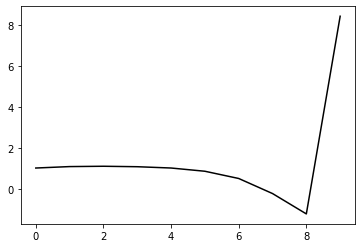

165000 0.1801499190138644
0.3097086963455852 -0.37037588667753096 -0.15007072811633151 -0.10813462376827726
[ 1.00320153  1.09438802  1.11826209  1.10059839  1.03597525  0.87715745
  0.52177547 -0.21751624 -1.2178075   8.46528712]


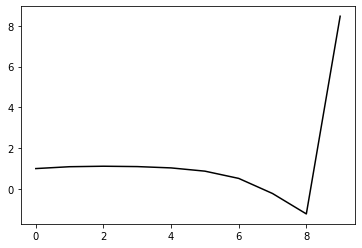

166100 0.18604420205684077
0.3043790886626048 -0.3694242405613412 -0.14820273765738498 -0.11249182822858503
[ 1.08464195  1.05184872  1.09306969  1.09464433  1.04144619  0.89288177
  0.54788218 -0.18116039 -1.17145228  8.48276766]


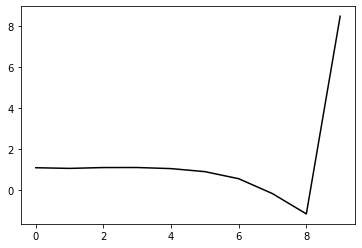

167200 0.16555474071501883
0.3014535430445812 -0.3698087349959341 -0.14831869504788434 -0.11257902775068507
[ 1.0734599   1.05069209  1.0583401   1.05840249  1.00757028  0.86047647
  0.5178592  -0.20768589 -1.19344987  8.47512745]


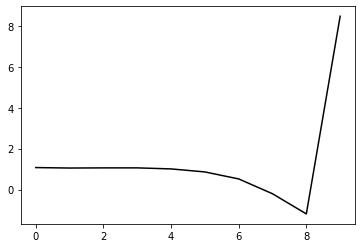

168300 0.28607915828595243
0.30695849919166285 -0.36472443989806 -0.14696599532647037 -0.1112822077417133
[ 1.08479093  1.15268525  1.1814658   1.18223339  1.13710813  0.99447281
  0.65357686 -0.07339876 -1.06530094  8.45458022]


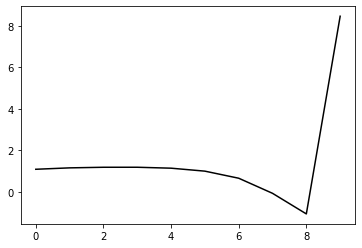

169400 0.17933980100844013
0.303735462482824 -0.3683558512741381 -0.14982854294720518 -0.10829510209472687
[ 1.03832688  1.10058358  1.12089248  1.11829867  1.06674794  0.91878823
  0.57351729 -0.15632685 -1.1492535   8.46413289]


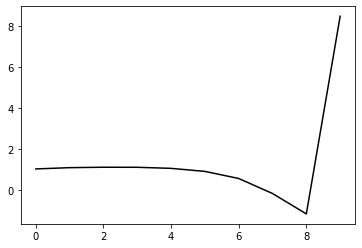

170500 0.2518009245217338
0.3045179249007802 -0.37143540052230445 -0.15292765999098853 -0.10613779165251017
[ 1.02681404  1.04468575  1.07667579  1.07746786  1.02755121  0.88128093
  0.53799254 -0.18953283 -1.17986885  8.42220902]


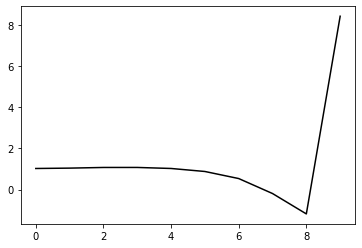

171600 0.2183524611442838
0.3008038999636222 -0.3711273844072794 -0.15234517188193564 -0.10735610688863406
[ 1.05619734  1.01821444  1.02875647  1.02763934  0.98001187  0.83610629
  0.49513228 -0.23036975 -1.21938998  8.46172101]


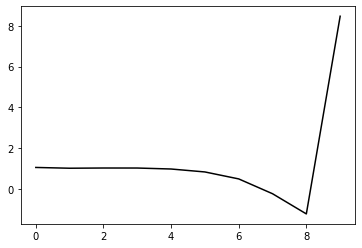

172700 0.19125220270750415
0.30593564850980703 -0.36410753132360646 -0.1485145367087981 -0.11150008035352445
[ 1.04703717  1.17514039  1.20763427  1.20896182  1.16514722  1.02471412
  0.68601729 -0.03825841 -1.02729985  8.47107099]


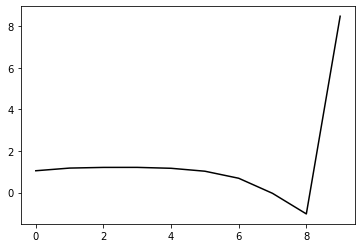

173800 0.20892566946130256
0.30094171199662895 -0.37123676397854516 -0.15391870829106125 -0.10368045950113738
[ 1.0601417   0.94893658  0.98371978  0.98042131  0.92503514  0.77427974
  0.42639479 -0.30641689 -1.30411821  8.47365408]


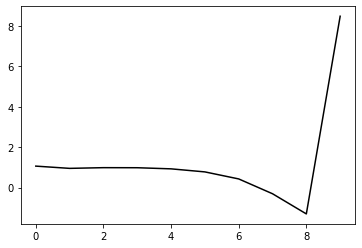

174900 0.20596623301685915
0.3089699664920345 -0.36789652411894547 -0.15396911217200435 -0.1051080816989793
[ 1.02552981  1.104843    1.1385311   1.13633848  1.08292139  0.93251068
  0.58484055 -0.14740424 -1.14390394  8.43559585]


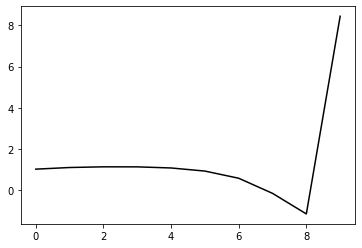

176000 0.272184519545287
0.3023152417894218 -0.36176957736233795 -0.1480810159655757 -0.11123766136812752
[ 1.11625875  1.04370499  1.08045844  1.08233884  1.03350634  0.88704518
  0.54309369 -0.18540665 -1.17804287  8.48653125]


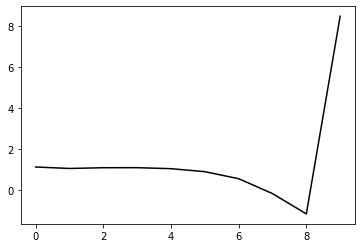

177100 0.189933667530033
0.29848553625467683 -0.36558560755581326 -0.15040273462870257 -0.11071278543610238
[ 1.09307078  1.06781491  1.08345526  1.0810006   1.03147479  0.88501292
  0.54174776 -0.18511124 -1.17498825  8.44327676]


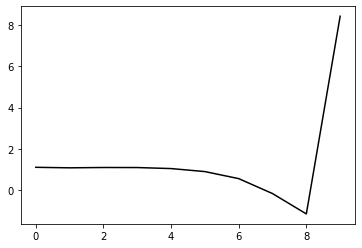

178200 0.1357283445556169
0.298300796693031 -0.3637283864071734 -0.14960084930709353 -0.10975514825450669
[ 1.04999372  1.06220402  1.07951558  1.06660815  1.00624336  0.85002074
  0.49749795 -0.23806391 -1.23664781  8.45177379]


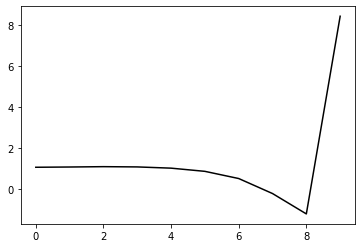

179300 0.24823467105477096
0.29767174690397985 -0.3602432686102561 -0.1474686635930806 -0.11050872444677697
[ 1.06764683  1.02378155  1.04522894  1.03657542  0.97632481  0.82038812
  0.46853313 -0.26599833 -1.26333518  8.43794265]


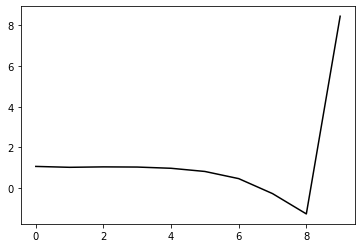

180400 0.17251261438664056
0.30423462199176515 -0.3606426501889483 -0.1497743781386038 -0.10912835162996691
[ 1.00507689  1.15959632  1.19709072  1.19548826  1.13844083  0.98395479
  0.6332471  -0.09991617 -1.09546695  8.48695117]


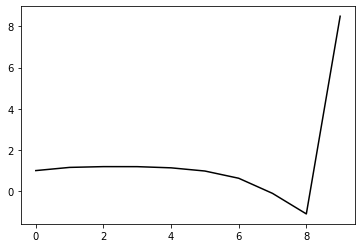

181500 0.24802890080848577
0.30036271722226143 -0.3598023712950317 -0.1488360322764815 -0.10918860649562032
[ 1.03738143  1.09263916  1.10033431  1.10129265  1.04790656  0.89633698
  0.54929123 -0.17918014 -1.16891114  8.43541628]


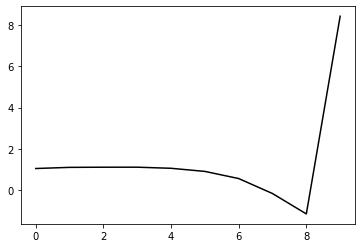

182600 0.20716056286303977
0.3046387966272347 -0.3582618226660735 -0.14906712346887419 -0.10977184832239698
[ 1.01415528  1.1539022   1.18736343  1.18449255  1.12826553  0.9727789
  0.62133775 -0.11117688 -1.1046484   8.49477374]


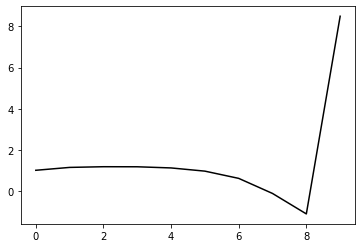

183700 0.21980134489930517
0.29869096877421925 -0.3589752505652148 -0.14789905895406438 -0.11258201476617444
[ 1.06652859  1.0815569   1.12981987  1.1410335   1.09360237  0.94608913
  0.6024595  -0.12169205 -1.10590418  8.46245529]


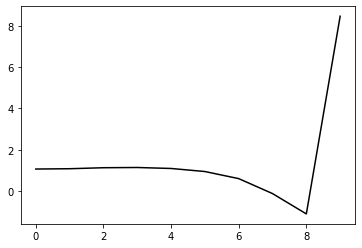

184800 0.18562177023745677
0.29801402603230104 -0.3633143947553924 -0.1522379103155533 -0.10924470656357634
[ 1.03114891  1.07763055  1.09335826  1.09884162  1.04959556  0.89826129
  0.54970364 -0.17964085 -1.16917269  8.45296218]


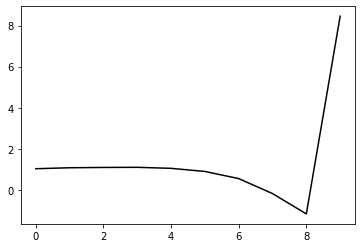

185900 0.21433984380991006
0.30182590022735845 -0.36229111924213125 -0.15367988283263934 -0.10506224725925656
[ 1.01583005  1.02734792  1.03978557  1.03558609  0.98345807  0.8295955
  0.4771807  -0.25698575 -1.25273932  8.42376496]


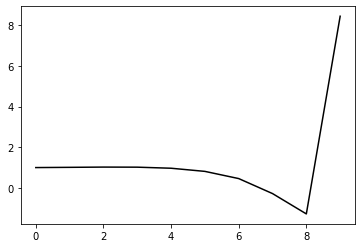

187000 0.25767901399478177
0.2978065630599856 -0.35857218120019185 -0.149909637686166 -0.11161549346324226
[ 1.1081957   1.02441103  1.05736213  1.06132201  1.02116065  0.88066986
  0.54051826 -0.18172928 -1.16488097  8.47218962]


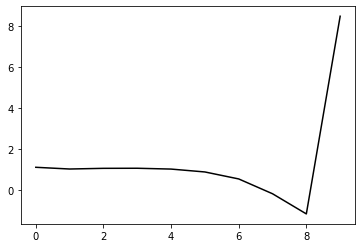

188100 0.20485668882878486
0.29205546669460675 -0.36368175090338184 -0.15256383949275845 -0.11274305023248449
[ 1.11291726  1.04839375  1.06539228  1.07405043  1.04062763  0.90806611
  0.57472064 -0.1419761  -1.12056928  8.44588462]


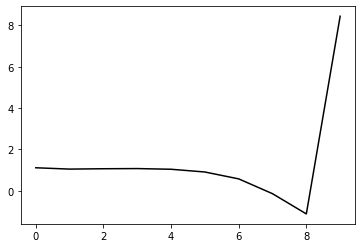

189200 0.1393902118253763
0.29660694615112027 -0.36161614690832866 -0.15300403587127998 -0.11138134909258308
[ 1.05834585  1.10372541  1.13117651  1.13403491  1.09741455  0.96460906
  0.63058985 -0.08811765 -1.07033316  8.50399442]


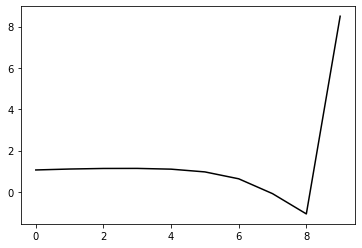

190300 0.25521347008017103
0.29454356983723656 -0.357395031795492 -0.149957995605518 -0.1120860487651775
[ 1.08563079  1.08160696  1.08038303  1.07636008  1.03672276  0.90405319
  0.57100697 -0.14719557 -1.12932726  8.44700279]


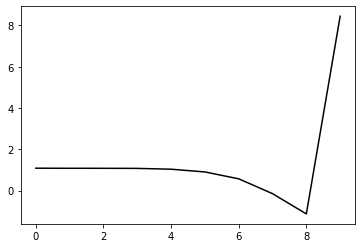

191400 0.17292573954761267
0.3003369252717705 -0.356539995470957 -0.15158775740220887 -0.10934286964733726
[ 1.00353387  1.18594192  1.20640908  1.19629853  1.14864728  1.01030496
  0.67234133 -0.05126242 -1.03899838  8.47638979]


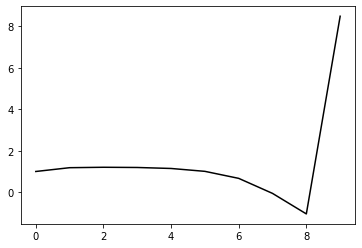

192500 0.2661033399800903
0.2862538087671089 -0.3681248384958878 -0.15834016257782815 -0.10364226049829957
[ 1.06148881  0.92534193  0.88967646  0.86234867  0.79919694  0.65195873
  0.31158129 -0.40975333 -1.39053904  8.40180736]


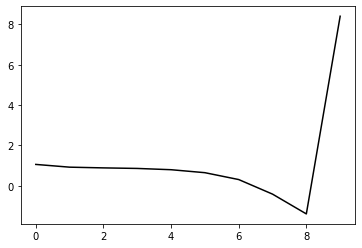

193600 0.21963725396230951
0.2977393606021068 -0.3622410313559388 -0.15614041144977353 -0.11127796303059105
[ 1.04418104  1.16190008  1.15197873  1.11712138  1.05097563  0.90218452
  0.56192902 -0.15834321 -1.13703539  8.461025  ]


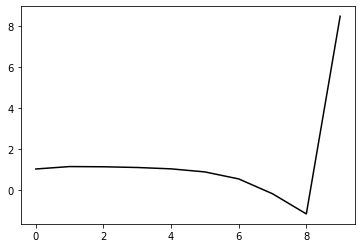

194700 0.2090037458625506
0.2980395062646162 -0.3582798888551035 -0.1538026639551423 -0.11114594794621406
[ 1.05872097  1.10710299  1.13612311  1.10870529  1.03768391  0.88490922
  0.54262491 -0.17901883 -1.1588526   8.45749604]


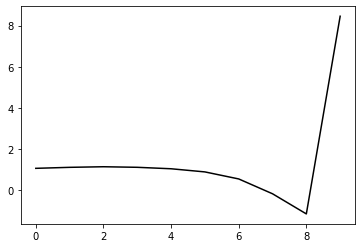

195800 0.18950771521725507
0.2935788309535401 -0.36550313072189133 -0.158548857166272 -0.11095551812931101
[ 1.05518792  1.0916582   1.10650884  1.08671144  1.01634165  0.8630123
  0.52262337 -0.19528631 -1.16954869  8.43432148]


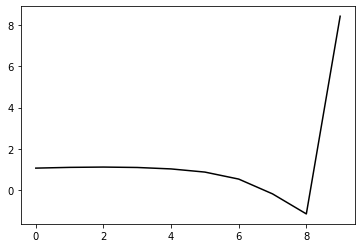

196900 0.26096671157912227
0.30364404802359046 -0.361231133968401 -0.15841390786358703 -0.10854456863622959
[ 0.98716641  1.20246794  1.24089397  1.21731521  1.1369205   0.97007309
  0.61730964 -0.11206512 -1.09795589  8.4430826 ]


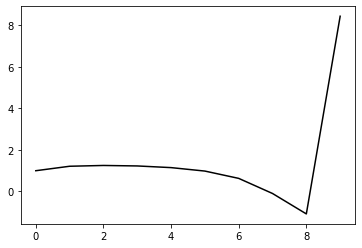

198000 0.17503912213060313
0.2948861289666973 -0.36158121539596105 -0.1576609153103217 -0.10815723133593737
[ 1.04240466  1.08093745  1.0623534   1.02206319  0.92875821  0.7501496
  0.38934568 -0.34474528 -1.3327148   8.43582045]


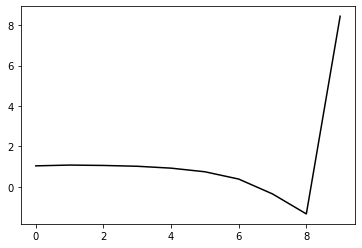

199100 0.2696141303713305
0.30278828068506425 -0.3485896035198728 -0.14938544709738255 -0.11478036531354166
[ 1.08844537  1.20256307  1.25164172  1.20926679  1.1074958   0.91811219
  0.54670932 -0.19777365 -1.19745409  8.44714087]


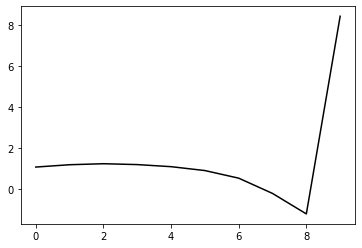

200200 0.1277728192607071
0.3034814701472736 -0.35000126252849023 -0.15135274750394237 -0.11193715404029136
[ 1.04436501  1.15113011  1.20641245  1.18339616  1.08359212  0.89105575
  0.51692431 -0.22889512 -1.2293318   8.48842976]


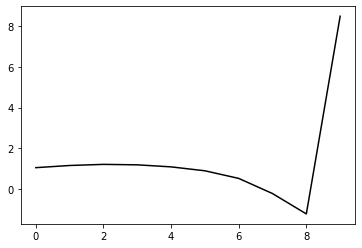

201300 0.25639119714811653
0.3033843337377391 -0.35037056659012594 -0.15199696261274576 -0.11293497604623835
[ 1.06320555  1.13755644  1.19576718  1.20047574  1.12284749  0.94269344
  0.57897648 -0.15565504 -1.14452914  8.45956025]


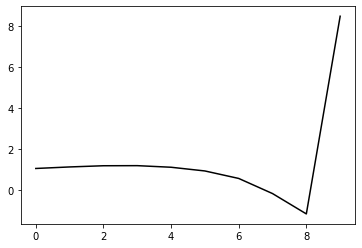

202400 0.1709439212389862
0.3097769185132058 -0.34545948531814036 -0.15078571644097316 -0.10978342313412118
[ 0.99237342  1.2301764   1.30223437  1.31257556  1.23984099  1.05614791
  0.68385069 -0.06154093 -1.0654886   8.46907772]


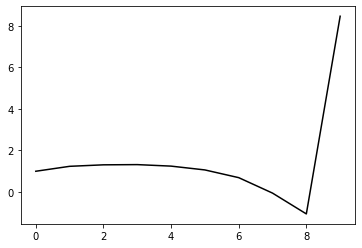

203500 0.25096545414327776
0.3003134929296967 -0.3521335547572513 -0.15417969423822095 -0.10786270882814246
[ 1.04743019  1.07357214  1.10871728  1.11972037  1.05333472  0.87243811
  0.50120445 -0.241037   -1.23867021  8.42658092]


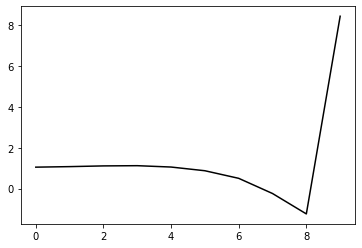

204600 0.21076362482206765
0.2973400212643457 -0.35242042422400305 -0.15409697287024104 -0.10790705660562289
[ 1.07613553  0.98571196  1.01166567  1.02057654  0.96369952  0.79095331
  0.42401544 -0.31335133 -1.30480295  8.46337621]


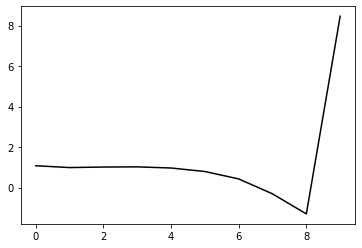

205700 0.21342859793872487
0.2988540323519162 -0.3460933176484032 -0.14985760007870347 -0.11083125080573161
[ 1.07148264  1.10084867  1.09452878  1.0841043   1.01747849  0.8362818
  0.4586688  -0.28886807 -1.28960625  8.43019624]


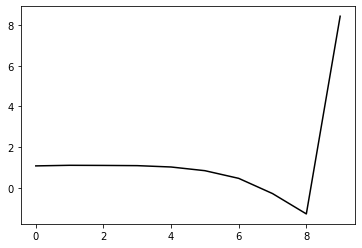

206800 0.18716721702834963
0.3015175328816673 -0.3508280274205437 -0.15475925274350139 -0.1099073430982799
[ 1.02869359  1.12637522  1.16448689  1.16513494  1.10958012  0.94173337
  0.57497094 -0.16200786 -1.15091595  8.49719148]


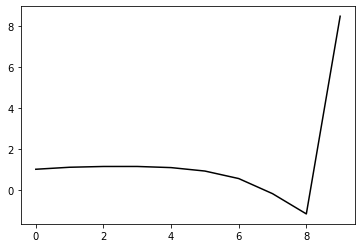

207900 0.23145304197985994
0.29963870986614216 -0.35156014533647 -0.15511098594103412 -0.11148165598430676
[ 1.05856107  1.09955958  1.14205979  1.15503976  1.11058242  0.9555829
  0.60006626 -0.12603156 -1.10291941  8.46662085]


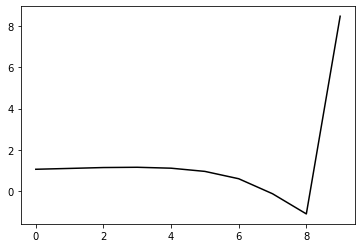

209000 0.22937932993198532
0.2992466410873532 -0.35165420983233275 -0.15563954150576512 -0.1112827881821946
[ 1.11661689  1.05812421  1.08900262  1.09965147  1.05759626  0.90641085
  0.55284586 -0.17221521 -1.14727952  8.47601163]


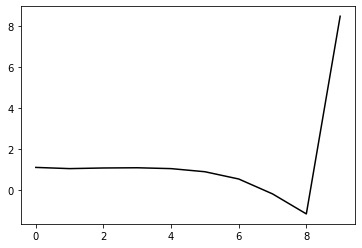

210100 0.2578273503997216
0.29590471337534785 -0.3419166552311576 -0.1481604762076007 -0.11239606966631213
[ 1.10447129  0.97582728  1.01076038  1.00359403  0.94593442  0.78189609
  0.41488382 -0.32446383 -1.31435032  8.42528807]


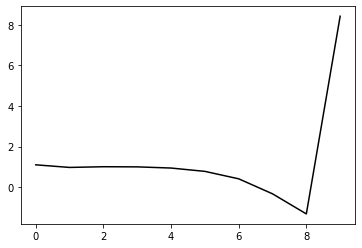

211200 0.1426374960481317
0.30129925804784363 -0.34516291927154136 -0.1526629482065201 -0.10924935597731945
[ 1.07915881  1.09389712  1.1099473   1.10211779  1.04435728  0.88121331
  0.51466961 -0.22457    -1.21336966  8.45307106]


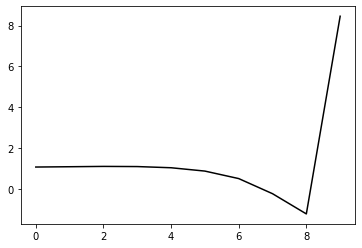

212300 0.304882262452229
0.30111963226701083 -0.34264859899785277 -0.1509234095916513 -0.11256834963134035
[ 1.11374618  1.13735892  1.1707205   1.16842422  1.11361067  0.9538091
  0.58937553 -0.14923017 -1.13734864  8.45873514]


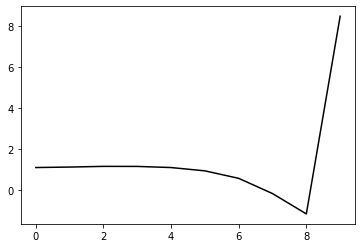

213400 0.21928222918262158
0.30044422130325454 -0.3499340870517834 -0.15763628994671006 -0.10432777028464345
[ 1.03521605  1.05943877  1.06606739  1.05396529  0.99003085  0.82288074
  0.45216824 -0.29229368 -1.28446521  8.47669599]


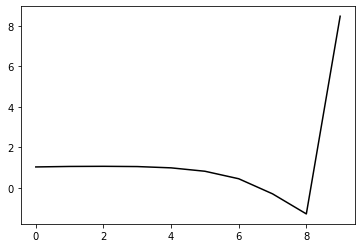

214500 0.25160119662556557
0.3035275322755962 -0.34651151341760644 -0.156218029643678 -0.10482513750744539
[ 1.05099233  1.00139845  1.01991699  1.00562958  0.94362792  0.78002025
  0.41300154 -0.32863847 -1.31775468  8.42083511]


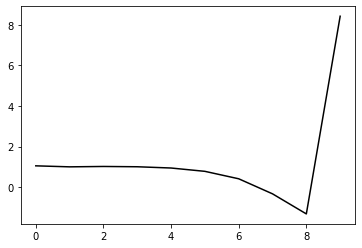

215600 0.21256895380605184
0.3049312030580032 -0.3440479188046718 -0.15431379579352908 -0.10991678281161216
[ 1.05513768  1.13676917  1.1750823   1.17161626  1.1166693   0.9605223
  0.60104927 -0.13353447 -1.1143722   8.47207679]


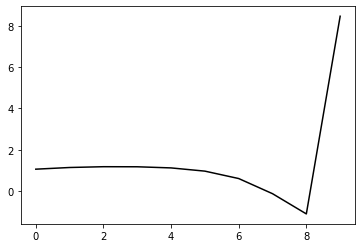

216700 0.233781127626673
0.2949177580784345 -0.3432275935726453 -0.1523807202680398 -0.11043115521924905
[ 1.08923303  1.05841557  1.04362529  1.02537078  0.95645193  0.7873425
  0.41694599 -0.32706444 -1.31475271  8.43053459]


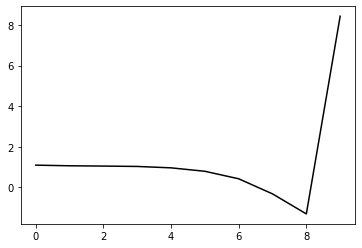

217800 0.1884362304287528
0.298607645127511 -0.3469629787648259 -0.15650891252209742 -0.10946743773925302
[ 1.05435457  1.09032411  1.10744542  1.09703463  1.03744832  0.87832133
  0.51790691 -0.21683086 -1.1945789   8.45525881]


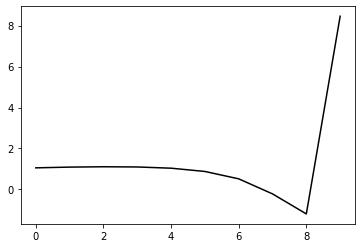

218900 0.21017766994430492
0.30402341275785927 -0.3457238434423742 -0.1572793950433677 -0.10881968149977096
[ 1.02983846  1.18393811  1.21494456  1.21099267  1.15462796  0.99804956
  0.63979674 -0.09397974 -1.07092224  8.46716594]


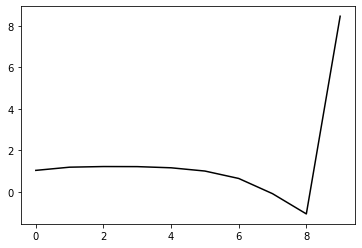

220000 0.18303791347102305
0.3039924468235347 -0.3430517562538553 -0.15587765565524989 -0.10824267967872193
[ 1.08104838  1.07134501  1.10613248  1.10580302  1.05132194  0.89597467
  0.53881873 -0.19524024 -1.17336591  8.48385917]


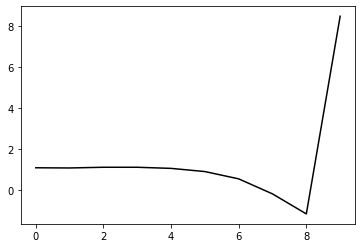

221100 0.19557138468381008
0.2933499561994026 -0.3429147162287944 -0.15331075957681697 -0.11231063413001546
[ 1.0932356   0.96096051  0.97201392  0.96493115  0.90624795  0.74806657
  0.39034759 -0.34229142 -1.31588618  8.44237783]


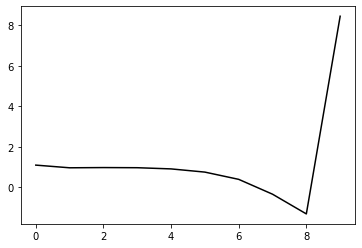

222200 0.13539972066459127
0.3007906524963142 -0.34342419669858093 -0.1560104943637203 -0.11028757373293019
[ 1.05337706  1.15125592  1.15736804  1.14323322  1.08201503  0.92100827
  0.55975442 -0.17763595 -1.1574128   8.46218821]


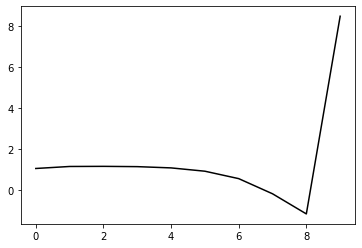

223300 0.25861373631295664
0.30008801038697785 -0.3404061603771355 -0.15417709315627212 -0.10965923333734777
[ 1.08475909  1.07176804  1.10709647  1.09727841  1.03276085  0.86894731
  0.50507356 -0.2352801  -1.21825586  8.46448539]


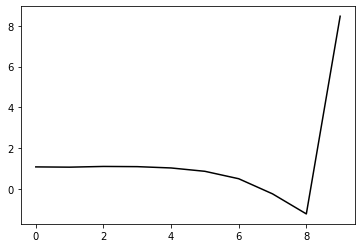

224400 0.17556655200746002
0.3017617113124013 -0.33898687491794466 -0.1540278477237211 -0.10954490665415034
[ 1.0402869   1.11022068  1.14089143  1.13640766  1.07202217  0.90704057
  0.54244539 -0.19843859 -1.18136394  8.48121534]


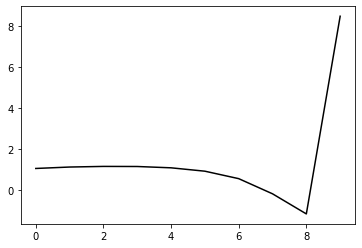

225500 0.26171912627044575
0.29593444397446295 -0.3391869608804671 -0.1534233921367365 -0.1105305952325659
[ 1.06982424  1.05205071  1.05536007  1.04741685  0.98122158  0.81314545
  0.44627996 -0.29579466 -1.27811029  8.45369351]


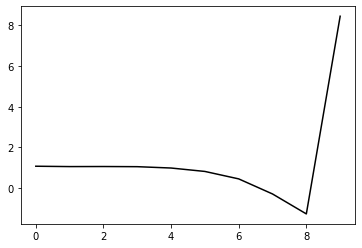

226600 0.19906406084647857
0.2995563748349319 -0.3382090214417196 -0.15354895497897958 -0.11226133574245122
[ 1.08594929  1.08805627  1.1119625   1.10663559  1.04790441  0.88666925
  0.52629962 -0.20903979 -1.18332045  8.47838643]


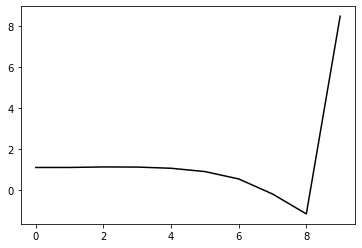

227700 0.2170825303787908
0.2989885814441468 -0.33883323392693526 -0.1550451344665965 -0.10909327076999399
[ 1.06228766  1.08406347  1.09660946  1.08759307  1.02380103  0.85665933
  0.48910289 -0.25477634 -1.23909881  8.43646211]


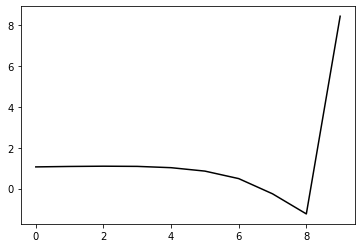

228800 0.30488616690157744
0.30602638409549976 -0.33975738368913583 -0.15773490965169457 -0.10800002157677553
[ 0.96622343  1.13537686  1.16703764  1.15406424  1.0849071   0.91327545
  0.54197918 -0.20468207 -1.19039278  8.48800629]


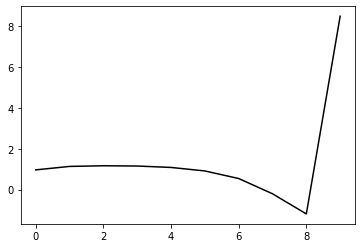

229900 0.24415082749157707
0.3084193160259675 -0.3371684025612575 -0.15724371918184307 -0.10781546452891742
[ 0.98030454  1.21501445  1.24603164  1.23636342  1.17064534  1.00027899
  0.62838361 -0.12048997 -1.10959301  8.4511106 ]


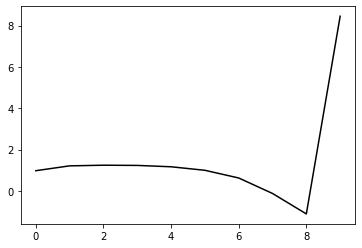

231000 0.17268729543043246
0.3038038748840596 -0.33610603318971 -0.15540421242991967 -0.11050505013075286
[ 1.0247401   1.12610791  1.17522322  1.17268631  1.11049718  0.94362445
  0.57529926 -0.16952409 -1.15320359  8.48483191]


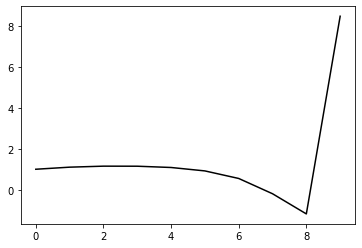

232100 0.3241523634379717
0.29717302167538673 -0.3325211000294944 -0.15135668491025817 -0.11432283251903101
[ 1.11225577  1.06286269  1.11310234  1.12329232  1.06803009  0.90579751
  0.54098399 -0.20137022 -1.18332225  8.47722526]


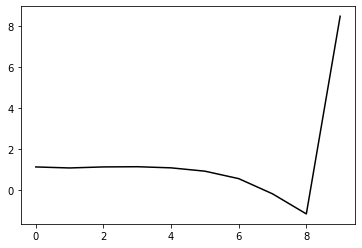

233200 0.15093448221083072
0.30293004559947007 -0.3304058410213951 -0.15200048626846183 -0.11096787512722316
[ 1.07200401  1.13286981  1.15307772  1.14764247  1.08297881  0.91061129
  0.53588307 -0.21564906 -1.20578967  8.4667518 ]


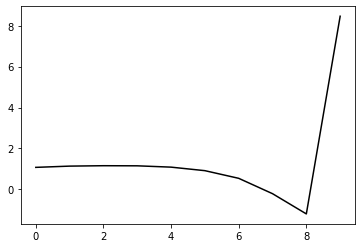

234300 0.26430538373704293
0.3067133785707783 -0.3287281617120182 -0.15251155634229674 -0.1099750127930115
[ 1.03554159  1.14423857  1.19451242  1.19342344  1.13037205  0.9584755
  0.58255445 -0.17145427 -1.16519207  8.43382272]


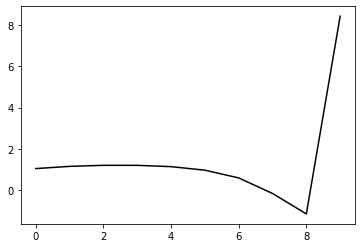

235400 0.18345495436380171
0.2996452299063255 -0.33666097151664726 -0.15649818523569492 -0.11169157638334583
[ 1.0230708   1.04691662  1.08400876  1.10262122  1.05620164  0.89939817
  0.53812355 -0.20031722 -1.17524467  8.47963841]


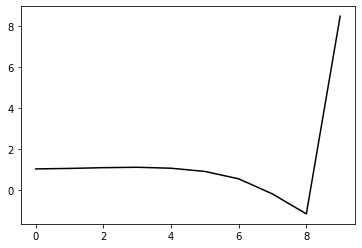

236500 0.2260116615868018
0.3033513346086088 -0.33503081089234266 -0.15667544624409105 -0.11135842869957671
[ 1.07187204  1.12628234  1.16769116  1.18487362  1.14867696  1.00153461
  0.64788966 -0.08414039 -1.05285639  8.46948922]


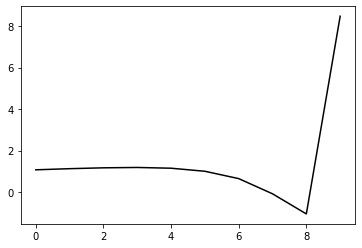

237600 0.20106497538115042
0.2932396365619576 -0.33443331883116306 -0.1547576328687368 -0.11019501647273675
[ 1.08292602  1.02687534  1.02534627  1.02027459  0.96364381  0.79775675
  0.42471662 -0.32751206 -1.31740634  8.4511429 ]


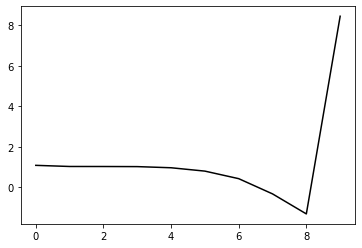

238700 0.22226864534330507
0.29636782365868475 -0.33633906086631615 -0.1575617347356144 -0.10887295225681487
[ 1.07584269  1.02061177  1.03392637  1.02948015  0.97753663  0.81856468
  0.45184692 -0.29475799 -1.27869259  8.42465119]


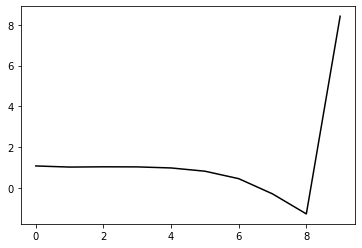

239800 0.18508358205496694
0.3027414752080574 -0.3340137869297548 -0.15765522516046493 -0.10973394974193383
[ 1.04173068  1.14787249  1.18566599  1.18743193  1.14085986  0.9885922
  0.62705142 -0.11637619 -1.09794874  8.47275337]


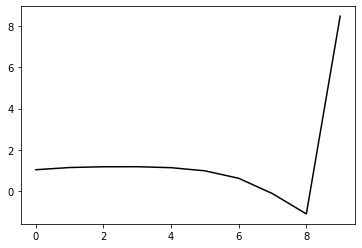

240900 0.23423864326426333
0.3002097014011422 -0.3329977293682938 -0.15667210467979517 -0.11153414854255748
[ 1.07395718  1.09980229  1.15369229  1.1680462   1.12656184  0.9794341
  0.62222573 -0.11886664 -1.09916961  8.44902362]


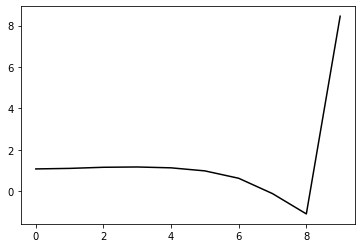

242000 0.20361958032726704
0.2999370304186048 -0.33139630161266104 -0.15634409856523815 -0.11040551814288728
[ 1.08033781  1.0608158   1.09807985  1.10861086  1.06494045  0.91492067
  0.55435394 -0.19222869 -1.18018879  8.46425076]


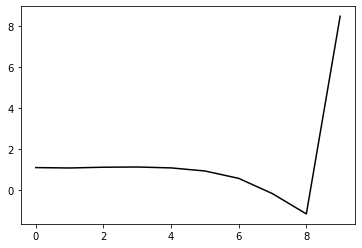

243100 0.4549286794278466
0.29024258932046826 -0.3205483811300172 -0.14666120721967318 -0.11508765361806378
[ 1.1279923   0.90954378  0.92693424  0.92972221  0.88101168  0.72764079
  0.36443221 -0.38537728 -1.37698763  8.41343311]


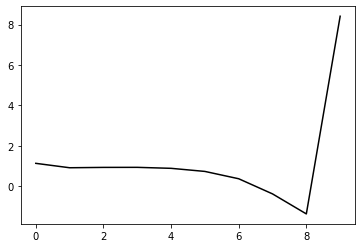

244200 0.1385701728679586
0.2985315857872309 -0.326375867503518 -0.1538477069387776 -0.1109278815973572
[ 1.06485494  1.11239679  1.09086097  1.0733051   1.01446847  0.85344779
  0.48411284 -0.27096481 -1.26693655  8.44958879]


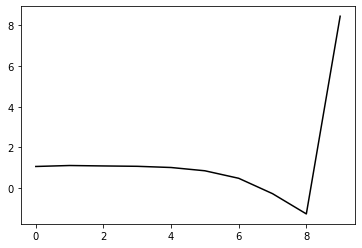

245300 0.30577307885260824
0.30344472138072875 -0.33117111676876776 -0.15968993769264941 -0.10509453285865566
[ 1.01471427  1.04277258  1.0636868   1.04301058  0.97878128  0.81500844
  0.44349362 -0.31419663 -1.31298076  8.4301443 ]


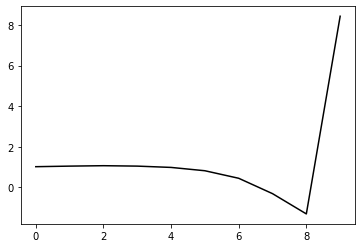

246400 0.17112414764982026
0.30448434331014257 -0.3257625914332996 -0.15547126026438654 -0.11029477504427111
[ 1.01885523  1.16944907  1.19752879  1.18412784  1.11955095  0.95608184
  0.58605213 -0.16981603 -1.16575313  8.49128687]


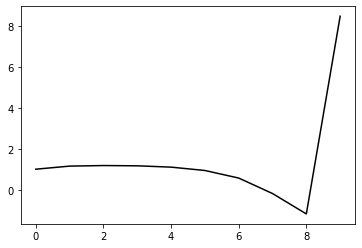

247500 0.2764976148163253
0.2969629248148388 -0.3317658599379499 -0.15910985888951595 -0.10739702859305916
[ 1.07684772  0.9780851   0.98156423  0.96626732  0.89615882  0.72768947
  0.35527958 -0.40136965 -1.39590086  8.42653627]


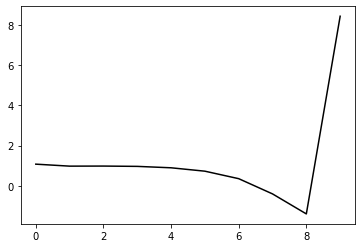

248600 0.22595319946917872
0.3003462638816436 -0.33176326362976555 -0.16032724746473315 -0.10707494141098163
[ 1.05549545  1.00525121  1.01233492  0.99496815  0.92847771  0.76307242
  0.39437153 -0.35858356 -1.34904726  8.44580965]


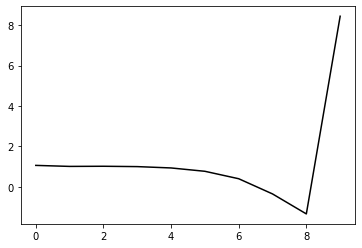

249700 0.2281459871780867
0.298722687811165 -0.32792743499988203 -0.15709988187000784 -0.11116567374997122
[ 1.0839741   1.03030318  1.03550293  1.02086669  0.95748804  0.7958309
  0.43182591 -0.31585077 -1.29966109  8.3886879 ]


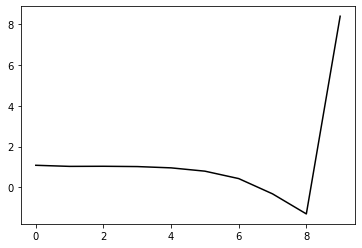

250800 0.1855798720902253
0.3012712683608449 -0.3289474323331369 -0.15892186104936734 -0.1108351369688419
[ 1.03754013  1.1192668   1.14956299  1.13908347  1.07595117  0.9154785
  0.55412751 -0.19034476 -1.17072219  8.4632955 ]


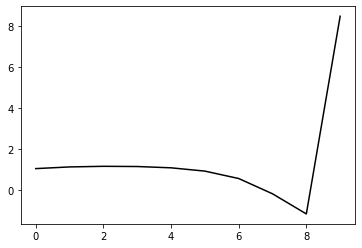

251900 0.21453739330985566
0.30498570047528933 -0.3303206153775885 -0.16137122593705858 -0.10778931284658409
[ 1.04213506  1.03914829  1.06911385  1.05732072  0.99049043  0.82687566
  0.46489628 -0.27831018 -1.25590631  8.43983703]


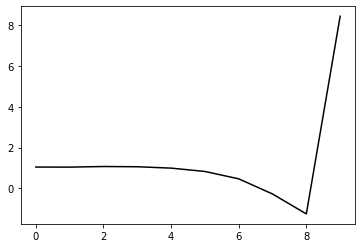

253000 0.19584024684569584
0.3036795245205115 -0.32306474120294865 -0.156126025176869 -0.11091599818544254
[ 1.05993997  1.05714828  1.10081106  1.09470537  1.02944982  0.86358758
  0.49764945 -0.25134055 -1.23737319  8.45481099]


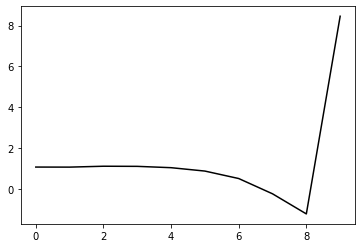

254100 0.18080691904845228
0.2980569278629038 -0.32483522704798895 -0.15640304093337112 -0.11260188654373889
[ 1.08468132  1.00213507  1.04440892  1.05502644  1.00249159  0.84696942
  0.49133394 -0.24656728 -1.22004048  8.40077314]


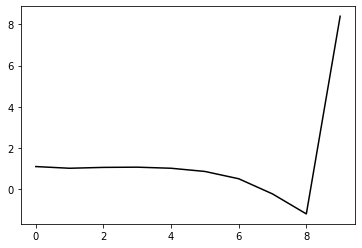

255200 0.1331815944520545
0.3003514657736864 -0.3219618288281296 -0.15502581881778196 -0.11340183061112338
[ 1.04960385  1.08157697  1.1044167   1.10849289  1.05639771  0.89946961
  0.54174372 -0.19787395 -1.17285205  8.47239221]


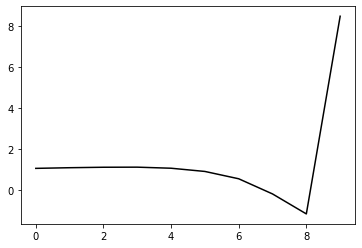

256300 0.24726687633474245
0.2951762735175806 -0.32236103391315474 -0.15458425382523067 -0.11357976106149158
[ 1.0710027   0.96498915  0.94900916  0.94432513  0.89370738  0.74210212
  0.39127379 -0.33961704 -1.30398648  8.43722339]


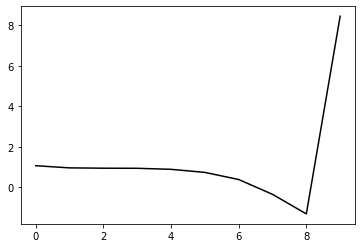

257400 0.19516561708038765
0.3015401176257727 -0.32401603275177254 -0.15785284305008407 -0.11159871672125915
[ 0.99256878  1.1124048   1.12520859  1.11944551  1.07067177  0.92226678
  0.57257157 -0.15852999 -1.12426017  8.4888636 ]


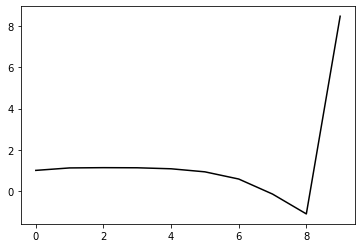

258500 0.25175376281791156
0.2896357604099401 -0.3320303261410912 -0.16113865418605156 -0.11226671827395006
[ 1.06073194  1.00858324  0.98653539  0.97959734  0.93648653  0.79834159
  0.46131311 -0.25498488 -1.20303182  8.50314735]


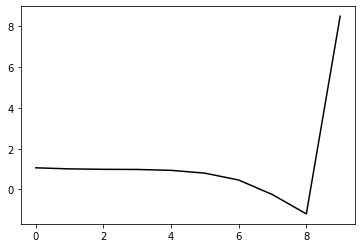

259600 0.22190211038147564
0.2975695959346659 -0.3285361546534332 -0.1611513741731259 -0.11113588094507722
[ 1.03219835  1.1275964   1.11388653  1.09049988  1.03856841  0.89475372
  0.55210789 -0.17069935 -1.12683538  8.48849009]


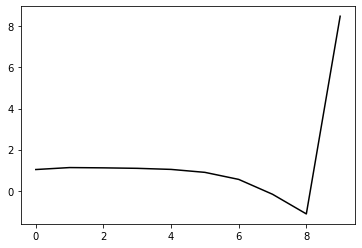

260700 0.20528871745506244
0.29635567085270936 -0.32385994051437395 -0.15769143858271134 -0.11461862811371883
[ 1.07325753  1.10917482  1.14415954  1.12944203  1.07568941  0.93403018
  0.59503673 -0.12450766 -1.07832952  8.4738282 ]


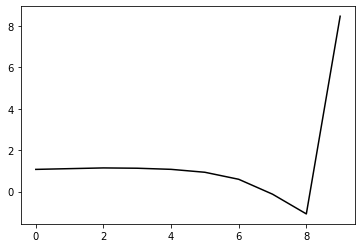

261800 0.21239125522254051
0.30109434359408954 -0.32062356733237607 -0.1574661501527571 -0.11165948085006797
[ 1.00162647  1.19571235  1.2227426   1.20520082  1.13803397  0.98073355
  0.62638504 -0.10955726 -1.08203219  8.48864413]


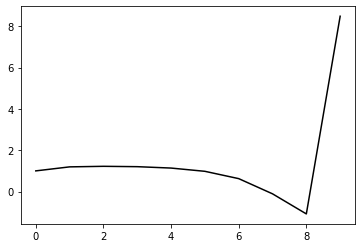

262900 0.23368459570511246
0.29917132083752457 -0.3191898451393076 -0.15627526592350763 -0.11251581458786232
[ 1.04705363  1.12832265  1.17173602  1.16274594  1.09786827  0.94090383
  0.58810904 -0.1455941  -1.11532012  8.45040725]


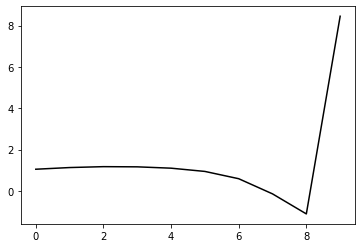

264000 0.18685961912139992
0.29451265284643824 -0.3253386564318293 -0.15995989343801434 -0.11172546951629518
[ 1.07448522  1.02050799  1.04371606  1.04371062  0.9873608   0.83687622
  0.49266729 -0.23039976 -1.18739366  8.47481705]


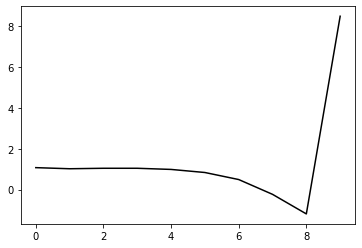

265100 0.2833669501854448
0.2911757401873754 -0.31858116332422864 -0.15450524166423912 -0.11602147004167601
[ 1.10382988  1.04361198  1.06622995  1.06287938  1.0067661   0.85367642
  0.50581355 -0.22151648 -1.18427464  8.44610531]


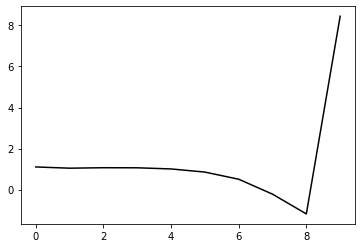

266200 0.15800061831175272
0.2937711171453121 -0.321945488640507 -0.15864110308195312 -0.11076264384806121
[ 1.00922732  1.00821078  1.00568142  0.98349507  0.91360574  0.74786138
  0.38857878 -0.34858378 -1.32030762  8.46717446]


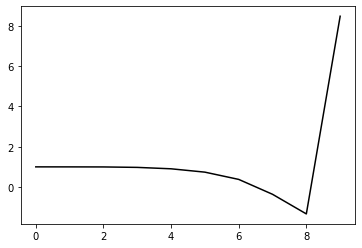

267300 0.27086619767591985
0.29896566686264936 -0.3142731599268216 -0.15429412883309598 -0.11378031875228518
[ 1.07486914  1.13612509  1.14690429  1.11931935  1.04503573  0.87545518
  0.51246343 -0.22794111 -1.2029534   8.45003952]


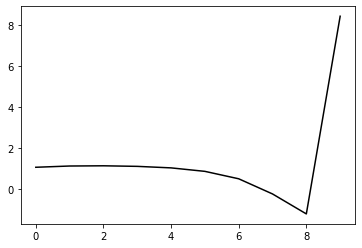

268400 0.20188451433409055
0.2983041520435908 -0.31969936403900234 -0.15895975448663402 -0.1108557465009822
[ 0.99610444  1.08391483  1.08648653  1.06351378  0.99272496  0.82749538
  0.46927769 -0.26572116 -1.23479984  8.47067272]


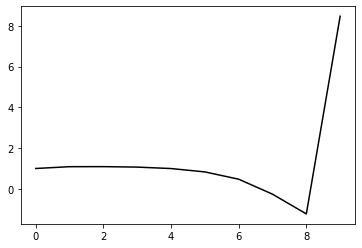

269500 0.3959309315458445
0.30030289694955953 -0.3144032152561771 -0.15542405092629824 -0.11510320312362683
[ 1.1119122   1.16738548  1.21478255  1.20744878  1.14896118  0.99404848
  0.64440836 -0.08300389 -1.04530102  8.45714718]


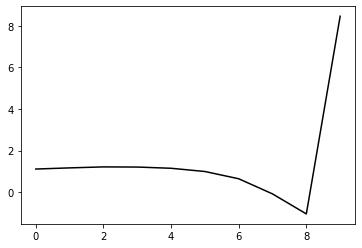

270600 0.2146822687702771
0.3007194051320574 -0.3163338537070141 -0.15741218368672616 -0.11251281942658269
[ 1.05133959  1.17763306  1.19762168  1.18727882  1.12511728  0.96671005
  0.6143725  -0.11479346 -1.07842956  8.48032595]


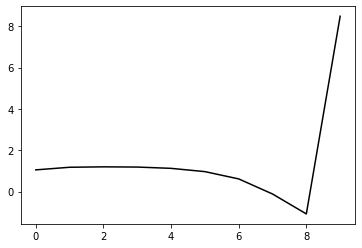

271700 0.22404098735808772
0.2959591349982857 -0.31740869022606616 -0.15816694538121692 -0.10822695469070819
[ 1.05531979  1.0444839   1.03299666  1.01035562  0.93884351  0.77293613
  0.41482507 -0.31861219 -1.28553241  8.4397896 ]


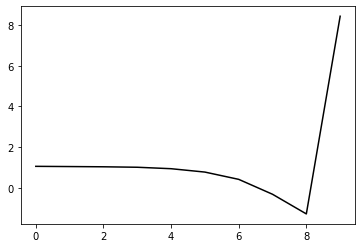

272800 0.1946288644342821
0.29953527143920805 -0.31924919691022363 -0.16061126660244462 -0.10819485429538467
[ 1.05437381  1.03587406  1.05145359  1.03458671  0.96896926  0.80879325
  0.45639274 -0.27083781 -1.23079808  8.50592024]


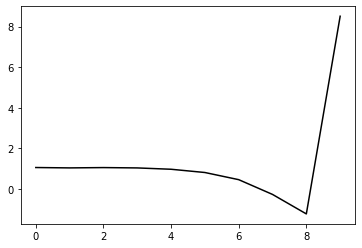

273900 0.21443412974433418
0.29883804071674147 -0.31981773412375464 -0.1613042444803638 -0.10895637658203385
[ 1.03579704  1.08776248  1.09877532  1.08860889  1.02893643  0.87429826
  0.52723026 -0.19456341 -1.14912565  8.4706497 ]


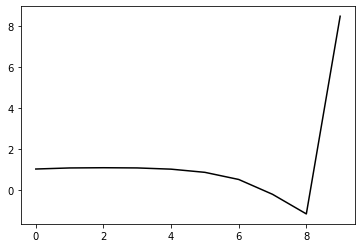

275000 0.19122079413752166
0.3013368033325728 -0.3161324520613072 -0.15941761702543947 -0.11011356982397788
[ 1.08104838  1.08842063  1.10842572  1.09578488  1.03509243  0.87917807
  0.53068394 -0.1921352  -1.14762905  8.44712412]


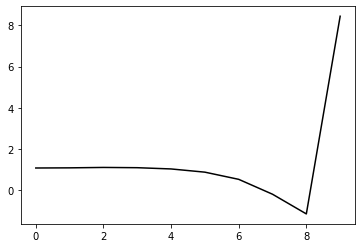

276100 0.19727629293695428
0.29965022981600625 -0.31818413128385725 -0.16108776107914588 -0.1097494206108888
[ 1.06887875  1.11462886  1.1443133   1.1441459   1.09340791  0.94780873
  0.61018518 -0.10088121 -1.04388852  8.50508174]


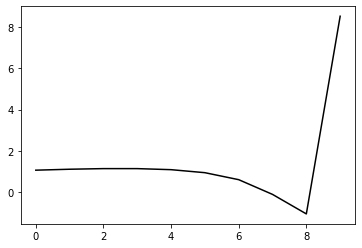

277200 0.1423466533841377
0.2950678985691944 -0.31506761136231665 -0.15785864029369276 -0.11276709915192625
[ 1.06960403  1.07156211  1.06882597  1.05332141  0.99199325  0.83683214
  0.49121526 -0.22565441 -1.17268732  8.46597374]


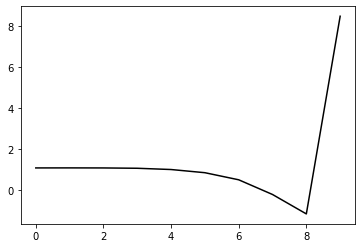

278300 0.25155456425973255
0.2978775195682161 -0.3119856000316523 -0.15688547148918702 -0.1111835871516116
[ 1.08193887  1.09223359  1.09800032  1.08012591  1.01589053  0.85831208
  0.51006804 -0.20938958 -1.15957672  8.45381906]


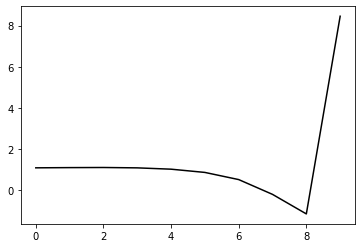

279400 0.18934413080899953
0.30314508831549314 -0.31157680471354937 -0.15828399124789796 -0.10934550239703247
[ 1.0058632   1.18367772  1.19602038  1.17950803  1.11472585  0.95598418
  0.60628042 -0.11445076 -1.06595295  8.52283626]


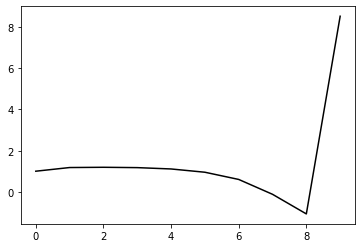

280500 0.23258761691745827
0.2992533097724637 -0.31189439567059596 -0.15803908719203835 -0.11071050505106443
[ 1.06911252  1.15237696  1.17190556  1.16612736  1.11223712  0.96462635
  0.62626517 -0.08278275 -1.02225573  8.45839697]


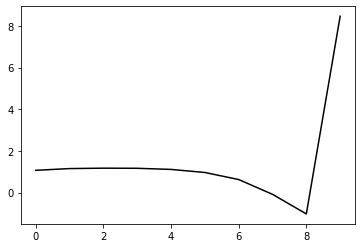

281600 0.21647335011827804
0.2967525739585221 -0.3173472158999875 -0.1621402080065235 -0.10829400470314486
[ 1.06868697  1.02749903  1.05196772  1.05459475  1.00812695  0.86874335
  0.53950435 -0.15946665 -1.08786399  8.47437883]


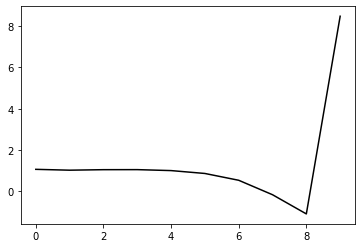

282700 0.22915544999962664
0.2875493426419482 -0.3193635658608901 -0.16160539124964984 -0.10918236444445192
[ 1.09537039  1.01125376  0.97338259  0.95701411  0.89943927  0.75059737
  0.41391603 -0.29003279 -1.22081391  8.48793299]


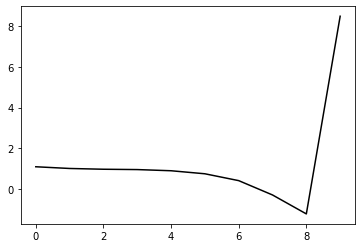

283800 0.2679771540955279
0.30359879557192 -0.3150193119575728 -0.16196904095520814 -0.10954111906759015
[ 0.99636504  1.22040389  1.20869137  1.17526098  1.10806206  0.95163666
  0.60783043 -0.10275641 -1.04023844  8.48759429]


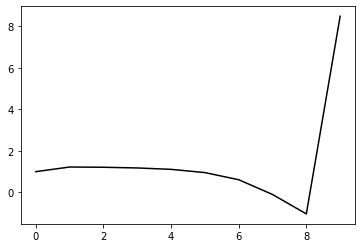

284900 0.2128140120346208
0.3072240233203707 -0.31077461625763375 -0.16033627777779166 -0.10745420971019627
[ 1.01329176  1.20302334  1.22462656  1.19503876  1.1235155   0.96410092
  0.61716176 -0.0970958  -1.0394155   8.47653765]


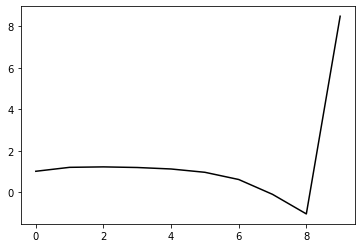

286000 0.2018786497840503
0.3015040450098202 -0.31051858808081617 -0.15923820602353062 -0.10960862669154411
[ 1.0830706   1.03207833  1.08577628  1.07092519  1.0008826   0.84377225
  0.50159401 -0.20586227 -1.13932897  8.48621256]


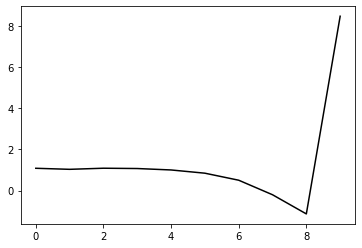

287100 0.18897739124694596
0.29258913283817656 -0.31435348003690733 -0.16034354466134235 -0.11123181320783769
[ 1.09997255  1.00053811  1.01887569  1.01635194  0.95527243  0.80427148
  0.46912444 -0.22995379 -1.15320816  8.45749034]


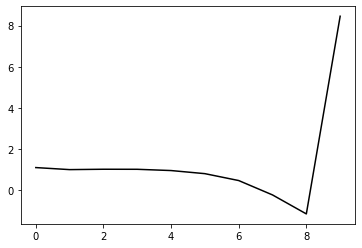

288200 0.1517152166669164
0.29803921342635226 -0.31097526631800804 -0.1592775693714273 -0.11179652609873618
[ 1.08977764  1.08236365  1.104871    1.10231069  1.04794474  0.9001913
  0.56741817 -0.12912996 -1.04995853  8.48261015]


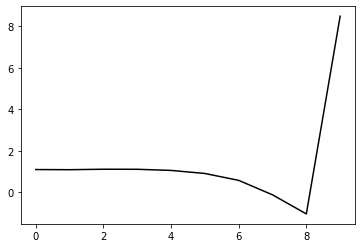

289300 0.25509676922403346
0.29586152754996414 -0.31098094953201816 -0.15893256558712726 -0.11314773574760909
[ 1.07070678  1.08325086  1.07940489  1.0675984   1.0131289   0.86676033
  0.53611575 -0.1566122  -1.07206322  8.49465838]


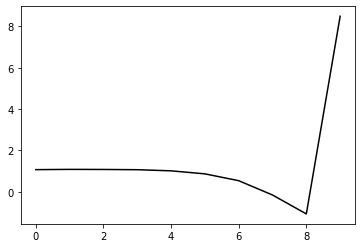

290400 0.24583756617118788
0.28578908376129064 -0.32235633741496456 -0.1666637744452491 -0.10548924745699235
[ 1.07217379  0.92461687  0.87540581  0.83776272  0.76517996  0.60681021
  0.26844925 -0.42755887 -1.34217169  8.44674356]


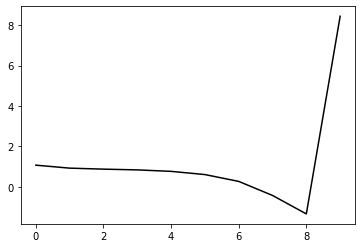

291500 0.2535448109001618
0.2991178777116439 -0.3130195549664118 -0.16219685778732534 -0.10930322136908857
[ 1.0472296   1.08438099  1.05990651  1.00760687  0.92579788  0.76095782
  0.41696712 -0.28369105 -1.20232287  8.43733487]


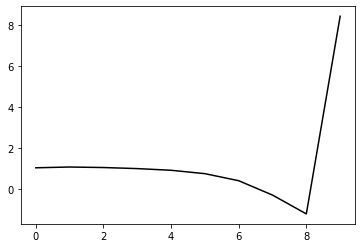

292600 0.20186328508295753
0.29823890233417233 -0.3098518536779913 -0.15924459784945463 -0.11369616227566029
[ 1.08452395  1.10073204  1.11326487  1.07274808  0.99040157  0.8271604
  0.48646333 -0.20916799 -1.12077672  8.49936001]


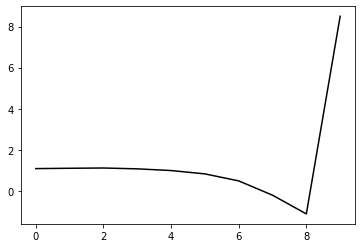

293700 0.22917002431621175
0.2998467926504525 -0.31207601601242063 -0.1618237699606568 -0.11134788860607406
[ 1.00330251  1.07329553  1.08901369  1.05408972  0.96503027  0.79367021
  0.44704308 -0.2520912  -1.16487145  8.46433369]


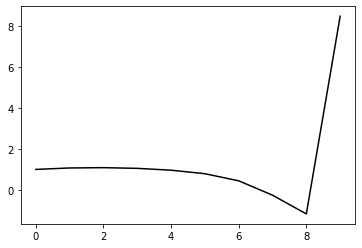

294800 0.19216606503402647
0.29699230694531675 -0.3140070744263034 -0.16307019855135357 -0.11119067472186894
[ 1.03913877  1.11221094  1.11269256  1.09023755  1.01483588  0.85282864
  0.5155485  -0.17337815 -1.07494669  8.46057039]


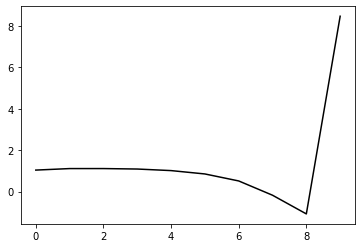

295900 0.21008649016826625
0.30339483105942233 -0.3128455558098355 -0.16421479348458967 -0.10824694124828382
[ 1.03243936  1.04713704  1.06696402  1.03664635  0.95381479  0.78377998
  0.43946714 -0.25469542 -1.16074914  8.42585899]


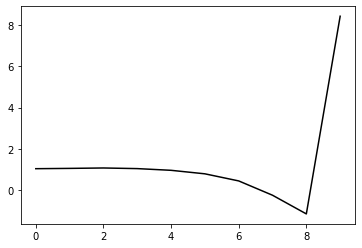

297000 0.22435371372501486
0.2985620854839662 -0.30868878522610826 -0.15981941620409745 -0.1135306202407256
[ 1.09221256  1.03784644  1.05299264  1.02727147  0.94946314  0.78269425
  0.44166003 -0.24762991 -1.14705324  8.47848884]


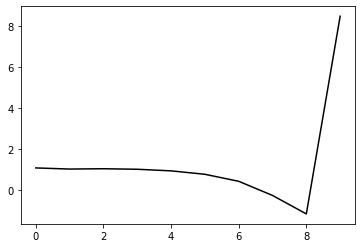

298100 0.1763645225242114
0.29636516415459063 -0.30791715709397466 -0.15898461808839393 -0.11475223705675669
[ 1.08337459  1.0772204   1.08255415  1.05206623  0.96935291  0.79680735
  0.44991105 -0.24424043 -1.14773583  8.45286678]


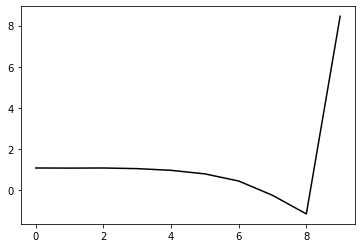

299200 0.13334587294658984
0.2986062797723321 -0.30571985723290956 -0.15824785410740758 -0.11520338916877941
[ 1.04820406  1.1022099   1.12532216  1.0984067   1.01401885  0.83804485
  0.4869933  -0.21057361 -1.11689529  8.48576599]


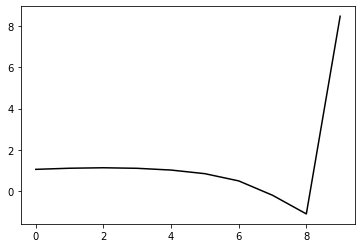

300300 0.2590961193765537
0.3009559224831684 -0.3045393873358853 -0.15843724338147738 -0.11395505251396053
[ 1.05010116  1.09769945  1.132569    1.11618329  1.03405893  0.85626438
  0.50181422 -0.19857344 -1.10696973  8.42126064]


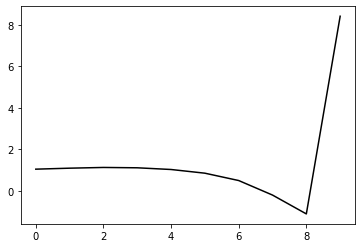

301400 0.1881364255219765
0.29409539187568995 -0.3101476594339122 -0.16125960419391872 -0.11304004983624964
[ 1.03679176  1.06200256  1.05707092  1.0413612   0.96346669  0.78740594
  0.43429037 -0.26297902 -1.16565083  8.47142555]


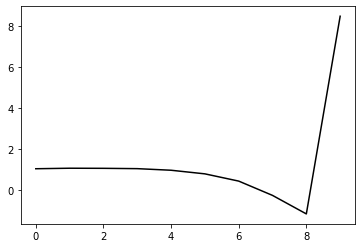

302500 0.24436786789472065
0.2955467988693442 -0.3119769929243078 -0.16357829828349052 -0.11165497709114329
[ 1.05203034  1.04134869  1.04853551  1.037633    0.97360989  0.81000239
  0.46685885 -0.21970101 -1.10934051  8.44433715]


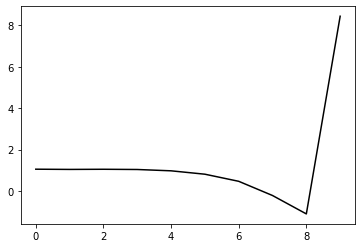

303600 0.21379618980222623
0.30030944655715125 -0.30877282416300594 -0.16291358895945157 -0.10965677885749557
[ 1.04963905  1.1228365   1.14912056  1.12286231  1.04620759  0.87161575
  0.51501492 -0.1852222  -1.08862351  8.48075837]


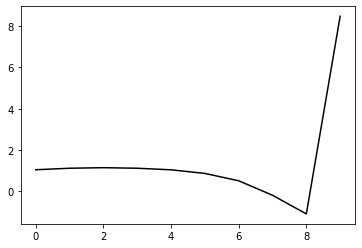

304700 0.21616147239498953
0.2964227687031154 -0.30543115572404717 -0.15992036197592369 -0.11269062912433403
[ 1.10541304  1.06770333  1.11631126  1.1193899   1.05920117  0.89838389
  0.55295638 -0.13700543 -1.02932045  8.457493  ]


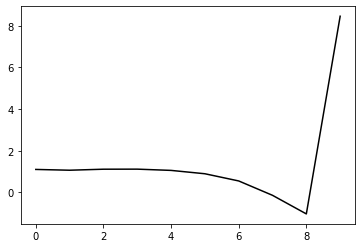

305800 0.19781542282027004
0.2921991927101126 -0.31186242582993373 -0.16500910297963614 -0.10785439310438762
[ 1.0493842   1.08672141  1.05608094  1.02930401  0.94758082  0.76581737
  0.40130107 -0.30460131 -1.20878274  8.44324194]


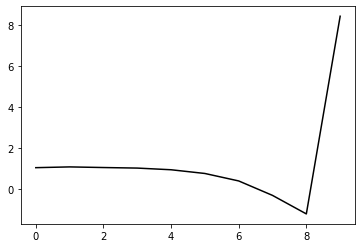

306900 0.23371222340459305
0.2950374479509218 -0.3071888058270002 -0.1622128727565353 -0.11157985927486021
[ 1.08021218  1.09067906  1.10332995  1.07811787  1.00245651  0.82681919
  0.46647644 -0.23600032 -1.13622941  8.47827279]


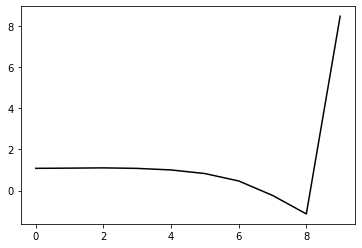

308000 0.18386039562867498
0.29529150719037667 -0.30896896160560716 -0.164065711319023 -0.11115602308905431
[ 1.09094606  1.06313681  1.08137582  1.06535953  0.99502957  0.82562618
  0.47071156 -0.2264915  -1.12014893  8.45562141]


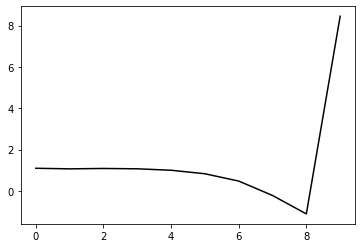

309100 0.18864434710173428
0.2888123718450889 -0.3064941053829494 -0.16080252931928585 -0.11392771052423109
[ 1.08340216  0.97543558  0.99121388  0.96781021  0.88836108  0.71076227
  0.34843358 -0.35487112 -1.25215207  8.44983813]


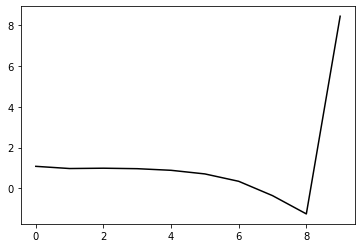

310200 0.16329178002666417
0.2904073625926094 -0.30789206459669405 -0.16242082187913132 -0.11578011816104955
[ 1.09505077  1.13358555  1.1450341   1.13313757  1.06591777  0.89871802
  0.54493979 -0.1512464  -1.0417463   8.45210309]


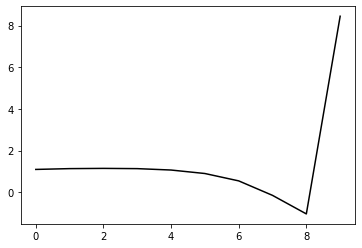

311300 0.25934794693367746
0.29369967265600017 -0.30448119664007256 -0.16092108918350917 -0.11495763117309046
[ 1.09575109  1.12446401  1.14940243  1.13472123  1.06314634  0.89159317
  0.53280108 -0.16887261 -1.06442657  8.45400871]


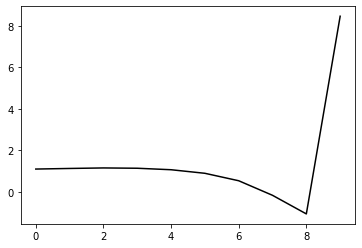

312400 0.22191304877892612
0.28414066176946545 -0.3140122056578797 -0.16662092055308178 -0.11019827386126181
[ 1.06913305  1.00820345  0.98432916  0.95666946  0.87737227  0.70193927
  0.34295712 -0.35528381 -1.24258908  8.43737058]


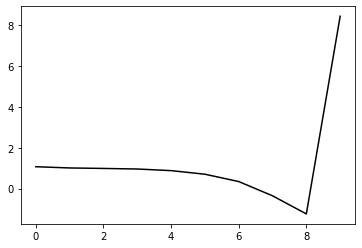

313500 0.24283478042794251
0.2951820206484315 -0.3054540267005013 -0.16251898395341308 -0.11475549545613137
[ 1.07848622  1.14461296  1.14458448  1.11098771  1.03004882  0.85354646
  0.49325372 -0.206457   -1.0948074   8.50236872]


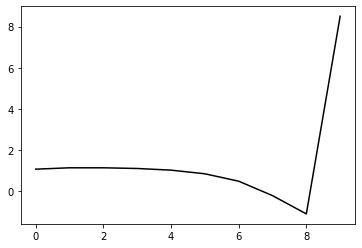

314600 0.21246581874239792
0.2952715152977693 -0.3021865846863023 -0.1608483514519228 -0.11389506773607863
[ 1.06463548  1.1428541   1.15006454  1.11457397  1.02538419  0.84026781
  0.47041737 -0.24009529 -1.14026299  8.49766371]


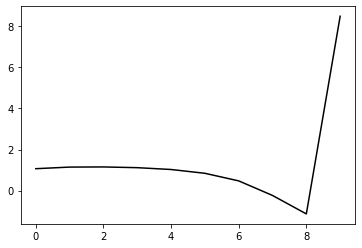

315700 0.2077800050006108
0.2925873956556411 -0.30368423791019605 -0.16168578357000188 -0.11437729292123443
[ 1.06363403  1.10146741  1.12896662  1.10415688  1.01663105  0.83143258
  0.46103539 -0.250277   -1.15044113  8.47291391]


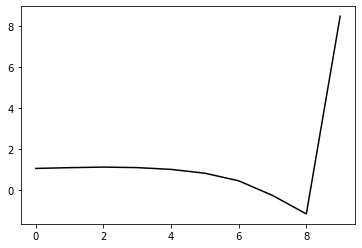

316800 0.28898420233636984
0.30073420417564495 -0.3043372286733104 -0.16476410136875203 -0.1115776141635778
[ 0.98036285  1.19435612  1.21874848  1.18935029  1.09359538  0.89771947
  0.51644247 -0.2056928  -1.11629104  8.47269571]


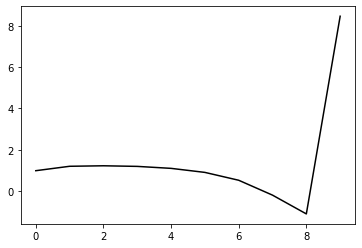

317900 0.2488418212485592
0.3014665983234753 -0.3042598975321646 -0.16562481652758476 -0.10962084490899814
[ 0.98996824  1.17821756  1.21419922  1.19248529  1.10062305  0.90510679
  0.5229543  -0.20053474 -1.11198887  8.43766633]


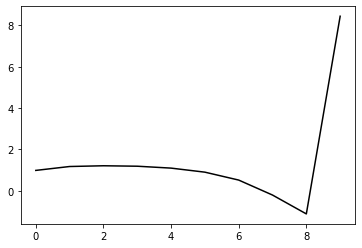

319000 0.17475213001370346
0.2921978411474698 -0.30726375668651273 -0.16573205147713788 -0.11181839449294581
[ 1.0631235   1.04868815  1.0702996   1.0510245   0.96194587  0.76747813
  0.38650977 -0.33452377 -1.24079196  8.44091017]


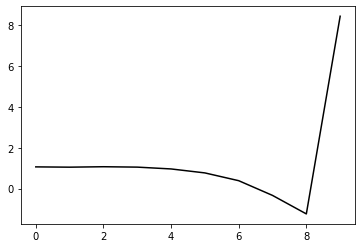

320100 0.20507483993845255
0.29633975983373545 -0.30318612178034465 -0.1641912222499408 -0.1122501675716334
[ 1.05296322  1.13032893  1.16375144  1.15191165  1.07033239  0.87958709
  0.49974363 -0.22132872 -1.12765637  8.46687077]


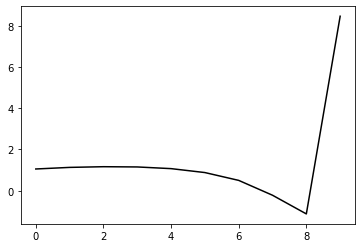

321200 0.12791921619824106
0.2963273076350207 -0.299902118458649 -0.1618687464893269 -0.11417130782872272
[ 1.04837024  1.15509707  1.16962431  1.15002295  1.06576185  0.87012817
  0.48306039 -0.24537366 -1.15731117  8.48445117]


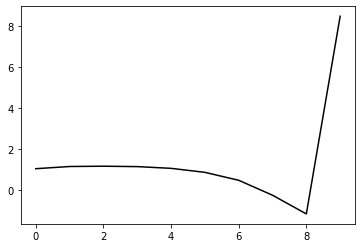

322300 0.2576920375524874
0.29400072097335195 -0.29915211308850403 -0.1610362467181277 -0.11527315496726778
[ 1.09100966  1.10724082  1.13459604  1.12556237  1.05005684  0.86353775
  0.48411887 -0.23680846 -1.13911314  8.42259113]


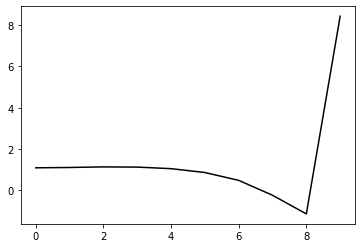

323400 0.2059804056275907
0.297606536379908 -0.3008420125994476 -0.1638217746176763 -0.11212702158663897
[ 0.99683038  1.11117582  1.13254878  1.12182583  1.04809891  0.86388207
  0.48545842 -0.23462098 -1.13361904  8.50428053]


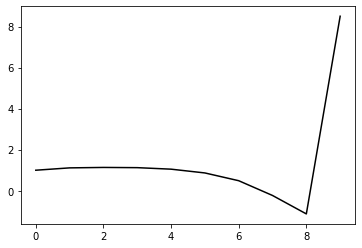

324500 0.24217415653516403
0.29623342842107603 -0.30161905427044067 -0.1642092862860992 -0.11305492581754745
[ 1.05609953  1.10322212  1.11918796  1.11391751  1.05352096  0.88404322
  0.51932336 -0.18739391 -1.07061137  8.45154016]


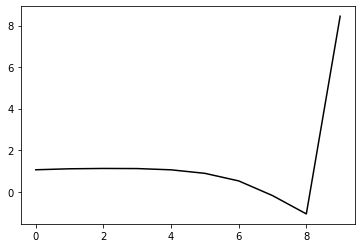

325600 0.22125633495956448
0.29177431243261015 -0.3063258536175501 -0.16746713453975318 -0.11223327115354456
[ 1.07277179  1.07955863  1.07476416  1.0574661   0.98788231  0.81032499
  0.43627345 -0.28045893 -1.17218338  8.46212721]


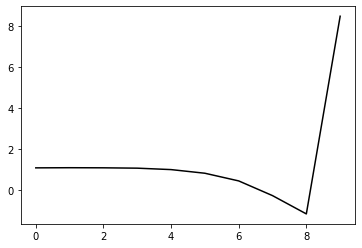

326700 0.1945188087454127
0.29389782518047725 -0.299418825456874 -0.1630068987751987 -0.11640784243031306
[ 1.07497528  1.1745548   1.21203535  1.19962584  1.13175522  0.95612961
  0.581311   -0.13951105 -1.0376462   8.47376377]


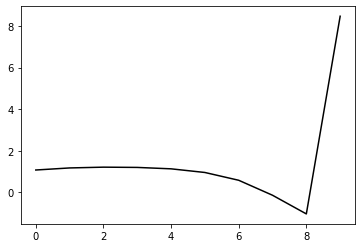

327800 0.1807531940354875
0.2920135433758828 -0.3022330647925495 -0.16539848012380587 -0.11322881920026329
[ 1.05047509  1.09604972  1.12644297  1.11826144  1.04806342  0.87111631
  0.49579056 -0.22522308 -1.12091522  8.48775247]


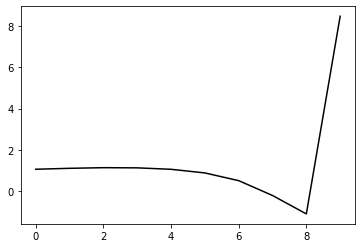

328900 0.20706570844891647
0.2929269758436458 -0.3039159720246107 -0.1675089543569798 -0.11059354635440201
[ 1.03022088  1.099221    1.1048884   1.0914071   1.01894516  0.83903517
  0.46043872 -0.26469232 -1.16353867  8.45377229]


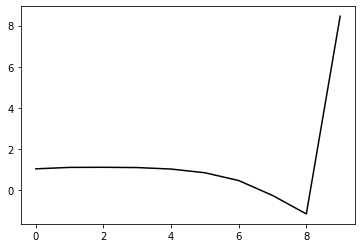

330000 0.19025757004036145
0.2917087474535465 -0.30168320402205834 -0.1660173131006743 -0.11225342486453278
[ 1.09408713  1.04273264  1.05102967  1.03686145  0.97033452  0.79717509
  0.42443235 -0.29640236 -1.19048456  8.4828823 ]


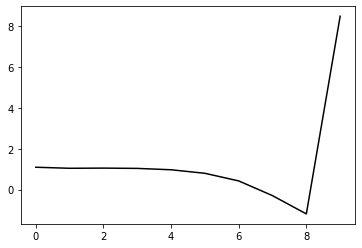

331100 0.18662480077522306
0.2890836282330519 -0.29939617402782287 -0.16378757440740066 -0.11466733212014697
[ 1.10897742  1.06788783  1.07540553  1.06070605  0.99697754  0.82915337
  0.46194449 -0.25405356 -1.14195906  8.44261935]


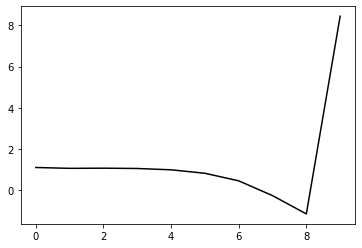

332200 0.1308334284986575
0.2927420470925492 -0.29610532202253453 -0.16259055274370698 -0.1147705227254639
[ 1.05969185  1.11559018  1.13370987  1.11422991  1.04238722  0.86795852
  0.49407712 -0.22993937 -1.12555021  8.49083363]


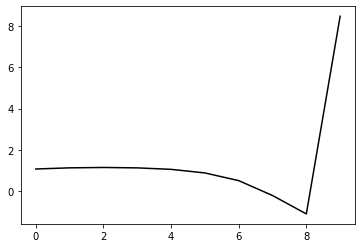

333300 0.2520397807930247
0.29283102877362854 -0.29291088796138104 -0.16085117789988268 -0.11418915349501785
[ 1.07696356  1.09720298  1.10690167  1.08568298  1.0081972   0.82908784
  0.45176135 -0.27668709 -1.17682022  8.43564947]


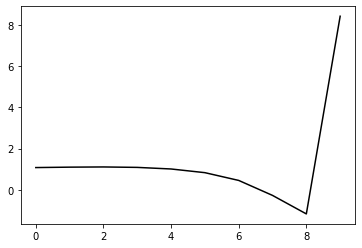

334400 0.2765915604173157
0.283776552542029 -0.3043131394031236 -0.16905537404634888 -0.10372448640525334
[ 1.03258983  0.87536802  0.84374328  0.81645855  0.73719721  0.55880354
  0.18429454 -0.54051184 -1.43491948  8.42348889]


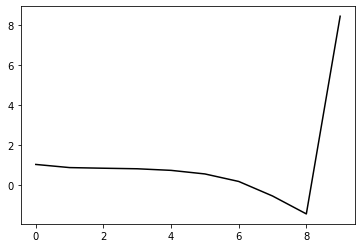

335500 0.2643441968604445
0.29064792551895424 -0.2949753502393256 -0.16262396244974248 -0.11623872060682588
[ 1.07682895  1.15440376  1.11603142  1.07851928  0.99918123  0.8211254
  0.44719775 -0.27690886 -1.16939323  8.49390682]


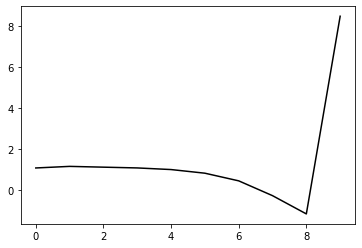

336600 0.21320718224055574
0.29467110425342413 -0.2965427110031504 -0.16494846849355904 -0.11377433974130798
[ 1.04373655  1.14893955  1.1214619   1.06858075  0.97866549  0.79425886
  0.41573706 -0.31218278 -1.20702592  8.47253906]


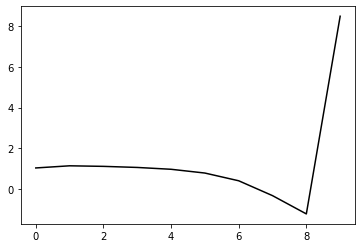

337700 0.23082985946018536
0.2877085082181047 -0.2943463284934683 -0.16208532463875247 -0.11495298678330093
[ 1.08469279  1.04590168  1.03185943  0.97922623  0.88158681  0.69210658
  0.31014005 -0.42102289 -1.31843999  8.43624176]


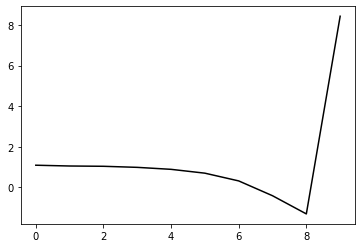

338800 0.19546197195051573
0.2894268963542206 -0.29842701139227107 -0.16594393504047286 -0.11412066648621473
[ 1.05274537  1.06976023  1.06998008  1.0331441   0.94376536  0.76211879
  0.38908484 -0.33329727 -1.22090399  8.47083964]


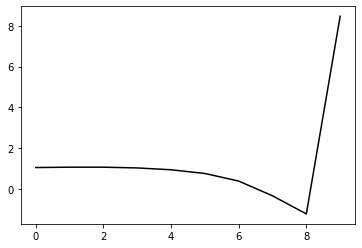

339900 0.221292852474812
0.296773791443162 -0.2972338968713477 -0.1671058551744387 -0.11232929369195044
[ 0.99117447  1.14679663  1.17485047  1.14480816  1.05542219  0.87097119
  0.49562699 -0.22990441 -1.12138647  8.43159859]


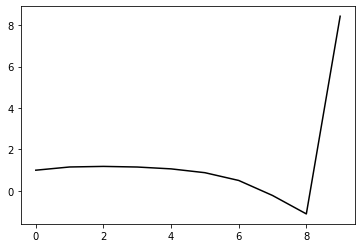

341000 0.17662314343542684
0.2912550158387018 -0.298086605128796 -0.1670518243495029 -0.11407223221443559
[ 1.02508253  1.09852281  1.11240327  1.09127823  1.00787897  0.82537394
  0.45116616 -0.27456199 -1.16742921  8.45338378]


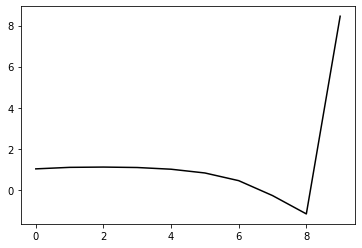

342100 0.19458792801844124
0.28617515853765885 -0.2958162008779425 -0.16441099982119609 -0.11718244026638754
[ 1.11324261  1.03853765  1.03791024  1.01999439  0.94420332  0.7668636
  0.39750608 -0.32333697 -1.21040688  8.44415374]


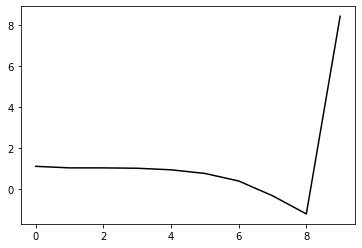

343200 0.1578046454897047
0.2798102263654583 -0.30050000523488635 -0.16723242985271972 -0.11470648854771646
[ 1.07295273  0.95838536  0.94481579  0.91250713  0.82875834  0.64466322
  0.26904152 -0.45748776 -1.34972321  8.45075305]


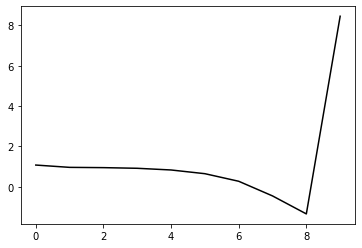

344300 0.2622522342769271
0.2894393440201921 -0.29254083949118576 -0.16363737228407338 -0.11754679771848606
[ 1.10146262  1.14362818  1.14327036  1.10659755  1.01994069  0.83271344
  0.4527611  -0.27923137 -1.17825788  8.44047722]


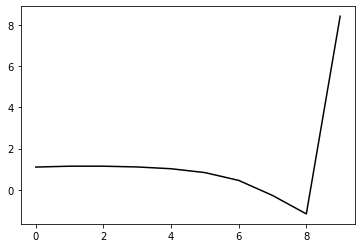

345400 0.19798381727252842
0.28832884920033697 -0.29748765705545094 -0.1677395692121037 -0.11527636413507944
[ 1.02696432  1.03210532  1.04391684  1.02092641  0.94220282  0.76358534
  0.39233313 -0.33061846 -1.21909202  8.50623013]


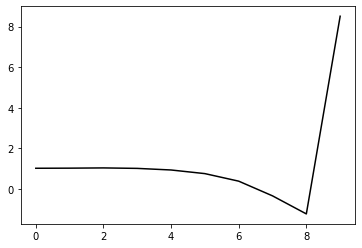

346500 0.24437094904649437
0.2907472652413527 -0.29570142571308006 -0.1674113454422108 -0.11384965818273202
[ 1.06183248  1.1068812   1.1030627   1.07294828  0.99194913  0.80979428
  0.43398841 -0.29421414 -1.18814033  8.4545265 ]


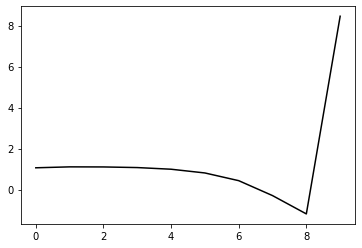

347600 0.22055066337918383
0.29031489363331014 -0.297174265406066 -0.1689548330641075 -0.11207716512013884
[ 1.07643739  0.97163818  0.99559217  0.98383137  0.91221902  0.73925582
  0.37188813 -0.34876693 -1.23501976  8.45134632]


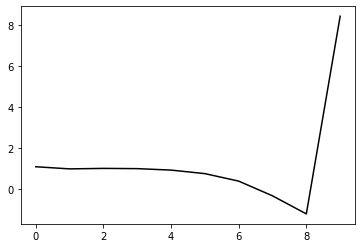

348700 0.21264840466477453
0.2904510028002458 -0.29468665455538007 -0.1673882489317074 -0.11314652103087382
[ 1.07781283  1.0806283   1.0817055   1.0590748   0.98606067  0.80989843
  0.43805456 -0.28789435 -1.17971738  8.42425616]


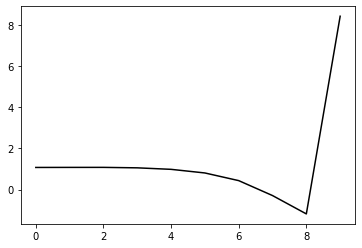

349800 0.22695445006503326
0.284792138173436 -0.29337197566266665 -0.1654745977363709 -0.11320290030667826
[ 1.07398828  1.07146267  1.01096775  0.95595087  0.8574062   0.66060516
  0.27128404 -0.46943414 -1.37366701  8.44291755]


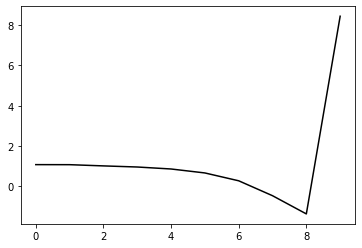

350900 0.20677046639080618
0.2974165147566962 -0.2934922717616525 -0.16829319255330508 -0.1124305807465238
[ 1.02373935  1.20462881  1.20202996  1.14217915  1.03558723  0.83355765
  0.44012766 -0.30392609 -1.21048512  8.44902   ]


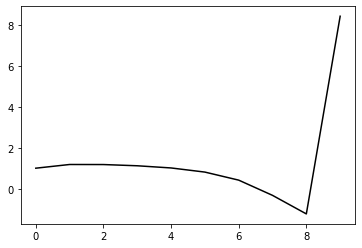

352000 0.17718187941064295
0.29593844780589906 -0.29230388239364113 -0.16738462681806857 -0.11307271484365346
[ 1.0289192   1.13044722  1.1561783   1.11870967  1.01748595  0.81914897
  0.42954399 -0.31114631 -1.21433329  8.46591458]


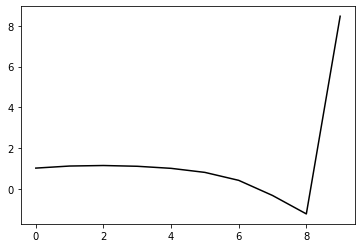

353100 0.18915438561985604
0.29081108983979886 -0.292284701858713 -0.1662631409071706 -0.11656113415809405
[ 1.10524014  1.06983971  1.08572334  1.06703486  0.98145586  0.79438825
  0.41669703 -0.31105256 -1.19891851  8.42541989]


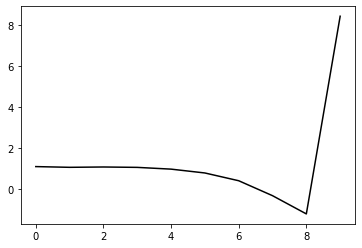

354200 0.1421912615832706
0.2954253332942112 -0.28843777647482133 -0.16442060629679897 -0.11746714875861128
[ 1.06476949  1.14920252  1.17606848  1.15327739  1.06323648  0.86766048
  0.48007307 -0.25780181 -1.15596347  8.48779007]


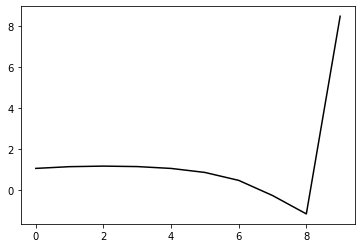

355300 0.2480216033088728
0.2882683226106048 -0.2892351852052446 -0.16405200179484944 -0.11644684671404476
[ 1.10354529  1.03768671  1.04866217  1.02733338  0.93606842  0.73648154
  0.34396482 -0.39847919 -1.30056187  8.42957808]


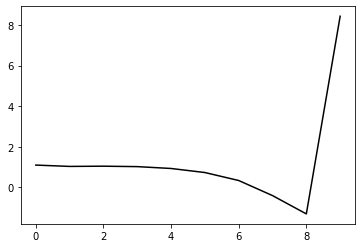

356400 0.20563753583997893
0.29675958902311955 -0.29022051823048284 -0.16749449325706992 -0.10979218655489113
[ 1.03039891  1.10468938  1.12716455  1.10136716  1.00566289  0.79853159
  0.39599431 -0.35790574 -1.27321535  8.4506657 ]


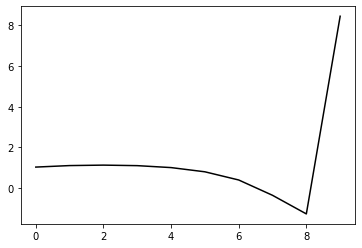

357500 0.25226113789911264
0.293882752694629 -0.29053786556368816 -0.1674084639582002 -0.10946053764610839
[ 1.03995934  1.06266453  1.07121323  1.04381757  0.94721585  0.73844079
  0.33367337 -0.42195719 -1.33795251  8.41906277]


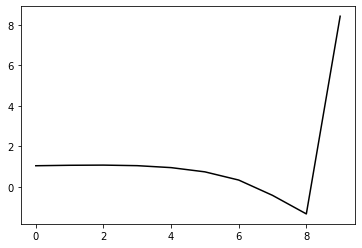

358600 0.2114196879879806
0.2954374728373449 -0.2872769620758308 -0.16488900744509857 -0.11487433416038463
[ 1.06819078  1.11713135  1.1412443   1.12096083  1.03219593  0.82970544
  0.42966685 -0.32124409 -1.23133654  8.45761947]


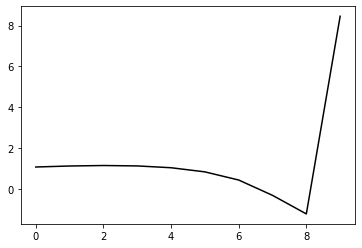

359700 0.20483443967769938
0.29531662953602467 -0.2860775235952884 -0.16449391187220105 -0.11425628663286225
[ 1.08587264  1.08637796  1.13149035  1.12491647  1.04416767  0.84740219
  0.45060511 -0.29833827 -1.20697799  8.44440214]


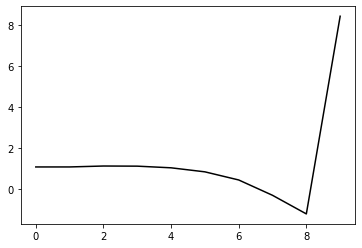

360800 0.18461391596575233
0.2919484979674053 -0.29338743264483597 -0.16925453475298646 -0.11392808775051191
[ 1.06530889  1.11207245  1.12473323  1.11262848  1.02887049  0.82826004
  0.42752668 -0.32397074 -1.2324201   8.48041596]


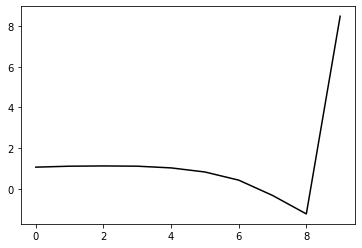

361900 0.2146308774112058
0.2926510996207802 -0.2947664259784196 -0.17074387464890048 -0.11431841712947541
[ 1.04384709  1.11067254  1.13029444  1.12221698  1.04728275  0.85491361
  0.46056825 -0.28523353 -1.18746325  8.42565629]


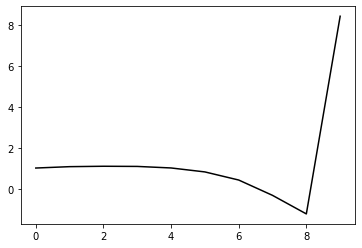

363000 0.17053676082761907
0.29601821335255224 -0.2906706140971738 -0.1687144737526488 -0.1138998063900964
[ 1.05611215  1.13608191  1.1553751   1.13862707  1.05924156  0.8624133
  0.46073386 -0.29417307 -1.20617702  8.46092704]


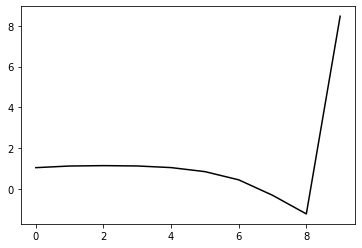

364100 0.18011150463412756
0.29615582459954415 -0.28683130195121537 -0.16582853285554736 -0.11651741651608327
[ 1.09810136  1.10275372  1.17152062  1.17985593  1.11056373  0.92169363
  0.52424912 -0.2294863  -1.14192925  8.42301155]


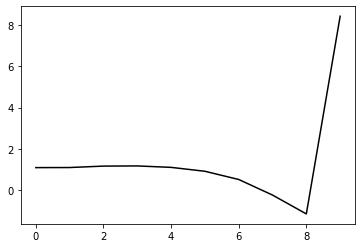

365200 0.1417925248289339
0.2904356682514984 -0.2877330643626137 -0.1656847459612897 -0.11545561772775148
[ 1.07496721  1.03784626  1.05409764  1.05048212  0.97388008  0.77671954
  0.3712047  -0.3899219  -1.30780352  8.44141937]


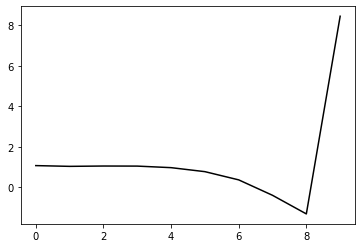

366300 0.24930703598208878
0.29084089998735424 -0.2856629738577066 -0.1648012489673756 -0.11453457642821431
[ 1.09252212  1.05223861  1.07055867  1.06151152  0.98397051  0.78441697
  0.37385168 -0.3947115  -1.32173445  8.42983653]


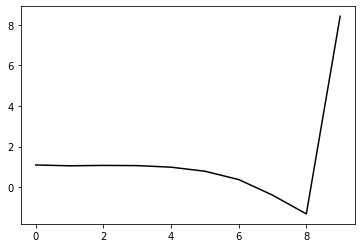

367400 0.15946042440772112
0.30007252987604316 -0.2819576195904891 -0.16499123660064366 -0.11301291186478626
[ 1.03840978  1.18860573  1.22647605  1.22142126  1.14775734  0.95085743
  0.54004259 -0.23143653 -1.16313209  8.46593466]


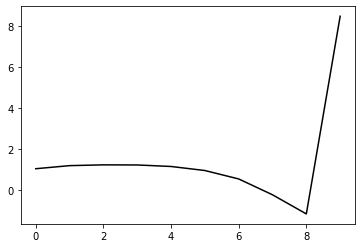

368500 0.3253426974469551
0.2973624423802019 -0.2928043663957034 -0.17268044366867402 -0.11224395054565281
[ 1.02739398  1.08546437  1.13971883  1.15747524  1.10601376  0.93196064
  0.54314698 -0.20645049 -1.1131077   8.41579783]


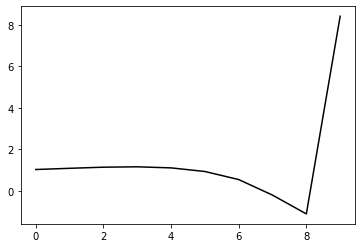

369600 0.21128484492101005
0.29671480993332305 -0.28554101785232283 -0.16738109640493254 -0.11451840738574647
[ 1.04194945  1.05180074  1.09812547  1.10308346  1.03895516  0.85153544
  0.44746398 -0.3192779  -1.24361817  8.46552453]


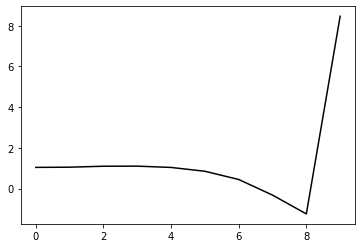

370700 0.20064709543343845
0.2952823369508488 -0.28510712209052186 -0.16701140884969165 -0.11545702483799855
[ 1.09973832  1.14269403  1.16607537  1.1757093   1.12267485  0.94530275
  0.54879259 -0.21276883 -1.13266049  8.44015634]


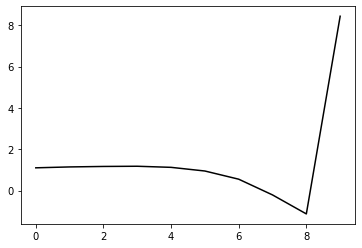

371800 0.1848260493399681
0.29239072734886884 -0.287512228831591 -0.16876515199925754 -0.11208358585347403
[ 1.05916992  1.12211327  1.12697304  1.11944123  1.05549394  0.87021796
  0.46581442 -0.30431419 -1.23263169  8.45311738]


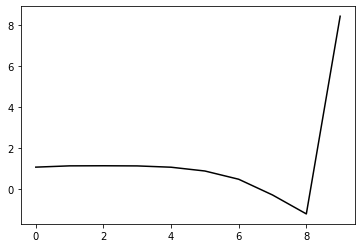

372900 0.20675253524209614
0.2953862467701318 -0.28769993048174236 -0.16988851646786607 -0.11174841365225625
[ 1.03508066  1.16883207  1.18742071  1.17981036  1.11908208  0.94000444
  0.54087308 -0.22600944 -1.15152479  8.45873532]


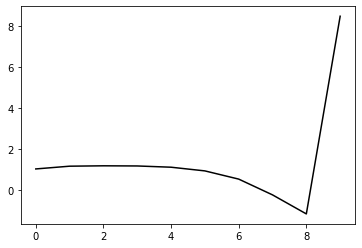

374000 0.18277515867561236
0.2951777095409313 -0.2848343666815194 -0.1681647723006905 -0.11269715184642817
[ 1.08968737  1.10290015  1.14489228  1.14542112  1.09053501  0.92056067
  0.53004074 -0.23126136 -1.15256815  8.49654333]


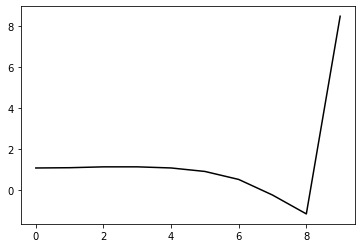

375100 0.19831542025040047
0.28356421588012404 -0.28787561868063793 -0.16786826224868134 -0.11399892858817715
[ 1.09436599  0.92860913  0.94462276  0.9369077   0.87262953  0.69620358
  0.3016707  -0.46334879 -1.38630204  8.45289383]


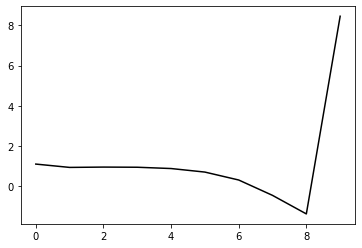

376200 0.1315075112917157
0.29228634217629373 -0.28485594399682196 -0.16758920164800345 -0.11319169582756801
[ 1.072583    1.16254904  1.15517037  1.13461551  1.06292268  0.87967979
  0.47845322 -0.29456791 -1.22665546  8.4620847 ]


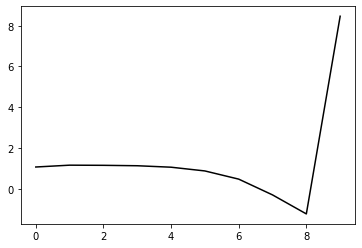

377300 0.28499209668818337
0.2905119123462688 -0.2885132619985076 -0.1703896165832866 -0.10951725952721832
[ 1.06540278  1.06483391  1.07267505  1.04619798  0.96735502  0.77942795
  0.37494477 -0.40146271 -1.3363203   8.44022682]


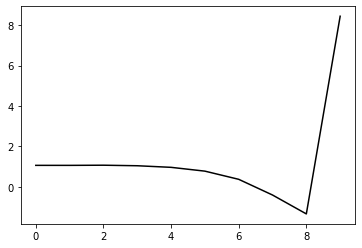

378400 0.18359694019577072
0.29382093594439196 -0.28337735770588124 -0.1672745305117596 -0.11238177018105576
[ 1.04297884  1.15676061  1.16764724  1.14455107  1.066699    0.88036953
  0.47803967 -0.29735662 -1.23172122  8.49294443]


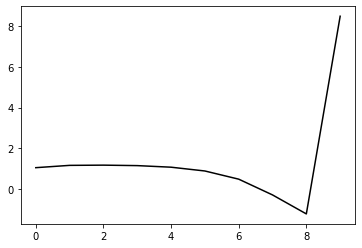

379500 0.2435180129123949
0.292083219351011 -0.2885495888048221 -0.17138741598428106 -0.10930220177729859
[ 1.07447295  0.99091227  1.00791029  0.99256701  0.92005676  0.74056386
  0.34734242 -0.41891583 -1.34274192  8.42307589]


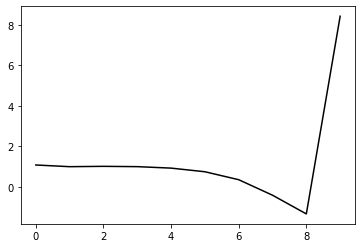

380600 0.25727625665184334
0.289545808408933 -0.281855387675105 -0.16538404777680263 -0.11640111525199315
[ 1.13043379  1.08432777  1.098483    1.08954131  1.02710143  0.85735005
  0.47441891 -0.28266635 -1.19749246  8.45717528]


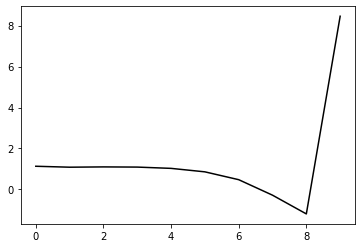

381700 0.22525783231100394
0.2926128933495198 -0.285879408435309 -0.16947364178774252 -0.11150754007555995
[ 1.02047793  1.06175555  1.03986635  0.99894473  0.91471762  0.72728023
  0.33016022 -0.43877581 -1.36273083  8.4099385 ]


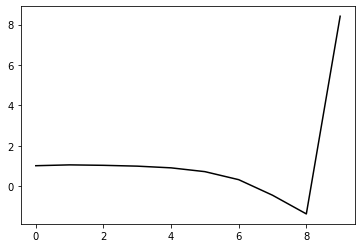

382800 0.1903668322090396
0.29544956181166826 -0.2838404361152675 -0.16853654127036166 -0.1141213757288477
[ 1.03887306  1.20818033  1.20929757  1.1629014   1.07050669  0.87712446
  0.47512982 -0.29901338 -1.2285006   8.472551  ]


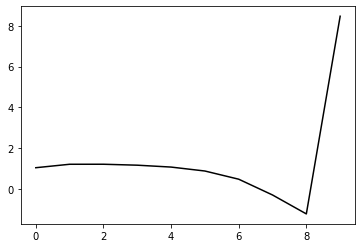

383900 0.2076009189912603
0.29750869461421925 -0.28465859568476093 -0.1701460539677735 -0.11166097016292047
[ 1.03249427  1.20385631  1.20845419  1.15862358  1.0541992   0.85051197
  0.44070245 -0.34042978 -1.2764897   8.44640832]


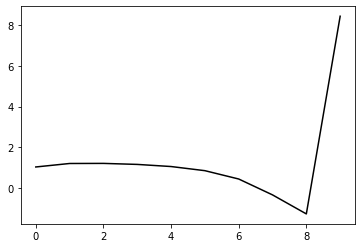

385000 0.23009104686114115
0.2963493202512136 -0.28126228619969135 -0.16725092108865908 -0.1144024167791063
[ 1.11922793  1.09796605  1.13727526  1.1032986   1.0035777   0.80263245
  0.39706701 -0.3795077  -1.31055168  8.45328092]


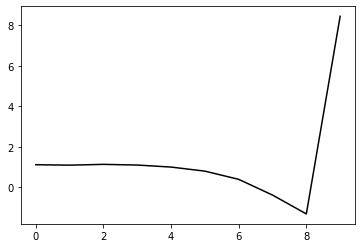

386100 0.18523113773393468
0.2928312300991887 -0.2820226229124302 -0.16718500343724993 -0.11677911291844575
[ 1.11416991  1.13939891  1.17312308  1.1494272   1.0536464   0.85253
  0.44709746 -0.32951489 -1.26103418  8.43278118]


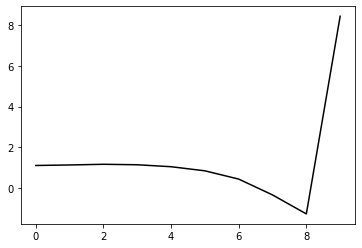

387200 0.1666636513080496
0.28938391628901566 -0.2797036569320328 -0.16506989881869047 -0.11749428493992652
[ 1.089829    1.03234068  1.0524793   1.03066394  0.93346951  0.72836874
  0.32050137 -0.45745335 -1.39005419  8.43978695]


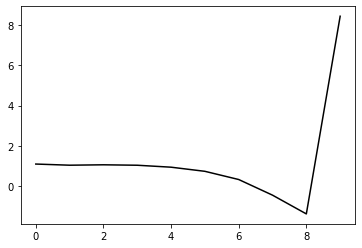

388300 0.31954962735679726
0.2943519874265335 -0.28756279279702684 -0.17342219115626917 -0.1081766785145427
[ 1.01632805  1.03086002  1.04413734  1.01596871  0.91489825  0.70182818
  0.28520296 -0.50155615 -1.44386953  8.38564723]


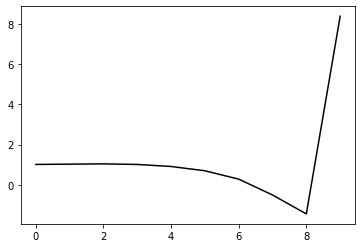

389400 0.20274318603477318
0.2980405471427584 -0.28021345522259566 -0.1683871983994951 -0.11375679632457521
[ 1.0061387   1.13042698  1.14793919  1.11910474  1.01881409  0.80424559
  0.38549945 -0.40276188 -1.34605268  8.44555352]


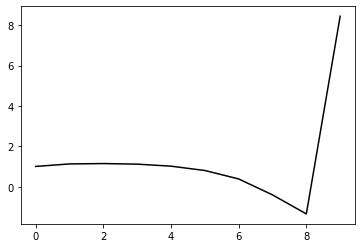

390500 0.23714492244344498
0.29747781859956685 -0.2804573288847759 -0.16859615126132968 -0.11567056619913813
[ 1.06157171  1.16420223  1.1925796   1.17928214  1.09774865  0.89904614
  0.49346399 -0.28263638 -1.21426143  8.45051914]


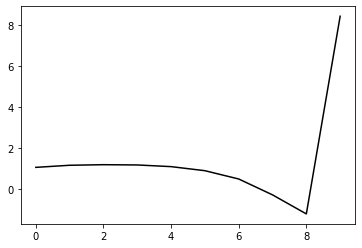

391600 0.21010811391457998
0.2974278748955173 -0.2777482176223031 -0.16700017338579104 -0.11617878372691823
[ 1.04975395  1.1448989   1.17672186  1.16424436  1.08341162  0.88446598
  0.47642891 -0.30305351 -1.23939298  8.47314248]


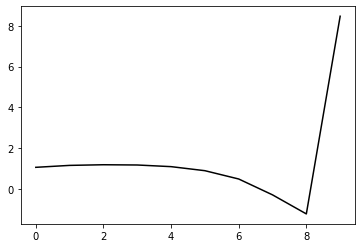

392700 0.22718514851881005
0.2898245589967421 -0.27741629467655143 -0.1655123884186907 -0.11706575289229397
[ 1.09007019  1.04584075  1.0257886   0.99638044  0.90383068  0.6958408
  0.28067555 -0.50323273 -1.44127085  8.41209713]


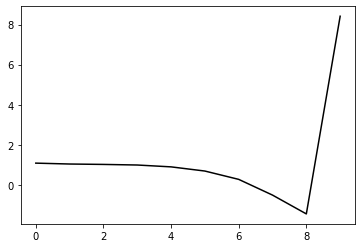

393800 0.18810679849740922
0.29554968764286754 -0.2822222249131915 -0.17078381355165484 -0.11500842356390274
[ 1.04780668  1.13187084  1.14097312  1.11393304  1.02594233  0.82251318
  0.41025149 -0.37085596 -1.30519526  8.43821235]


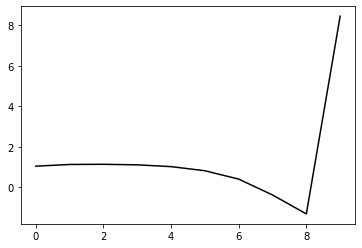

394900 0.2318276381571046
0.2952564254538337 -0.2804549513380844 -0.16954964253961907 -0.11750766218378314
[ 1.0678098   1.1205227   1.15501258  1.14472742  1.06783897  0.87455319
  0.47003446 -0.30498436 -1.23411995  8.42879067]


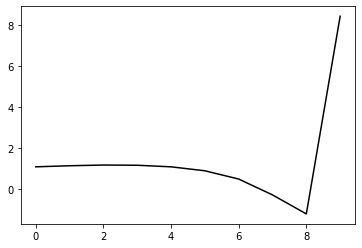

396000 0.18047955697337736
0.2952605005302974 -0.2830064476452193 -0.17180511242593605 -0.11612103501704654
[ 1.08705465  1.03627976  1.05130342  1.04472904  0.97604004  0.79178417
  0.39613069 -0.37007878 -1.28962881  8.44348552]


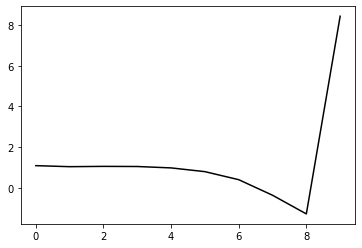

397100 0.1879526834821829
0.29273106861457526 -0.28061367779031554 -0.16951102730877185 -0.1189754907887987
[ 1.11284655  1.07148832  1.08909753  1.08418157  1.02336688  0.84835609
  0.46080964 -0.29852976 -1.21197049  8.43792764]


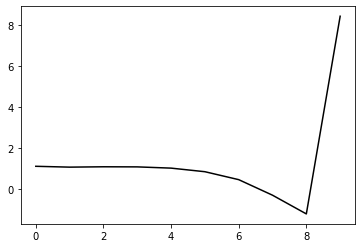

398200 0.1324047347324078
0.2928460139474851 -0.2774036481320077 -0.16763982492304094 -0.11707874783322772
[ 1.05256768  1.040105    1.04207315  1.01823293  0.93881991  0.74760995
  0.34376737 -0.4328661  -1.36525808  8.47284834]


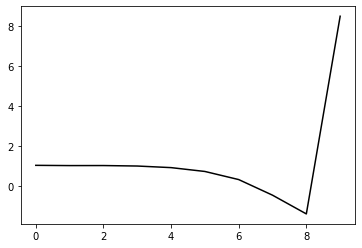

399300 0.26210803551630857
0.29721315156782596 -0.2723644957623694 -0.1654158520295589 -0.11732884978975666
[ 1.03892021  1.09005544  1.11040844  1.08607062  1.00342679  0.8094883
  0.40217322 -0.37977032 -1.31996732  8.41902715]


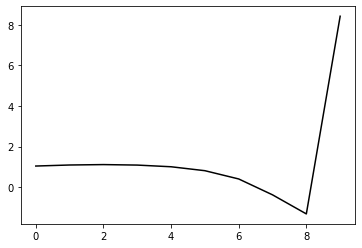

400400 0.18635140342849985
0.2932456648012546 -0.27538190660666506 -0.1669540387726985 -0.11727000803940371
[ 1.02285053  1.05577563  1.06186853  1.04572367  0.96835258  0.77942792
  0.37721956 -0.39985018 -1.33468021  8.45305958]


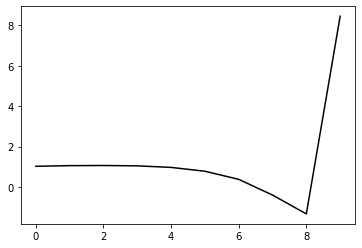

401500 0.25225564525720773
0.29512155988672667 -0.2786921203154065 -0.17028450177227702 -0.1157242135436749
[ 1.04304547  1.00840385  1.02786988  1.018518    0.95181091  0.77388032
  0.3828129  -0.38345653 -1.30688337  8.41987947]


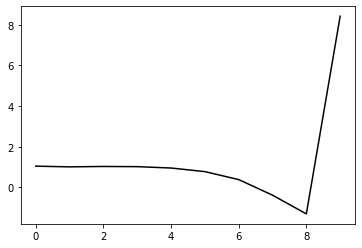

402600 0.20284900995805688
0.28930474218161467 -0.2765448182291345 -0.1678108499905147 -0.11556208170744821
[ 1.06470256  0.99158192  0.97081172  0.94702705  0.87072392  0.68451124
  0.28545374 -0.48962137 -1.42336722  8.43343159]


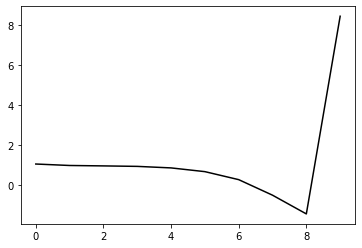

403700 0.22233146546469432
0.294323399059927 -0.27584778577857194 -0.1686394018090928 -0.11517536860832932
[ 1.03987051  1.06128605  1.05451924  1.02392793  0.94537495  0.75896211
  0.36007306 -0.41507843 -1.34889557  8.41238974]


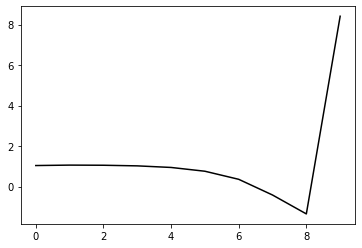

404800 0.2244161212050597
0.2942533056042649 -0.28296452401453337 -0.1744822976560569 -0.11195564894094522
[ 1.01436436  0.953728    0.96651007  0.94312127  0.86888649  0.68958817
  0.29916719 -0.46708829 -1.39071912  8.43159275]


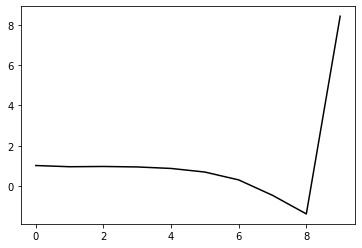

405900 0.22225350677794037
0.2925001970711636 -0.2788054681062617 -0.1708010510156776 -0.11647349596756977
[ 1.03547704  1.06743044  1.06076903  1.03950776  0.96910181  0.79411943
  0.40835499 -0.35400267 -1.27415815  8.44489597]


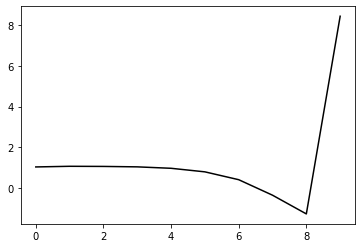

407000 0.2012732579862263
0.2919051177178716 -0.2788036993662561 -0.17081244304517845 -0.11770610279957057
[ 1.08685817  1.02741572  1.032442    1.01175854  0.94477229  0.77664353
  0.40011522 -0.35247911 -1.26244712  8.42636978]


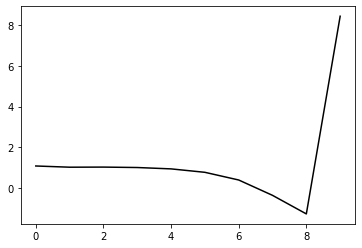

408100 0.25911337678113955
0.2867942236373511 -0.273616798664859 -0.16589891429082426 -0.12172990944536277
[ 1.10628415  1.02908387  1.03516445  1.01295543  0.94277177  0.77218005
  0.39353456 -0.36293195 -1.27997475  8.42989986]


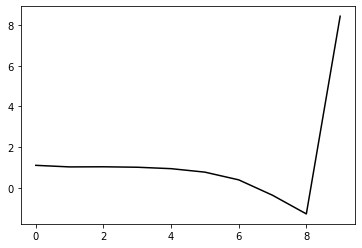

409200 0.12659438028924977
0.2933836067082998 -0.27238099310186575 -0.16754588060283643 -0.11695454998916158
[ 1.04395723  1.12984509  1.1158044   1.07950592  0.99780061  0.81627007
  0.42720397 -0.34070956 -1.27163067  8.44928946]


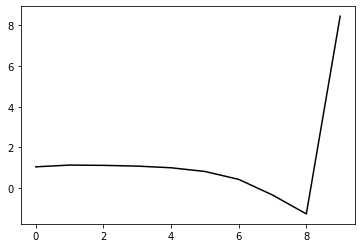

410300 0.2543060965112352
0.29165871871482607 -0.27079643304200907 -0.16633579966843481 -0.11836355974535187
[ 1.07842123  1.08365814  1.08372444  1.05509498  0.9781351   0.80271255
  0.42092555 -0.34031338 -1.26594615  8.4326601 ]


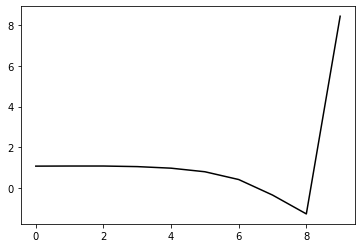

411400 0.22744335531902293
0.29569423686400403 -0.2734868811656688 -0.1702430472264999 -0.11445005568232805
[ 0.98052158  1.13012579  1.12850333  1.0991506   1.02229312  0.84801962
  0.46955672 -0.28838054 -1.21243775  8.51474413]


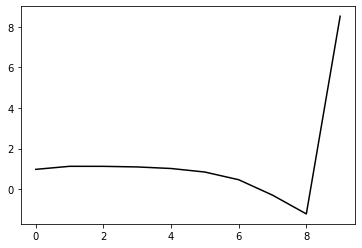

412500 0.2420825681838077
0.2935549074470529 -0.2704203978418396 -0.16784584376099826 -0.11529388191615056
[ 1.0449024   1.15246283  1.16391275  1.14191658  1.06672095  0.89248595
  0.51388581 -0.24527849 -1.17293562  8.43720428]


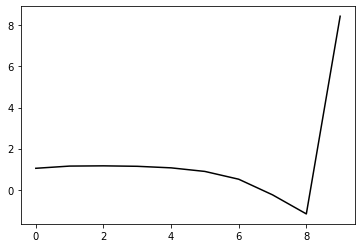

413600 0.2148950364177549
0.2883854994279367 -0.2760542076933788 -0.17158483724837267 -0.11350696943257281
[ 1.07236285  0.94753568  0.95545496  0.94232717  0.87476454  0.70885188
  0.3412555  -0.40501743 -1.31851538  8.44687179]


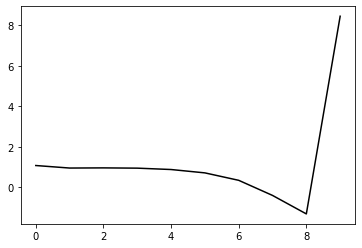

414700 0.22173838387031952
0.2850979206837609 -0.27576828414955395 -0.17076476542339158 -0.11562977160075275
[ 1.0799305   0.99157071  0.97049152  0.95251424  0.8901263   0.72956281
  0.36823399 -0.37088487 -1.27705643  8.43203644]


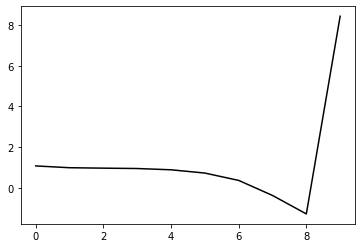

415800 0.1906567913080271
0.2893154139697946 -0.27264356136202894 -0.16984749418783818 -0.11489655494308638
[ 1.04750769  1.08644794  1.05737318  1.01930114  0.94449878  0.77426861
  0.40369842 -0.34466699 -1.26177102  8.45298933]


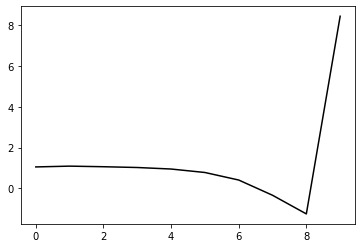

416900 0.20525244495404274
0.29367262290540863 -0.2741464419576517 -0.172382206947136 -0.113857925866502
[ 1.01642076  1.13803493  1.14715693  1.11493556  1.03952802  0.87246338
  0.50724075 -0.23484349 -1.1462995   8.45084831]


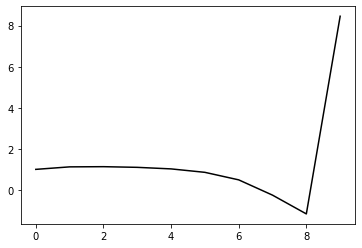

418000 0.18425999291898776
0.28625189339799323 -0.2777881794493213 -0.17360486288651938 -0.11577452274277472
[ 1.09264553  1.00309723  0.99931712  0.97555925  0.90650912  0.74799196
  0.39534649 -0.33089488 -1.22410028  8.46839314]


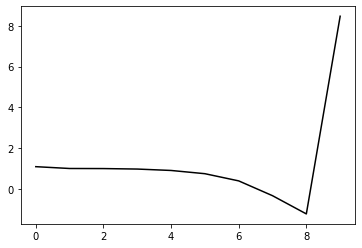

419100 0.1913084832296334
0.28284964825185366 -0.27355843534802804 -0.1698453189834828 -0.11906122007443931
[ 1.11265833  1.0339098   1.01527908  0.98615819  0.91648732  0.75754479
  0.40555124 -0.31978205 -1.21369736  8.43486175]


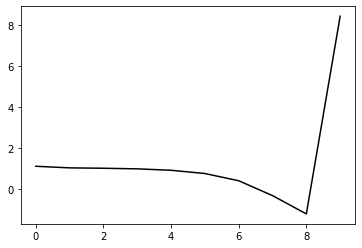

420200 0.14772666779303004
0.2860668869002942 -0.27148477737060117 -0.1694218849404517 -0.11879859659188022
[ 1.07222688  1.10512863  1.09953648  1.0650891   0.99064865  0.82841372
  0.47438062 -0.25253545 -1.1498747   8.47968572]


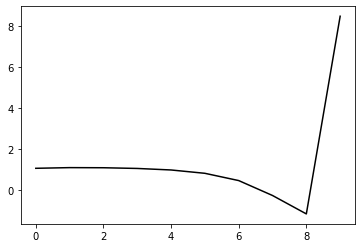

421300 0.2476216419297417
0.28289150239742555 -0.27123439745250644 -0.16889458955018136 -0.11771378922262199
[ 1.09001979  1.0302564   1.00060196  0.96116863  0.87952946  0.7117443
  0.35545903 -0.37099541 -1.26719671  8.39896039]


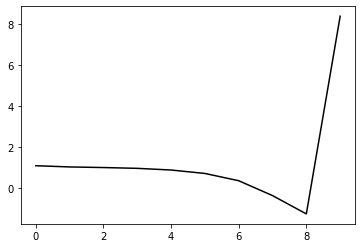

422400 0.23841742962880447
0.2758966748519052 -0.28170404675831257 -0.17618887842035436 -0.11138511264904989
[ 1.08527712  0.97096261  0.93285303  0.88153853  0.78956255  0.61269586
  0.24951912 -0.48191415 -1.38293907  8.42415951]


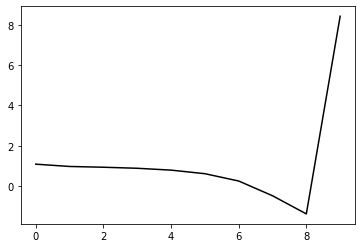

423500 0.2535709789331732
0.2890569642137519 -0.2735259400799326 -0.17250572288806731 -0.11569171614933015
[ 1.03527988  1.19643045  1.17427526  1.12002052  1.02563968  0.84678167
  0.48275159 -0.2482925  -1.14859439  8.42209386]


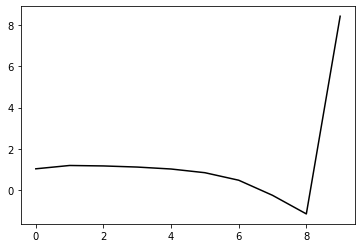

424600 0.21001292423026793
0.28951529629856854 -0.2707544166019192 -0.17086286980642493 -0.11572194042766189
[ 1.03475129  1.06715801  1.08477992  1.03456157  0.9334064   0.74779423
  0.37866582 -0.35605422 -1.26032551  8.4622604 ]


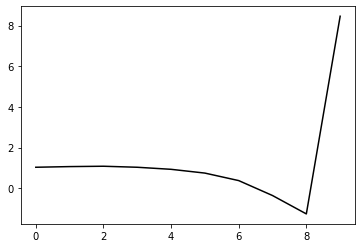

425700 0.2108772522930039
0.28333382482577224 -0.27723569566686296 -0.17456049933145898 -0.11826096864445391
[ 1.09819913  1.11045277  1.12845297  1.10488356  1.02311191  0.85303029
  0.49937678 -0.2191769  -1.10682673  8.47654319]


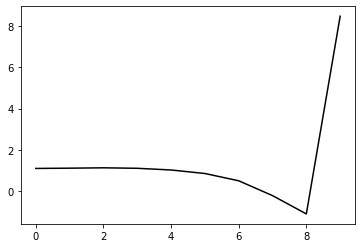

426800 0.20041511559385852
0.28559279775540514 -0.2709337568142451 -0.1709419562342534 -0.11557078169171284
[ 1.05939456  1.15354593  1.10905916  1.04572155  0.93107963  0.73074055
  0.35120429 -0.38952757 -1.29837097  8.41904705]


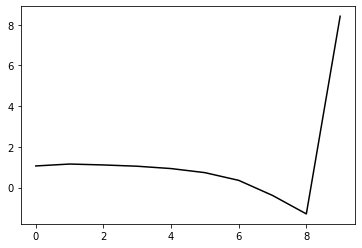

427900 0.212482294836525
0.2977960721089211 -0.26755829848596663 -0.17171257530758893 -0.11291108358103401
[ 1.01319272  1.2510882   1.26820151  1.20442539  1.08142319  0.87064122
  0.48097384 -0.26908829 -1.18842095  8.43612496]


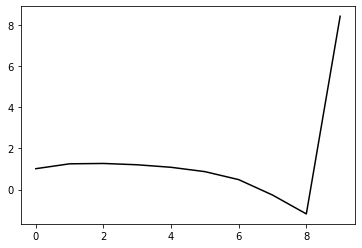

429000 0.1741363320755555
0.29256316645506747 -0.26999205367530077 -0.1725063817881705 -0.11372380604091917
[ 1.07961077  1.08094666  1.1026574   1.06295289  0.95190618  0.74885571
  0.36755772 -0.37216769 -1.2798732   8.45124247]


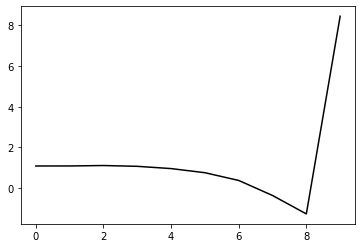

430100 0.32003244848602136
0.28787764595002546 -0.2632219570929271 -0.16647755603285905 -0.11881215930861855
[ 1.12698204  1.07543732  1.10261746  1.07256122  0.96701763  0.7623456
  0.3774608  -0.36574014 -1.27883403  8.42486198]


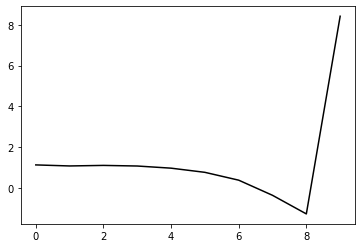

431200 0.141784337106871
0.2924264807549748 -0.265816742569764 -0.1698434167672788 -0.11610201777616783
[ 1.08752007  1.14103203  1.14822986  1.11212412  1.00484665  0.79483496
  0.40434037 -0.34208908 -1.25690799  8.46271626]


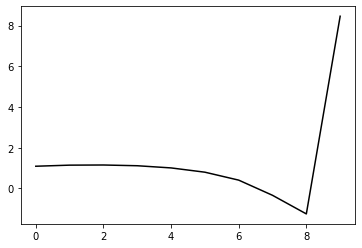

432300 0.27076347193019223
0.2905208743930147 -0.26479503347183514 -0.16889745723673247 -0.11775056862665609
[ 1.11480187  1.13869598  1.13986031  1.1092578   1.01220985  0.80845442
  0.4209545  -0.322304   -1.23492191  8.44406858]


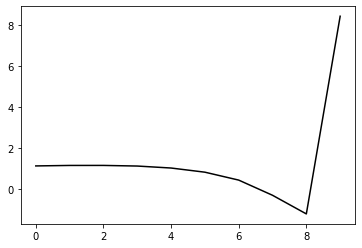

433400 0.19529061669757358
0.2967544422475405 -0.26470600503747077 -0.1707006799078745 -0.1141811533224242
[ 1.0133575   1.19491304  1.20050021  1.15269989  1.04105568  0.82257712
  0.41882273 -0.33799882 -1.26266758  8.46381198]


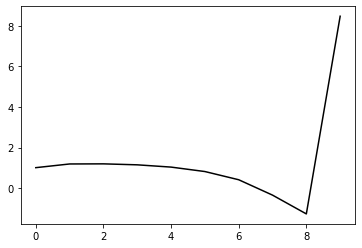

434500 0.33549334861990626
0.2931578848398785 -0.2726193240507379 -0.17669294539044475 -0.11130400974494914
[ 1.01698814  1.06279093  1.06734011  1.03887785  0.9480082   0.75155244
  0.36923583 -0.36377429 -1.26153462  8.43951028]


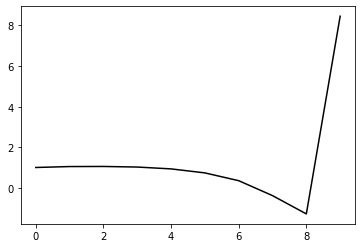

435600 0.2176587850058252
0.2903161954692027 -0.27027748996867473 -0.17433853145449135 -0.11419330471762197
[ 1.07287214  1.05778636  1.0683899   1.04171746  0.95274235  0.75742231
  0.37431123 -0.35818645 -1.25379255  8.45485998]


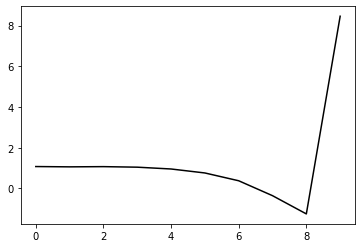

436700 0.22644652433014323
0.2881227236061586 -0.2659972015462875 -0.17081299287699014 -0.11493963795613744
[ 1.09062111  1.06673277  1.04659749  1.00981475  0.91401413  0.71160623
  0.31981319 -0.42126349 -1.3256904   8.42850507]


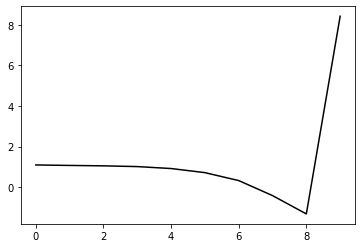

437800 0.2570804662627905
0.2951860739099644 -0.2656185099115407 -0.17261873124753246 -0.11299321639957556
[ 0.98841546  1.13399399  1.12476228  1.08064605  0.97898481  0.77063738
  0.37068211 -0.37954145 -1.29453011  8.4889785 ]


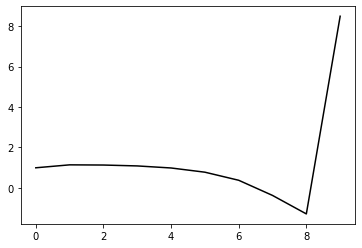

438900 0.21722698855662542
0.2996443833847365 -0.26327993463012717 -0.1721746390627395 -0.11376462168607539
[ 1.00694413  1.227647    1.24438714  1.2080488   1.11300147  0.91032194
  0.51343464 -0.23503247 -1.14891405  8.45053618]


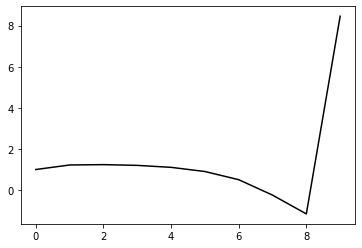

440000 0.17366052304579047
0.2881105908760718 -0.2684588726414578 -0.17424220564325782 -0.11217233622714215
[ 1.05623096  1.01987761  1.03403009  1.01264347  0.92522629  0.73021767
  0.34039125 -0.40070873 -1.30577515  8.44780566]


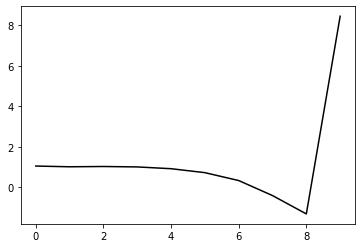

441100 0.1716855143542663
0.293899205391081 -0.26237893947200047 -0.17097907993344413 -0.11475708455383649
[ 1.08607638  1.12212223  1.13479624  1.11243275  1.02698372  0.83192818
  0.44043121 -0.30289616 -1.20999291  8.4265092 ]


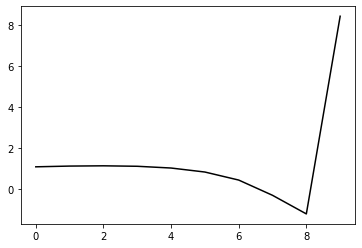

442200 0.1419654487158547
0.2881658197071327 -0.2633136806395409 -0.17045073712232592 -0.11561934539338087
[ 1.08825433  1.1024543   1.10521425  1.07596362  0.98178176  0.77788597
  0.37739136 -0.37408955 -1.28769043  8.4759155 ]


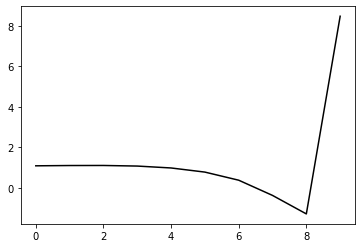

443300 0.28712089255981427
0.289925837425081 -0.26752600194792053 -0.17463173327860537 -0.11087281934182062
[ 1.0540795   1.09531881  1.10729356  1.0753158   0.97809746  0.76993297
  0.36379185 -0.39373156 -1.31300618  8.43071051]


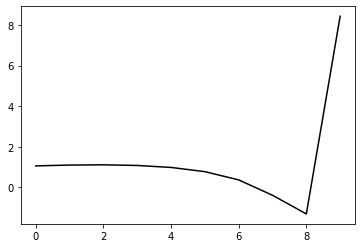

444400 0.21114401499775898
0.27925839162244126 -0.2726368260536952 -0.1761996810333646 -0.11303404977813693
[ 1.09032053  1.04748586  1.04037243  1.01444744  0.92487597  0.72492844
  0.32733763 -0.42046089 -1.32726345  8.44102969]


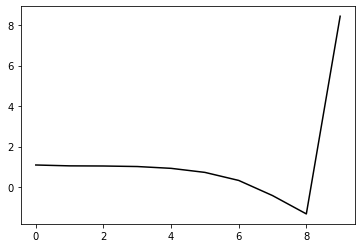

445500 0.249569551897646
0.29093428127795723 -0.26481762371780176 -0.17286749117816705 -0.11574884348668185
[ 1.05933605  1.25728952  1.26352232  1.22784076  1.13075908  0.92257687
  0.51544749 -0.24268624 -1.16048942  8.42410159]


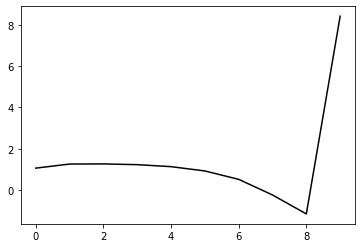

446600 0.2064868517640369
0.2835385965008576 -0.2636745709554067 -0.17111340019606033 -0.1125545393101756
[ 1.10847748  1.02076327  1.00704532  0.96159258  0.85365298  0.63738351
  0.2236922  -0.53976904 -1.46150306  8.42218254]


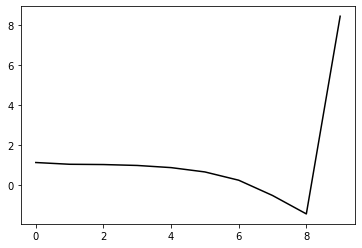

447700 0.22187195439953625
0.28971948364363465 -0.264512998383141 -0.17299165338071645 -0.11293011379095126
[ 1.07780074  1.09161992  1.09461475  1.0509084   0.94395607  0.72832174
  0.31515967 -0.44716751 -1.3658887   8.41811671]


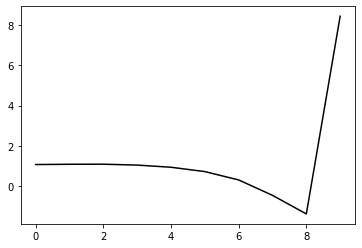

448800 0.24785921633670427
0.29617840392432965 -0.26178604214071827 -0.17232910287019004 -0.11458459260656961
[ 1.00925298  1.25346879  1.28522041  1.24932876  1.14078786  0.92073211
  0.50163096 -0.26757515 -1.19346611  8.49012207]


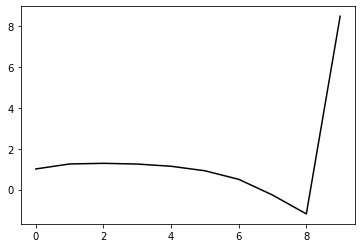

449900 0.23718423103670216
0.2917024653344645 -0.2617181450050383 -0.17143179549506843 -0.11672152477754463
[ 1.0806891   1.11495837  1.17011003  1.15941402  1.06607452  0.85726123
  0.44859754 -0.30973262 -1.22217125  8.44187017]


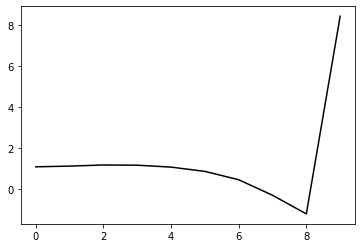

451000 0.1712845320925222
0.28724717270134675 -0.26946794606447766 -0.17684196720280596 -0.11569252644602701
[ 1.08193123  1.07446191  1.10034613  1.11118751  1.0474508   0.86260603
  0.47459661 -0.26434401 -1.15607887  8.46151635]


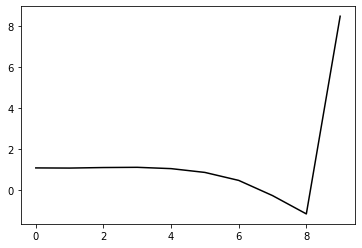

452100 0.17832086855330898
0.2841964345826398 -0.2621657447181205 -0.17107259692254534 -0.11797240129218474
[ 1.10063155  1.06538742  1.08952017  1.08167947  1.00933185  0.8158591
  0.4156214  -0.33813234 -1.24701981  8.44375384]


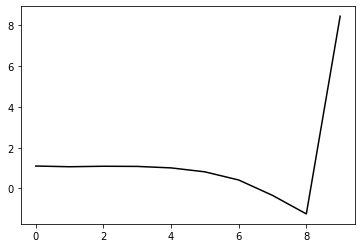

453200 0.16112120916906492
0.28343212933605644 -0.2588835079998047 -0.1689654695239187 -0.11782147196121373
[ 1.08443389  1.01710432  1.02324949  1.00943931  0.93396379  0.73998427
  0.33816402 -0.41808043 -1.32932716  8.44777923]


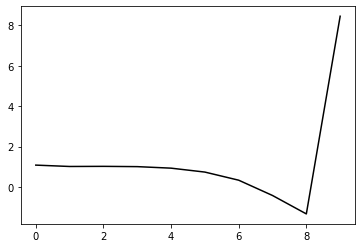

454300 0.29860078435402093
0.28670918066875917 -0.2584509866604064 -0.1697007826306199 -0.1185314058813762
[ 1.11883806  1.09851924  1.12530326  1.12192469  1.05954726  0.87861104
  0.48621325 -0.2638024  -1.17007277  8.42725592]


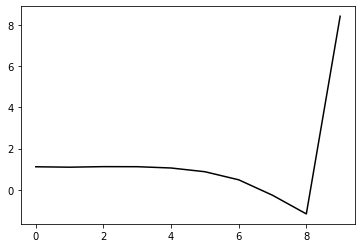

455400 0.18644017285808615
0.28903317586910937 -0.26005247678793775 -0.17189750704843149 -0.11703874217722866
[ 1.0927869   1.22785917  1.24598703  1.23770977  1.17801578  1.00179585
  0.6112896  -0.14010073 -1.04879808  8.46820876]


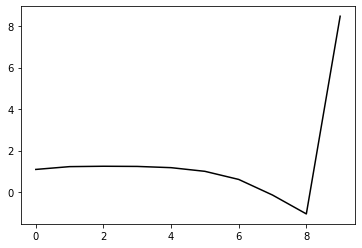

456500 0.2492012401396864
0.28979668530985087 -0.26252806493254777 -0.17407347383608288 -0.11566756245702388
[ 1.06176375  1.13730784  1.17528348  1.17895715  1.12590448  0.96061639
  0.58129053 -0.16048284 -1.05884005  8.48905857]


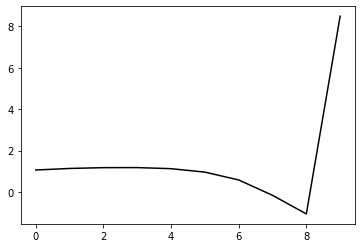

457600 0.21041054738831982
0.2890370964323943 -0.2584831622707714 -0.1714456362678485 -0.11607160600038512
[ 1.0552345   1.11667247  1.14871706  1.14330738  1.07930469  0.90469449
  0.51694445 -0.23516377 -1.14524214  8.44788942]


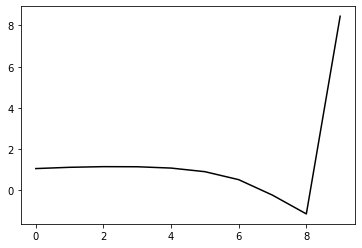

458700 0.22435663589855906
0.28086557270946755 -0.25755272842634386 -0.1693647159668986 -0.11715958983123413
[ 1.09473715  1.00819041  0.9739457   0.95068614  0.87920125  0.70184111
  0.31505513 -0.43446177 -1.33941562  8.43072146]


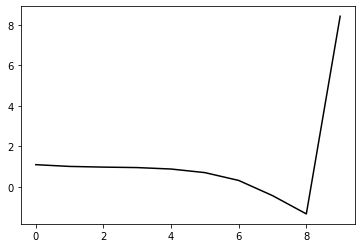

459800 0.19604227838732524
0.2849482317334329 -0.2641459941402741 -0.17553898746937732 -0.11471547699231584
[ 1.04205006  1.08875369  1.06882521  1.04020305  0.97100248  0.79878776
  0.41768915 -0.32687939 -1.22606317  8.44862422]


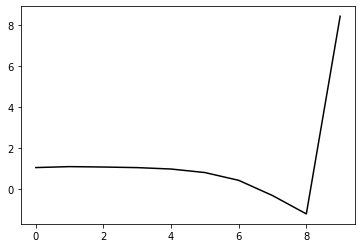

460900 0.20973496561225188
0.292456614698643 -0.2604358146041544 -0.17505843543813332 -0.11325683768543415
[ 1.00715464  1.13829803  1.13898049  1.10297597  1.02517107  0.84689731
  0.45978541 -0.29342849 -1.20410157  8.43090764]


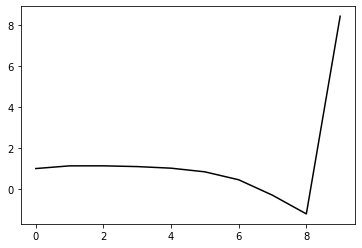

462000 0.20552979681800299
0.2815473175702922 -0.26446453309443946 -0.1754191115325919 -0.1154852061825403
[ 1.09951248  0.97565833  0.96261227  0.93135601  0.85531857  0.68295262
  0.30588589 -0.43509372 -1.32925463  8.42070479]


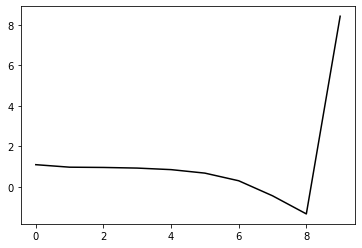

463100 0.18394590930455162
0.28559977471777437 -0.2626952512758137 -0.17506744101219826 -0.11839593409944509
[ 1.07247632  1.13465343  1.1414925   1.11498975  1.04452708  0.87819554
  0.50803189 -0.22737033 -1.11692053  8.46711436]


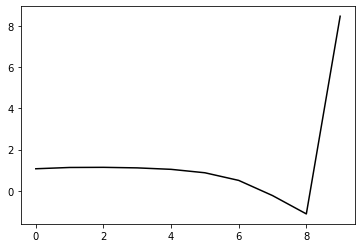

464200 0.14707358281129507
0.28326434052807936 -0.2607592368584788 -0.17340463910851886 -0.11940419920375132
[ 1.07930811  1.10210106  1.0937824   1.06812411  0.99599198  0.8291847
  0.46077631 -0.27359884 -1.16308197  8.47055353]


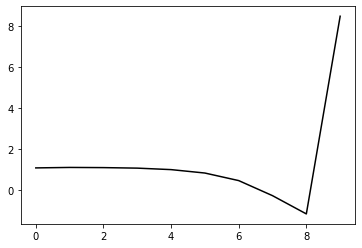

465300 0.25447081869994664
0.28446263876474026 -0.25922300342673343 -0.17255132668130999 -0.12001091928112975
[ 1.08952943  1.10182906  1.09930072  1.07065124  0.99779488  0.83219565
  0.46786202 -0.26193305 -1.14685792  8.48606534]


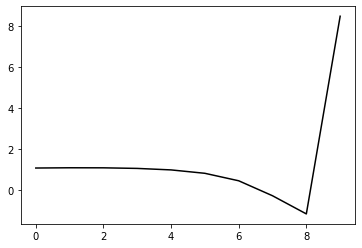

466400 0.242987173249774
0.2734495575334363 -0.27049286519480753 -0.17941614195464242 -0.11350694469757754
[ 1.08280525  0.93172119  0.89184214  0.84536885  0.75408017  0.57295509
  0.19757992 -0.54015582 -1.43024237  8.41362314]


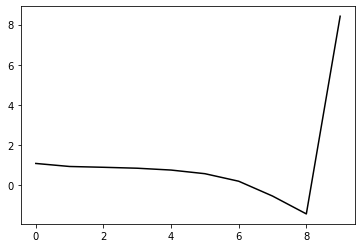

467500 0.24763257502931119
0.28436899488892664 -0.2601614695197984 -0.17335702855072121 -0.11964235336577711
[ 1.08020196  1.16280433  1.12897607  1.07800628  0.98681156  0.8061935
  0.43252725 -0.30289821 -1.19017971  8.45547922]


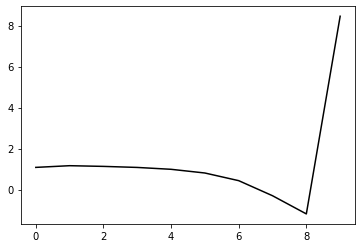

468600 0.21764612282102097
0.28511145347016315 -0.2611396342396667 -0.1747865732487729 -0.11746216433654157
[ 1.06506977  1.07383944  1.06453151  1.01436109  0.91855945  0.73442362
  0.35902645 -0.37767582 -1.26670542  8.47892073]


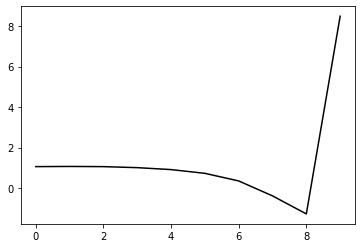

469700 0.22340046745433523
0.28686849178563983 -0.2625877034024113 -0.17685394104598268 -0.11517490250400882
[ 1.04334685  1.05925294  1.07404177  1.03901256  0.94843953  0.76775345
  0.39764382 -0.33297412 -1.2162063   8.45180396]


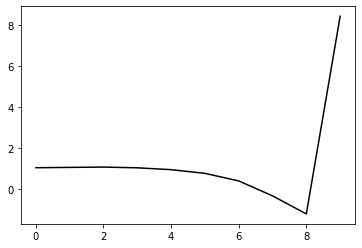

470800 0.1832519511986502
0.28458433392486315 -0.26081305312975167 -0.17533214658986263 -0.11645777754354628
[ 1.04869298  1.07868359  1.0816561   1.05378845  0.96866496  0.79007864
  0.4235745  -0.30222159 -1.18105277  8.46041073]


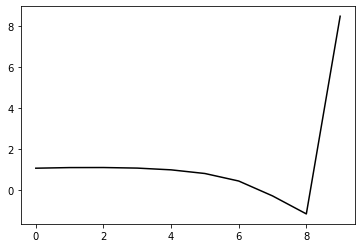

471900 0.21244408546343793
0.289580757461686 -0.2610203225046179 -0.17696241593071707 -0.11452317004464245
[ 1.01117908  1.12320541  1.1363518   1.11060429  1.03059405  0.85480434
  0.49097089 -0.23151564 -1.10778402  8.46251938]


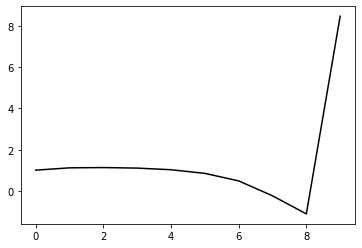

473000 0.24127954446861705
0.28274740920402663 -0.25761177791741624 -0.17367326028599023 -0.1134913595127132
[ 1.10907602  0.93053547  0.91181735  0.87416106  0.78505613  0.59951073
  0.22568952 -0.50649826 -1.39392806  8.45380804]


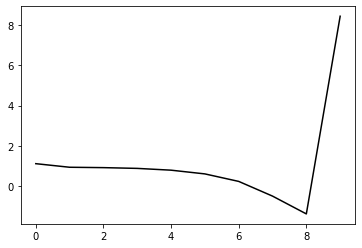

474100 0.32893060184056844
0.2820137002944153 -0.2527221602665315 -0.16936393499059058 -0.12132976744011656
[ 1.11806268  1.08782003  1.08233302  1.04257845  0.95415406  0.76844783
  0.39341722 -0.33990135 -1.2288902   8.42652225]


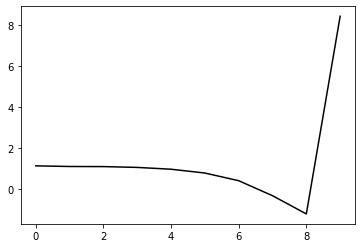

475200 0.1486963885625084
0.28807751611386745 -0.252384313898634 -0.17093553841060197 -0.11774590779429517
[ 1.08117118  1.13015244  1.12041755  1.06823311  0.96765684  0.77191602
  0.38825639 -0.3519159  -1.24667559  8.45292015]


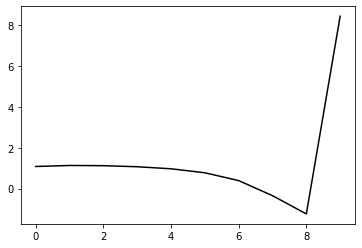

476300 0.2551428306017584
0.28510068626824453 -0.2557731100855643 -0.17304189656045754 -0.11989830455354879
[ 1.09617708  1.10460471  1.1127384   1.08089636  0.99324896  0.80976342
  0.43802466 -0.29006648 -1.17284828  8.39090282]


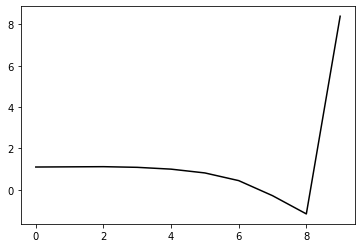

477400 0.15583510764034844
0.29305087058757906 -0.25086362262142453 -0.17193801822016155 -0.11616059202859189
[ 1.02344041  1.21048708  1.24601181  1.2191248   1.12624391  0.93243317
  0.5474018  -0.1965539  -1.10011186  8.46292005]


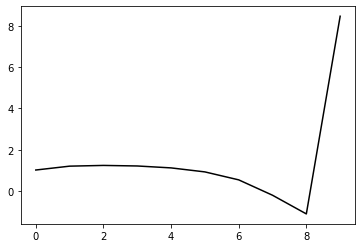

478500 0.24249752367188773
0.28910658722358645 -0.2532781772170193 -0.17298997589349402 -0.11620099127814243
[ 1.05149424  1.17207911  1.17805452  1.15521871  1.06712169  0.87662244
  0.49574734 -0.24219625 -1.13792751  8.44671557]


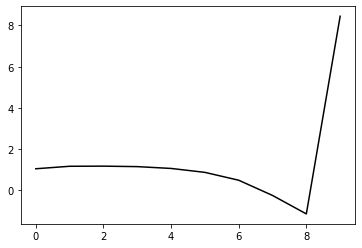

479600 0.21174407287278915
0.2877441966814533 -0.2554166666930673 -0.17466151291879936 -0.11569146639279465
[ 1.08099045  1.0535715   1.0796221   1.06481522  0.98499131  0.80038632
  0.42446656 -0.30792829 -1.19769557  8.45447649]


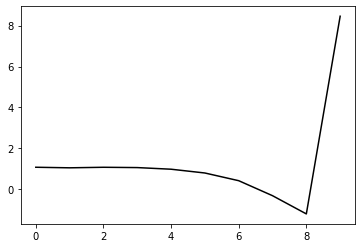

480700 0.21930526028941794
0.2754822376714329 -0.26325343680502916 -0.17804027607647763 -0.1157595314939479
[ 1.09835682  1.02068204  1.00019859  0.98044108  0.90033659  0.71511233
  0.33904892 -0.39141822 -1.27651018  8.4150823 ]


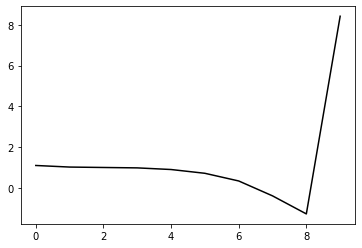

481800 0.18402715730389077
0.28164052736907114 -0.26471060687779974 -0.1806982388920816 -0.1178757667988352
[ 1.09182742  1.10923065  1.1172566   1.10244022  1.03530046  0.86209534
  0.49568581 -0.22619235 -1.10360916  8.45358945]


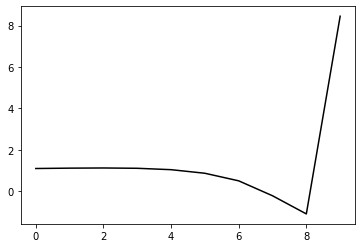

482900 0.2759162509589487
0.288544336941323 -0.26202016079236723 -0.18140503154612375 -0.1101870309784848
[ 1.01267021  1.10597186  1.09802505  1.0589149   0.96825864  0.77380394
  0.38522326 -0.35948313 -1.26210229  8.43131479]


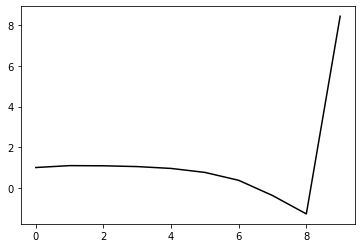

484000 0.17384341433263734
0.2839099548264422 -0.26047803005829245 -0.17928542502736033 -0.1137179770983667
[ 1.04933199  1.0863786   1.0487653   0.99769932  0.90040386  0.70172848
  0.3099608  -0.43660346 -1.33959275  8.43586057]


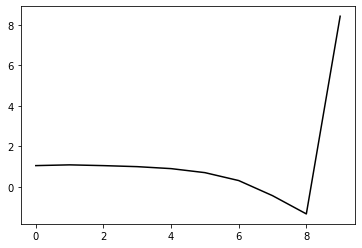

485100 0.22717676616115576
0.2815623170693307 -0.25204837891570914 -0.17206460033951762 -0.12155831459279949
[ 1.11292482  1.06819078  1.07563768  1.02431872  0.9230136   0.7221646
  0.32818056 -0.42056216 -1.32581012  8.43252869]


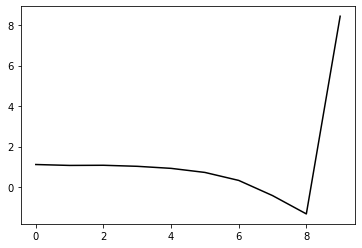

486200 0.1666616312931161
0.28041456532356623 -0.2533534839056881 -0.1732113957194828 -0.12035830853667101
[ 1.09260379  1.06354057  1.05361065  1.00490656  0.89880426  0.69374105
  0.29650648 -0.45444813 -1.36077994  8.45600223]


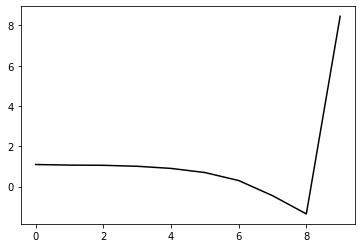

487300 0.2523209017634414
0.28727270969334395 -0.25018817068611193 -0.1729294301164255 -0.11920986901965437
[ 1.08401986  1.1619713   1.1812053   1.13984812  1.03459935  0.82722323
  0.42600557 -0.33070111 -1.24534008  8.44037146]


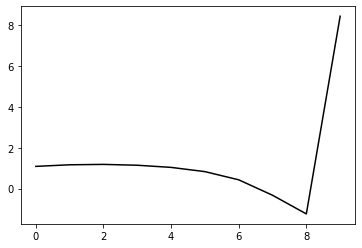

488400 0.17872262825493687
0.28742518799265476 -0.24895095182512786 -0.1725093900356177 -0.1176853931750403
[ 1.05104687  1.14274049  1.1555918   1.11864577  1.00917693  0.7943159
  0.38613622 -0.37620643 -1.29508974  8.44917646]


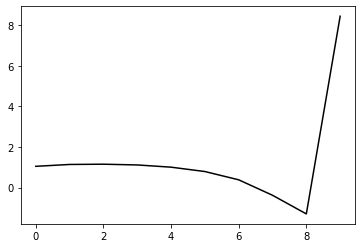

489500 0.29466031574506185
0.2940004434541688 -0.2509394835560134 -0.1759776139246366 -0.11412784878206246
[ 1.014176    1.13283468  1.17732289  1.15480557  1.05432647  0.84260463
  0.43613894 -0.32386374 -1.23931226  8.42693449]


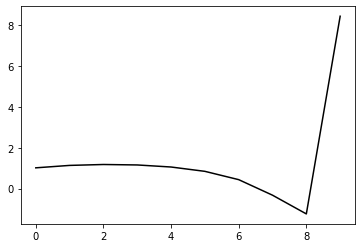

490600 0.2132499019394973
0.2855538318376715 -0.255024860096251 -0.17743585989489996 -0.1151841121171126
[ 1.062269    1.08541693  1.09678793  1.07594013  0.97910828  0.76835138
  0.36270027 -0.39483494 -1.30555154  8.42255738]


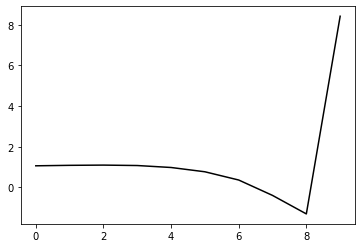

491700 0.18877102809005677
0.2878209671118498 -0.24940422019107636 -0.17374106961515814 -0.12040891855074301
[ 1.07227133  1.20998544  1.23637469  1.21464278  1.11858223  0.90517226
  0.49412963 -0.26976609 -1.1878143   8.46815368]


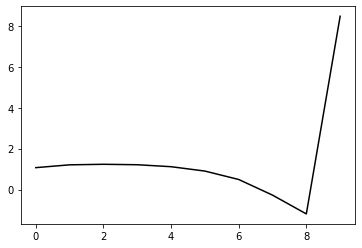

492800 0.1813489485185233
0.28498681706127627 -0.2532321509508463 -0.1766954394263432 -0.11771258541148154
[ 1.05590136  1.09979207  1.13484704  1.12750334  1.04142442  0.83576741
  0.43029059 -0.32826292 -1.2402632   8.43563497]


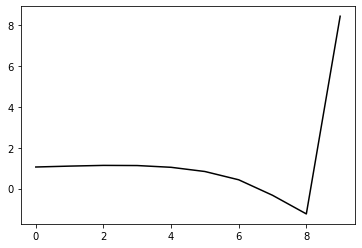

493900 0.2260084968127551
0.2845045569607204 -0.25920151098011684 -0.18175115656859342 -0.1122847230926853
[ 1.04692408  0.98116887  0.99775669  0.98694145  0.90383927  0.70028053
  0.29546545 -0.46160877 -1.36989028  8.48529925]


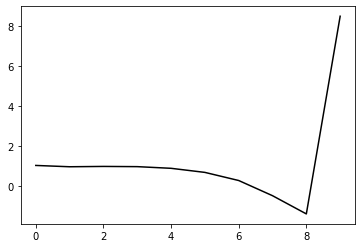

495000 0.2010200469880532
0.28614921447257025 -0.2522507520102807 -0.1766798726575651 -0.11813086041664397
[ 1.09635605  1.09204823  1.10367634  1.08614975  1.00813306  0.80926756
  0.4054954  -0.35216125 -1.26165056  8.46702913]


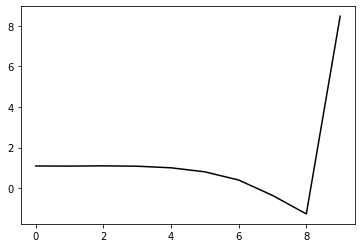

496100 0.25128963175239255
0.2878825534561948 -0.24467216904915215 -0.17188494094496157 -0.11951908197182554
[ 1.0992198   1.14991639  1.19473889  1.18115298  1.1005479   0.89952785
  0.48939333 -0.27827336 -1.20106397  8.42244637]


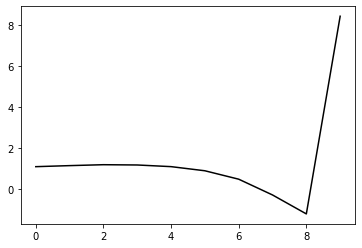

497200 0.13125191554381163
0.2814001388753637 -0.2512390739307722 -0.17577191224618144 -0.11800977087802154
[ 1.06576929  1.04438571  1.06832988  1.06709199  0.99402579  0.80021084
  0.39607527 -0.36598733 -1.28159657  8.45051664]


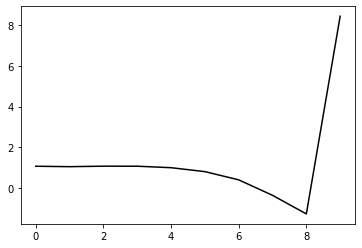

498300 0.25845343087915695
0.28701402269015114 -0.24670568534887355 -0.17403583061604824 -0.11853369557554588
[ 1.06850319  1.10219443  1.13330614  1.13536616  1.07001851  0.88250613
  0.48191697 -0.27906169 -1.19491111  8.44855697]


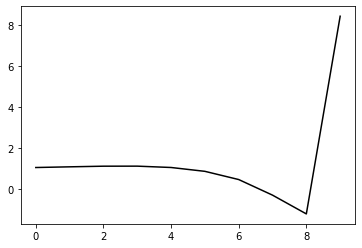

499400 0.16722924081742804
0.2835973501220056 -0.24863176639466178 -0.1753720863875666 -0.11725547901689476
[ 1.0467948   1.09192418  1.10261157  1.10085176  1.03610167  0.84983883
  0.44898974 -0.31374388 -1.23130466  8.45981848]


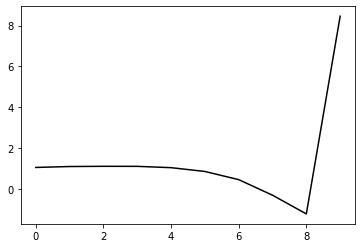

In [158]:
optimizer=tf.optimizers.Adam(learning_rate=0.0005)
for j in range (5000):    
    with tf.GradientTape() as g:
        loss=Error_func(h, m2, lam, alpha, beta, Positive[j%10], Negative[j%10])
        gradients=g.gradient(loss, [h, m2, lam, alpha, beta])
        if np.isnan(loss)==True: break
    for i in range (90):
        optimizer.apply_gradients(zip(gradients, [h]))
        if any(np.isnan(h.numpy()))==True: break
    for i in range (10):
        optimizer.apply_gradients(zip(gradients, [h, m2, lam, alpha, beta]))
        if any(np.isnan(h.numpy()))==True: break
    if j%11==0: 
        print(j*100, Error_func(h, m2, lam, alpha, beta, Positive[j%10], Negative[j%10]).numpy())
        print(m2.numpy(), lam.numpy(), alpha.numpy(), beta.numpy()), print(h.numpy())
        plt.plot(h.numpy(), 'k-'), plt.show()

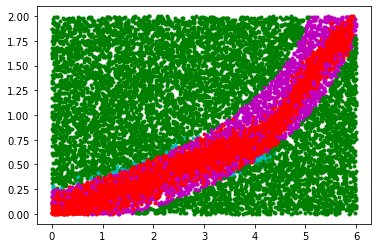

In [159]:
for i in range (set):
    [Positive0[i], Positive1[i]]=NN_func_01(h, m2, lam, alpha, beta, Positive[i])
    [Negative0[i], Negative1[i]]=NN_func_01(h, m2, lam, alpha, beta, Negative[i])
for i in range (set):
    x_data1[i]=[v[0] for v in Positive0[i]]
    y_data1[i]=[v[1] for v in Positive0[i]]
    x_data2[i]=[v[0] for v in Positive1[i]]
    y_data2[i]=[v[1] for v in Positive1[i]]
    x_data3[i]=[v[0] for v in Negative0[i]]
    y_data3[i]=[v[1] for v in Negative0[i]]
    x_data4[i]=[v[0] for v in Negative1[i]]
    y_data4[i]=[v[1] for v in Negative1[i]]
    plt.plot(x_data4[i], y_data4[i], 'g.')
    plt.plot(x_data2[i], y_data2[i], 'c.')
    plt.plot(x_data1[i], y_data1[i], 'r.')
    plt.plot(x_data3[i], y_data3[i], 'm.')
plt.show()

0 0.18475094996908037
0.284704177386384 -0.2509449537966766 -0.1735442955849689 -0.12168135339549101
[ 1.02991     0.95300073  0.93475336  0.92385469  0.85728877  0.67285872
  0.2764162  -0.47900333 -1.38432065  8.43923362]


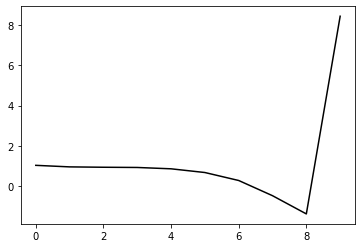

1100 0.17184151824134428
0.2977954985991628 -0.24391259502477777 -0.1719717420676909 -0.12633600941524065
[ 1.04116241  0.9093629   0.84863068  0.80946637  0.73738889  0.55714962
  0.16782449 -0.57908478 -1.47339429  8.40264639]


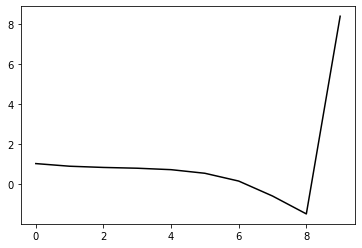

2200 0.14526987828738797
0.29967108312429985 -0.238870064751082 -0.16959174723423298 -0.12424394994250419
[ 1.01806648  0.88956427  0.80377014  0.73283943  0.64015909  0.44870926
  0.05095302 -0.70351642 -1.60377274  8.41553918]


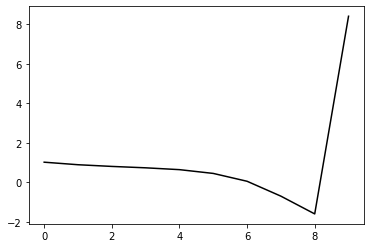

3300 0.5166356905518834
0.30854911350286013 -0.2597389329395326 -0.18809558598772277 -0.11788221289847958
[ 0.97227099  0.94057565  0.87544893  0.79834631  0.70180277  0.51293619
  0.11951817 -0.63049923 -1.52481074  8.35829282]


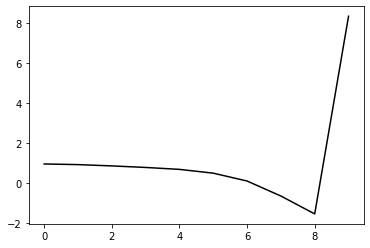

4400 0.20129591387732418
0.30279779269199153 -0.24842950657590732 -0.17767832412270582 -0.12960361088662511
[ 1.0174807   1.00997326  0.93242208  0.84837583  0.74461171  0.55377075
  0.16025326 -0.59052506 -1.48589446  8.42047341]


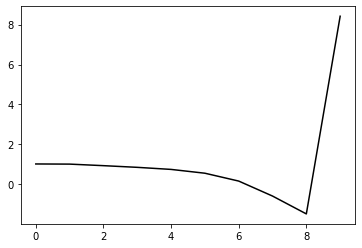

5500 0.24349487857649732
0.3061523575986967 -0.2530388631762237 -0.1825793919557892 -0.12755247107169226
[ 1.03027936  0.91163439  0.87662992  0.80047441  0.695131    0.50813385
  0.1218723  -0.62196683 -1.50993062  8.40712934]


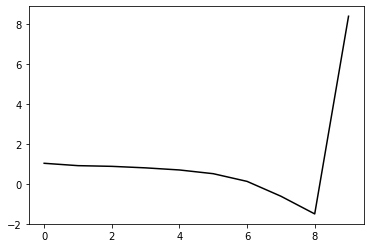

6600 0.20673146916966575
0.3074018706522484 -0.24821547332428434 -0.17905747930279295 -0.13120712259104667
[ 1.04818353  0.98579924  0.95375487  0.88266211  0.77364665  0.5841856
  0.19935887 -0.54329017 -1.43033988  8.45769353]


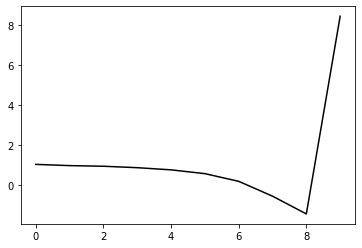

7700 0.2145495708634158
0.3031109326807406 -0.24856019821479186 -0.17902070947070597 -0.13138500212797302
[ 1.04284019  0.98259019  0.95245597  0.88854487  0.77850079  0.58662588
  0.2029544  -0.53825787 -1.42387595  8.42635302]


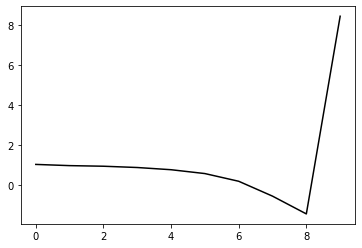

8800 0.23110194266034018
0.30569562648215065 -0.2515119821763329 -0.1824053912655607 -0.1299163335693381
[ 0.98505249  1.05822303  1.03566097  0.98024551  0.87661673  0.68900267
  0.31254347 -0.42101342 -1.29939065  8.42869786]


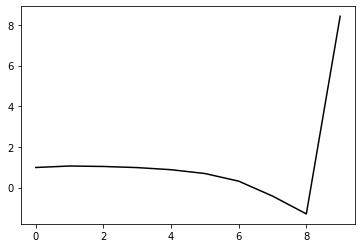

9900 0.21699126085145182
0.3046658583109071 -0.2516293982838394 -0.182543199606023 -0.12913818480715583
[ 1.01274143  1.0611195   0.99729636  0.9180034   0.79483098  0.58847185
  0.19689307 -0.54920607 -1.43856678  8.449043  ]


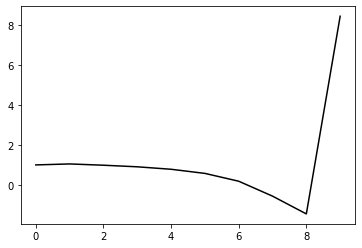

11000 0.2085968711758873
0.3121337266695182 -0.24487308235695268 -0.1788712866835713 -0.1309051788579278
[ 1.05495753  1.04952757  1.03232639  0.95249488  0.82356767  0.61091453
  0.2148873  -0.53486665 -1.4281658   8.41838513]


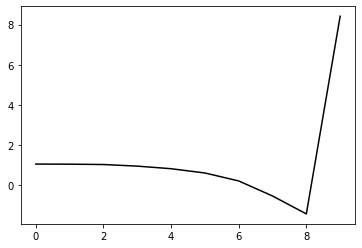

12100 0.19195102660958102
0.3025438764924994 -0.2475542370629516 -0.1795820998323713 -0.13040795052504892
[ 1.07842778  0.98038344  0.9620428   0.8954697   0.76820986  0.55437564
  0.15874295 -0.58930927 -1.48015956  8.41168606]


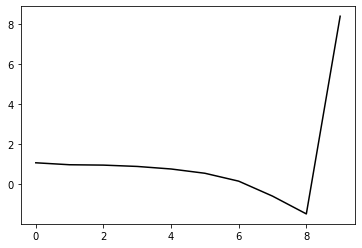

13200 0.14014167419736434
0.30908575408050293 -0.24396390771672088 -0.178445948109921 -0.13074572906874662
[ 1.04930983  1.0895625   1.07256005  1.00971646  0.88355755  0.66480614
  0.2641842  -0.48853371 -1.38545281  8.47156966]


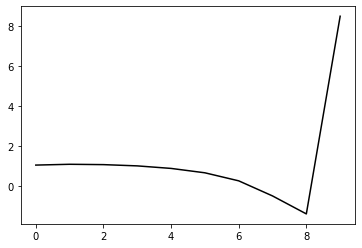

14300 0.2543349878050557
0.30749568887315953 -0.24286979188887323 -0.1774475449716415 -0.13232975753951984
[ 1.0506964   1.05514083  1.03190075  0.97194491  0.85092178  0.63480918
  0.23755201 -0.50999971 -1.40093635  8.40839319]


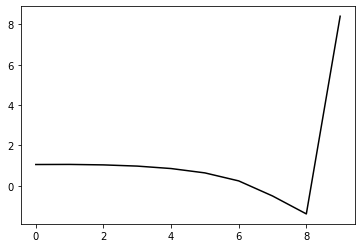

15400 0.1822353209355149
0.31284448762074163 -0.24113660713331436 -0.1779948942982105 -0.129063861241037
[ 0.98233772  1.10987059  1.09839346  1.03469063  0.90490524  0.67602495
  0.2648666  -0.4954109  -1.39914156  8.43461527]


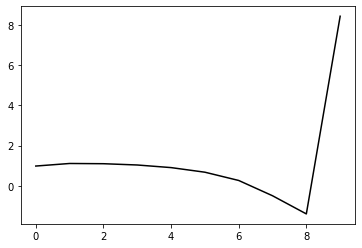

16500 0.26831531683687965
0.3035836477793774 -0.24571882800725917 -0.18084489957716104 -0.12430324061469371
[ 1.02823381  0.93913489  0.89318211  0.81723079  0.67574903  0.43367031
  0.00938714 -0.76265544 -1.67815622  8.3884046 ]


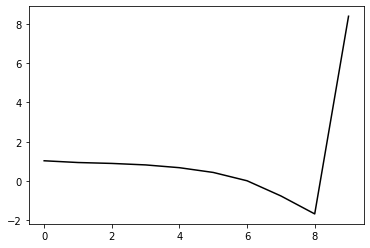

17600 0.20639990117137233
0.3106976439333345 -0.23825903100466295 -0.1759771617964385 -0.13171679839522413
[ 1.04364077  1.08602482  1.06791809  1.00149102  0.86999808  0.63442593
  0.21428617 -0.55363331 -1.46495235  8.44447377]


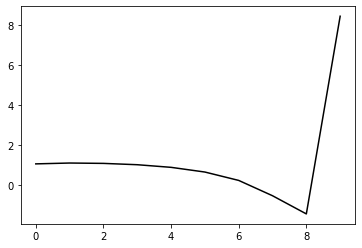

18700 0.21678061246298544
0.307843099975497 -0.2419664347443403 -0.17874214540773045 -0.1293904790951386
[ 1.03926563  1.01138269  0.99913918  0.93973854  0.81192911  0.57891442
  0.16093861 -0.6027143  -1.50745307  8.41149631]


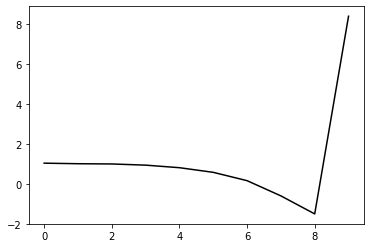

19800 0.22828634476070409
0.30302153979062163 -0.24094232189664813 -0.17742678084818594 -0.12958132835638436
[ 1.03864238  1.00692483  0.96955205  0.90584761  0.77380944  0.53384018
  0.1067285  -0.66652524 -1.58208088  8.41822089]


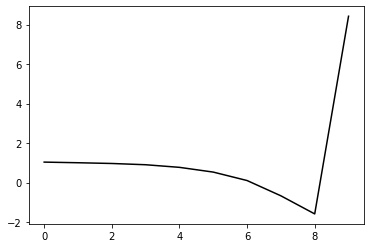

20900 0.21944172388567912
0.3080093755268198 -0.24825800747911228 -0.18465388490812712 -0.1282172635041971
[ 0.98503401  1.12105328  1.10941573  1.05523778  0.93556143  0.70554564
  0.28574713 -0.48005161 -1.38705375  8.4285048 ]


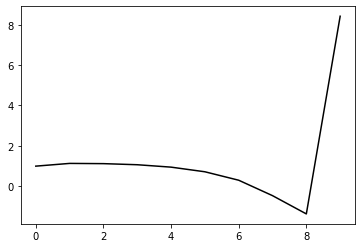

22000 0.17461294812009223
0.3046788886065692 -0.24325567161982908 -0.18092946915465907 -0.12789951969420263
[ 1.03251203  0.99609214  0.98485303  0.92556432  0.80013841  0.56372253
  0.13516425 -0.6402313  -1.55814631  8.43443062]


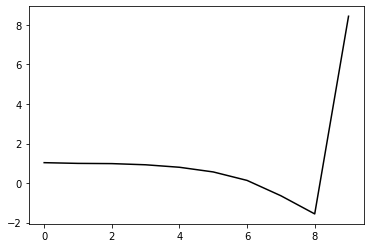

23100 0.2047673406072313
0.2969861842898033 -0.2408745103451524 -0.17739218910894905 -0.13236639930840288
[ 1.08724106  0.94778822  0.93126772  0.88455126  0.77058172  0.54515893
  0.1261292  -0.63937968 -1.54583213  8.40874357]


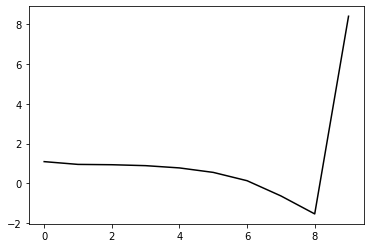

24200 0.13276396741707783
0.29898814777176347 -0.24136106581791283 -0.1785711819590881 -0.1302173546615359
[ 1.02619867  1.01198216  0.98750286  0.92499453  0.79874807  0.56006115
  0.12569441 -0.6558578  -1.57928165  8.40334024]


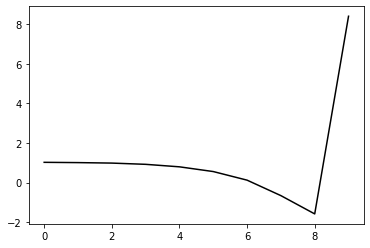

25300 0.35446305761493385
0.30964297377055605 -0.24426668689603384 -0.18426706622262012 -0.12374252967971709
[ 0.96289525  1.04669168  1.05332428  0.99800271  0.87449129  0.63783873
  0.20345666 -0.57944249 -1.50533093  8.36684878]


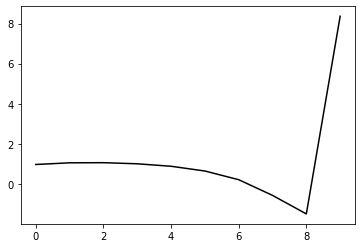

26400 0.18508447911910733
0.30276854233777994 -0.23828485874618435 -0.17763262051178902 -0.12982246997870153
[ 1.0084288   1.07668913  1.04289335  0.97782188  0.84571839  0.60067089
  0.15813995 -0.63187095 -1.56329493  8.41708314]


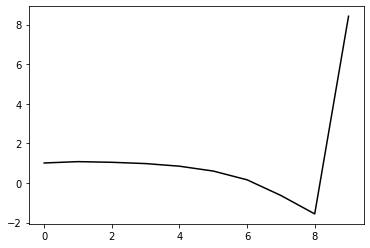

27500 0.24187980683828778
0.30701918154101077 -0.23574323371796532 -0.17692955221263842 -0.13036949819883129
[ 1.03511608  1.11324331  1.1255542   1.0718689   0.94525034  0.70378049
  0.26296642 -0.52602489 -1.45605898  8.41388975]


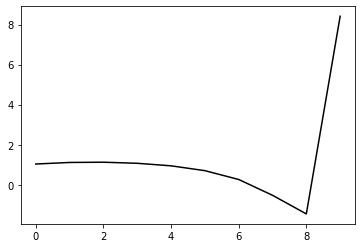

28600 0.2100450984007773
0.3024625444316878 -0.24113417262041512 -0.18057424910370665 -0.12717167865592033
[ 1.01541533  1.02392701  1.01125445  0.95909668  0.83310417  0.59092988
  0.14870138 -0.6416574  -1.57215135  8.35555967]


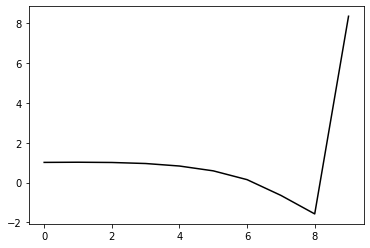

29700 0.19893795044047838
0.30423878161062057 -0.23710278474054136 -0.17798167015504776 -0.12968385598608365
[ 1.04442044  1.05917766  1.06686684  1.02533721  0.9103544   0.67650355
  0.24004892 -0.54561518 -1.47082946  8.40787279]


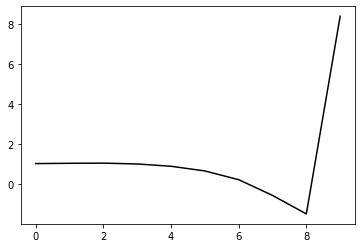

30800 0.20250806344531622
0.30253324152377253 -0.23584977862947692 -0.17774648643836033 -0.12586068535552275
[ 0.98340133  0.98179585  0.95800164  0.90603924  0.7795681   0.53256604
  0.08043352 -0.72351122 -1.67045237  8.41290126]


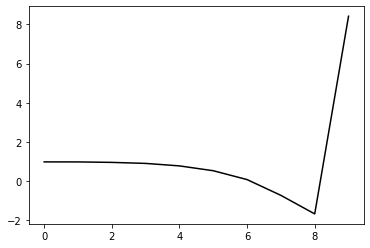

31900 0.22026139936343997
0.3040367931947315 -0.23663279837623488 -0.17879655802788622 -0.12659221119763067
[ 0.99548069  1.05155827  1.01922665  0.96586753  0.8456282   0.60424251
  0.15634869 -0.64355858 -1.58484593  8.37585887]


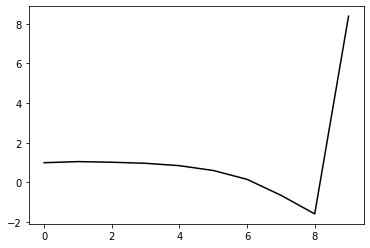

33000 0.17768705875268992
0.30623565527168684 -0.23697863615589784 -0.179718304874481 -0.12876960350825695
[ 1.0182511   1.05029582  1.06836357  1.02931488  0.92130397  0.69217658
  0.25403973 -0.53761769 -1.47014684  8.4235683 ]


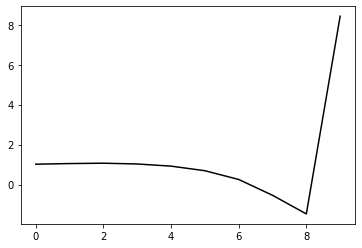

34100 0.19929785219138796
0.29252136069817947 -0.2408247924789003 -0.1789705455021201 -0.13235442728712207
[ 1.08952028  0.9604726   0.93933334  0.89729238  0.78616646  0.55528586
  0.11626639 -0.67429616 -1.60085794  8.40440322]


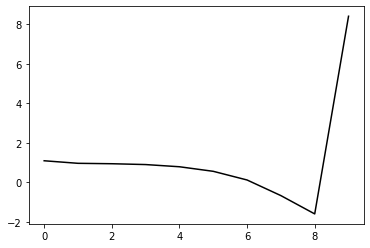

35200 0.15613726628645594
0.288896748986352 -0.24265289020255715 -0.1800633429262738 -0.1309491441091119
[ 1.0455047   0.95107376  0.91705027  0.85704813  0.73461706  0.49328091
  0.04278898 -0.76019391 -1.69929649  8.38491095]


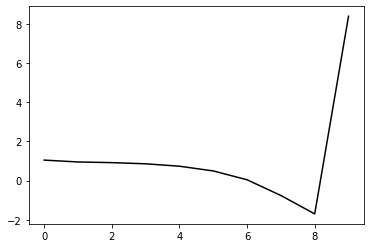

36300 0.2573506112792119
0.2967216248172226 -0.23783772192377967 -0.17874987422720953 -0.1308110043648702
[ 1.04340646  1.0530639   1.03209908  0.9706042   0.84676521  0.60415621
  0.15030647 -0.6584754  -1.60529504  8.39247794]


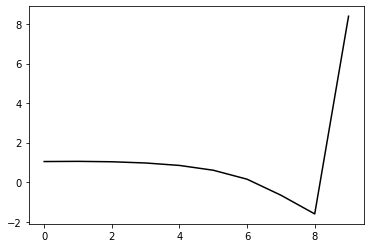

37400 0.26051971766726895
0.3074944806391346 -0.23529493694641324 -0.18006941989045097 -0.12789150419194004
[ 0.94119438  1.15256501  1.17500142  1.12222268  0.99449849  0.74737983
  0.28782205 -0.52820748 -1.48269896  8.41663305]


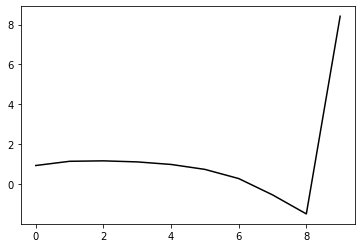

38500 0.26865246137344834
0.3011263400284575 -0.23808563991729076 -0.18110566616624865 -0.1272460587010724
[ 0.99172101  1.08859321  1.07295013  1.01938251  0.88730907  0.6333353
  0.16671795 -0.65652026 -1.61680721  8.36956176]


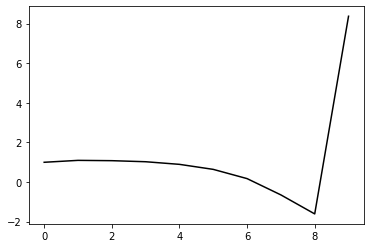

39600 0.20067608965043654
0.29417780530703147 -0.23802280545489338 -0.17972400505782493 -0.12828735910376218
[ 1.05044995  0.96100756  0.94693759  0.8920762   0.75984237  0.50407373
  0.03467305 -0.79243287 -1.75676161  8.38758498]


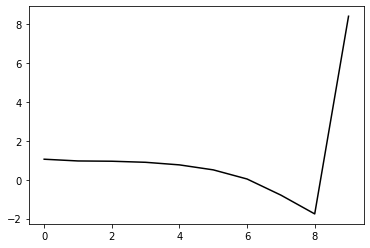

40700 0.22780302955054912
0.29921716504019125 -0.24111541930978445 -0.183524079178749 -0.12676636653725235
[ 1.00848671  1.03252962  1.02894001  0.97846807  0.8521777   0.60050139
  0.13383287 -0.69112054 -1.65188939  8.36346114]


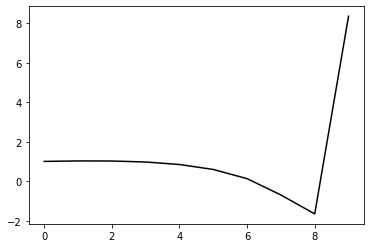

41800 0.20261206722960273
0.29954293471728394 -0.242571003079671 -0.18524343669954701 -0.12459906225306228
[ 1.00645294  0.92612315  0.95071261  0.91145708  0.7952968   0.55153136
  0.08990293 -0.73231313 -1.69056789  8.39132342]


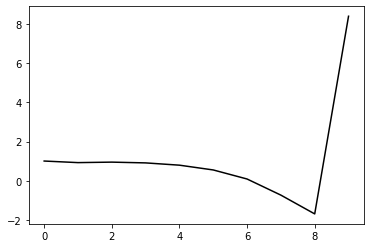

42900 0.2248172424003661
0.30582274174802687 -0.2361438083582968 -0.18195668746924823 -0.12656949243899912
[ 0.96400779  1.1501362   1.16459211  1.12869968  1.01447918  0.76955045
  0.30350976 -0.52600793 -1.49354091  8.41931675]


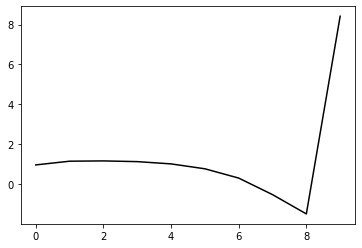

44000 0.19493761048386038
0.29894431816926204 -0.23786070349452593 -0.18178618026728552 -0.12781837265893312
[ 1.05846928  1.02989182  1.04153636  1.00924583  0.90138119  0.66312884
  0.20284924 -0.62161777 -1.58263289  8.36622379]


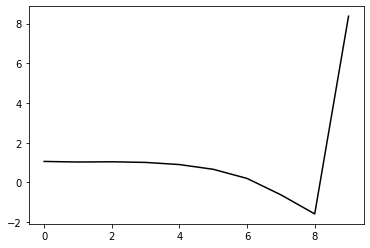

45100 0.19277975613036466
0.2953895930174969 -0.23528404171943382 -0.1790193477240498 -0.13150844573966214
[ 1.07515047  1.04384567  1.0612648   1.03447731  0.9332233   0.70156274
  0.24603258 -0.57576355 -1.53449294  8.37793003]


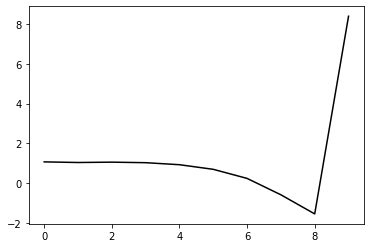

46200 0.14658897235086302
0.2935767349168592 -0.2395487904991026 -0.18234622797747094 -0.12673645917024112
[ 1.01573003  1.01454646  1.01928835  0.98297104  0.87181864  0.63023232
  0.16323397 -0.67214151 -1.64559179  8.39461441]


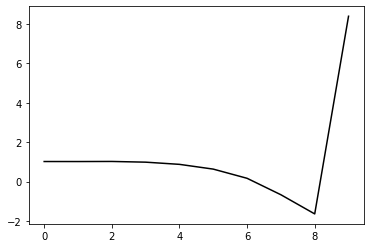

47300 0.2731757326648336
0.2926114549946366 -0.23589643544379374 -0.1793675034273589 -0.13162573454381268
[ 1.0833292   1.07659945  1.07753123  1.05496306  0.96237069  0.73964657
  0.28979945 -0.53083422 -1.48992803  8.41563599]


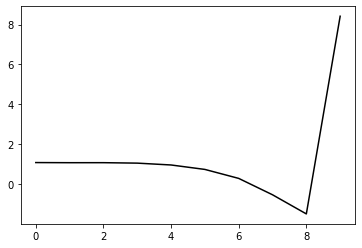

48400 0.1738154020017621
0.29527714785859865 -0.23769954277988592 -0.18169628539542257 -0.12946424891127062
[ 1.00145988  1.11464454  1.10636303  1.07231021  0.97589235  0.75221151
  0.30138873 -0.52098153 -1.48078355  8.43786766]


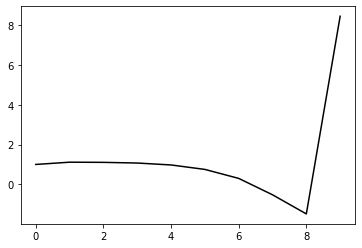

49500 0.2472412542466898
0.29558671608588355 -0.24079979005309288 -0.18442806958709337 -0.1283397405917166
[ 1.0179619   1.06666038  1.07774909  1.05291566  0.96780788  0.75951921
  0.32451607 -0.4831075  -1.42678887  8.42464338]


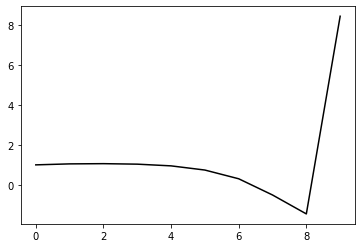

50600 0.20504225927243758
0.28814243039735893 -0.23738535581063597 -0.18101426982929048 -0.12740835570861817
[ 1.07014703  0.96830588  0.9265844   0.8750827   0.76791416  0.54089535
  0.08830928 -0.73784408 -1.70009061  8.38337806]


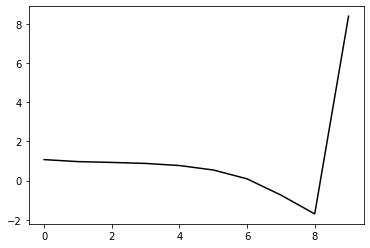

51700 0.23438243147553806
0.2962281495605385 -0.2407182190059486 -0.18607265194242986 -0.12310526127015513
[ 0.99564041  1.0347313   1.04489698  0.99478641  0.88735427  0.66184738
  0.21005041 -0.61787563 -1.58345397  8.35431131]


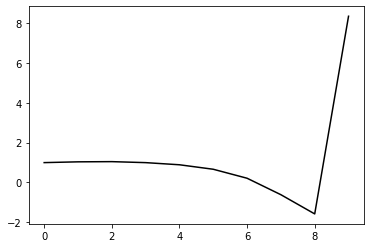

52800 0.34864556125522617
0.2982231996703365 -0.23823686542045086 -0.18495413344913395 -0.12499441518058937
[ 0.94340177  1.13543683  1.13090891  1.08356375  0.97468219  0.7481785
  0.29552706 -0.53486184 -1.50382908  8.43640086]


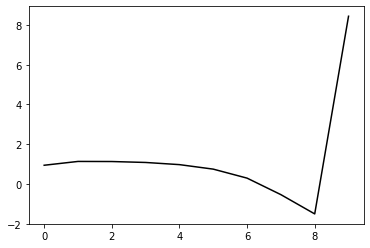

53900 0.20826548939736497
0.29511005561009634 -0.23623293942212187 -0.18312644717491458 -0.12600069476822662
[ 1.00157193  1.12285416  1.13263522  1.09520674  0.99256974  0.77142164
  0.32374654 -0.50379007 -1.47086964  8.41721663]


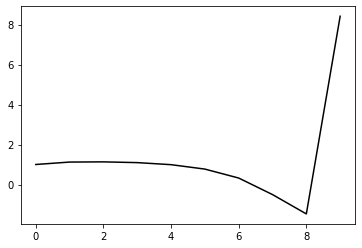

55000 0.2570342829982817
0.28872655195404895 -0.23314428720448793 -0.18008234312486956 -0.12607987505907856
[ 1.10013014  0.91896259  0.91994118  0.8811821   0.77473694  0.54921772
  0.09741893 -0.73643296 -1.71196339  8.4181976 ]


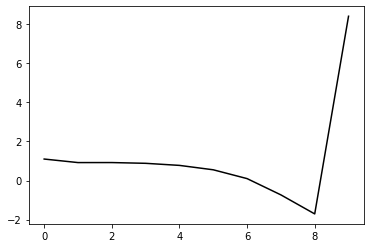

56100 0.20246759327297642
0.2909777500305251 -0.23383104405745123 -0.18137736890928188 -0.12496419274286329
[ 1.03580037  1.08835913  1.04441717  0.98721458  0.86926151  0.63257593
  0.17047217 -0.67396803 -1.66066178  8.38662505]


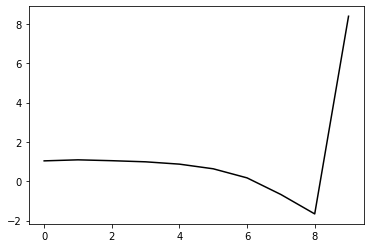

57200 0.13261390971957157
0.29010934755867723 -0.2325095162818503 -0.1799298653396328 -0.12967418026535923
[ 1.03938416  1.08765925  1.07705781  1.02348567  0.90925479  0.67751035
  0.22071067 -0.61912979 -1.60088624  8.407746  ]


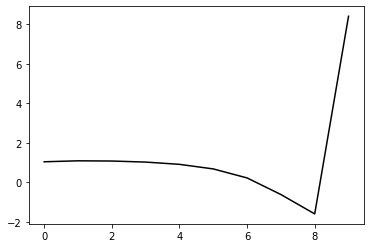

58300 0.2923195643880017
0.28930455887931406 -0.23834221667689678 -0.18503466668985294 -0.12399069222604227
[ 1.00366667  1.00161318  0.99873064  0.94642422  0.82710435  0.59061027
  0.12977655 -0.71498594 -1.70239509  8.3626609 ]


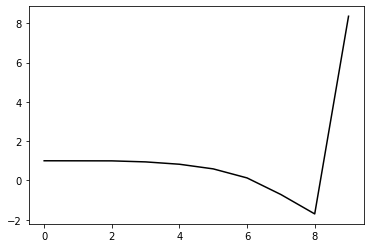

59400 0.21902497117945927
0.28918047926432594 -0.23860741282817316 -0.18575850802456295 -0.12236938816554234
[ 1.02629133  1.00551177  0.9918367   0.93865297  0.81701133  0.5773617
  0.11372019 -0.73475864 -1.72690513  8.41596682]


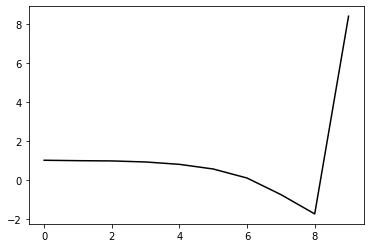

60500 0.25334589836683985
0.29184997597699214 -0.2371442424676892 -0.18539971331769067 -0.1232810023502285
[ 1.01131655  0.97392783  0.97108552  0.92261542  0.80783528  0.57459685
  0.11767308 -0.72469229 -1.71075016  8.36375661]


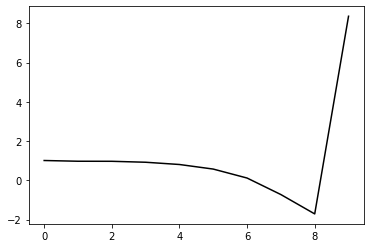

61600 0.22213564893448998
0.2878952282202161 -0.24055075150977545 -0.18727311398447885 -0.1256516285442349
[ 1.05245847  1.01285375  1.00688476  0.96930267  0.86645499  0.64372347
  0.19655081 -0.63717095 -1.61446461  8.42073938]


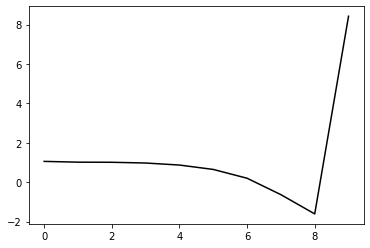

62700 0.21891641174632046
0.2857271469609199 -0.23792099758562765 -0.1849605913709251 -0.1271051506653108
[ 1.06121783  1.00666615  0.99620423  0.9595218   0.8597069   0.64037015
  0.19635529 -0.63528084 -1.61120655  8.38550833]


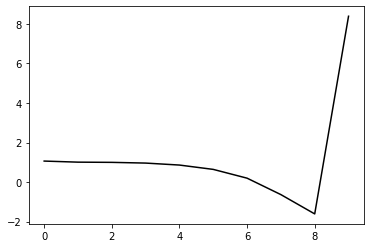

63800 0.1892221388830842
0.289751979908184 -0.23595389345847664 -0.18460310785713682 -0.127129837958941
[ 1.021217    1.09165238  1.09138645  1.05463158  0.95512696  0.73687202
  0.29354833 -0.53905953 -1.51802958  8.41076894]


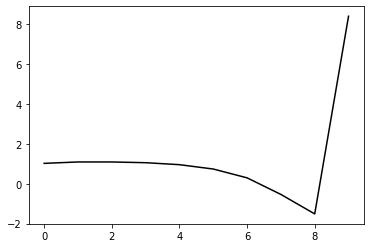

64900 0.20457025476070512
0.2951359649825119 -0.23592937586438453 -0.18626015229949136 -0.12451177094666573
[ 1.00338069  1.06408715  1.07827853  1.04116483  0.93849663  0.71766135
  0.27227599 -0.56303197 -1.54560498  8.38849299]


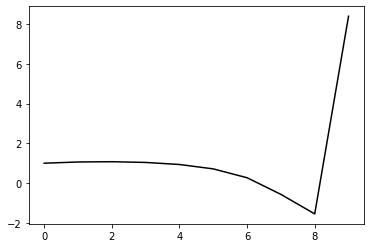

66000 0.17644325521961857
0.289234487054655 -0.23669370821165647 -0.18588996287450157 -0.1274560403585523
[ 1.01776539  1.05590571  1.06391682  1.04032716  0.95285668  0.74654002
  0.31503655 -0.50822236 -1.4806674   8.43727232]


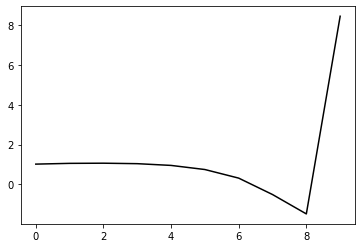

67100 0.1964970790069483
0.2787858751005213 -0.23594174452139538 -0.18301341786572745 -0.13060118549047542
[ 1.07883829  0.90648441  0.89045485  0.85653188  0.76574245  0.55824249
  0.1269122  -0.69566904 -1.66680677  8.39782087]


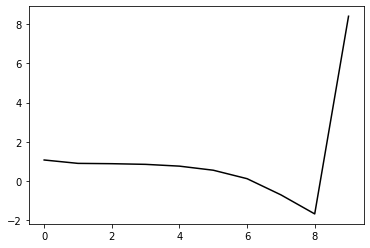

68200 0.15071261612621242
0.2903569211989669 -0.2339072698191869 -0.18406744408429873 -0.13163880806058414
[ 1.05877656  1.16511908  1.16204109  1.12280039  1.02999773  0.8217301
  0.38940316 -0.43521101 -1.41015986  8.41466089]


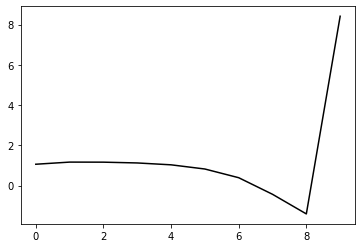

69300 0.296292166101178
0.2884046348361202 -0.23665758897996483 -0.18757817586709546 -0.11969081383034687
[ 1.01130207  0.95221775  0.91542029  0.85344133  0.73667426  0.50858284
  0.05862232 -0.78355657 -1.77778736  8.32937853]


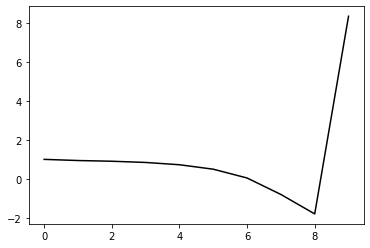

70400 0.20073190060457918
0.29551798880697927 -0.2285032175841208 -0.18190758760541628 -0.12615583173346212
[ 0.99492592  1.12270691  1.09966066  1.0253163   0.89632845  0.65852301
  0.20140405 -0.64650649 -1.64554203  8.39609737]


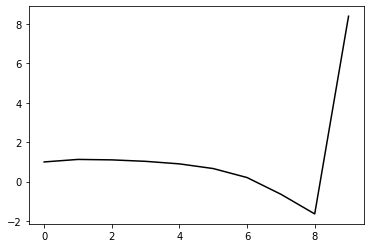

71500 0.23649107949893494
0.29740845750237527 -0.2261391010858698 -0.1807765398474726 -0.1270615578266946
[ 1.04889258  1.17846861  1.19801407  1.14903668  1.0301512   0.79772709
  0.34445775 -0.50210962 -1.50271417  8.40677317]


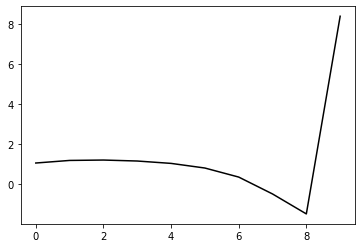

72600 0.20846470621224936
0.29296925477882946 -0.22883063532054737 -0.18235698188602006 -0.12643816945696432
[ 1.05115603  1.05437708  1.05356886  1.01661343  0.9072221   0.68140569
  0.23568103 -0.60335182 -1.59698167  8.41346989]


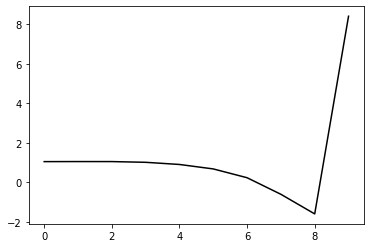

73700 0.2236727240102592
0.2888135175776687 -0.23790465598303015 -0.18871499216979262 -0.12519644105750247
[ 1.03460439  1.06250995  1.07803157  1.05532849  0.95910006  0.74297922
  0.30591257 -0.52460658 -1.50950103  8.41124178]


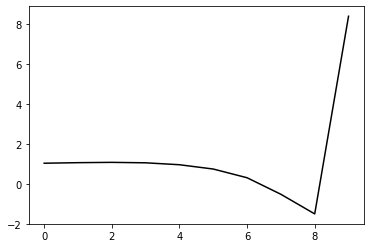

74800 0.2012648782504975
0.29300742956703973 -0.2334691726530602 -0.18658363811116213 -0.12689114323761397
[ 1.0236919   1.12380811  1.1605554   1.14688281  1.06039283  0.8497713
  0.41456549 -0.41737528 -1.40828323  8.43836324]


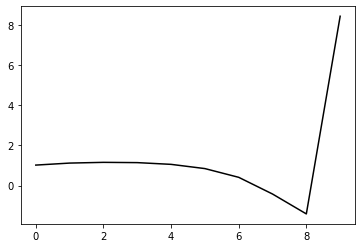

75900 0.20411804123803864
0.29004177806115516 -0.2355731566709933 -0.18822943655850458 -0.12394217191293483
[ 1.01896621  1.08922185  1.08838614  1.06997583  0.98432213  0.77490303
  0.34087035 -0.48944354 -1.47871397  8.40718192]


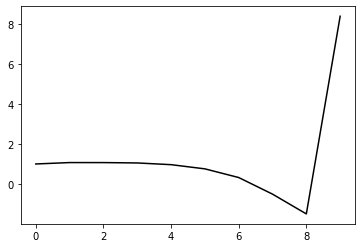

77000 0.18289834742240182
0.28842016205410054 -0.2337372016487606 -0.18673397493452815 -0.1250193105554896
[ 1.08070517  1.02048965  1.01130619  0.98402025  0.89959134  0.6932529
  0.26141354 -0.56732235 -1.55606555  8.42616555]


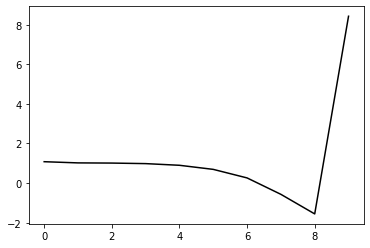

78100 0.19229194549279335
0.2847344201922481 -0.2319896218878708 -0.1847864249146475 -0.12718423567059162
[ 1.1029521   1.03923937  1.0246152   0.99384347  0.91108827  0.70965653
  0.28224768 -0.54275987 -1.52867327  8.3805674 ]


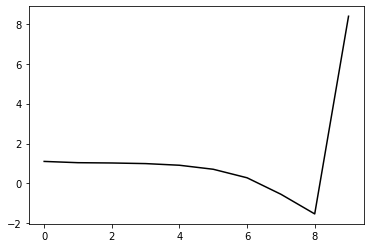

79200 0.1286421222816248
0.29055524467557486 -0.22789829844696513 -0.18324708578252683 -0.12645889563910834
[ 1.04698023  1.1216023   1.11431433  1.07042421  0.97343729  0.76081823
  0.32170351 -0.51689278 -1.51993441  8.43908697]


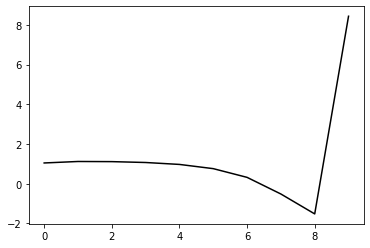

80300 0.28429299392526647
0.2911825565174848 -0.22978339242034004 -0.1855323717071289 -0.1216556158153547
[ 1.03333935  1.07115873  1.08037638  1.03728191  0.93218917  0.71255261
  0.26684574 -0.57956756 -1.59320227  8.3892676 ]


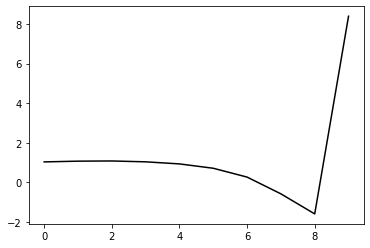

81400 0.16699463389402805
0.290617143648969 -0.22752841743925264 -0.18381425265618426 -0.1252300491104527
[ 1.02986222  1.13228958  1.13820533  1.10842803  1.01403146  0.80398568
  0.36794596 -0.46997591 -1.47684142  8.41756031]


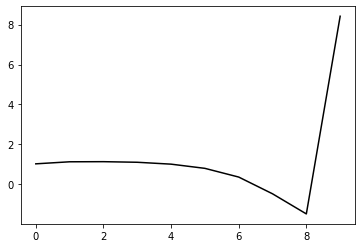

82500 0.2441905882950618
0.28687571655402827 -0.2314152139367092 -0.18626209362832752 -0.12475054258618647
[ 1.07969797  1.06985942  1.09122582  1.07534655  0.9922899   0.79208346
  0.36581628 -0.46295297 -1.46139857  8.44078844]


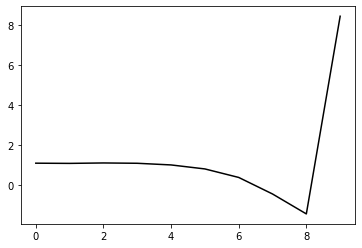

83600 0.20981817502810582
0.2871845414521564 -0.22645139071937823 -0.18311076812598573 -0.1254741692018951
[ 1.06771456  1.0661229   1.07376757  1.05043778  0.96202388  0.75541337
  0.32238904 -0.51446402 -1.52380796  8.40419098]


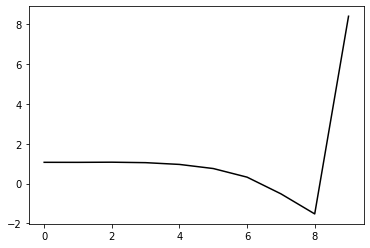

84700 0.21636973340531723
0.2827369375594462 -0.23084458557916396 -0.18574894173278073 -0.12533628722699797
[ 1.08981292  1.03015233  1.05032115  1.03789343  0.95962757  0.76263265
  0.33908261 -0.48863327 -1.48930882  8.40320272]


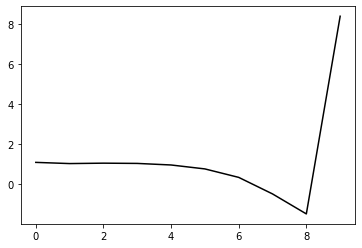

85800 0.18111288601841385
0.2830132326114295 -0.23296309490462966 -0.18768169047017716 -0.12554235717934184
[ 1.05052615  1.07480696  1.0844285   1.07339643  1.00183188  0.81192316
  0.3953189  -0.42637554 -1.4232368   8.43327343]


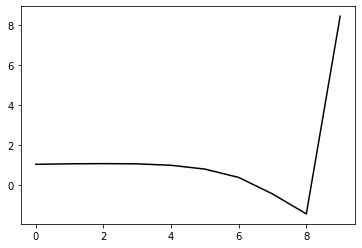

86900 0.22102441103239806
0.2790583512583073 -0.23603878985904914 -0.18974324086315686 -0.12157117063626276
[ 1.07035317  0.95938522  0.95242718  0.93478894  0.86276815  0.67448807
  0.25992325 -0.56005052 -1.55640838  8.39458464]


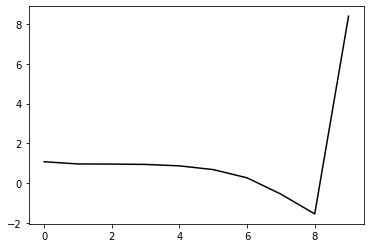

88000 0.17625148836978227
0.28053679026968625 -0.2360112539993192 -0.1900628200004485 -0.12659380541892112
[ 1.09148332  1.1046389   1.10523324  1.09509588  1.03772623  0.86521478
  0.46474432 -0.34343146 -1.3307421   8.40611896]


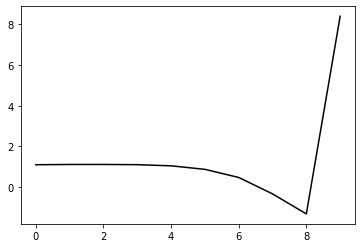

89100 0.192245019565946
0.27678509581691946 -0.23096831511666926 -0.18566704912762963 -0.12474848164513856
[ 1.09837916  1.00835889  1.00634166  0.97862335  0.90314623  0.71733353
  0.30537581 -0.51412694 -1.5142499   8.41015939]


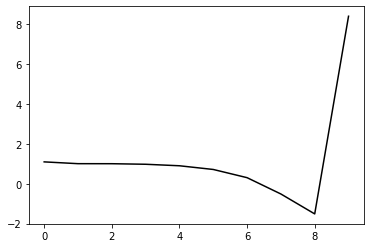

90200 0.1526812760465674
0.2839772244464949 -0.22510783255475753 -0.18323034690261775 -0.1250761364751145
[ 1.08455715  1.09582516  1.10713422  1.08162868  1.0042968   0.81782815
  0.40546312 -0.41607545 -1.42143653  8.44000095]


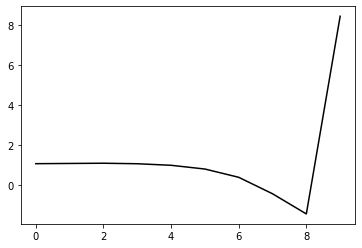

91300 0.28928762906835953
0.28648511614614797 -0.2254455982879044 -0.1847784554979371 -0.12093867810398673
[ 1.01817173  1.07861029  1.07384634  1.03480836  0.9427475   0.74374998
  0.32153113 -0.50942492 -1.52568552  8.36426862]


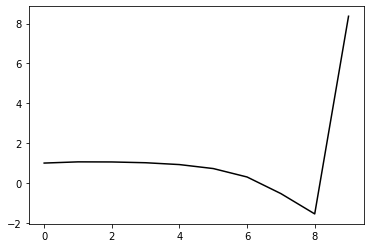

92400 0.19960412044266387
0.28153366014936615 -0.22797950525063176 -0.18602909558275982 -0.12059755392284943
[ 1.04113983  1.05824188  1.05241474  1.0222916   0.93649608  0.7433199
  0.32773533 -0.49723128 -1.50928879  8.41677227]


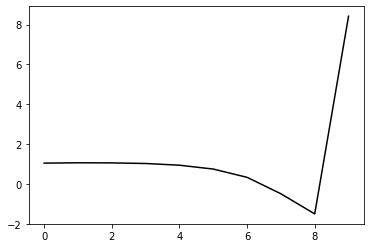

93500 0.23440258049268697
0.2741140399044768 -0.23392947524315447 -0.1889817169869183 -0.12201122447618556
[ 1.06673347  1.04394311  1.01121802  0.97693135  0.89302177  0.70319255
  0.29283049 -0.52596318 -1.531611    8.36411142]


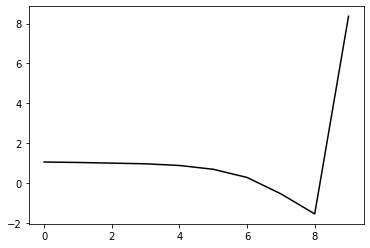

94600 0.21296942217206405
0.2813375794199773 -0.22562521208415143 -0.18417805676757076 -0.12637169834932432
[ 1.06786075  1.12949043  1.1234821   1.08248407  0.99459379  0.80215326
  0.39006005 -0.43050806 -1.4392186   8.42956415]


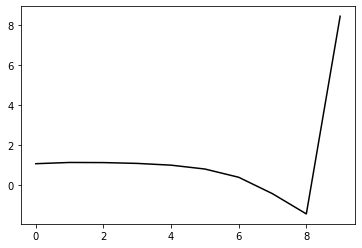

95700 0.20364230209816608
0.2809913621605513 -0.22521094729773963 -0.18439118451730924 -0.12505262894588032
[ 1.07632453  1.08624338  1.11383188  1.08600058  0.99931906  0.80820347
  0.39827937 -0.42064189 -1.43004187  8.40868212]


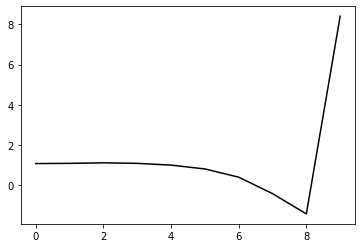

96800 0.19124488678622842
0.28279066411817677 -0.2246648481928796 -0.18495002918864956 -0.12234804660779426
[ 1.0612686   1.08900676  1.10219476  1.07566618  0.98492265  0.78744081
  0.37209264 -0.45224161 -1.4690694   8.41469617]


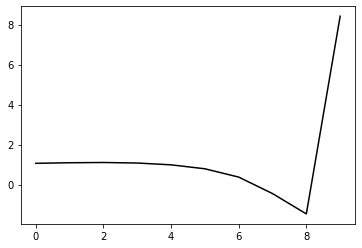

97900 0.20923085412994144
0.28184375784829035 -0.22795262293663682 -0.18755096438992241 -0.12175430533109112
[ 1.02466186  1.08728026  1.08645693  1.06535326  0.98294573  0.79144626
  0.38287214 -0.43405027 -1.4441601   8.38463763]


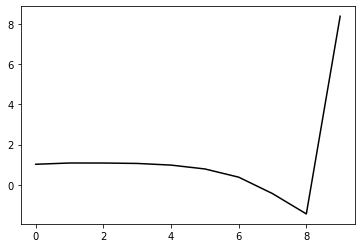

99000 0.17831851916835864
0.28074068969479216 -0.2277430037624438 -0.18721500264637608 -0.12313781863651241
[ 1.07806748  1.033562    1.02563033  0.99924704  0.92144546  0.73550145
  0.3333848  -0.47607045 -1.4790466   8.41040272]


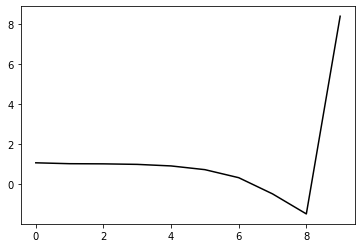

100100 0.17030417736663547
0.28289455398795826 -0.22067184092660438 -0.18274821039785122 -0.12435942658272643
[ 1.0563483   1.06741909  1.07988264  1.04750846  0.96256038  0.77012765
  0.3608066  -0.45701055 -1.47237231  8.44327596]


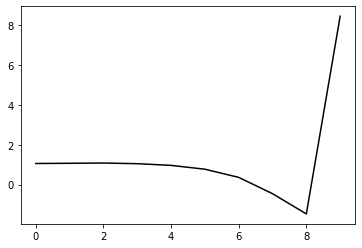

101200 0.14557516699147868
0.2726704314377803 -0.23342154308608495 -0.1907226743809387 -0.12094961793810943
[ 1.07889277  0.96561707  0.95945363  0.94979834  0.88549983  0.71373982
  0.32541289 -0.4705291  -1.4627049   8.43254028]


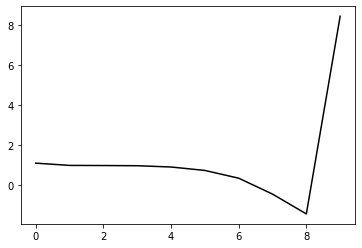

102300 0.2496700106769461
0.2745475559711678 -0.22152624233586754 -0.18262485370143391 -0.12210901297505564
[ 1.08522006  0.99725065  0.95417982  0.92248594  0.84863394  0.66894283
  0.27271892 -0.53174459 -1.53501368  8.40544958]


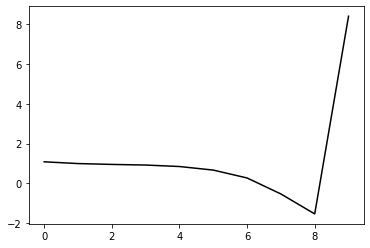

103400 0.20669771641503615
0.28119570274763755 -0.22468771098094276 -0.18711270679165332 -0.117490415691914
[ 1.04008482  1.08644568  1.07078107  1.01816718  0.92584742  0.73259864
  0.32516943 -0.48887505 -1.5019223   8.43916052]


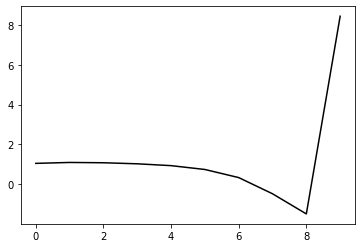

104500 0.277147544728018
0.2828941732224258 -0.21748735239809938 -0.18187435507829108 -0.12277794759197225
[ 1.08427938  1.14625983  1.155812    1.11565182  1.02691833  0.8384411
  0.43641755 -0.37234477 -1.38151448  8.42098185]


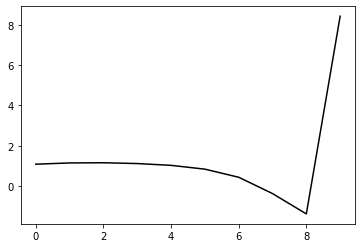

105600 0.2154156235933383
0.28008672613431995 -0.22385252447397194 -0.18616390305546904 -0.12179051591489294
[ 1.02925731  1.03705738  1.05902445  1.02655854  0.93740729  0.74920329
  0.35003639 -0.45365506 -1.45630008  8.43537819]


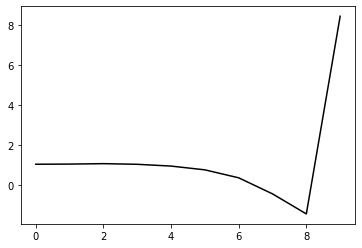

106700 0.22128734206348039
0.2781721674440938 -0.2243947033482118 -0.18671775266859078 -0.11918948233493319
[ 1.06647854  1.06841173  1.06117474  1.03039405  0.94249084  0.75312943
  0.35318692 -0.45139798 -1.45685212  8.4092705 ]


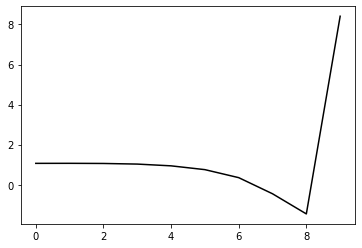

107800 0.21676835535249653
0.27765738097243775 -0.2298997523122529 -0.190862433768366 -0.11641955319949698
[ 1.03156169  0.99522809  0.98012742  0.94371346  0.85405243  0.66407862
  0.26655478 -0.53241475 -1.53017053  8.4027362 ]


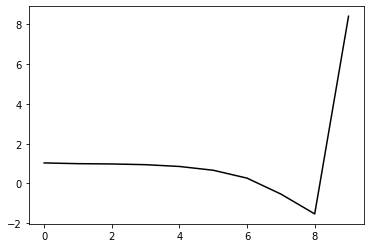

108900 0.23232373691160915
0.2783292422117402 -0.2247157162931907 -0.18660334970978779 -0.12367603742904057
[ 1.07505425  1.14164321  1.14904194  1.1174727   1.03452535  0.85005612
  0.45781843 -0.33547178 -1.32844054  8.39410043]


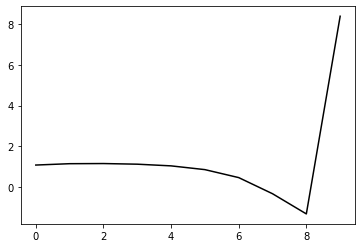

110000 0.2528166023131556
0.27857211109257746 -0.2195139154662023 -0.18327338814800953 -0.12195161452702051
[ 1.11847048  0.97300981  0.99762288  0.95252547  0.84946866  0.64909102
  0.24519122 -0.55663817 -1.55788116  8.43404867]


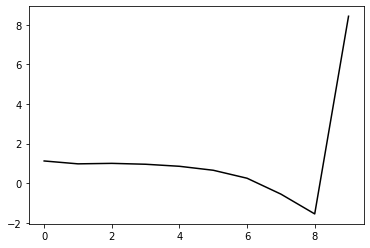

111100 0.20022304070015023
0.280030528464113 -0.22096418329573903 -0.1845545699356359 -0.12064431854269325
[ 1.05611932  1.09733626  1.07289677  1.01431772  0.89677823  0.68180885
  0.26611233 -0.54459063 -1.55336555  8.39804091]


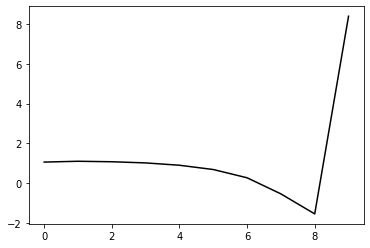

112200 0.1375685777883108
0.27936819086681786 -0.21901157109567007 -0.1826888360526563 -0.12506049927841695
[ 1.0630519   1.13406411  1.13605227  1.08656055  0.97432604  0.76188583
  0.34912264 -0.457211   -1.46135744  8.43595878]


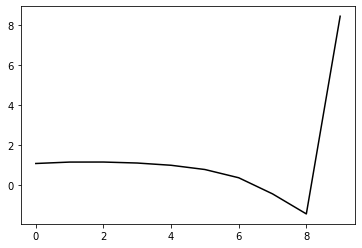

113300 0.2734408044221141
0.27638005647118713 -0.2220598359657791 -0.18502313619515695 -0.12156627805547154
[ 1.05711966  1.00631987  0.98861967  0.93674746  0.81727899  0.59572666
  0.17560993 -0.63525327 -1.64327199  8.37830179]


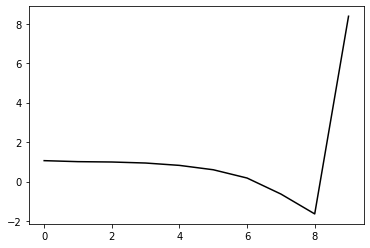

114400 0.18789416282164648
0.2812277550823344 -0.22186802527821076 -0.1860896541965248 -0.12415049707671484
[ 1.01987628  1.09976376  1.11387023  1.07905581  0.97286894  0.75909568
  0.34478673 -0.45988369 -1.46216305  8.43701301]


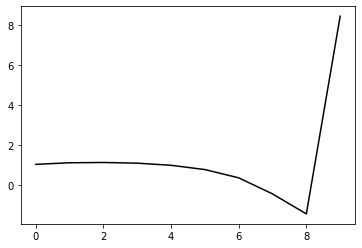

115500 0.3414903202848493
0.2815083452947171 -0.2185227911715203 -0.18382599628348203 -0.12598997277993088
[ 1.11265422  1.11723931  1.15660377  1.14017822  1.04656893  0.83768876
  0.42417779 -0.38038044 -1.38450704  8.43295558]


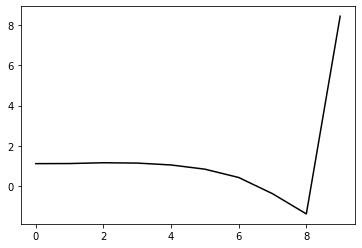

116600 0.2247906077052366
0.2775473437156027 -0.23119456070900649 -0.19294633455912155 -0.12333508706646415
[ 1.06766883  1.12738066  1.11748522  1.10438712  1.02443718  0.82694184
  0.4234724  -0.36956045 -1.36038094  8.44068249]


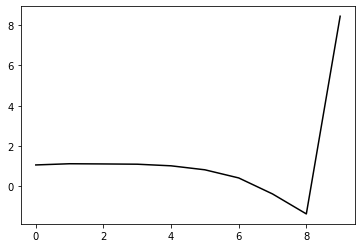

117700 0.2786939458049847
0.281814477773514 -0.21834056864673612 -0.18437264474029857 -0.12702285166865207
[ 1.10605184  1.19237581  1.23386884  1.21341427  1.12643837  0.92100463
  0.50600669 -0.30015545 -1.30761702  8.44048846]


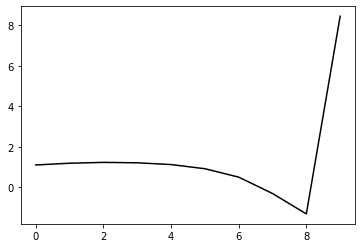

118800 0.1836806461834962
0.279052782674634 -0.22072448692789914 -0.1862606128923222 -0.12401629052678641
[ 1.04915034  1.12229496  1.13014244  1.10520494  1.01416697  0.80671452
  0.39015175 -0.41556532 -1.42121384  8.43842624]


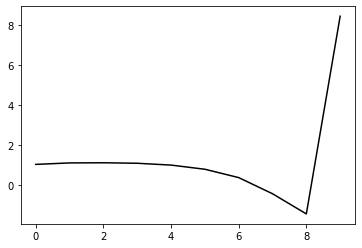

119900 0.21081692837865398
0.2829930745384662 -0.2240257319505295 -0.1901283990718835 -0.119850631131281
[ 1.0355571   1.0407529   1.05527977  1.02523585  0.93075738  0.72188967
  0.30453585 -0.49960953 -1.50174321  8.38353667]


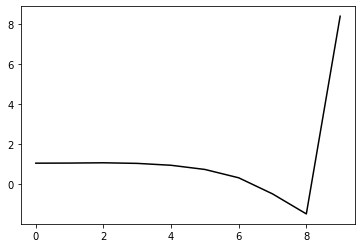

121000 0.19500774303532278
0.28383596312931064 -0.216892367402905 -0.18519981546575753 -0.12337056510687767
[ 1.07392813  1.10943063  1.14424623  1.12305411  1.03558496  0.83071182
  0.41326278 -0.3933225  -1.4008177   8.44618234]


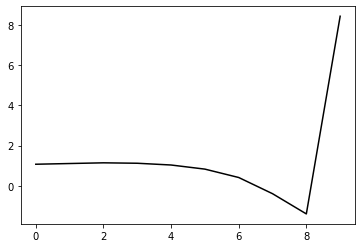

122100 0.18598083395954743
0.27528133363164453 -0.22208287819592734 -0.18696513030007528 -0.12476876917390206
[ 1.10400475  1.04119686  1.06290524  1.05626709  0.97949296  0.78464329
  0.37654002 -0.41982195 -1.41543656  8.41042017]


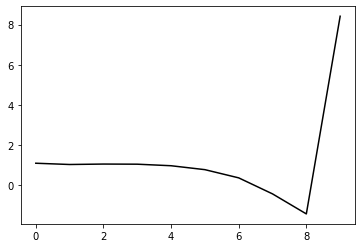

123200 0.12584873276787006
0.2801835274673895 -0.2162399338052535 -0.18416373931292865 -0.12450865464326717
[ 1.04497706  1.14279665  1.15609586  1.13493424  1.04963331  0.84488215
  0.42419252 -0.38659904 -1.39984111  8.45278836]


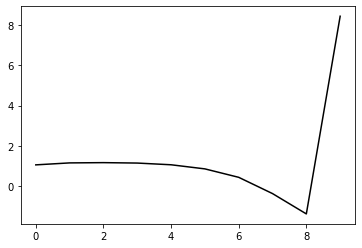

124300 0.25501502871102916
0.27325962970996404 -0.21839327269390565 -0.18416294600787364 -0.12468014285468998
[ 1.10902627  1.0755296   1.06423493  1.04321804  0.96058059  0.75998553
  0.34333736 -0.4629051  -1.47085661  8.42780414]


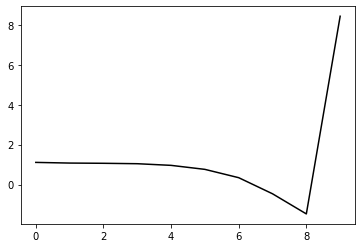

125400 0.20948628456340326
0.2675426394543704 -0.2264281001994622 -0.18928666393046042 -0.1217417857881663
[ 1.08392246  1.02020796  0.99858103  0.96992399  0.88668948  0.68813223
  0.27414138 -0.52801811 -1.52949714  8.39019225]


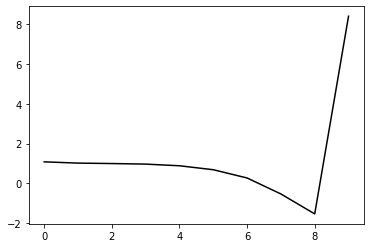

126500 0.2573471638385365
0.275716428083054 -0.22063578750807392 -0.18673902202150552 -0.12469355437057963
[ 1.09502194  1.16050155  1.15603328  1.12101719  1.03599496  0.83748673
  0.42241255 -0.38206885 -1.38732721  8.40363598]


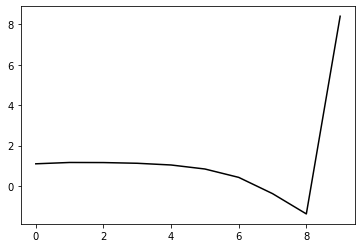

127600 0.2105284517206712
0.28071672270501274 -0.2181285869223252 -0.18590762604584538 -0.12325990889573454
[ 1.05703251  1.20333195  1.18813799  1.14039097  1.04411608  0.83795115
  0.41593046 -0.39558063 -1.40846394  8.45390526]


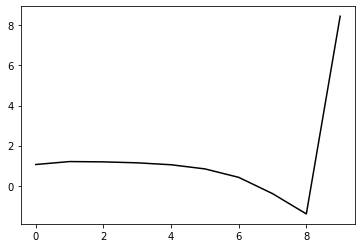

128700 0.20584314804447662
0.27583898862158013 -0.2185075718800299 -0.18530155314897515 -0.12474743729486194
[ 1.08802194  1.1121227   1.11336754  1.07515706  0.9834113   0.78398651
  0.36948518 -0.43437336 -1.43866196  8.40082623]


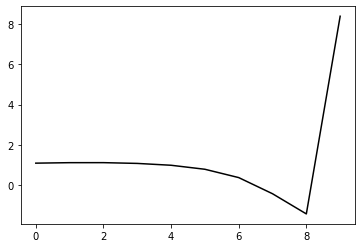

129800 0.20542485777269828
0.27677995850192544 -0.22314770456906696 -0.18946893474273774 -0.12294373247508485
[ 1.02932516  1.11875296  1.13961097  1.11478369  1.0290862   0.83600972
  0.42871157 -0.36829543 -1.36601391  8.42901786]


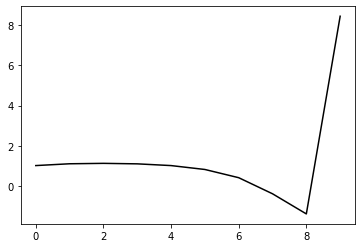

130900 0.21907911877516964
0.27033573174058706 -0.23053042697610707 -0.19364637331938322 -0.12410790179518653
[ 1.05798491  1.08509869  1.07390775  1.04604655  0.96064892  0.76810921
  0.36314098 -0.43000924 -1.42175821  8.44777027]


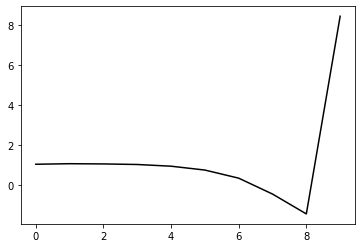

132000 0.1718457573184042
0.2723888114655755 -0.22753465376153958 -0.19223292174499781 -0.1264362189653896
[ 1.05880965  1.12644703  1.15523185  1.13922945  1.06313311  0.87818604
  0.47923913 -0.31027515 -1.30139454  8.43423509]


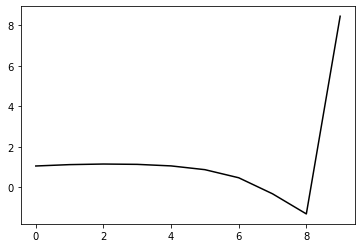

133100 0.1798828678957534
0.2762200265018341 -0.21863406461902612 -0.18651764840583 -0.1265817116947042
[ 1.09150299  1.13897049  1.17059221  1.1461804   1.05666412  0.85731926
  0.44432919 -0.35998118 -1.36818065  8.45961924]


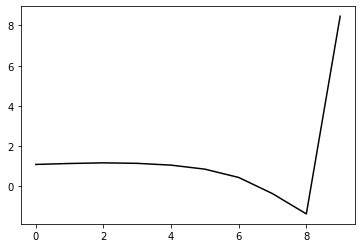

134200 0.16012204190496546
0.2737224224468761 -0.21941417570519375 -0.18724072969403863 -0.12205731904930302
[ 1.01844808  1.00255866  1.01040868  0.97508187  0.86936023  0.65248177
  0.22312772 -0.59690389 -1.62144568  8.42884938]


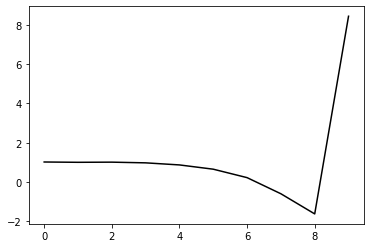

135300 0.2528782161849
0.27482933546522115 -0.21676950553940352 -0.18520303925390755 -0.12519351759590475
[ 1.07400287  1.08556655  1.09215731  1.0616402   0.96167647  0.74794477
  0.32126398 -0.49604305 -1.51768794  8.40095877]


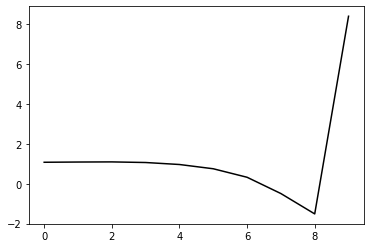

136400 0.19629884498423775
0.2775224487978991 -0.2141079693936862 -0.18453899760476383 -0.12211997576724158
[ 1.02361998  1.09004552  1.08489499  1.04533062  0.9377488   0.71447729
  0.27725358 -0.55140219 -1.58627023  8.40915611]


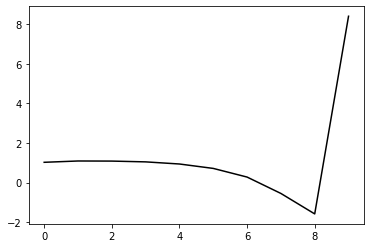

137500 0.23970527290034277
0.27689532153118723 -0.21469172653702293 -0.18484589005369403 -0.12321223510635622
[ 1.04621014  1.15644683  1.16743651  1.13709275  1.0382114   0.82203027
  0.39080084 -0.43173668 -1.45965842  8.36869358]


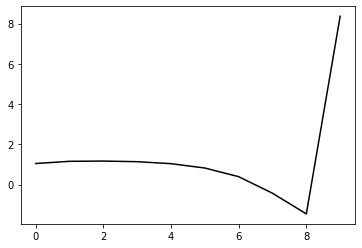

138600 0.21278728975457836
0.2746118158684355 -0.21782187346741633 -0.18692661704072466 -0.12467821242229973
[ 1.07427791  1.08790761  1.12327316  1.11056258  1.02558113  0.82153099
  0.40101623 -0.4113493  -1.42920797  8.40020685]


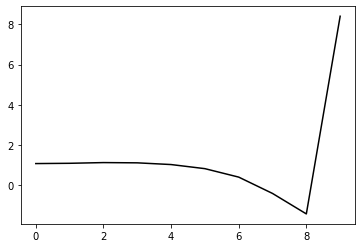

139700 0.3348534249948173
0.28079552139775316 -0.21841549328510906 -0.18959006711707024 -0.12090607080945728
[ 0.96112434  1.08934631  1.13422421  1.12728743  1.04394865  0.83875599
  0.41515521 -0.40151803 -1.42534815  8.47702152]


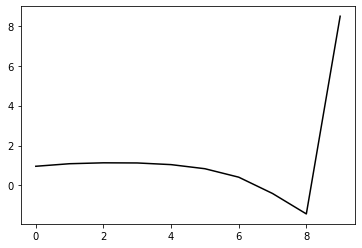

140800 0.18833448467520858
0.27782257284543344 -0.21331480769047287 -0.1854012603850871 -0.12342884845864359
[ 1.02545768  1.15157991  1.17869863  1.17458669  1.09811087  0.89654458
  0.47359952 -0.34462725 -1.37247162  8.45122482]


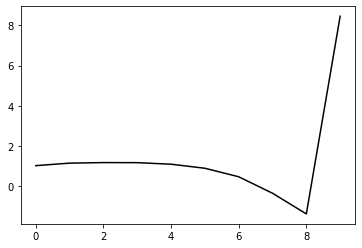

141900 0.22768614756826533
0.2685826780857906 -0.2210233246808718 -0.18907326327370258 -0.12244395116301578
[ 1.05928771  0.92899792  0.95900155  0.96329959  0.89865079  0.70917722
  0.29737697 -0.5093293  -1.52387059  8.41051104]


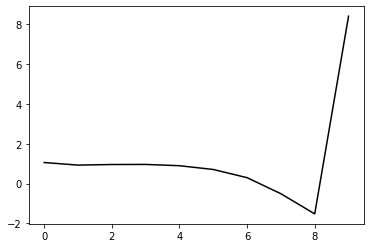

143000 0.17089019290705892
0.2742843830043894 -0.21504986050815364 -0.18647283327047928 -0.12312424305985152
[ 1.02879611  1.05713563  1.07636033  1.07576054  1.01368555  0.82653891
  0.41432635 -0.39505343 -1.41470788  8.47127874]


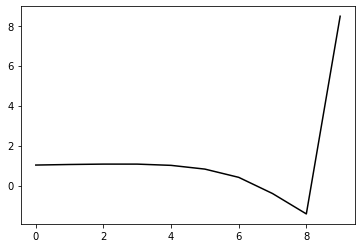

144100 0.17772299444109949
0.26859586511989053 -0.21549267609898587 -0.18536054006278846 -0.12536592676425523
[ 1.0897956   1.00853956  1.00544114  1.00151666  0.94666643  0.77102632
  0.36997603 -0.42826746 -1.43527011  8.40797988]


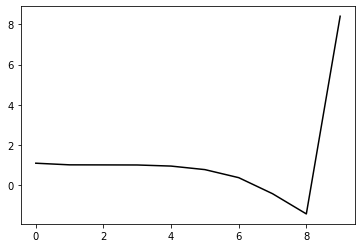

145200 0.14041970694072065
0.2704674890140718 -0.21456069171135728 -0.185595174020435 -0.12453180116895138
[ 1.01864402  1.04831329  1.02963579  1.00624822  0.94087144  0.76068934
  0.35495034 -0.44945164 -1.46413481  8.44672484]


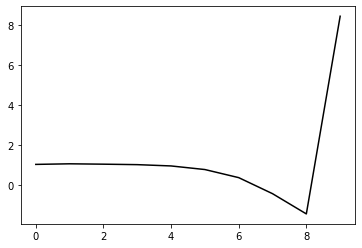

146300 0.26198242269267014
0.27143522593518915 -0.21151284961457384 -0.18392550202619928 -0.1253492574381349
[ 1.07718343  1.10196306  1.09725111  1.07559564  1.01414482  0.8433938
  0.44657807 -0.3523639  -1.36529006  8.4016942 ]


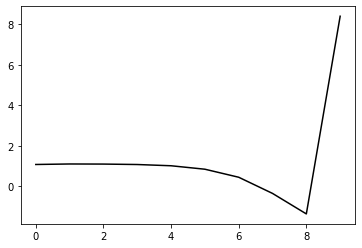

147400 0.20730735807613396
0.2722013942713129 -0.216862181811199 -0.1889229658203425 -0.1190028734140254
[ 1.02372412  1.02977589  1.01658836  0.98469438  0.91153259  0.73459056
  0.33467937 -0.46704146 -1.48219407  8.45209881]


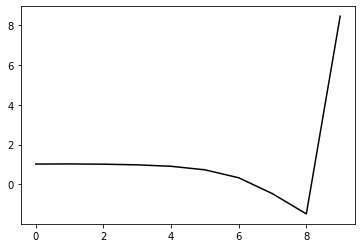

148500 0.2570497283473366
0.27166145603794206 -0.21275447062243572 -0.18576230904482763 -0.12210114742919412
[ 1.03128133  1.13019458  1.11477552  1.0811651   1.00675981  0.83075349
  0.43315473 -0.36741673 -1.38281259  8.40358172]


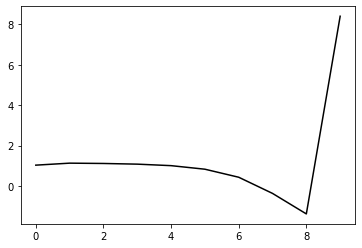

149600 0.22748907575206076
0.26762314092017564 -0.2177077027767391 -0.188759192389516 -0.11773021966952323
[ 1.03873946  1.00554036  0.96023342  0.9079833   0.81659538  0.62821993
  0.2223718  -0.58457408 -1.60489639  8.40313114]


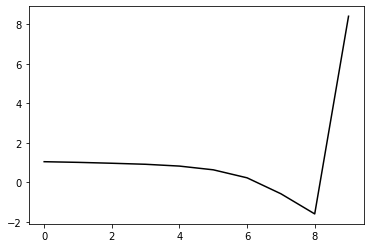

150700 0.2199281227590782
0.27452344625307745 -0.21136117414695824 -0.1854470551651673 -0.12216406448684963
[ 1.04032445  1.12411023  1.11490336  1.06070515  0.96483461  0.7732224
  0.36587054 -0.44286062 -1.46556508  8.38630062]


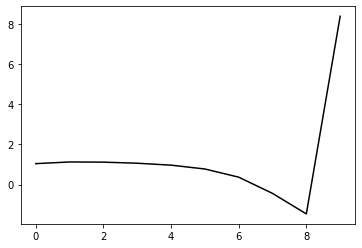

151800 0.1938630458421445
0.2717694238429249 -0.21636416271963754 -0.18868992052680245 -0.12098885309209412
[ 1.05720264  1.00000503  1.03227586  1.00148468  0.9130513   0.72809677
  0.32974952 -0.4694006  -1.48160588  8.43674989]


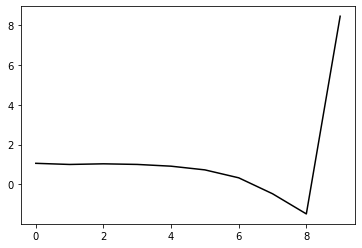

152900 0.21097525106995857
0.2688002991850889 -0.22174724707820564 -0.19218473985216367 -0.12012273101295529
[ 1.02960014  1.02288393  1.0299693   1.00696199  0.92394556  0.74182078
  0.34881787 -0.44364955 -1.44805932  8.43033565]


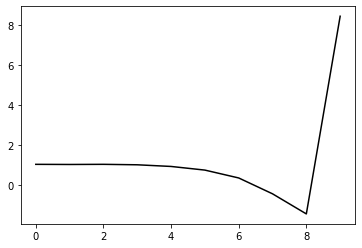

154000 0.17624242144013622
0.26802842863706483 -0.21748766316458196 -0.18883594767036638 -0.12424067083701107
[ 1.05779449  1.08880012  1.09562712  1.07294044  0.99664827  0.81864416
  0.43012356 -0.35837824 -1.36066323  8.41992702]


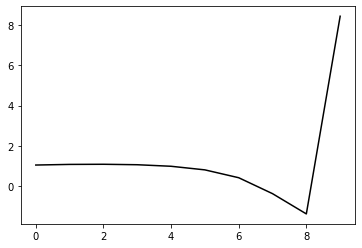

155100 0.1824820199341012
0.265324370127503 -0.21710545356986735 -0.1879158270960198 -0.12561399495622022
[ 1.09426791  1.07901709  1.08695892  1.06818936  0.99658574  0.82393238
  0.44266775 -0.33729141 -1.33106418  8.44766502]


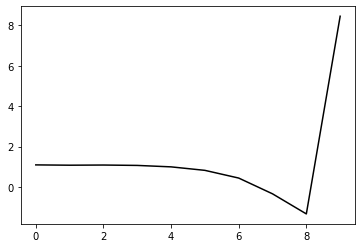

156200 0.13159889131445243
0.2665409327282609 -0.21296908172609125 -0.18544199861599386 -0.12501173462388793
[ 1.05443207  1.09794085  1.08913395  1.054241    0.96852161  0.78215098
  0.38851687 -0.40291614 -1.40943987  8.43687082]


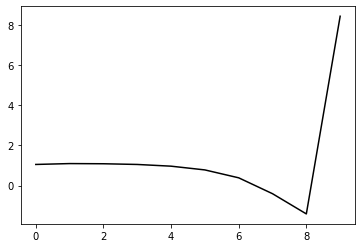

157300 0.2656544730342966
0.2723036157014295 -0.20962640770658642 -0.1848910806093319 -0.12303388430365189
[ 1.03859983  1.13210075  1.15296405  1.12080755  1.03206021  0.84129531
  0.44262334 -0.35480566 -1.37060981  8.41469849]


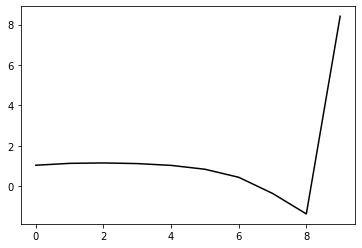

158400 0.15813574983985554
0.2665972993658165 -0.2157724997795474 -0.18826119459146892 -0.12234120354359168
[ 1.05733673  1.10973059  1.10978471  1.09512059  1.02098918  0.84341095
  0.45846442 -0.32418612 -1.32405199  8.43071045]


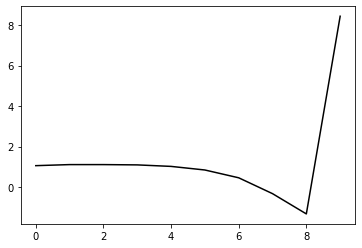

159500 0.29900768056740773
0.2644539574000236 -0.22284493609012235 -0.19359409873376687 -0.11915118144391366
[ 1.02613386  0.99358689  0.97063038  0.95301321  0.88609772  0.71557108
  0.33798529 -0.43640907 -1.42714123  8.42099229]


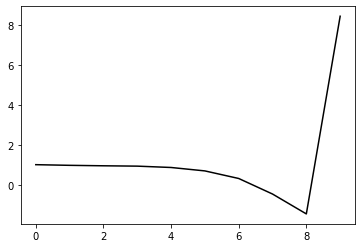

160600 0.2104830079692666
0.2674053339995652 -0.2129667030174349 -0.18636516621467136 -0.12433683249767365
[ 1.06893222  1.07478968  1.07968465  1.04412259  0.96475292  0.78446253
  0.3976841  -0.38509897 -1.38498818  8.45086392]


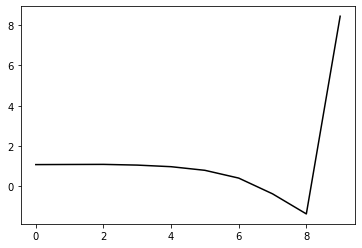

161700 0.21488929605370144
0.26737791382194187 -0.21239089116454934 -0.18626509803011645 -0.12411132409613852
[ 1.09862717  1.09921594  1.12679086  1.10663554  1.03127245  0.85481268
  0.47141033 -0.30864897 -1.30784516  8.45114832]


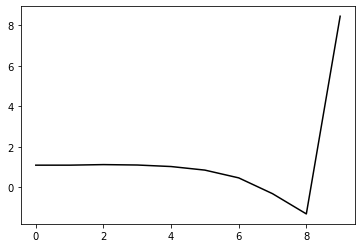

162800 0.18518315276766173
0.266630166338023 -0.21402677422083252 -0.1881105398977437 -0.11985719826322963
[ 1.04941817  1.07380149  1.06638006  1.03999333  0.95874089  0.7760827
  0.38805176 -0.39521454 -1.39759581  8.42114124]


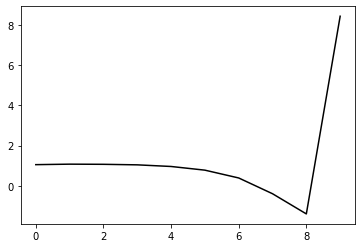

163900 0.23179361704319434
0.2645968828497563 -0.2157409699993079 -0.18901378767193044 -0.12315646271602818
[ 1.07818107  1.07839066  1.0925259   1.08718745  1.03111122  0.87343821
  0.50970122 -0.25002899 -1.23077908  8.42683437]


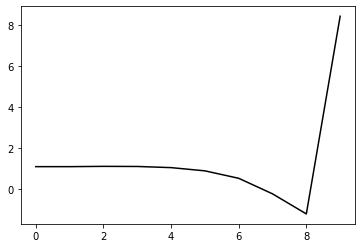

165000 0.24713553221491946
0.2524715107032062 -0.2196314184041555 -0.18928823529481498 -0.12437816929026513
[ 1.11828287  0.9652409   0.94711597  0.93608233  0.87925345  0.72442005
  0.3662637  -0.38549658 -1.35738991  8.4579132 ]


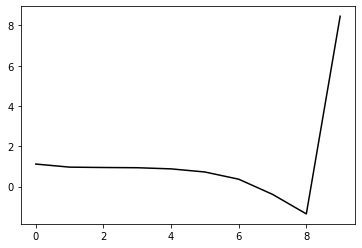

166100 0.19675601336041193
0.2598498289526716 -0.21790144736559322 -0.19005929466574575 -0.12300836214668685
[ 1.13481091  1.06840026  1.05666441  1.04077186  0.98902877  0.84092907
  0.48867792 -0.25852708 -1.22892889  8.41899815]


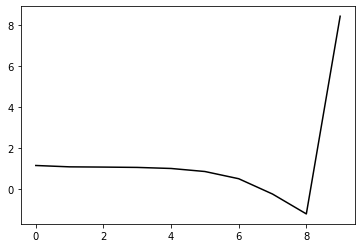

167200 0.14536017717161975
0.2642687471045167 -0.21310038125413783 -0.18779703551799606 -0.12177380564521796
[ 1.08902817  1.09427357  1.10726691  1.07902701  1.0080436   0.84437455
  0.47829569 -0.28191053 -1.26676049  8.44659613]


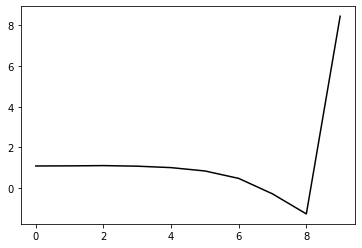

168300 0.2643872305193308
0.26185112224772744 -0.21059014801773465 -0.1855985826265526 -0.1228518151196594
[ 1.10953436  1.0956509   1.07536291  1.04386012  0.97117209  0.80715819
  0.44290263 -0.31439768 -1.29675469  8.43887763]


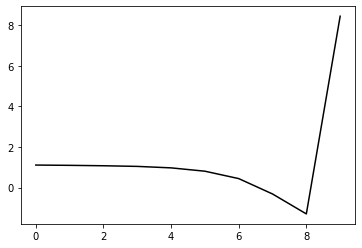

169400 0.19040002326898917
0.26181547796682514 -0.2127888615939141 -0.18776225352240555 -0.12015051343581565
[ 1.04391951  1.06779404  1.03145505  0.98721177  0.9075284   0.73957314
  0.37404807 -0.38271161 -1.3641741   8.44078589]


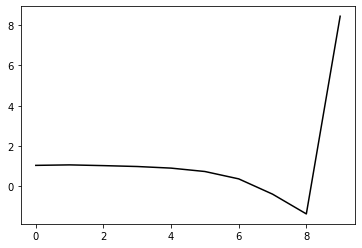

170500 0.2571676786952256
0.2691282344801619 -0.2128338350010846 -0.18991054437514077 -0.1167587827793095
[ 1.04242029  1.08055861  1.08700743  1.03920564  0.94935942  0.77436221
  0.40514685 -0.3532253  -1.33629051  8.42780571]


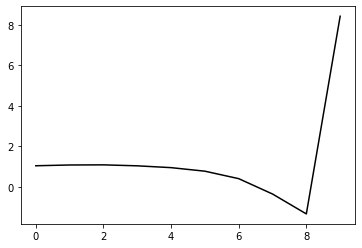

171600 0.21493491864252015
0.26191131808316703 -0.21282377817641177 -0.18844883953688019 -0.11787350805968072
[ 1.0683958   1.04128225  1.03633822  0.99706865  0.90586543  0.72754405
  0.3566677  -0.40223816 -1.38646305  8.4357788 ]


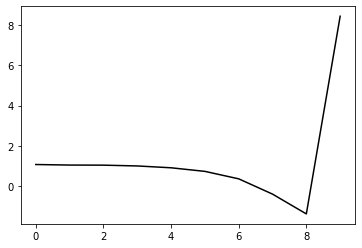

172700 0.1980569843499405
0.26383298894596635 -0.20692992955654602 -0.18450071540029353 -0.12039356544445952
[ 1.0826507   1.11690141  1.11096878  1.07361867  0.98284062  0.80188166
  0.42905949 -0.33091466 -1.31710611  8.42409052]


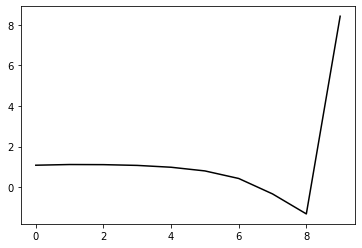

173800 0.18806912894667444
0.26088585907026385 -0.21628664883602974 -0.1909088677961216 -0.12054915894827013
[ 1.07984398  1.10170701  1.10216074  1.0725062   0.98921868  0.8145315
  0.44929239 -0.30084639 -1.27520845  8.41224511]


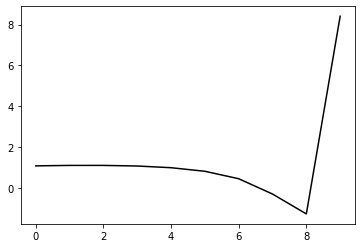

174900 0.24819121794002919
0.25427887246416025 -0.2166566154713229 -0.18981731058964765 -0.12084094539654386
[ 1.11000627  0.97381229  0.96666888  0.93675587  0.85405358  0.67892285
  0.31404396 -0.4340684  -1.40595481  8.38574532]


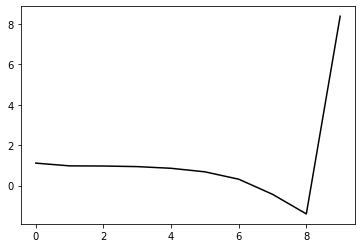

176000 0.17583053008242902
0.25792181586479124 -0.2198538090950101 -0.1935435526425011 -0.12063593997108348
[ 1.0972035   1.03262175  1.02167105  0.99470438  0.92029125  0.75280139
  0.39558508 -0.3438163  -1.30701068  8.46390631]


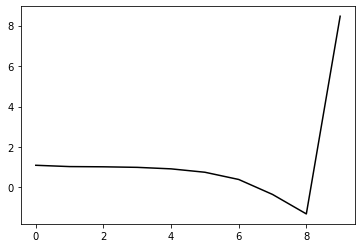

177100 0.25454791237020963
0.25641461177845093 -0.2082529356954081 -0.1843193045696966 -0.12528514652482356
[ 1.11037767  1.05606105  1.04162058  0.99262928  0.90007348  0.71661004
  0.34469273 -0.40733661 -1.38345166  8.41182485]


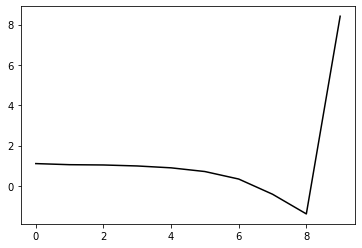

178200 0.13347032084617375
0.2620319748789991 -0.2090443402838758 -0.1869269584083786 -0.12015603373664539
[ 1.0476028   1.14835797  1.12015615  1.05665026  0.9497954   0.75429095
  0.37190218 -0.38882137 -1.3739201   8.46405432]


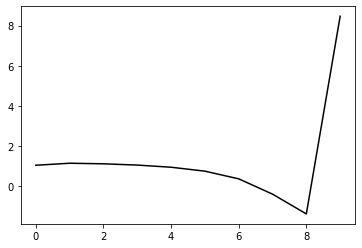

179300 0.268042355418312
0.25893149972439344 -0.20794076716294058 -0.1854043491423042 -0.12197061055461844
[ 1.11400616  1.11265613  1.1120188   1.06845961  0.9678814   0.77626781
  0.3971523  -0.36006224 -1.34248178  8.42303809]


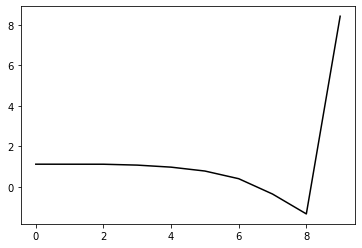

180400 0.1702850967025084
0.263859859570387 -0.20646813690400306 -0.18584988242265527 -0.1195795752045234
[ 1.05172306  1.17520827  1.16694058  1.11741681  1.01091375  0.81061373
  0.42306131 -0.34115066 -1.33060278  8.44323106]


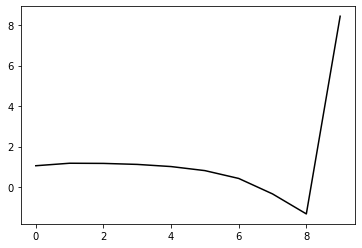

181500 0.2520837331836549
0.26003391366632045 -0.216739316662007 -0.19286967753585665 -0.11848322915880301
[ 1.05352937  1.10881929  1.12821541  1.10719274  1.0202351   0.83616283
  0.46518067 -0.27945748 -1.24558694  8.44724074]


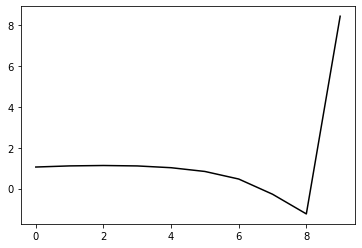

182600 0.3030813280800374
0.25704445363694356 -0.21061018382461766 -0.18725824515317868 -0.1249900489756697
[ 1.13589395  1.10693593  1.12984129  1.1103496   1.0266594   0.84245542
  0.47037226 -0.27455425 -1.24135043  8.44470187]


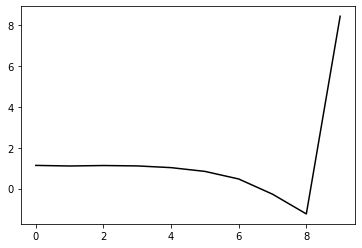

183700 0.20779938804586107
0.26178561863523964 -0.21050289804534705 -0.1883923454770302 -0.11941489857389732
[ 1.08150301  1.13300846  1.12263258  1.08398254  0.98767311  0.79019095
  0.40492743 -0.35136456 -1.32868378  8.40219899]


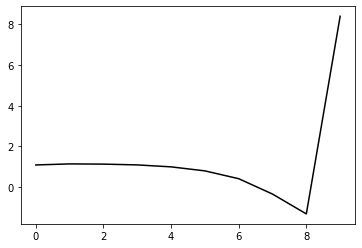

184800 0.26924651486430606
0.26737828690632154 -0.21139248587116283 -0.19055413573848531 -0.11809817126047924
[ 0.9937977   1.14757827  1.17064198  1.1313477   1.02916808  0.82584646
  0.43461589 -0.32588039 -1.30637636  8.45980611]


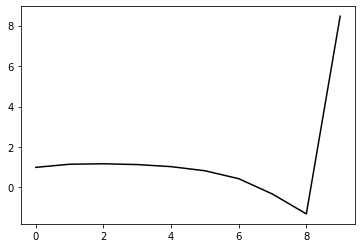

185900 0.23227028708245415
0.26235295606142034 -0.20919587599163533 -0.18784065175832443 -0.12042687407690555
[ 1.07585377  1.09244736  1.10645811  1.08035705  0.98916798  0.79410426
  0.40970833 -0.34319234 -1.31505544  8.42573991]


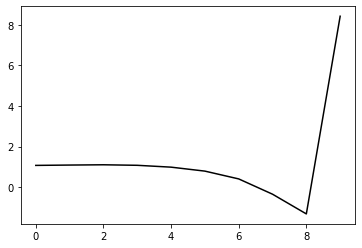

187000 0.21121508048971577
0.26078610186404766 -0.21249501226089776 -0.19010742310007114 -0.12089551959260438
[ 1.11057459  1.05126988  1.05571475  1.03483816  0.95381977  0.76726231
  0.39008522 -0.3541874  -1.31558938  8.46789992]


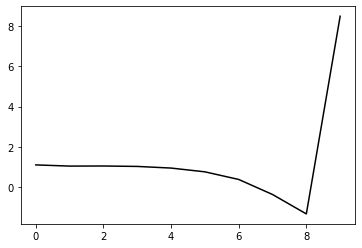

188100 0.22322179242781226
0.25609921540536995 -0.2066031291451002 -0.18478930166771465 -0.12338114914550634
[ 1.11311289  0.99360344  1.00150932  0.97478938  0.89035185  0.70099216
  0.31975348 -0.42816538 -1.39318038  8.41778245]


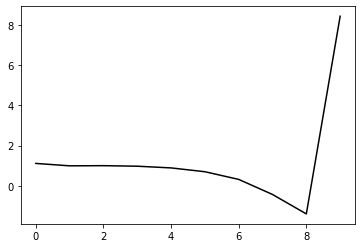

189200 0.14099030634587084
0.26376393099743023 -0.2054177180538394 -0.18645873968921556 -0.11982947953531149
[ 1.03262413  1.10360428  1.10329005  1.06351236  0.96778351  0.76694777
  0.37260287 -0.38876949 -1.36840515  8.44228176]


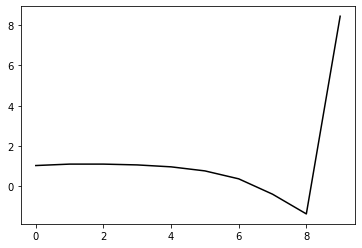

190300 0.2535596480714346
0.2581584350914469 -0.2083169740980601 -0.18739550218270826 -0.12134188642825569
[ 1.08064008  1.04721695  1.05187615  1.03010773  0.94796672  0.75981737
  0.3763819  -0.37447784 -1.34319855  8.47588107]


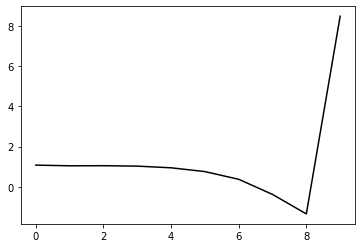

191400 0.22550645723754284
0.2581657583790578 -0.21222607692138407 -0.19063637216238094 -0.11841998021707037
[ 1.11248922  0.92358183  0.93865638  0.92304538  0.84797509  0.66662825
  0.2890836  -0.45560932 -1.41701558  8.45522826]


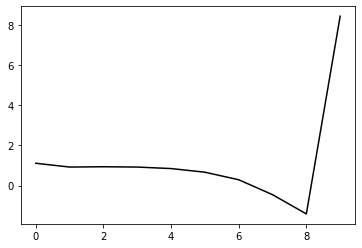

192500 0.25464741190339624
0.26435035804439383 -0.20768123222145213 -0.18801227311309981 -0.1209472319155225
[ 1.04047682  1.17718894  1.14960945  1.11160182  1.02386047  0.83188708
  0.44465243 -0.30807129 -1.2757734   8.426137  ]


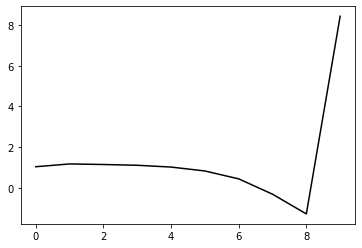

193600 0.20957486293974248
0.26390722301065894 -0.20880153343711938 -0.18902448107444644 -0.12020011406071192
[ 1.0420882   1.09688917  1.08251115  1.0432406   0.95499186  0.76471216
  0.37888088 -0.37216835 -1.33727814  8.44793212]


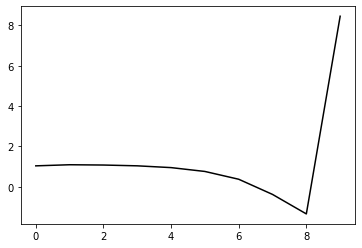

194700 0.2318475213448461
0.2662395873063261 -0.21159544703203567 -0.19183215617362342 -0.11962415873355693
[ 1.01628596  1.08071558  1.10341809  1.07425924  0.99080141  0.80572459
  0.42449054 -0.32194325 -1.28136088  8.43456061]


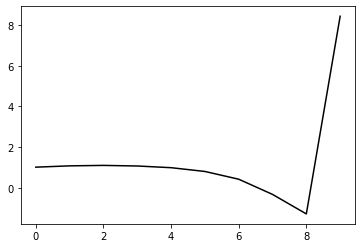

195800 0.19369327852222906
0.2581831637636515 -0.2162688592170984 -0.1937578231424958 -0.12144955893117648
[ 1.04570501  1.07575262  1.0716407   1.0566891   0.9870872   0.81491203
  0.44594337 -0.28818293 -1.23363378  8.46093574]


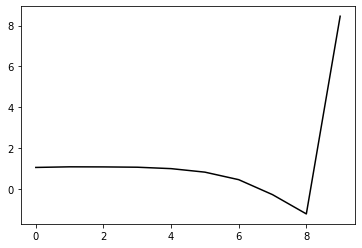

196900 0.2235044444121086
0.25748196569521337 -0.21587247934453643 -0.19311687437553496 -0.12050206159780505
[ 1.06479906  1.05665552  1.0047947   0.96467584  0.88114142  0.69793822
  0.3199405  -0.42112807 -1.37104761  8.42922871]


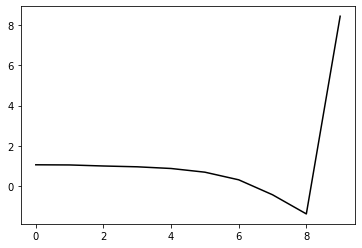

198000 0.2213819120630679
0.2659933850230786 -0.20793534970967556 -0.18898910687003556 -0.12252617164162083
[ 1.10879435  1.11062451  1.10637001  1.0571764   0.9674558   0.7801146
  0.39734418 -0.34973876 -1.30746078  8.45123795]


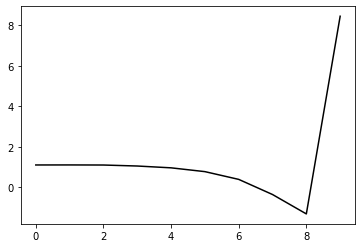

199100 0.1819178686959986
0.26622616641121366 -0.2045720610932182 -0.18669505136730644 -0.12295620829268557
[ 1.08480859  1.14249574  1.16964278  1.12821128  1.03427676  0.84362381
  0.4575083  -0.29359127 -1.25607841  8.41739471]


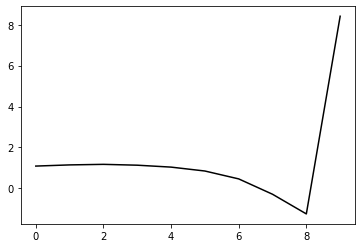

200200 0.13689238088136657
0.2618446781540953 -0.21027575740526602 -0.19027364956218018 -0.12124119067473431
[ 1.0869658   1.06996276  1.08937369  1.06077081  0.96927274  0.78026308
  0.39729553 -0.34928466 -1.30488621  8.46415157]


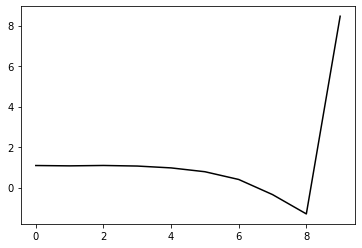

201300 0.2594412776576773
0.2635316509340725 -0.20797781323416645 -0.189221296998074 -0.12115430025044881
[ 1.08630726  1.14333544  1.13944303  1.10563888  1.01237883  0.81765317
  0.42807202 -0.32608916 -1.29034551  8.43532728]


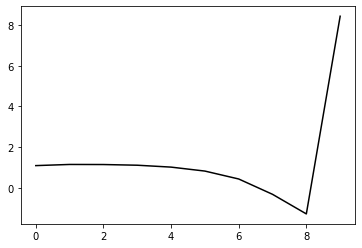

202400 0.15669368524809765
0.2709423754475536 -0.2021918687016254 -0.18703695811660767 -0.11956446872628929
[ 1.02489178  1.24418178  1.28659217  1.2599763   1.16679534  0.9685999
  0.57293238 -0.19009285 -1.16711011  8.43716201]


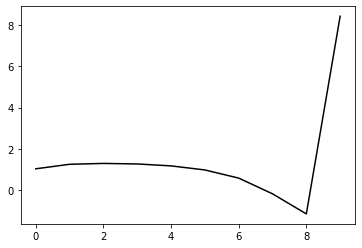

203500 0.24732778485156365
0.26313831168871016 -0.2102615689251485 -0.19170304317854314 -0.11680976564408334
[ 1.06962968  1.05493244  1.06791643  1.04548877  0.9552004   0.75888589
  0.36643362 -0.39107953 -1.35877625  8.39578222]


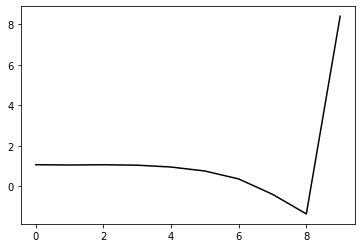

204600 0.21977995867497485
0.26109997860361345 -0.21214499115583837 -0.1928896483581919 -0.11621546768054213
[ 1.07196116  1.00774237  1.00982541  0.99060395  0.90833148  0.7180929
  0.33092363 -0.42073044 -1.38091503  8.42910994]


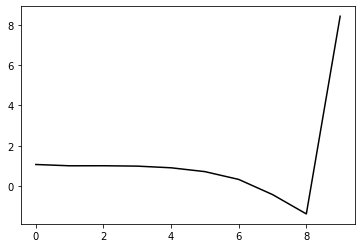

205700 0.23050624892638893
0.26552912071914697 -0.20833391255556644 -0.19081907130305328 -0.11843483229767994
[ 1.01762995  1.10119986  1.11271896  1.08419992  0.99699298  0.80211403
  0.40968123 -0.34660393 -1.31014301  8.47983788]


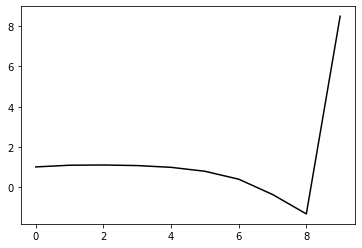

206800 0.2001051790534253
0.2614589139372086 -0.21326104283948902 -0.19392061826130474 -0.11672285736386227
[ 1.05291295  1.06640797  1.05994203  1.03490417  0.95456446  0.76730551
  0.3821086  -0.36611482 -1.3189638   8.41562418]


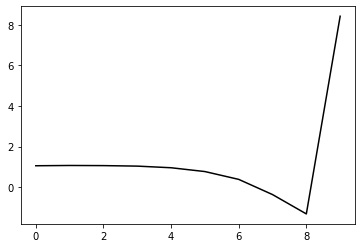

207900 0.2124281940174004
0.2679068589963963 -0.20786821114927923 -0.19088747597984118 -0.11711879004205215
[ 1.04282059  1.18801941  1.15865875  1.10238632  0.99800169  0.78973596
  0.38440558 -0.38309278 -1.35477294  8.40794051]


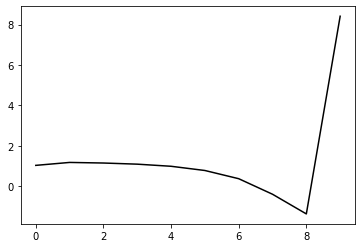

209000 0.17484956358343556
0.26689058221169837 -0.20637245239070706 -0.18978516420405261 -0.11774794632499644
[ 1.08133024  1.06846217  1.08851166  1.04444978  0.94229126  0.73745693
  0.3350406  -0.4300138  -1.39876013  8.45030284]


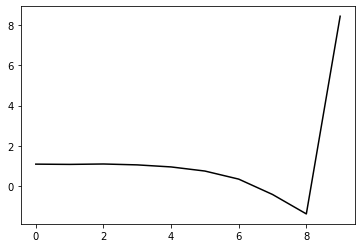

210100 0.2041171836832035
0.2678807657142052 -0.20597004195919358 -0.1900173803408181 -0.11772327558361298
[ 1.06749905  1.11311418  1.1460925   1.12345221  1.02962033  0.82917736
  0.43018775 -0.33199323 -1.29724994  8.40760457]


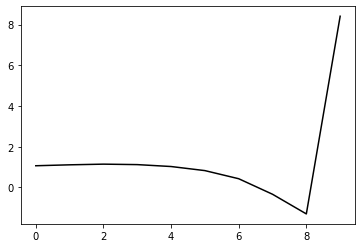

211200 0.15309799695622575
0.26191715025508594 -0.20610399554776673 -0.18853719610346434 -0.12212248951080826
[ 1.09316076  1.09062093  1.08253477  1.06148147  0.97931216  0.78886559
  0.40028556 -0.35018699 -1.30060956  8.44978001]


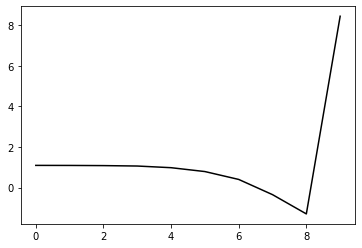

212300 0.27365468600494636
0.2624921407017242 -0.20734046952774657 -0.1898233685543765 -0.11885698679519979
[ 1.07460943  1.06610296  1.01187231  0.95962489  0.85974515  0.65423892
  0.2511987  -0.51228778 -1.47343824  8.40294793]


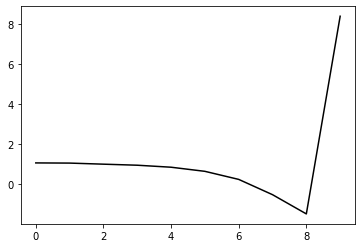

213400 0.20030632871262713
0.26272905884105135 -0.20584747682975066 -0.1890169306786991 -0.12029022978662297
[ 1.06917606  1.05795542  1.04547767  1.00048639  0.90424756  0.70377682
  0.30446289 -0.45620597 -1.41441462  8.44285976]


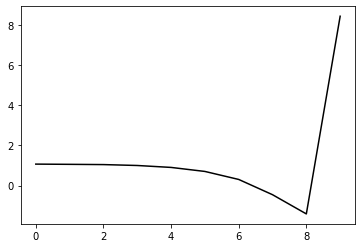

214500 0.2327088603966096
0.26945053135297947 -0.20566757809605732 -0.19055148020190738 -0.12070948264585195
[ 1.07541537  1.12080015  1.15297657  1.12495803  1.0366238   0.84373886
  0.4513592  -0.30296117 -1.25422761  8.4366971 ]


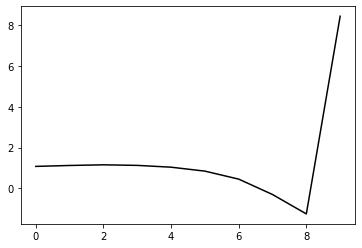

215600 0.21114466986671004
0.2640554707763459 -0.20552283153062456 -0.18954229808932097 -0.12031375794289555
[ 1.07262307  1.09878793  1.10603717  1.07547265  0.97933059  0.77671747
  0.37430085 -0.39043047 -1.35202785  8.44633963]


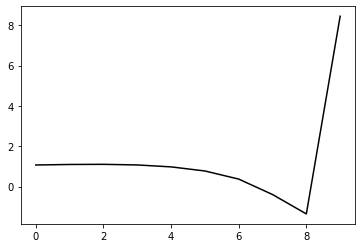

216700 0.22377120728272215
0.2635771466496621 -0.20941500842082314 -0.1926048408787657 -0.11875398032787651
[ 1.01676398  1.03326009  1.04720197  1.0184339   0.92328191  0.72048636
  0.31832387 -0.44519992 -1.40320819  8.44104732]


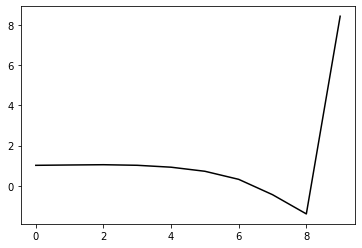

217800 0.18128314632770878
0.267137631997077 -0.2054283572842275 -0.19025927065892093 -0.12030937624590858
[ 1.06129338  1.15057544  1.16676541  1.14094579  1.05136725  0.85164636
  0.4508879  -0.31235587 -1.27038342  8.43838478]


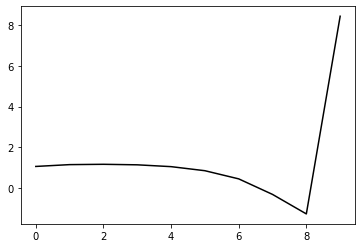

218900 0.21307153663997516
0.2665625613457196 -0.21063327971577755 -0.19480979831774123 -0.11632231194010274
[ 1.05893915  1.04154415  1.07151206  1.05152925  0.96420719  0.76630343
  0.36705831 -0.39453989 -1.34978813  8.41182232]


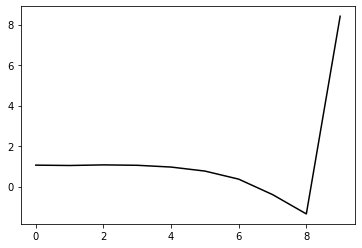

220000 0.16802557691325992
0.2654101152984218 -0.20629665618852663 -0.1913638393337756 -0.11870610720144888
[ 1.05235802  1.10735583  1.12454319  1.10690956  1.0246704   0.82937319
  0.43063647 -0.33179071 -1.28818776  8.45866218]


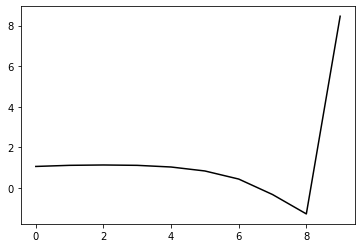

221100 0.18224524615058452
0.2606649759251784 -0.20504560584565035 -0.18913141468096556 -0.12207682190374008
[ 1.11529206  1.06182851  1.06598076  1.0499147   0.97539299  0.78909535
  0.39923024 -0.35368693 -1.29800039  8.43239448]


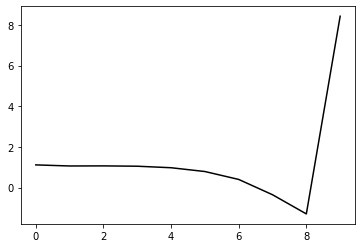

222200 0.16158004252902364
0.2653581488208751 -0.20228485048000538 -0.18895348005091553 -0.1188621756100368
[ 1.01647002  1.07552708  1.07439391  1.04244031  0.95466215  0.7562324
  0.35273117 -0.4157392  -1.37780017  8.45362631]


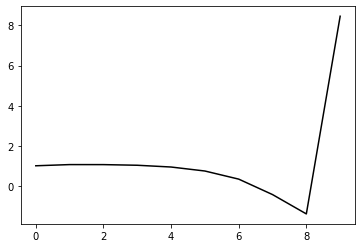

223300 0.24796510946417363
0.261975748106228 -0.2021326170030946 -0.18794531753164415 -0.12075496191195112
[ 1.09225122  1.06640252  1.05768488  1.02932025  0.94764219  0.75702124
  0.36100256 -0.4003614  -1.35399038  8.42843724]


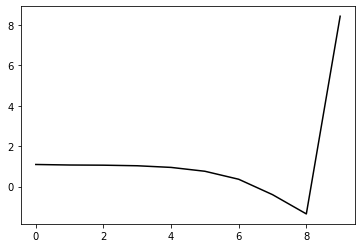

224400 0.16926594757309318
0.2632918257774254 -0.20181317521176792 -0.18828600048508312 -0.12062309834651319
[ 1.04131341  1.1117961   1.11243563  1.08298354  0.99896339  0.80800275
  0.41205584 -0.3492139  -1.30145822  8.43768405]


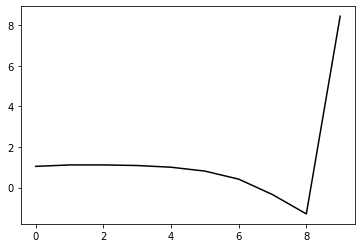

225500 0.24576369026600603
0.26133189823592257 -0.20644588789402574 -0.1913238550239284 -0.12058633763487965
[ 1.06565308  1.10483533  1.07933216  1.04553721  0.96319019  0.77621074
  0.38559294 -0.36937568 -1.31257595  8.44127195]


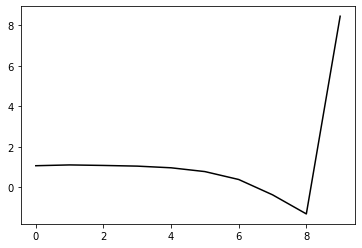

226600 0.20364962645477744
0.2616871905720263 -0.20329342708125986 -0.18909316220753503 -0.12396022189829214
[ 1.09603866  1.09918698  1.12311572  1.09254437  1.00941691  0.82358817
  0.43460818 -0.31910417 -1.26061231  8.44569168]


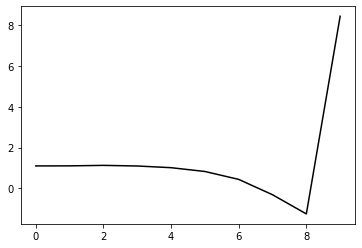

227700 0.21674409146403456
0.2587650010482782 -0.20850771014989186 -0.1927707620788365 -0.12035759314786931
[ 1.08117332  1.0119529   1.01695076  0.99141289  0.907895    0.72245222
  0.33559609 -0.41545837 -1.35274882  8.42477451]


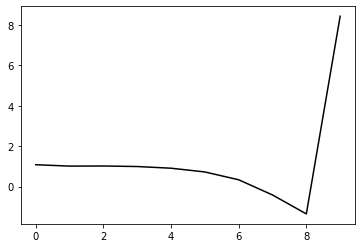

228800 0.25243481784155786
0.2651416044648062 -0.20448914090448067 -0.19157460068100232 -0.12059472151363657
[ 1.00034748  1.17547317  1.18172496  1.14871362  1.059347    0.86602221
  0.47059783 -0.29050265 -1.23929244  8.45863045]


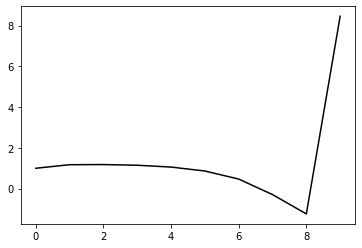

229900 0.21876689954110531
0.26119775632840064 -0.20450921107764664 -0.19121249405093863 -0.11873118246565682
[ 1.03404233  1.08916338  1.05341084  1.00940247  0.91384949  0.71567386
  0.31685669 -0.44694052 -1.39720848  8.41077267]


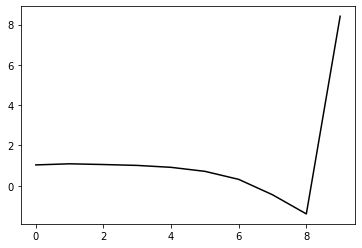

231000 0.17874724010982906
0.26134141574195635 -0.20579386654971868 -0.1923425651061615 -0.1201300628342037
[ 1.08443306  1.03606166  1.02992314  0.99175217  0.90393922  0.71493177
  0.32559244 -0.42879746 -1.36848426  8.43445485]


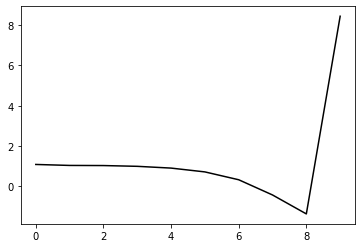

232100 0.20326840946750632
0.2520326869802279 -0.20557158190914596 -0.1900278164829976 -0.12233094547988094
[ 1.07371385  0.90436631  0.88684232  0.83914907  0.74128286  0.54374606
  0.14706096 -0.61420657 -1.56000735  8.40742232]


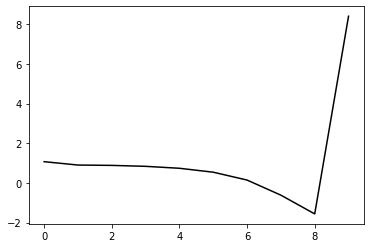

233200 0.13134864200751864
0.25949279956903115 -0.2048263820188155 -0.19094168531413708 -0.12240752242065517
[ 1.06274295  1.13242432  1.10392675  1.05044963  0.94841955  0.74710946
  0.34705448 -0.41749266 -1.36627143  8.46641659]


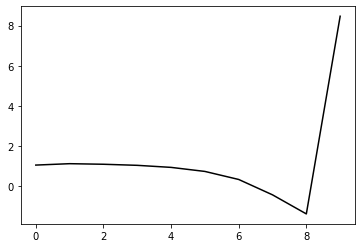

234300 0.2636038823526445
0.26620464216649803 -0.19841335661555204 -0.18818783414306922 -0.12168084885814891
[ 1.0494646   1.14159597  1.16241023  1.11239564  1.00298226  0.79412854
  0.38672934 -0.38590779 -1.3440156   8.42030653]


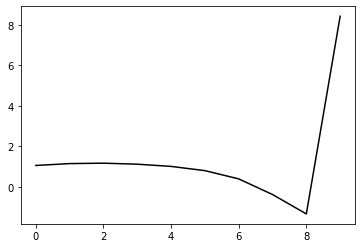

235400 0.19587687265132997
0.2632669530789807 -0.20191151795532647 -0.19029377157429334 -0.12020960882034129
[ 1.02582262  1.09047317  1.09345298  1.05831108  0.95497592  0.74932356
  0.34562336 -0.42285702 -1.37564393  8.43940468]


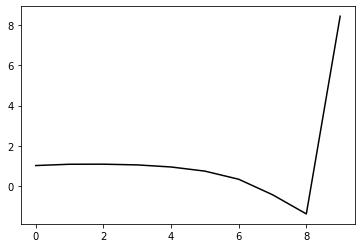

236500 0.24338608775746323
0.26011275335819395 -0.20926793063786356 -0.1956092799497217 -0.11777094702371514
[ 1.06717299  0.9486515   0.94329208  0.91830319  0.8311902   0.63861113
  0.24794671 -0.5067927  -1.44360304  8.38381823]


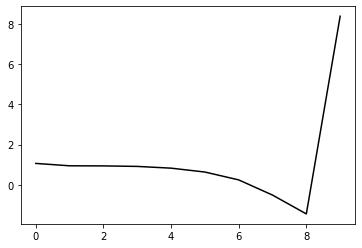

237600 0.2165888608417591
0.26068310738923856 -0.2049709315554525 -0.19240256698641792 -0.12127168773629293
[ 1.0667207   1.10991946  1.09503769  1.06169545  0.97676771  0.78604323
  0.39620846 -0.35798515 -1.29424336  8.46662827]


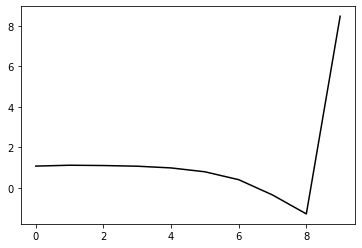

238700 0.2203296763568289
0.2638609543177644 -0.203174070073945 -0.19222463831485737 -0.11906089799421438
[ 1.03904532  1.10542031  1.11755728  1.08395149  0.9942712   0.80027567
  0.40635611 -0.35268985 -1.29462461  8.43934113]


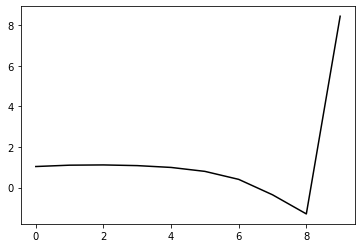

239800 0.20488064437899992
0.2586157844340177 -0.2009617770181422 -0.1894726891290763 -0.12086485912250429
[ 1.05359824  1.06447595  1.02551469  0.98513566  0.89211069  0.69615578
  0.30169609 -0.45673015 -1.39644703  8.43058162]


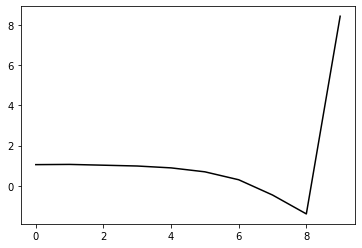

240900 0.2049743838896485
0.26345511511108427 -0.2038684129002085 -0.1932402711965232 -0.11850279489347744
[ 1.0181037   1.11491456  1.11252182  1.07291774  0.98209328  0.79036491
  0.40056005 -0.35280235 -1.28622696  8.4484084 ]


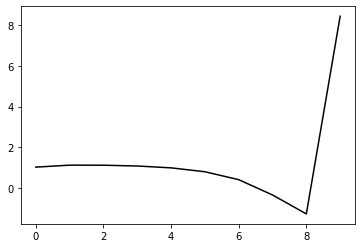

242000 0.29257135748069296
0.2559319388862422 -0.19880998878298728 -0.18782502993259995 -0.12243099165380217
[ 1.15049318  0.92620337  0.91187351  0.86783671  0.77170813  0.57537912
  0.18155233 -0.57560769 -1.51231753  8.43578701]


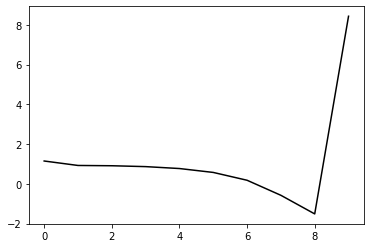

243100 0.1907417544102103
0.2568945938338126 -0.20613559073138527 -0.19347404244978209 -0.12218177043612256
[ 1.08591151  1.09903523  1.06590925  1.01467625  0.91652794  0.71917422
  0.32523091 -0.43100874 -1.36515351  8.43671435]


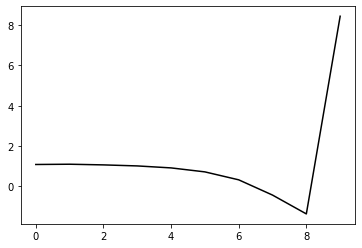

244200 0.13788178469659992
0.25873444618907815 -0.20349955027466865 -0.1921255720103569 -0.12329498560392962
[ 1.08183248  1.10857415  1.09876249  1.04776282  0.94684782  0.74774251
  0.35229758 -0.40546414 -1.3408366   8.43935907]


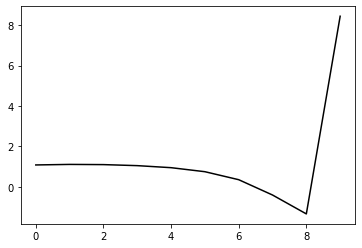

245300 0.3127370501541441
0.2595047710310072 -0.20041215916059618 -0.18992040154348344 -0.12618330107714615
[ 1.12724317  1.15936096  1.17509824  1.13415482  1.03444322  0.83550869
  0.44026645 -0.31786223 -1.25419508  8.40547187]


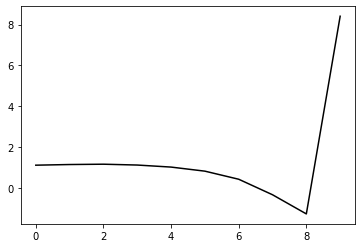

246400 0.17392917701153543
0.2642075099632387 -0.20193897654519277 -0.19249732693382407 -0.12249056649610444
[ 1.02254198  1.21824457  1.22819595  1.18965494  1.08460914  0.87534264
  0.46984487 -0.29773183 -1.2423981   8.4388724 ]


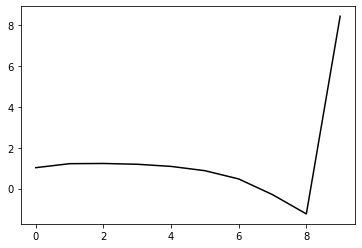

247500 0.23843039705938043
0.26207145043349456 -0.19921900510706833 -0.19054003867142735 -0.12127456581816129
[ 1.05683535  1.15770918  1.16700574  1.13273288  1.02934071  0.81836044
  0.40958844 -0.36289529 -1.31550338  8.45315336]


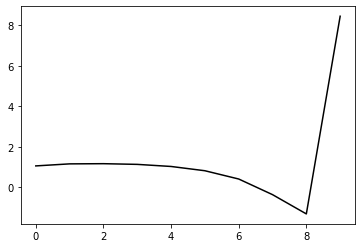

248600 0.20979362663251558
0.260860545631709 -0.20052614719534098 -0.19149181433520723 -0.1214037241969845
[ 1.08233569  1.07476479  1.09696001  1.07220931  0.9758298   0.76900827
  0.36357814 -0.4050899  -1.3528925   8.40777879]


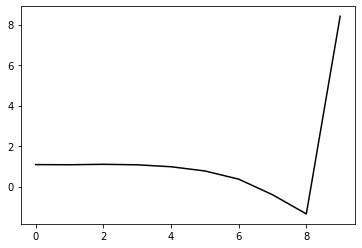

249700 0.22098468006758618
0.25786604137390534 -0.20692257170522466 -0.19591602835463162 -0.11981985727047463
[ 1.06794311  1.08347456  1.09165427  1.0741655   0.98635778  0.78565348
  0.38519888 -0.37813897 -1.31932991  8.46460029]


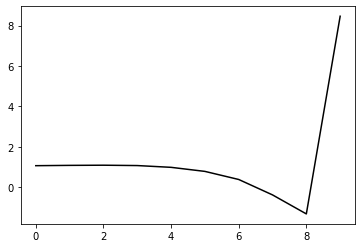

250800 0.1800073803931248
0.2578516236792808 -0.20499691705508055 -0.1944781714149057 -0.12161707567512904
[ 1.06373524  1.13883393  1.12771542  1.10216669  1.01398744  0.81081753
  0.40547082 -0.36299333 -1.30857895  8.47715472]


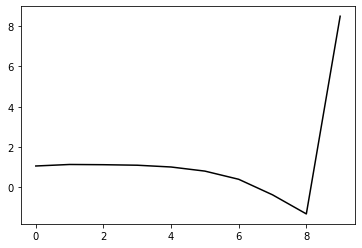

251900 0.21314431101674264
0.2641802811567128 -0.20183143712516283 -0.1939409789941112 -0.12037801903740283
[ 1.04612762  1.18727887  1.22653805  1.20540795  1.11973342  0.91903206
  0.51285668 -0.25870015 -1.20938822  8.44925127]


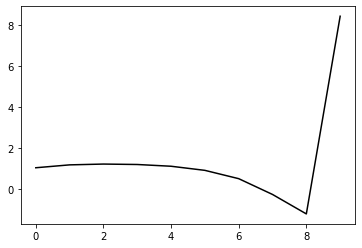

253000 0.17242320221645102
0.25428052674248536 -0.20777350271670714 -0.19638402814285197 -0.11954850789912241
[ 1.06969598  1.0437236   1.05301229  1.04157523  0.96190892  0.76717708
  0.36672835 -0.39814369 -1.33947633  8.43718393]


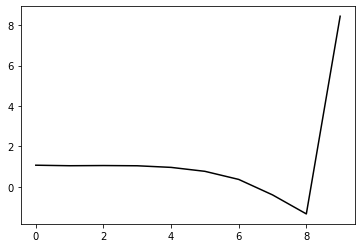

254100 0.2006192812078843
0.25528025252915193 -0.20893125094461765 -0.19790740035997983 -0.12105113425587548
[ 1.10237674  1.11806662  1.11860217  1.11130228  1.04481493  0.86232581
  0.47198113 -0.28421449 -1.21720303  8.48283124]


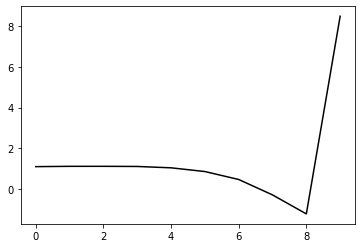

255200 0.13660605377226312
0.25206360600975547 -0.20531584508588507 -0.1945364841151602 -0.12173966762492994
[ 1.07741024  1.07546127  1.06254688  1.04286539  0.97083908  0.78483204
  0.38979058 -0.37258736 -1.31355482  8.43649397]


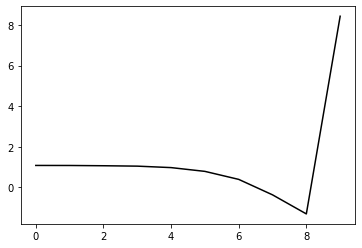

256300 0.32244647761315354
0.25839791878926677 -0.20692743766409868 -0.19832594116250477 -0.11357419315211657
[ 1.02747185  0.98254036  0.96968126  0.93854846  0.85821251  0.66650464
  0.26540638 -0.50385787 -1.45249875  8.40579989]


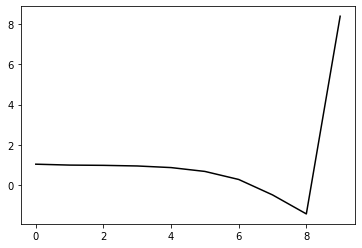

257400 0.18162972105676073
0.25833408332874064 -0.19900793654741347 -0.19150669940688858 -0.12143779694808775
[ 1.05741514  1.08999643  1.07074973  1.03215082  0.94680309  0.75314212
  0.35062861 -0.41995269 -1.36922942  8.4483214 ]


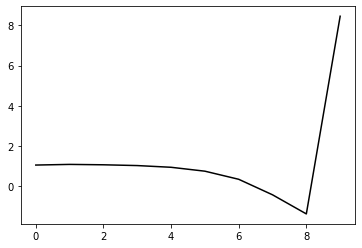

258500 0.23926420149531566
0.2635893563066561 -0.19732258528311153 -0.19165092766854006 -0.1217349336266609
[ 1.08253768  1.11637568  1.13899386  1.10876191  1.02657301  0.83800844
  0.44061388 -0.32560739 -1.27034424  8.44838386]


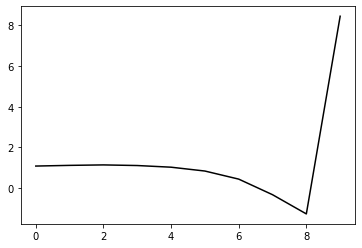

259600 0.26362548984530426
0.26250947815964715 -0.1934449183721554 -0.18862210075349697 -0.12411714611004353
[ 1.08983988  1.16499745  1.19678677  1.17489946  1.09247986  0.90303606
  0.50448027 -0.26440353 -1.21298792  8.46415514]


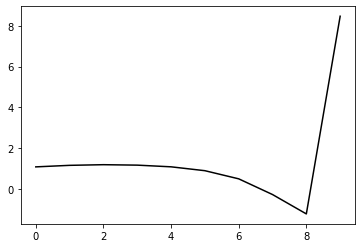

260700 0.2223459102491908
0.2605024829051811 -0.1981013726075988 -0.19216958180194774 -0.11844242524717036
[ 1.05726932  1.05781277  1.05609597  1.02798621  0.93928035  0.74313099
  0.33895883 -0.43541123 -1.38882656  8.41107294]


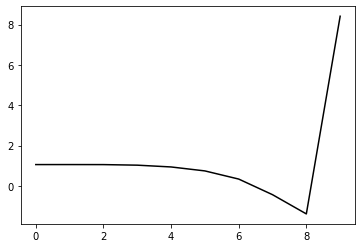

261800 0.3716184456280911
0.26688654272123935 -0.1998395775249198 -0.195065275492133 -0.11893017028827578
[ 0.96583819  1.15782223  1.17742809  1.15167839  1.06495297  0.87022179
  0.46784084 -0.3048697  -1.25605609  8.45956666]


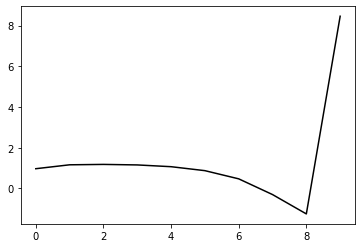

262900 0.21120681977888317
0.2648385959397312 -0.19638665920251971 -0.1920883485635935 -0.12166168217256876
[ 1.02430658  1.17069145  1.18846782  1.1701281   1.09187782  0.90403371
  0.50758138 -0.26046247 -1.2074455   8.43554104]


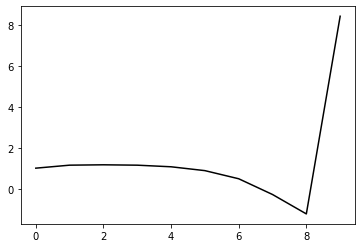

264000 0.17409398747600216
0.2560347417497635 -0.20255836597354795 -0.19455920111666175 -0.11952921136627971
[ 1.07183355  0.98879358  0.96346438  0.93549235  0.85280197  0.66243579
  0.26518539 -0.50216916 -1.44607495  8.42251943]


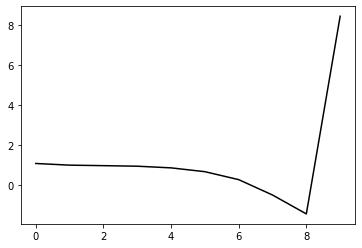

265100 0.260694729121099
0.25815185916732397 -0.19410050600067802 -0.18830890580312404 -0.12531078896280531
[ 1.10660576  1.07624636  1.07678989  1.03925528  0.95173755  0.75815172
  0.35776668 -0.4131947  -1.36110564  8.40681345]


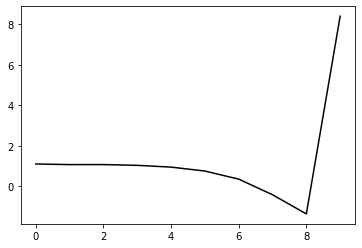

266200 0.15833868822479624
0.2534649583956481 -0.19981987468117776 -0.19175230252113895 -0.12411788915685207
[ 1.08948947  1.03937859  1.01678659  0.98152896  0.89481114  0.70339938
  0.30575822 -0.4623214  -1.40653973  8.43153   ]


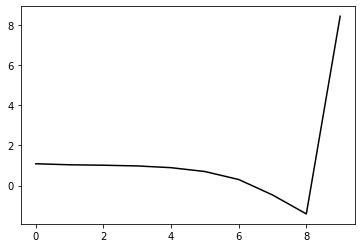

267300 0.25038288271259246
0.25864846904784333 -0.1965621194410046 -0.19032177002768036 -0.124853644003409
[ 1.08388449  1.11250953  1.10396926  1.05872389  0.96463116  0.76793227
  0.36613359 -0.40572282 -1.35307767  8.43075641]


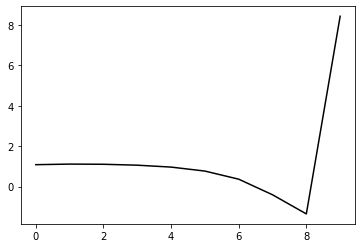

268400 0.20962421436553527
0.25632644188461984 -0.20234400941967864 -0.194761518628684 -0.11932471061570735
[ 1.04707599  1.05335744  1.03987157  0.98957419  0.8847027   0.67798583
  0.26708097 -0.51400992 -1.4709031   8.42362874]


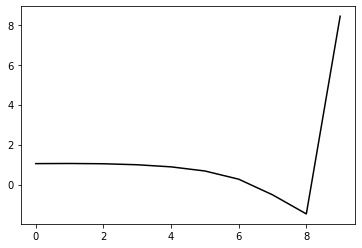

269500 0.2523607704230666
0.2571314993562877 -0.2025516025290952 -0.19516812023606392 -0.12195099951279292
[ 1.03411062  1.12899852  1.11736365  1.07707899  0.98206044  0.78486244
  0.38399165 -0.38724134 -1.33383319  8.38683707]


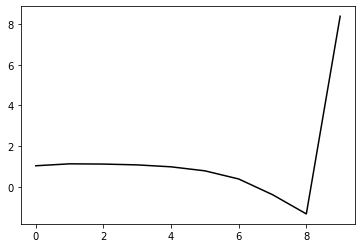

270600 0.21451691039848614
0.25935959048763346 -0.19585407246759104 -0.19079616786419082 -0.1245611881614229
[ 1.06302907  1.12892095  1.14844766  1.11089526  1.0145029   0.81488863
  0.41150692 -0.36324953 -1.31470069  8.45678679]


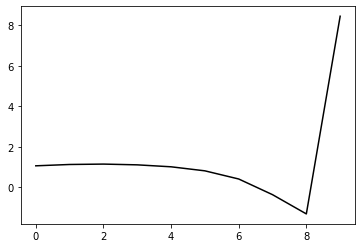

271700 0.2412071245472569
0.2601389699148728 -0.20415625829504797 -0.1979112541838296 -0.1179058480918474
[ 1.02313375  1.00954234  1.05675067  1.03873227  0.94884579  0.75270827
  0.35254867 -0.41968221 -1.36943683  8.41188739]


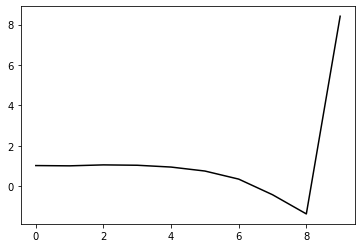

272800 0.21045801349154394
0.26115033224619527 -0.19760259077631526 -0.1930804987910441 -0.12130165978875514
[ 1.02305864  1.18270531  1.19383678  1.17503593  1.08705701  0.88869729
  0.4854211  -0.29057311 -1.24508619  8.46677886]


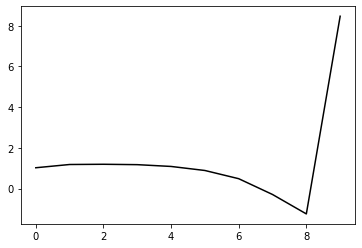

273900 0.2176769856364994
0.25908893677637773 -0.2006184341371697 -0.19549359906448774 -0.11652138055087609
[ 1.05340583  1.01201523  1.00926925  0.98214995  0.89089768  0.68830843
  0.28062955 -0.49957608 -1.45826457  8.37222575]


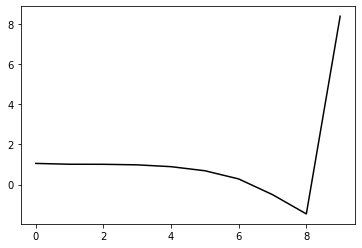

275000 0.20954505155849212
0.25814964340891805 -0.19644323788212734 -0.191923271018983 -0.12029356793938954
[ 1.09322197  1.0528054   1.05351617  1.02513437  0.93944334  0.74228963
  0.33908692 -0.43666232 -1.39030956  8.42474561]


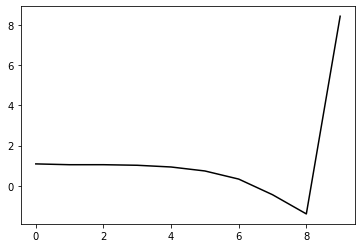

276100 0.2664576149988315
0.25632745715375804 -0.19299816688861854 -0.18880273225981473 -0.1233476276055185
[ 1.11727276  1.10666781  1.10639568  1.07473561  0.98829885  0.79139113
  0.38745931 -0.38972358 -1.3455128   8.41915286]


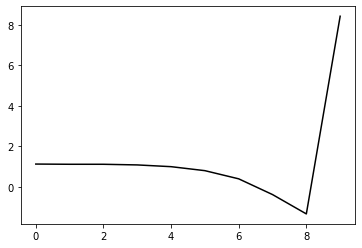

277200 0.13660398798114168
0.25498028405112483 -0.19774931147854036 -0.19223191560553549 -0.12029026803103357
[ 1.05784203  1.05361063  1.03987324  0.99719675  0.90086588  0.69702355
  0.28744154 -0.49407477 -1.45265584  8.44570421]


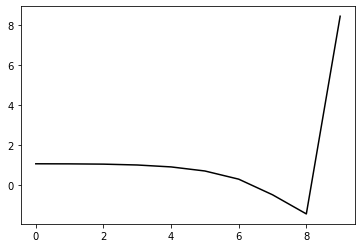

278300 0.3018013305669277
0.26171157078975565 -0.19817677418763707 -0.19477726519817723 -0.11803601643248005
[ 1.02528684  1.10508123  1.11448243  1.07654936  0.98122059  0.77843734
  0.36912747 -0.41310569 -1.37339577  8.40423759]


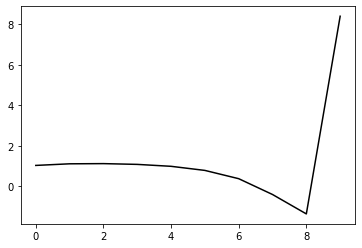

279400 0.18827333072019362
0.2619120644540352 -0.19636880779726748 -0.19378209855625791 -0.11837781478847316
[ 1.05167979  1.12571691  1.13481596  1.10340091  1.01112153  0.81046695
  0.40266967 -0.37903858 -1.33976455  8.45801487]


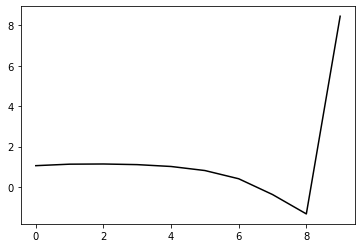

280500 0.24638478898276553
0.25329281573961365 -0.20460295807299703 -0.19786190624656155 -0.1180914693788709
[ 1.06224567  1.04449953  1.0400232   1.01338531  0.92533412  0.72864036
  0.32548365 -0.45047346 -1.40307861  8.42022516]


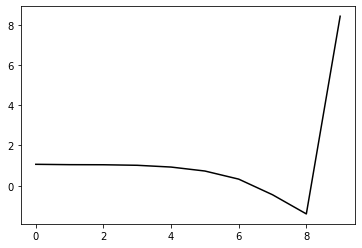

281600 0.22194290105572784
0.2565283865087608 -0.2020641484538823 -0.19654489606908485 -0.12103111268107852
[ 1.0803071   1.10242026  1.09931804  1.07119367  0.98672111  0.79354883
  0.39366157 -0.37936225 -1.32928972  8.44647291]


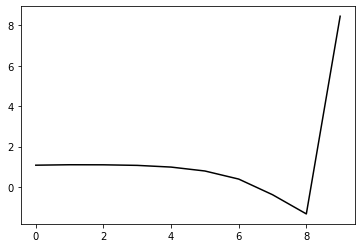

282700 0.21435564649625202
0.2572917480299325 -0.2014671156485776 -0.196486398934196 -0.12128957771404773
[ 1.07667057  1.11817579  1.13655841  1.11315878  1.03177049  0.84201762
  0.4448314  -0.32632837 -1.27493605  8.41590272]


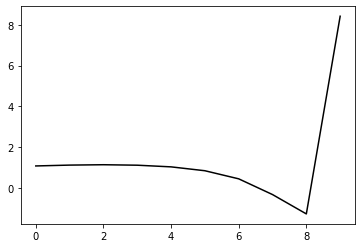

283800 0.1933637459464656
0.25757635476623436 -0.2041805938722828 -0.19877638573427467 -0.12016025630897599
[ 1.08463061  1.0163195   1.04636325  1.02628429  0.94436621  0.75376494
  0.35600857 -0.41549213 -1.36391959  8.41229347]


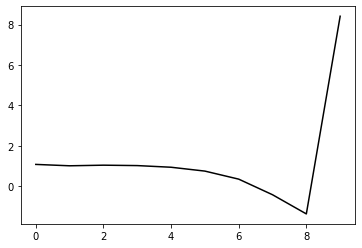

284900 0.21272005256751825
0.25291834898816973 -0.2065102888613061 -0.1996060830145742 -0.12288646732723209
[ 1.04390983  1.12823558  1.14324095  1.13300797  1.06187111  0.8808327
  0.49181861 -0.27186361 -1.21320979  8.46282152]


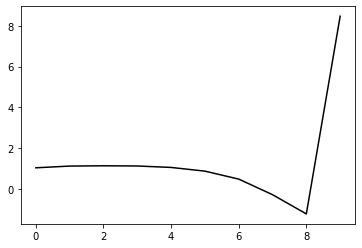

286000 0.2345895942988684
0.25385952919032073 -0.19734476414461427 -0.19315463473823286 -0.12444895692659684
[ 1.11767115  1.08620583  1.10752326  1.08884817  1.01193972  0.82454895
  0.42790397 -0.345192   -1.29863498  8.50447637]


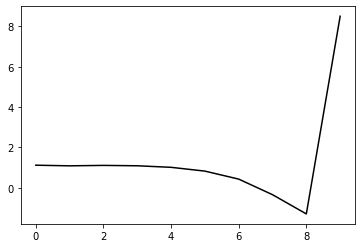

287100 0.19598183506907524
0.2460302990652718 -0.20285065736627644 -0.19553040089900675 -0.12260724752858292
[ 1.12320238  0.99573418  0.9859366   0.96854038  0.89474524  0.71143226
  0.31927078 -0.44886036 -1.39617221  8.42339083]


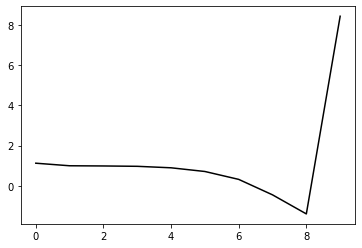

288200 0.15652384693808316
0.25030237360596674 -0.19738225717437177 -0.19257529883244084 -0.12426252391418416
[ 1.08825883  1.12716239  1.11028875  1.07789164  0.99931045  0.81339384
  0.41799988 -0.35472409 -1.30858657  8.44163378]


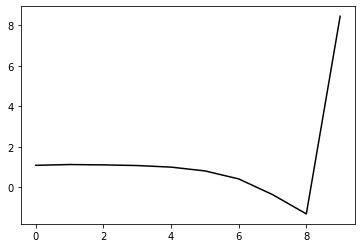

289300 0.24866486775448296
0.24783473929715577 -0.19589921171906755 -0.19100495215497193 -0.12414584532830979
[ 1.0740118   0.99611872  0.97193571  0.93550011  0.85188119  0.66659852
  0.27396288 -0.49570339 -1.44628585  8.3864684 ]


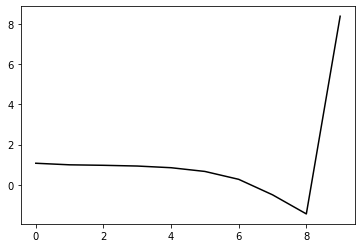

290400 0.17437757032494375
0.2538807452033068 -0.19607797705570187 -0.19311713401501124 -0.12107741884460876
[ 1.04902234  1.09507022  1.10826986  1.07133021  0.98071631  0.78884473
  0.39023614 -0.38588354 -1.34373923  8.43205618]


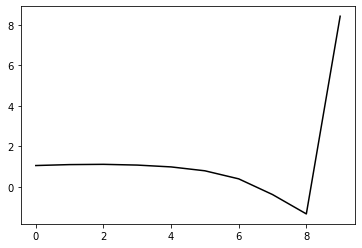

291500 0.2966443184608877
0.25637780197841176 -0.19873552811117207 -0.1958045083707806 -0.11717182965434374
[ 1.00408448  1.00991286  0.99533611  0.94978705  0.85155987  0.65377204
  0.25224137 -0.52512421 -1.48266114  8.41238798]


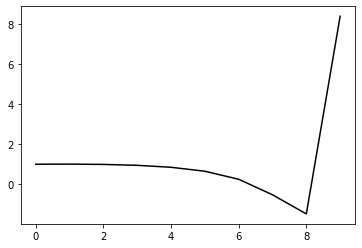

292600 0.22914706187123102
0.26130260146555323 -0.19318732526498011 -0.19257893185593536 -0.12093022474212028
[ 1.01494984  1.17877935  1.21664018  1.17550052  1.07248497  0.86782155
  0.46009135 -0.32338033 -1.2874718   8.48178173]


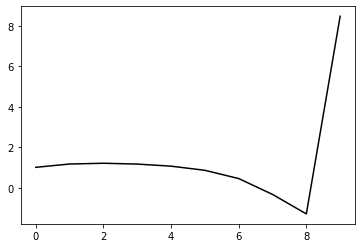

293700 0.22181523238769235
0.25264217648790926 -0.19825484942423613 -0.19457401414629383 -0.1205911916996004
[ 1.06407156  0.95840954  0.95505046  0.94937731  0.87531359  0.69346607
  0.30846873 -0.45196752 -1.39161193  8.42328623]


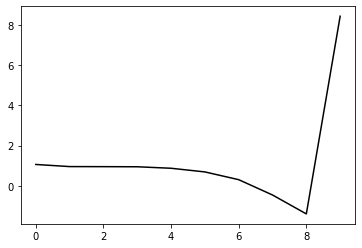

294800 0.2366986660109885
0.258837781114979 -0.19348820109699819 -0.1925193831028992 -0.12303584238225376
[ 0.99480721  1.17656932  1.17195564  1.15223599  1.07826039  0.89422186
  0.50477185 -0.26153601 -1.20944975  8.47053224]


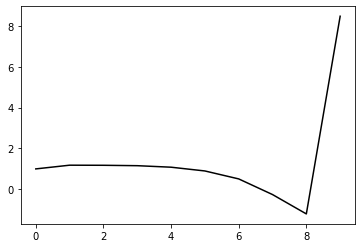

295900 0.2277840842200934
0.2488971632635322 -0.20099037907791847 -0.19590539387611883 -0.121483165184129
[ 1.07218183  0.96137653  0.95305667  0.93490295  0.86605685  0.68961724
  0.307817   -0.44991074 -1.38746497  8.40722942]


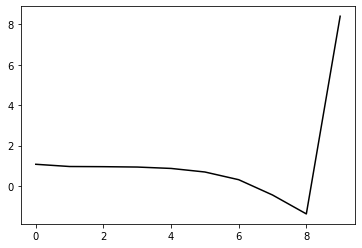

297000 0.17091508946350437
0.24719458876621 -0.20242690313564285 -0.19689105582050367 -0.12056458591547568
[ 1.05157922  0.96208448  0.93992799  0.91645053  0.84812453  0.67427856
  0.29452093 -0.46169045 -1.39841646  8.4333803 ]


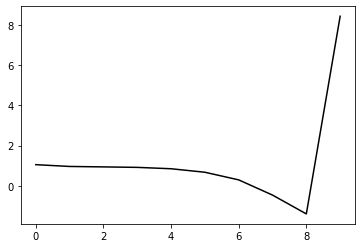

298100 0.1961618091116544
0.25419371915476563 -0.19592243790377065 -0.19383772051228426 -0.12124349190729103
[ 1.06014268  1.05924953  1.03661896  1.00296971  0.93012862  0.75447038
  0.37243301 -0.38691493 -1.32797491  8.42919069]


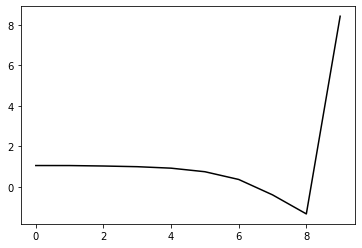

299200 0.15141329134808312
0.25001068833825474 -0.19540377836609518 -0.19228626109078994 -0.1253684555886388
[ 1.07393835  1.06627884  1.03854307  1.0015289   0.92881585  0.75832643
  0.38288893 -0.36932558 -1.30226043  8.49042921]


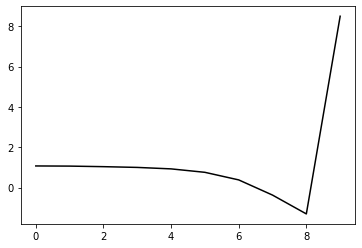

300300 0.24878685799209596
0.2522788015850836 -0.19090890093199614 -0.1899522937296402 -0.12400879496464495
[ 1.07375371  1.06719754  1.04183022  0.99520553  0.91125345  0.73262351
  0.34953071 -0.41199184 -1.35721756  8.41971622]


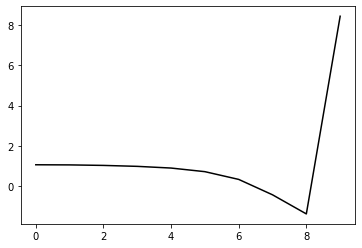

301400 0.19569932757797812
0.25304233650897695 -0.19446001640116256 -0.1933418100583286 -0.122291130282879
[ 1.01496138  1.02721493  1.01495515  0.98359266  0.90583682  0.73570341
  0.36398302 -0.38540914 -1.31753804  8.44530357]


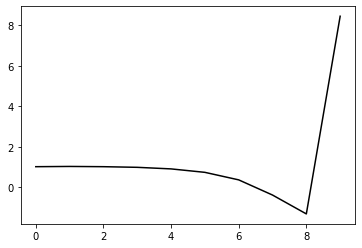

302500 0.3258752494287148
0.2590029665330565 -0.19277006789875042 -0.19397061559033174 -0.12095758149211762
[ 0.97420797  1.20379581  1.19359857  1.15145451  1.06882965  0.89337713
  0.51682959 -0.23970146 -1.18351748  8.47051729]


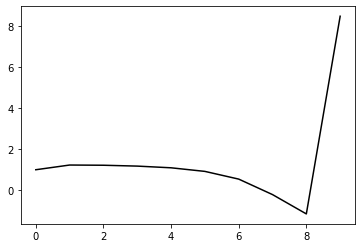

303600 0.20335726785803102
0.24815766917654206 -0.19400630591219067 -0.1919052882888192 -0.12020717388579696
[ 1.07136884  0.97033269  0.90930777  0.85199218  0.75872211  0.57816704
  0.20128834 -0.55230414 -1.49016678  8.41954651]


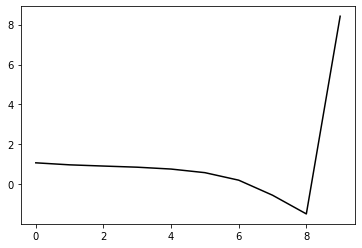

304700 0.220338037744432
0.2525577388515853 -0.19393486626424744 -0.192830930454769 -0.1222522296121176
[ 1.06763495  1.03999093  1.00963222  0.9486391   0.85180535  0.66971333
  0.29342571 -0.45836016 -1.39350619  8.3767416 ]


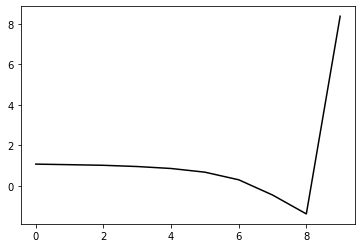

305800 0.1973482595259987
0.25338131949793585 -0.1969360458409197 -0.195444435224363 -0.12142189707258633
[ 1.02803399  1.06840021  1.04794481  0.99838753  0.90430972  0.72596689
  0.35638031 -0.38714614 -1.31308875  8.42095292]


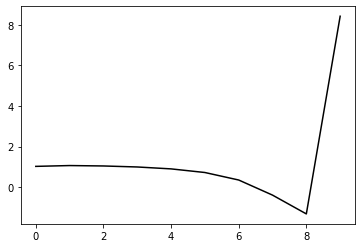

306900 0.24818782449500576
0.2584018569111299 -0.19588839120869828 -0.19604911135907657 -0.12070586817282843
[ 0.97652881  1.13416076  1.1210198   1.07078825  0.97355987  0.79028505
  0.41728102 -0.32907004 -1.25894031  8.45776349]


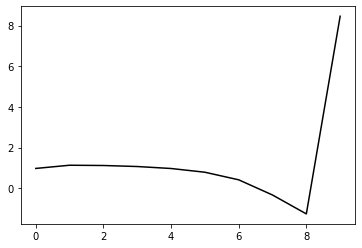

308000 0.1716623193883033
0.25139368479020685 -0.2010451129547288 -0.19789142858411946 -0.12233517655400776
[ 1.0396694   1.04996968  1.01296101  0.95587147  0.85477031  0.66846145
  0.29522819 -0.44841029 -1.37268949  8.417938  ]


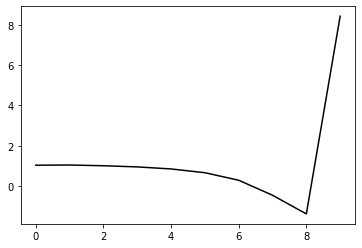

309100 0.20692673235839248
0.2546918069196871 -0.1965582346117538 -0.1954106552115221 -0.12342873859220943
[ 1.04600202  1.10682049  1.10199717  1.04941586  0.9477618   0.76004132
  0.38651534 -0.35640755 -1.28033232  8.3925676 ]


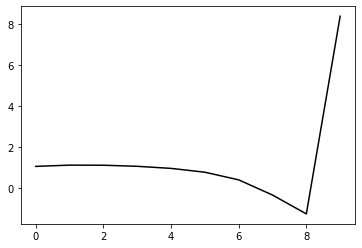

310200 0.14828710854279872
0.24938880737926578 -0.19615128498073636 -0.19380316376103512 -0.126754647013782
[ 1.06994863  1.0710916   1.04816289  1.00190178  0.90475258  0.71981339
  0.35071485 -0.38568046 -1.30202979  8.45345111]


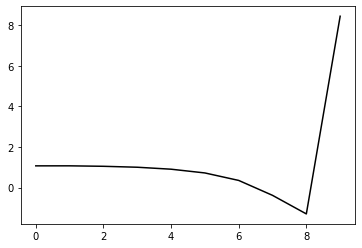

311300 0.2471192797342939
0.24836091894123938 -0.1956350393551951 -0.19340195371792554 -0.12731218092824975
[ 1.094919    1.03812099  1.00400324  0.95752918  0.86481454  0.68339261
  0.31862047 -0.41190246 -1.32247275  8.43732707]


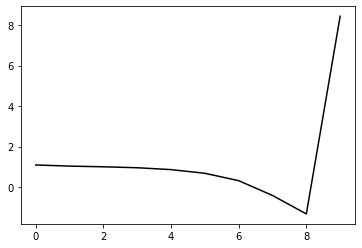

312400 0.1767446194327854
0.2523226231559489 -0.1962807632427257 -0.19543490607202443 -0.12435398223875184
[ 1.07802496  1.11878878  1.1076477   1.06082999  0.97018715  0.79051376
  0.42687485 -0.30215717 -1.21326815  8.46601203]


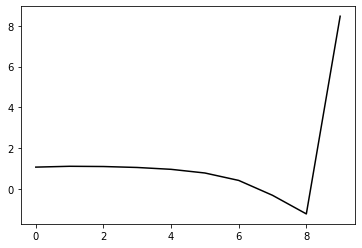

313500 0.23102697255235846
0.24965228237636375 -0.19636798780826453 -0.19475281390298155 -0.1262877457766436
[ 1.06571294  1.11728286  1.11330879  1.07426192  0.98622304  0.80883429
  0.44761126 -0.27822309 -1.18621997  8.4639474 ]


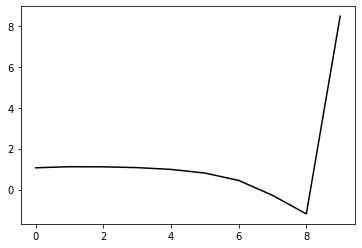

314600 0.2175125501326481
0.25069776369218516 -0.19723200831936566 -0.19630556417907224 -0.12040825892227079
[ 1.04185646  1.02197978  1.00383227  0.95484559  0.85436164  0.66424759
  0.29091637 -0.44620976 -1.36625822  8.43625842]


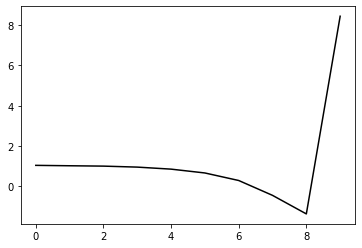

315700 0.21995966078912133
0.24894164531950955 -0.1968907077031095 -0.19558486637357064 -0.1227060552219344
[ 1.06379195  0.98390427  0.97340697  0.93174446  0.8365766   0.65080905
  0.28238482 -0.44838731 -1.36116233  8.41893948]


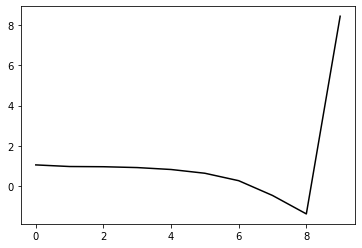

316800 0.1870144437802898
0.24825070226071663 -0.19743372040197785 -0.19601268970080898 -0.12367798794715885
[ 1.04582242  1.04689746  1.01248371  0.97048844  0.88081941  0.69932827
  0.33517023 -0.390006   -1.29670061  8.47921075]


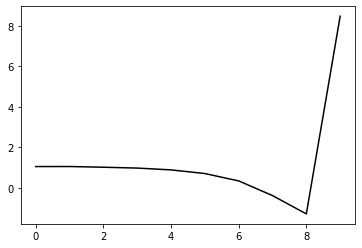

317900 0.22001446341151187
0.25039830346204345 -0.19764172884211523 -0.19707095172396205 -0.12228936455163834
[ 1.03828285  1.04890476  1.02059182  0.97568627  0.88660934  0.70656696
  0.3433744  -0.37998787 -1.28517623  8.43141331]


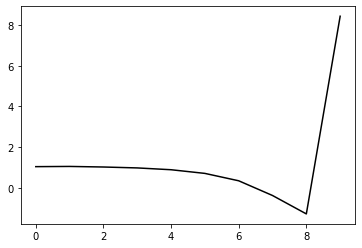

319000 0.16779816089064223
0.2531810200303645 -0.19575378783136096 -0.1966249373249976 -0.12184680148857054
[ 1.05264755  1.08543697  1.0743308   1.02973281  0.93822337  0.75533647
  0.38805704 -0.33954432 -1.25052845  8.4476258 ]


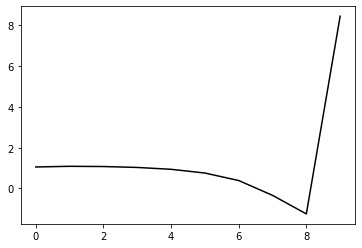

320100 0.19167436933621643
0.25210371508604795 -0.1950498939148603 -0.19614190013044666 -0.12194909968472391
[ 1.07050665  1.09411468  1.11285907  1.07763401  0.98149775  0.79271023
  0.42061857 -0.30947932 -1.22188559  8.40139747]


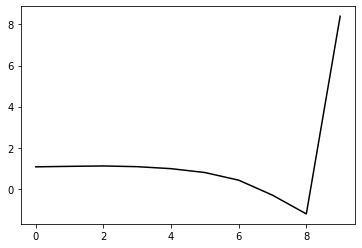

321200 0.13082102441306726
0.2504364708266648 -0.19256411586954336 -0.1938650633690263 -0.12372683400222478
[ 1.06529362  1.09815273  1.08103526  1.03895824  0.93942936  0.74463218
  0.36743374 -0.36530746 -1.27866643  8.45377918]


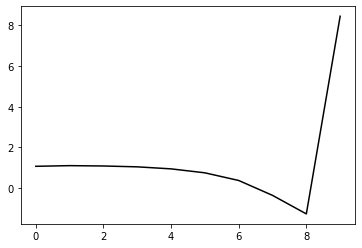

322300 0.2500615345362858
0.2509563028743058 -0.19091462396859177 -0.1927548260892555 -0.12454395189035636
[ 1.09010353  1.09926652  1.08161228  1.03671185  0.93900956  0.74544371
  0.36918144 -0.36132327 -1.27153868  8.41967082]


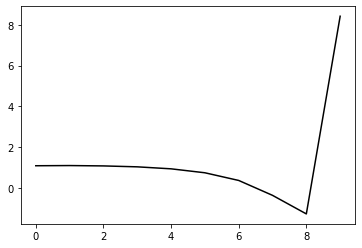

323400 0.20983207831192094
0.24613147142696712 -0.19904334646580896 -0.19803037642182744 -0.12013363378843561
[ 1.0829538   1.01956018  0.99973551  0.94830398  0.8426704   0.64188451
  0.25916249 -0.47528634 -1.38690127  8.42866947]


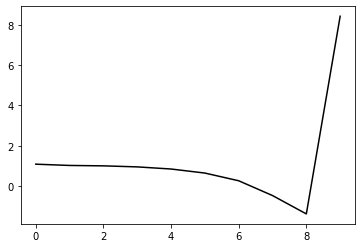

324500 0.23855936225049568
0.25162793915230075 -0.19494652541218213 -0.19610353851532558 -0.12384345688427888
[ 1.05715005  1.17574629  1.16292481  1.11777116  1.01934821  0.82482707
  0.4474353  -0.28155043 -1.18775679  8.4485573 ]


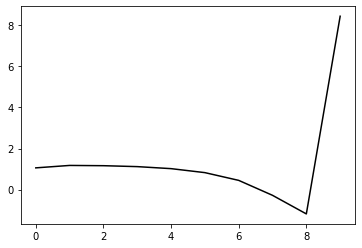

325600 0.2105305369189718
0.25401253304653204 -0.19099215702286912 -0.19392709518304524 -0.12355778837235419
[ 1.05120152  1.13945991  1.13998683  1.09310244  0.98834409  0.78695856
  0.40218265 -0.33398587 -1.24807124  8.47221381]


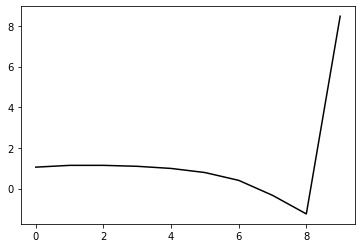

326700 0.21722476027802357
0.24854982456699057 -0.19022406404167588 -0.19210381704268129 -0.12358063257223019
[ 1.07728106  1.04392858  1.00554089  0.95354243  0.84574008  0.64155497
  0.25505053 -0.48079725 -1.39230385  8.42078293]


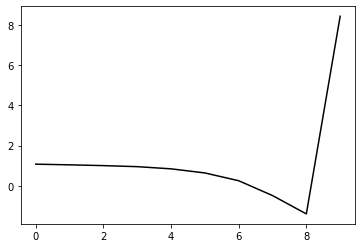

327800 0.20070483557614993
0.2501892700912057 -0.19345372838602187 -0.1951772336206236 -0.1230144921820219
[ 1.05378227  1.05921705  1.02897514  0.97758104  0.87214987  0.66944012
  0.28375143 -0.4502165  -1.35819187  8.432434  ]


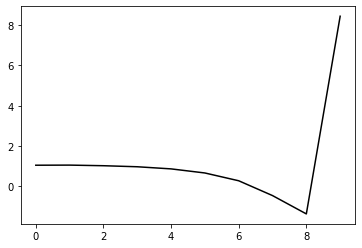

328900 0.21023745021105958
0.25160616045140183 -0.19811320525901813 -0.19941437165535977 -0.12198543353315554
[ 1.03287942  1.0847175   1.06427677  1.02502452  0.93351752  0.7435405
  0.36880336 -0.35396539 -1.24933385  8.42528428]


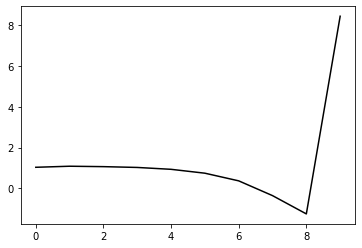

330000 0.4487954239168485
0.24617453962946056 -0.18996945857574218 -0.19167634871539393 -0.1297929091133099
[ 1.1686952   1.05778013  1.04806911  0.99939391  0.90542956  0.7151242
  0.33944652 -0.38387989 -1.27942332  8.4616863 ]


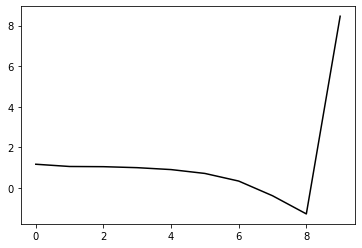

331100 0.18676068102961288
0.24973270646992857 -0.19405662992510936 -0.19558295181798585 -0.12486515676487453
[ 1.08772297  1.10405242  1.04658528  0.97347827  0.86428705  0.66469103
  0.28289298 -0.44402716 -1.34116947  8.42947023]


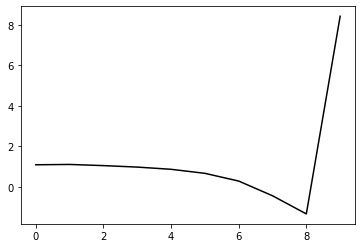

332200 0.14570937557769723
0.24951458216700573 -0.19061175333063218 -0.19304851270530327 -0.12460119219977554
[ 1.04463596  0.98143438  0.95822168  0.87632484  0.7493384   0.53680078
  0.14471198 -0.59073666 -1.49525828  8.42841781]


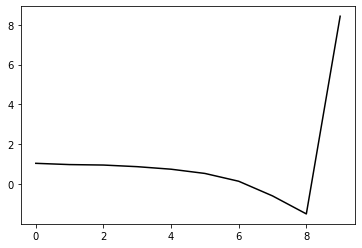

333300 0.27665200440447124
0.25331359200390496 -0.18935432829294535 -0.19294175828451945 -0.12699466632512668
[ 1.10324234  1.13570247  1.12553322  1.06119304  0.93968603  0.72941951
  0.33909829 -0.39527161 -1.29945756  8.45075801]


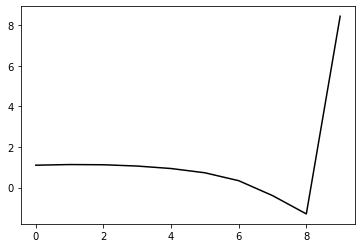

334400 0.17578543208036593
0.2548449952299328 -0.19192924320531657 -0.19546292137632418 -0.124300900580172
[ 1.04318475  1.102954    1.09387261  1.03554177  0.91228234  0.69675178
  0.30255037 -0.43365621 -1.33730246  8.4276729 ]


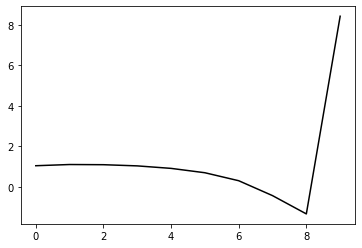

335500 0.3236304928478231
0.2584715645202874 -0.1877568286636121 -0.19325905639020155 -0.12585164405040586
[ 1.10256697  1.11741556  1.15538525  1.11711124  1.00369577  0.79139558
  0.39877819 -0.33605656 -1.23843936  8.44859754]


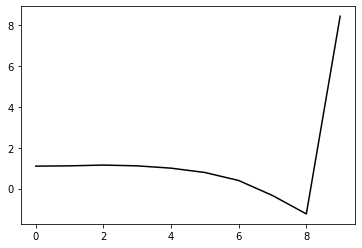

336600 0.2162613786634148
0.2553656441417499 -0.19416132426887292 -0.19750357431398782 -0.12448251640346308
[ 1.03297185  1.08263768  1.09021029  1.05734654  0.94972567  0.73900379
  0.34763065 -0.38440849 -1.28172059  8.45837899]


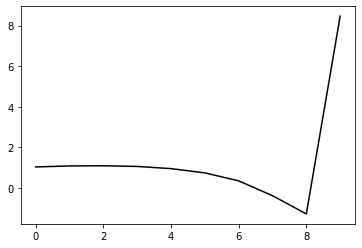

337700 0.21917535288078127
0.2542115783538361 -0.19643685142502967 -0.19937923018534373 -0.12223331260766605
[ 1.04820637  1.10073551  1.09834918  1.06622398  0.9650614   0.75733822
  0.36710114 -0.36381062 -1.25978351  8.43202396]


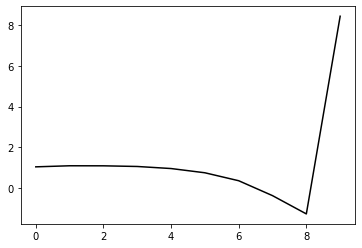

338800 0.19215480431605447
0.25399767420004254 -0.19351511570990762 -0.19744992618002438 -0.12309207780649419
[ 1.03535645  1.12493106  1.13611993  1.10318381  1.00353236  0.79521747
  0.40153437 -0.33344762 -1.23421123  8.46037271]


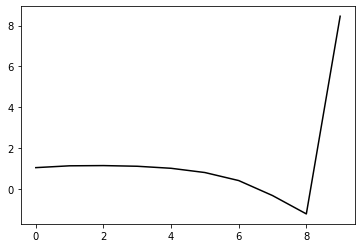

339900 0.2185652185049103
0.2508851413306305 -0.19726714691554922 -0.19940441446687546 -0.12054811929366635
[ 1.05555132  1.07387753  1.04396836  0.99834903  0.89073519  0.67525265
  0.27467392 -0.46519464 -1.36801557  8.41303451]


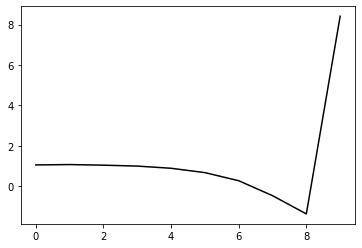

341000 0.20903856700862639
0.2528209433827039 -0.193332607049696 -0.19694841787653014 -0.12178174077431887
[ 1.10361343  1.00874069  1.01913033  0.97358641  0.8678103   0.65454994
  0.25451436 -0.48504313 -1.38722266  8.45124753]


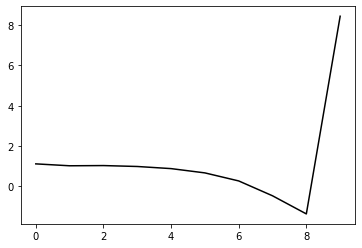

342100 0.19211186489955337
0.2542766018221385 -0.19221017376966523 -0.19666010061106665 -0.12215799674737567
[ 1.07042475  1.10422541  1.11012606  1.07024016  0.96636779  0.75429522
  0.35353385 -0.38711891 -1.28996363  8.41096824]


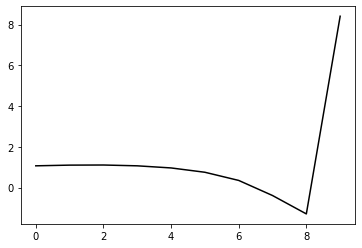

343200 0.1555818081373582
0.25015130814841013 -0.1914051867840971 -0.19515774921928486 -0.12462436631842218
[ 1.09051643  1.08199701  1.06300608  1.02628185  0.92910156  0.7233373
  0.32735277 -0.40835266 -1.30436291  8.45475032]


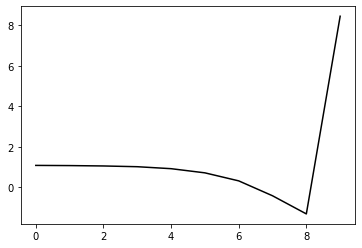

344300 0.26918717822205096
0.25323415065107935 -0.19020844951691793 -0.19499638377548564 -0.12545229531348104
[ 1.10671962  1.1677699   1.17189592  1.13713649  1.04597178  0.84693536
  0.45488927 -0.27866709 -1.17309256  8.44193919]


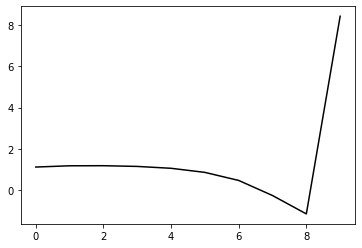

345400 0.16948305509634495
0.2541967061830977 -0.191158006274512 -0.19624125476923665 -0.1229927851648356
[ 1.03624638  1.1557155   1.14177466  1.09945352  1.00215059  0.79943166
  0.40355063 -0.33357116 -1.22947687  8.45504315]


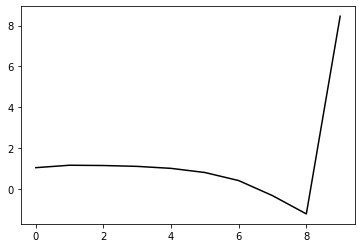

346500 0.2568469627807844
0.2589211632825335 -0.18905384261703104 -0.19602839055750404 -0.12164920134185078
[ 1.05148274  1.14509822  1.1708562   1.13683285  1.04252617  0.84298569
  0.44866344 -0.28880554 -1.18530934  8.46776027]


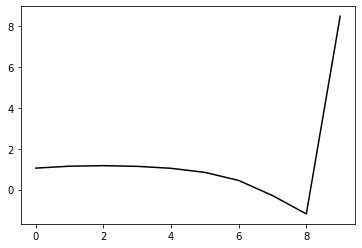

347600 0.22314119784848607
0.23475067712652004 -0.19779369625058324 -0.19708830635579822 -0.1219359943413998
[ 1.07658202  0.82850109  0.82744743  0.79247636  0.69082704  0.4834693
  0.0814954  -0.66408001 -1.56858642  8.41484069]


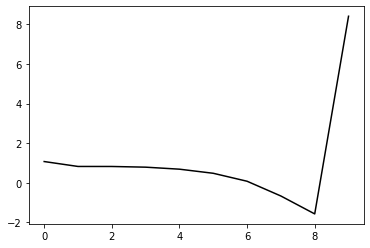

348700 0.22292034425385746
0.2512446142597278 -0.19353582520902357 -0.1974347486671868 -0.12103270348269969
[ 1.05508969  1.07686983  1.04710826  1.0056773   0.90227784  0.69145013
  0.28513713 -0.4654592  -1.3751223   8.40682172]


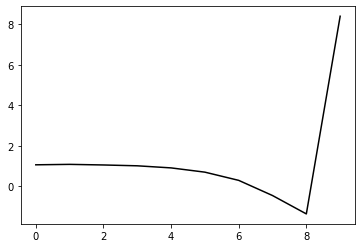

349800 0.1948984090934174
0.2503834499171135 -0.19300798940093158 -0.19679271309700153 -0.12280843223016015
[ 1.0587191   1.05550034  1.04247271  1.00207127  0.90315902  0.69709258
  0.29534748 -0.45054814 -1.35381421  8.44297166]


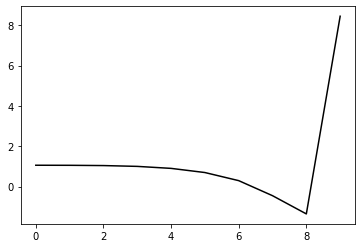

350900 0.22693123502967577
0.25454457391872226 -0.1894877303435951 -0.19532987257287734 -0.12354709490479948
[ 1.04596028  1.08996206  1.10992919  1.07590674  0.98116054  0.77910117
  0.38012341 -0.36420261 -1.26576619  8.44176441]


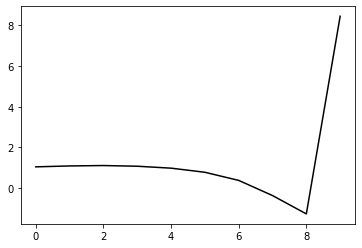

352000 0.1751994124357916
0.2539021519396727 -0.19276492326706463 -0.19778000159787712 -0.1228091959302595
[ 1.07700572  1.04597262  1.04533701  1.01670048  0.92830351  0.73257227
  0.34010393 -0.39744393 -1.28974904  8.4533632 ]


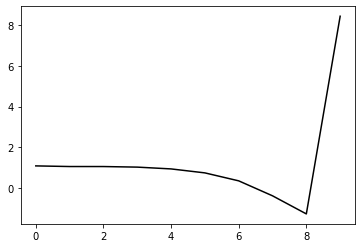

353100 0.2169137444483361
0.2514015008453364 -0.18944287873183183 -0.19453873757886941 -0.1260716171917573
[ 1.11681841  1.07271529  1.0829237   1.05587822  0.97142541  0.78019146
  0.39178155 -0.3420684  -1.2292463   8.45771644]


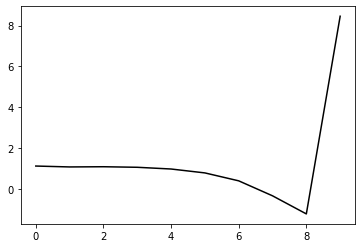

354200 0.13468728399868338
0.25022642175112786 -0.19329986975799307 -0.19702923359060417 -0.12408333555951859
[ 1.06081978  1.05204395  1.01388509  0.97593858  0.88581522  0.69125548
  0.30081465 -0.43388316 -1.31888445  8.46848328]


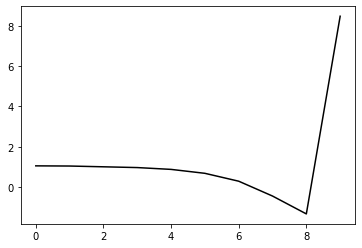

355300 0.277083780899215
0.2519209837565162 -0.19148805742912495 -0.19667108787886511 -0.12193408501743747
[ 1.05390853  1.01393698  0.98667779  0.93713766  0.83932283  0.63798017
  0.23978096 -0.50435015 -1.40040913  8.40287082]


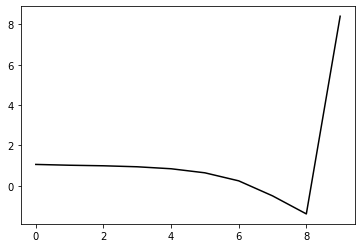

356400 0.22126728399725384
0.24625973983515004 -0.19074995727075372 -0.19473524899624367 -0.12313237489223203
[ 1.07810193  1.00513691  0.95437774  0.89338632  0.78645909  0.57967226
  0.17802418 -0.56821786 -1.46442619  8.4525181 ]


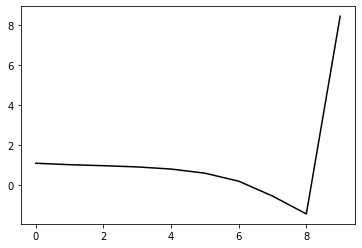

357500 0.24969640823008787
0.257467784184998 -0.18693283663529187 -0.19460801324552804 -0.12399300526533394
[ 1.03653895  1.179579    1.15302008  1.0836859   0.96755941  0.75334135
  0.34493349 -0.40811872 -1.31091603  8.41920264]


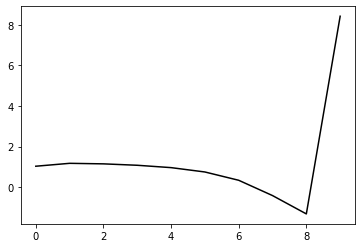

358600 0.20847710173604939
0.2597390049258654 -0.18625943163392458 -0.1947908716115642 -0.12335347466876669
[ 1.07820343  1.06147081  1.09022484  1.03636606  0.91774106  0.70120259
  0.29190565 -0.46154417 -1.36317212  8.44750605]


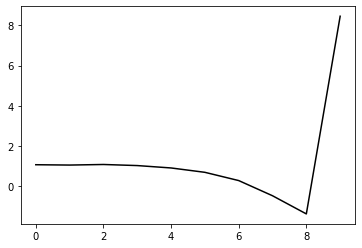

359700 0.22217674110091465
0.2548779368695857 -0.18853385716044457 -0.195236434828147 -0.12322833474108075
[ 1.0572777   1.01573626  1.00703718  0.96229318  0.84624808  0.62980035
  0.22150486 -0.53051418 -1.42958383  8.42034117]


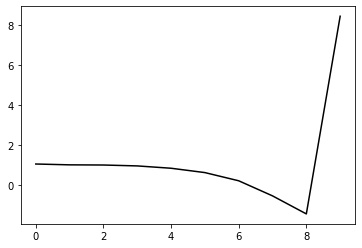

360800 0.20580315401216237
0.2580401888423636 -0.1889759585993418 -0.1964298236139521 -0.12407351410836728
[ 1.0687205   1.0465582   1.05144075  1.01413132  0.90731176  0.69595864
  0.29240951 -0.4548365  -1.34794346  8.42883451]


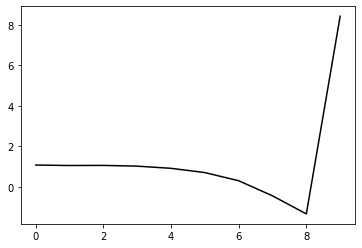

361900 0.20437465763229914
0.2576508872673202 -0.19382505250716567 -0.20017748727747742 -0.12340894125973753
[ 1.01880173  1.09010402  1.06943502  1.03654033  0.94162435  0.7393601
  0.34431392 -0.39388679 -1.27561761  8.4516482 ]


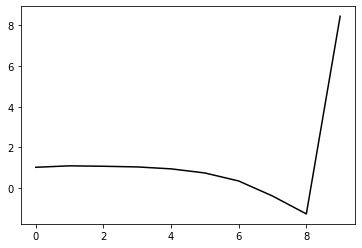

363000 0.16763657809109309
0.2564500573746426 -0.19175775582258014 -0.1985048707178409 -0.12392578717770315
[ 1.05256391  1.05720587  1.03025409  0.98719157  0.89242416  0.69075416
  0.29469538 -0.4453852  -1.32897313  8.45495239]


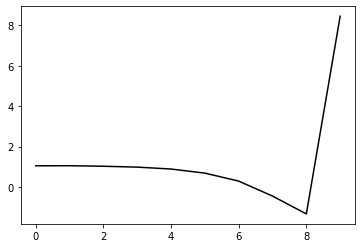

364100 0.1811827393439682
0.25622452568759335 -0.1903460910146974 -0.19755724991365253 -0.1249653533370727
[ 1.08818529  1.08168507  1.06222088  1.01847744  0.92682264  0.73158237
  0.34108467 -0.39434993 -1.27292229  8.43361226]


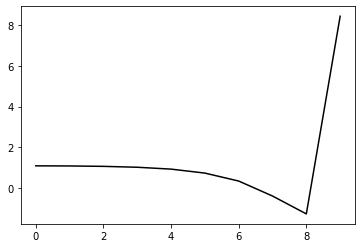

365200 0.12782898809535562
0.2559230104070621 -0.1880262994696797 -0.19577705344971683 -0.12548654578477977
[ 1.05764781  1.07072445  1.06586595  1.02185746  0.92143322  0.71874007
  0.32039378 -0.424021   -1.31238862  8.44716863]


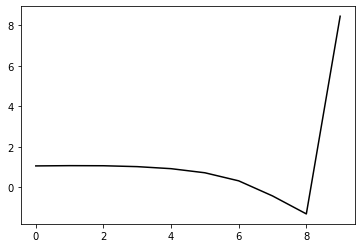

366300 0.3017130719389428
0.2553975580897491 -0.1854178287284198 -0.19391681125718574 -0.1263065075032517
[ 1.12707787  1.09318683  1.07987051  1.04104739  0.9477033   0.75109108
  0.35786219 -0.38327013 -1.26927239  8.42109668]


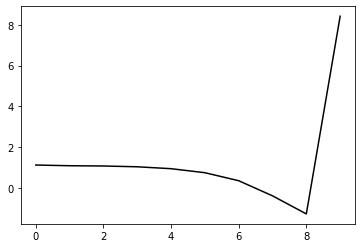

367400 0.15411449084236184
0.26036355076244466 -0.18785758288302573 -0.19731788258292648 -0.1226756724378786
[ 1.06595091  1.16592605  1.15995827  1.11055119  1.01254613  0.81308063
  0.417214   -0.32688949 -1.21495686  8.44485832]


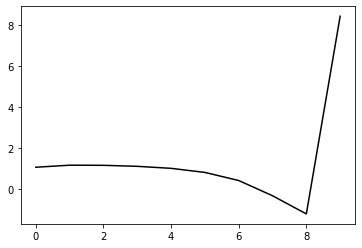

368500 0.23504436655601804
0.25765386748505287 -0.19032465360761797 -0.19835895350284152 -0.1252498610933781
[ 1.09254989  1.16888213  1.14413758  1.10376983  1.01529895  0.82749859
  0.44417919 -0.28707373 -1.16040652  8.47194303]


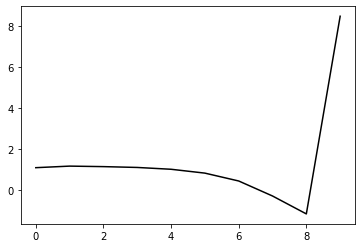

369600 0.2158665562186292
0.2582279118442335 -0.18993691813967709 -0.1990134464055984 -0.11997178563586987
[ 1.07876105  0.99411729  0.99301596  0.94509672  0.84491539  0.64775624
  0.25652761 -0.48276731 -1.36459489  8.39446919]


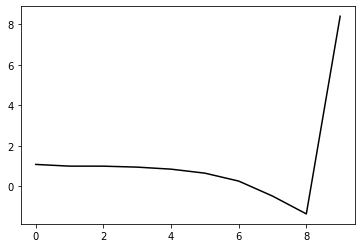

370700 0.2722628311993306
0.25635320452643123 -0.18378129208184316 -0.19375350758651855 -0.12482766135322095
[ 1.11411683  1.11698085  1.09462226  1.04937508  0.95060335  0.75316744
  0.36129028 -0.38013485 -1.26558646  8.4158889 ]


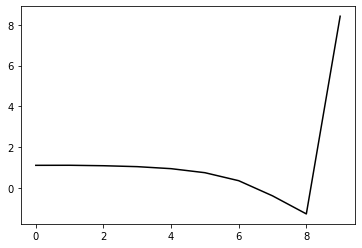

371800 0.19332563214223372
0.260577411108784 -0.18703081067050506 -0.19753626511823885 -0.1202117341274748
[ 1.06118742  1.06064968  1.03155805  0.97370672  0.86728036  0.66380645
  0.26767071 -0.476746   -1.36337346  8.44089596]


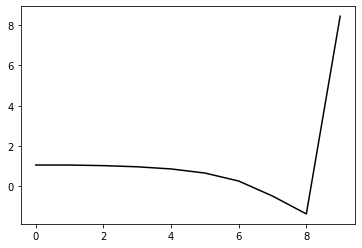

372900 0.23013264371286454
0.25559056137629405 -0.1893714566480191 -0.19813948907226464 -0.12201562561386585
[ 1.08619449  1.00765222  1.01115024  0.96657858  0.86734918  0.67063621
  0.28123275 -0.45669322 -1.33617537  8.40658102]


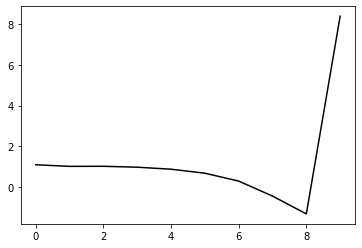

374000 0.18192935486703854
0.25681533586341493 -0.19041689924385544 -0.1993153349552574 -0.12252997160719033
[ 1.09430557  1.04479093  1.03236995  0.99215307  0.89664197  0.7028197
  0.3168224  -0.41755481 -1.2929327   8.42927394]


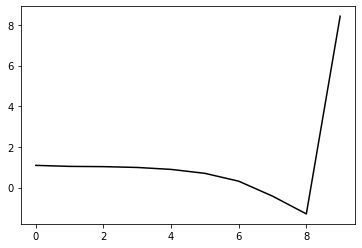

375100 0.1877642310410564
0.2538214240734927 -0.18932963329876726 -0.1978809924748729 -0.12512759596725986
[ 1.12862818  1.06411918  1.05168767  1.01786758  0.9319198   0.74720658
  0.37037333 -0.35505871 -1.22115855  8.44762416]


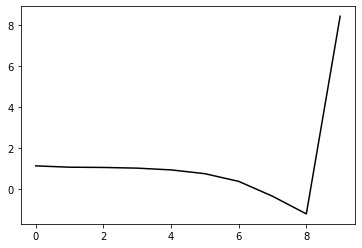

376200 0.16795625209535117
0.25464829705664227 -0.18919826979932072 -0.19854905708966541 -0.1210315088320476
[ 1.02543959  0.99096873  0.95503432  0.89958961  0.79439885  0.59278854
  0.20085482 -0.53864395 -1.41831979  8.44900347]


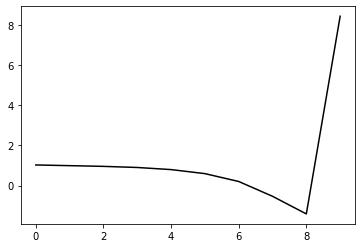

377300 0.24851100686272914
0.2557085769196646 -0.18558779174968187 -0.19569240743717278 -0.12484360899787623
[ 1.09515723  1.10292955  1.07929444  1.02382771  0.9189921   0.71773788
  0.326075   -0.41332373 -1.29288896  8.42336094]


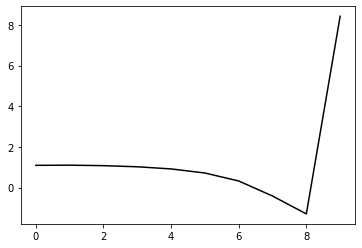

378400 0.18034472729070225
0.25542625043758493 -0.19070264541709858 -0.19936108438901154 -0.12364807070116686
[ 1.0552604   1.10862527  1.0684345   1.01262894  0.90957404  0.71189071
  0.32573119 -0.40609632 -1.27484432  8.42895394]


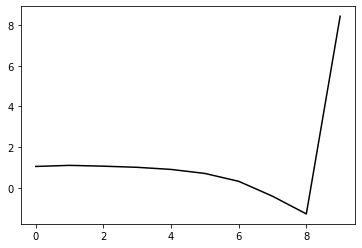

379500 0.25673939351520536
0.252267223990361 -0.19477865968824568 -0.20223307679153463 -0.12689002924902765
[ 1.12177314  1.0907028   1.08035431  1.0427749   0.95948654  0.7819889
  0.41562621 -0.29708068 -1.14667451  8.49305188]


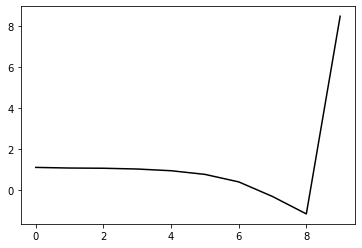

380600 0.21714890468276968
0.25595270991536856 -0.18861107643310443 -0.1992284623223394 -0.12287312562354882
[ 1.07663391  1.09769497  1.07220985  1.01839667  0.91895921  0.72590356
  0.34375324 -0.38624084 -1.25627276  8.49856629]


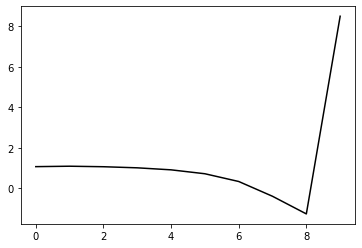

381700 0.21145737754455668
0.2523742732238565 -0.18975687886827122 -0.19919160908123332 -0.12530941954961747
[ 1.09668443  1.12402814  1.09873667  1.04011601  0.93369276  0.73448443
  0.34741882 -0.38641388 -1.2590383   8.44451726]


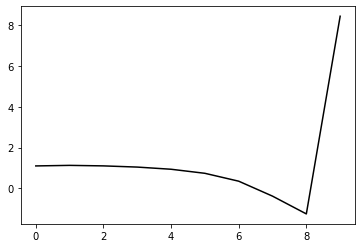

382800 0.18413038584489497
0.2530007515963736 -0.18959857948812156 -0.19952787602866137 -0.12340852762205966
[ 1.05580232  1.09670951  1.06965134  1.0119273   0.90035951  0.69625803
  0.3058292  -0.43031523 -1.30429188  8.44503509]


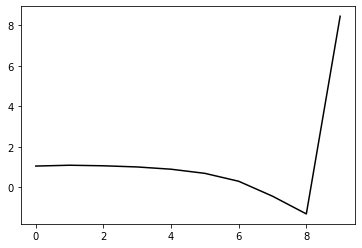

383900 0.2310208257476034
0.2548890552878411 -0.18764703662272444 -0.19867092217088747 -0.12439360983032433
[ 1.07183392  1.12442487  1.11948788  1.07014985  0.96511379  0.76529115
  0.37904901 -0.35316204 -1.22364755  8.42880458]


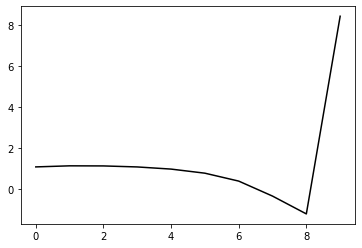

385000 0.19052551197145817
0.25341693216458294 -0.190803452323792 -0.20109636882288348 -0.12282237965421532
[ 1.10470582  0.99609425  0.97660766  0.93414378  0.83582178  0.64139102
  0.26180979 -0.46216297 -1.32263005  8.44164412]


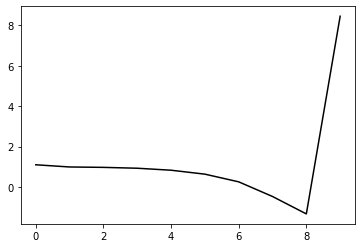

386100 0.2802535299018295
0.253623362301389 -0.1823776466127801 -0.19485133861514406 -0.12652813382284325
[ 1.12442655  1.11177326  1.09812303  1.04636002  0.94136113  0.73778966
  0.34666529 -0.39074102 -1.267519    8.42636204]


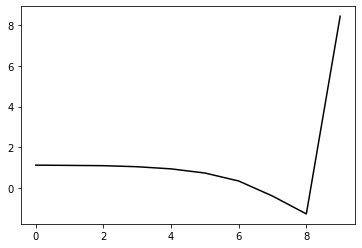

387200 0.2766654895917671
0.26300496245732535 -0.1853587314635941 -0.19959218971978213 -0.11943196559079064
[ 0.98381595  1.06927321  1.06998311  1.00723156  0.88675992  0.66961163
  0.26683906 -0.47994051 -1.36423496  8.47907822]


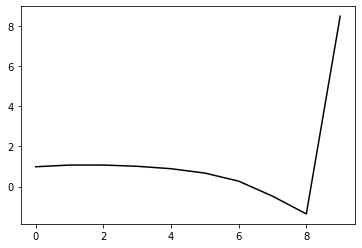

388300 0.29242539761676595
0.256531601393982 -0.1899252950765852 -0.2016328353763219 -0.1172292558100608
[ 1.03378889  0.96220379  0.93202819  0.86875986  0.74457757  0.52294843
  0.11618628 -0.63389957 -1.52097272  8.38408461]


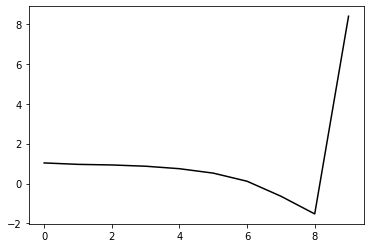

389400 0.20185599215127975
0.2593089318319349 -0.18549059237977505 -0.19819164035343823 -0.12325917973443178
[ 1.02215835  1.07570136  1.04958445  0.984724    0.86141074  0.63967699
  0.23335353 -0.51478518 -1.39792379  8.46649843]


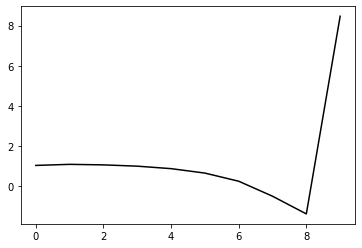

390500 0.24531879091661796
0.26089154226172945 -0.18822744888864062 -0.20101090215652384 -0.12064500712410582
[ 1.04734412  0.98290671  0.97634858  0.9185015   0.79928283  0.58032358
  0.17652343 -0.56826103 -1.44685458  8.41598606]


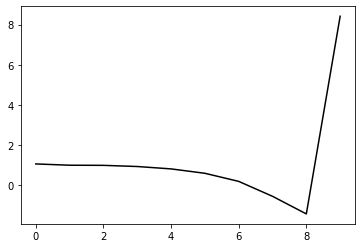

391600 0.21861002894387305
0.25579689782720383 -0.18458184716941206 -0.19664437462970488 -0.1274022911367488
[ 1.1152952   1.0486213   1.0391315   0.99419322  0.88651132  0.67693761
  0.2819869  -0.45282377 -1.31925888  8.46581539]


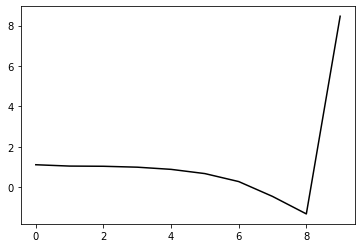

392700 0.22802465026362062
0.25776009938880734 -0.18641190610054809 -0.19866713069891856 -0.1229103530977725
[ 1.08551234  1.02768649  0.99171691  0.92459033  0.80053249  0.57467267
  0.16360023 -0.58558383 -1.46457068  8.39412435]


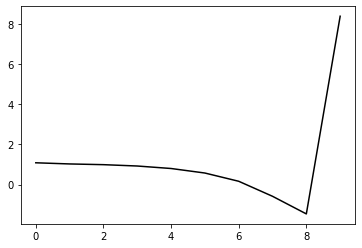

393800 0.19517234702431585
0.25888883727681283 -0.1887680502900619 -0.20078516521011744 -0.12346119780189257
[ 1.04339423  1.10938785  1.08278052  1.02890638  0.91646435  0.70166214
  0.30037257 -0.43842372 -1.30497038  8.43915502]


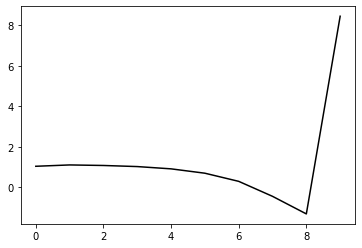

394900 0.23692120142803944
0.25796477138794316 -0.19503532740452612 -0.20557805518109015 -0.11996468442695517
[ 1.04145735  0.99351414  0.96145087  0.90291749  0.78799262  0.57261582
  0.17220003 -0.56313574 -1.42249476  8.41789517]


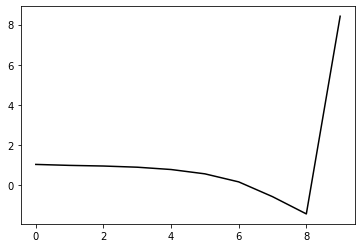

396000 0.2534980862655614
0.2605015685386024 -0.18476049913317427 -0.19768000010000306 -0.12502831510904955
[ 1.12516626  1.00858569  0.9925816   0.91859842  0.78977492  0.56088199
  0.14656487 -0.60256314 -1.4758903   8.43589125]


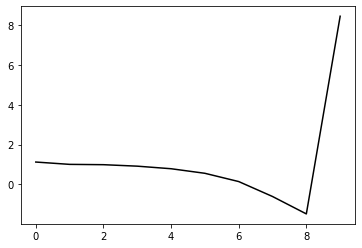

397100 0.1761683664996927
0.2642088974339073 -0.18444562097475437 -0.19795306463113574 -0.1254235297812355
[ 1.0818289   1.13101098  1.11568557  1.03666965  0.89671693  0.65673738
  0.23174585 -0.52729275 -1.40990258  8.42038414]


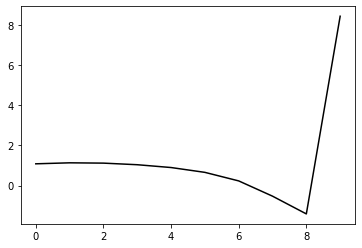

398200 0.12525836473283972
0.26960373875275623 -0.17974949823771838 -0.19564395355079878 -0.12492663799067086
[ 1.04884281  1.13826632  1.1742552   1.10782971  0.95925244  0.70660712
  0.26831641 -0.50412863 -1.40064083  8.43824563]


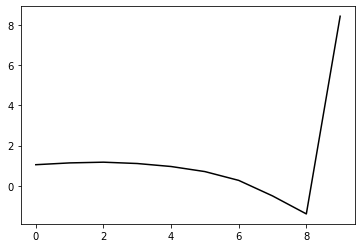

399300 0.24608039620425431
0.2605137666458084 -0.1845085655245481 -0.1971640067209986 -0.12617623149042304
[ 1.10101724  1.08634519  1.09195118  1.04244442  0.90212458  0.65198462
  0.21628422 -0.5516721  -1.44018091  8.39246266]


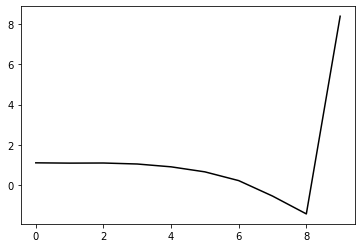

400400 0.1525252523937217
0.2669920867559572 -0.18426146178207814 -0.19847939587738572 -0.12607997876337756
[ 1.06885874  1.19801884  1.2282869   1.19267769  1.06498995  0.81997641
  0.38694081 -0.37815492 -1.26259309  8.45699979]


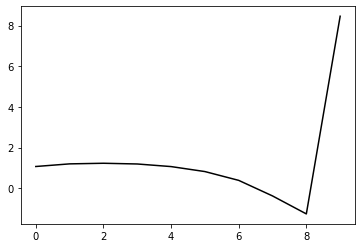

401500 0.36744495739483096
0.2658531265253738 -0.1820126443517782 -0.1967620917780236 -0.12795335291554738
[ 1.12698782  1.13520767  1.18106347  1.16273215  1.04988474  0.81213614
  0.3820281  -0.38126654 -1.26416037  8.44482851]


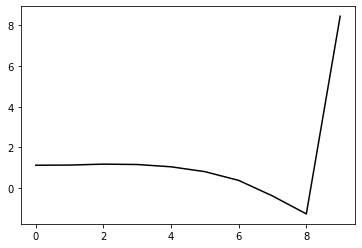

402600 0.22386117632260916
0.26109784451736545 -0.19186656509980657 -0.20412516300134398 -0.11985132928753979
[ 1.08034455  1.01166817  0.98642039  0.95775386  0.84876225  0.61201277
  0.18057871 -0.58332159 -1.46475724  8.44026835]


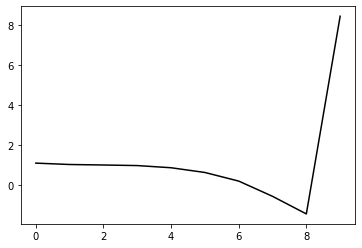

403700 0.22007882309334198
0.2611472063962319 -0.18644716938551611 -0.1995842927050557 -0.1245683551258219
[ 1.11376074  1.08612386  1.07324854  1.03401101  0.92875538  0.69621935
  0.26445128 -0.5003945  -1.38130469  8.40499247]


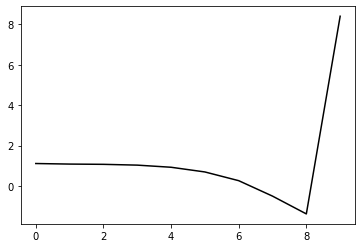

404800 0.20311159604539955
0.2603180247918715 -0.1935051604344324 -0.20555743138297383 -0.11882850194362651
[ 1.06841326  0.95585709  0.95525529  0.9098407   0.7973091   0.56097074
  0.12293948 -0.64848402 -1.53399502  8.40459429]


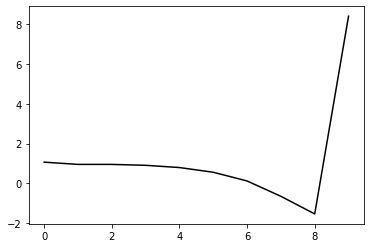

405900 0.23234093101966158
0.2543400748394339 -0.19313444763539206 -0.2038992370216923 -0.12560052913801717
[ 1.11351987  1.0450921   1.04162288  1.01354248  0.92003071  0.70311137
  0.28153365 -0.47494095 -1.34409842  8.42465669]


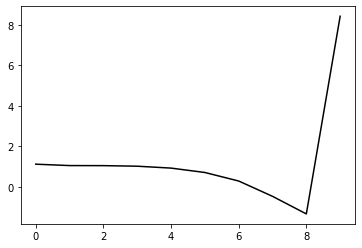

407000 0.1745544052761045
0.2594279741726452 -0.19029165811085455 -0.2030508650648117 -0.12609254627676184
[ 1.09099812  1.10680879  1.12179476  1.0938829   1.00205759  0.78803616
  0.36667132 -0.39230362 -1.26563165  8.40973846]


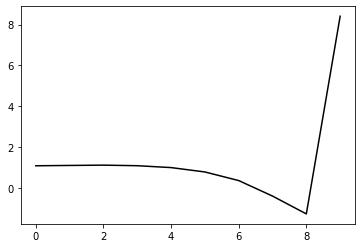

408100 0.18868583528506702
0.25826999415982144 -0.19012748274677224 -0.20274898754284487 -0.12736080348502005
[ 1.12534669  1.13661051  1.15958851  1.14451287  1.06387028  0.86256543
  0.45196618 -0.29864381 -1.16380525  8.43352055]


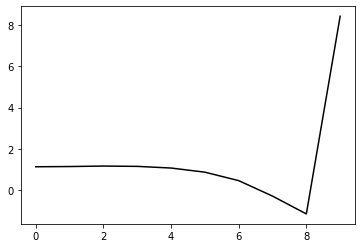

409200 0.12851067448844578
0.26271773186965447 -0.18162623116627533 -0.1975977426639585 -0.12559137725518918
[ 1.05309116  1.14345416  1.16989989  1.13527979  1.02822542  0.80119615
  0.36414612 -0.41459434 -1.30824702  8.41505175]


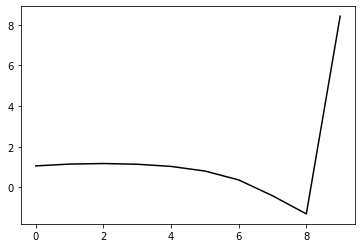

410300 0.31215446918625933
0.2566223439580865 -0.18406683667834622 -0.19811903345562504 -0.12892148806435902
[ 1.12562585  1.13578302  1.17349932  1.16585913  1.08043675  0.87265683
  0.45332904 -0.31008304 -1.18816453  8.46356858]


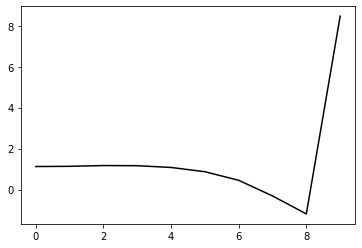

411400 0.16368884564519118
0.25796697075829994 -0.18783305785513388 -0.2017111512070593 -0.12582500017687553
[ 1.03689297  1.1848394   1.18932399  1.17482883  1.09420219  0.89052972
  0.4740173  -0.2884505  -1.16489347  8.41433347]


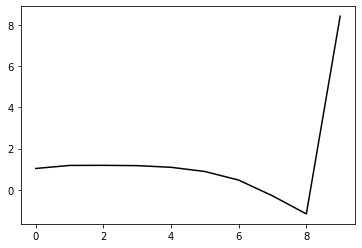

412500 0.2519643143393719
0.25968068903361313 -0.18655806854418597 -0.20086537405242685 -0.12444316300544557
[ 1.05588504  1.13505741  1.13418454  1.09926907  1.00669625  0.7950432
  0.37118291 -0.39830637 -1.2783917   8.44660989]


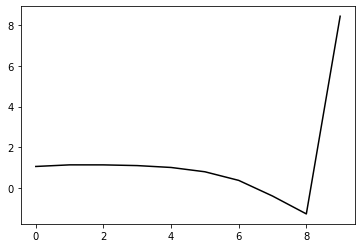

413600 0.21223909914334177
0.25828849209266896 -0.1859053727648222 -0.20043633574501493 -0.12335073736778575
[ 1.05736792  1.0808315   1.09145888  1.05334863  0.95177446  0.73317069
  0.30150863 -0.47843597 -1.36983998  8.42412601]


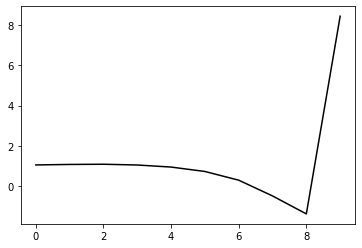

414700 0.22036750220809337
0.25864375696927766 -0.18650940822490303 -0.2014045664700761 -0.12166397950541899
[ 1.04663756  1.08255073  1.092079    1.0637966   0.96901687  0.75747171
  0.33274866 -0.44238938 -1.32937105  8.40927324]


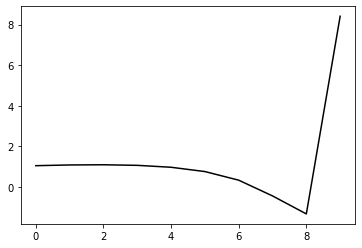

415800 0.21266275619457511
0.25825271287567475 -0.18237706548890356 -0.19837497813647792 -0.12371744503121626
[ 1.09098072  1.06453462  1.08625447  1.06556431  0.97871944  0.77459681
  0.35632793 -0.41519665 -1.29895819  8.44817284]


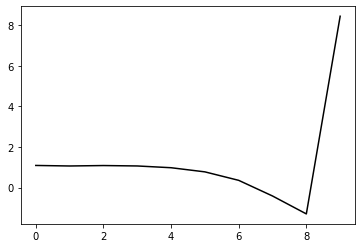

416900 0.20676477128819604
0.2603586580367386 -0.18542592713254546 -0.20139292804150843 -0.12212718092537053
[ 1.01540887  1.13068736  1.12501903  1.09819587  1.01354275  0.81367781
  0.40091934 -0.36574279 -1.2430891   8.44438453]


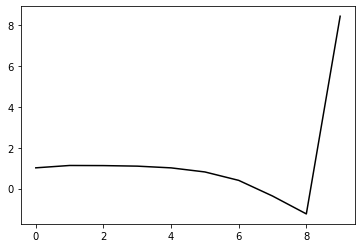

418000 0.30683554242797856
0.2539185660532082 -0.18042973958678338 -0.19608934503784808 -0.1272386295581637
[ 1.15386309  1.00758385  1.01508329  0.98505964  0.89784791  0.69722566
  0.28364049 -0.48544151 -1.3654595   8.45380753]


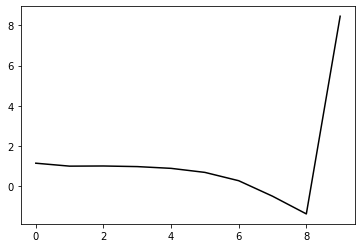

419100 0.1873261279551218
0.2532236387078747 -0.1870343445905093 -0.2009906997581157 -0.12392807711649757
[ 1.1010903   1.08922007  1.06606282  1.02536495  0.93146991  0.7256439
  0.30755755 -0.46612592 -1.35022514  8.38170814]


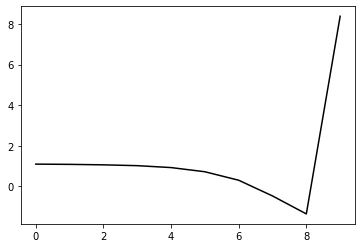

420200 0.15577338802450227
0.24921787836838305 -0.1841283436896364 -0.19822038689926214 -0.12326979416600437
[ 1.08468894  0.98868716  0.96351557  0.90819832  0.79918772  0.5803843
  0.14974981 -0.6380302  -1.53827351  8.41711276]


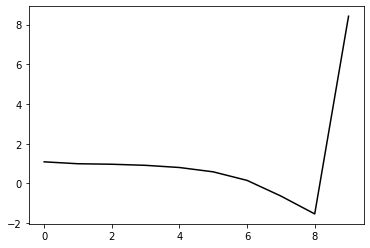

421300 0.24654242825138448
0.2508859020944081 -0.18317433396052624 -0.1976488735246766 -0.1250934319468145
[ 1.09513633  1.04231542  1.00716411  0.95156659  0.84341036  0.62709507
  0.19995082 -0.58457611 -1.48063117  8.39995114]


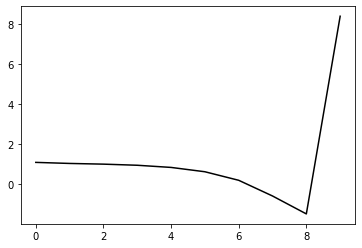

422400 0.21342382058963322
0.2509313118135379 -0.19006580329812936 -0.20336308752986595 -0.12034958962680581
[ 1.0800836   1.04758655  1.03966741  0.98177664  0.86723699  0.64552676
  0.21373512 -0.57604865 -1.47758806  8.41742653]


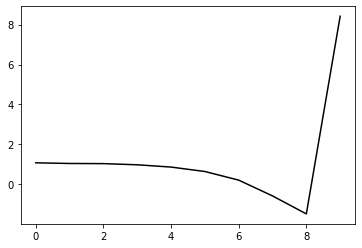

423500 0.2551538003906944
0.2570003950619055 -0.1844403575971679 -0.20023662590725 -0.12499451739762618
[ 1.05099449  1.22963467  1.23644191  1.18979954  1.07961918  0.86128208
  0.43320728 -0.35377772 -1.25299001  8.43563247]


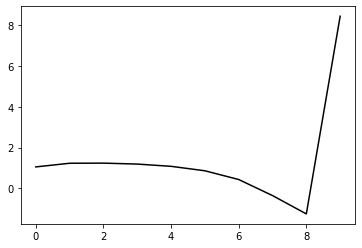

424600 0.22771690372179051
0.2589892718726344 -0.182962407648934 -0.20005486641024386 -0.12359102679797565
[ 1.02429634  1.07896199  1.12912069  1.10039374  0.99270142  0.77346553
  0.34482194 -0.44372815 -1.34538441  8.45870684]


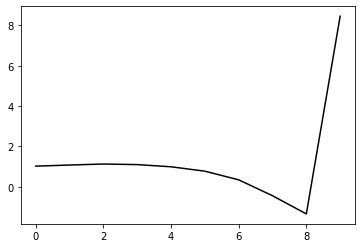

425700 0.22577907188149943
0.25007652810016057 -0.18574070019135658 -0.20008119634915345 -0.12437332581570304
[ 1.11032656  1.05916011  1.05449998  1.0327063   0.93330224  0.71707832
  0.29082897 -0.49578515 -1.39508643  8.40251717]


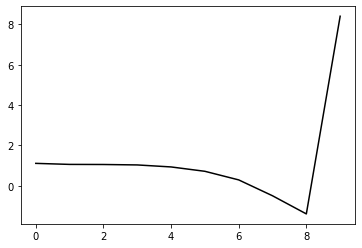

426800 0.2308077847442597
0.2539021230987028 -0.19246223722127367 -0.2067039356640145 -0.11779841950048939
[ 1.03739731  0.97921675  0.96330832  0.92922387  0.83071811  0.61521106
  0.19035774 -0.59368375 -1.48826433  8.41408051]


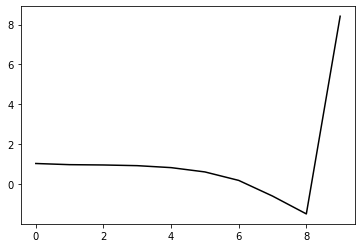

427900 0.21138225764279106
0.2593005942948919 -0.18748319370882383 -0.20344768850825748 -0.12186698439994298
[ 1.04252695  1.17080498  1.12163112  1.05355825  0.93332117  0.69888088
  0.25606006 -0.54496033 -1.45589223  8.42299078]


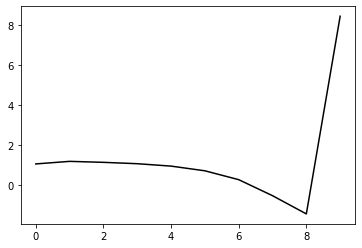

429000 0.1809788895144441
0.25921846248630714 -0.1863753771518943 -0.20247144141564383 -0.12434057363496227
[ 1.09922565  1.11686065  1.11865126  1.05862319  0.94166721  0.71312024
  0.27588647 -0.52000251 -1.42559754  8.4546499 ]


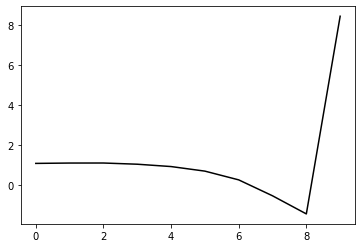

430100 0.19978112550441043
0.2482800275903903 -0.18638700788438575 -0.2000878020209441 -0.12645868671878727
[ 1.09554993  0.91312948  0.91941656  0.86150653  0.73519035  0.49875186
  0.05552269 -0.74506636 -1.65357626  8.38943419]


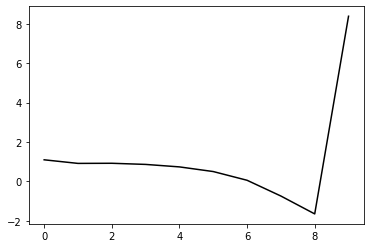

431200 0.1379496625052835
0.25562483435138467 -0.18724769151688753 -0.20208636144063194 -0.12555044740890428
[ 1.09076241  1.13898064  1.11989046  1.06153039  0.93408509  0.69471864
  0.24864186 -0.5548168  -1.46614557  8.43127617]


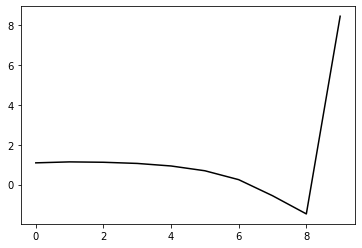

432300 0.25147250678276895
0.26431661848110577 -0.17785509770316443 -0.19690072553708862 -0.12594893570172658
[ 1.08488239  1.17935918  1.21138595  1.15337164  1.0185673   0.76949344
  0.3127321  -0.50322018 -1.43034803  8.39626403]


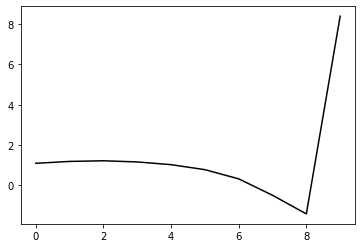

433400 0.18456547604471182
0.2618744105630614 -0.17842504641356682 -0.1974451609959736 -0.123628329041458
[ 1.04476491  1.12539519  1.14520817  1.09793209  0.96269129  0.70862557
  0.24594804 -0.57699908 -1.51290989  8.42346167]


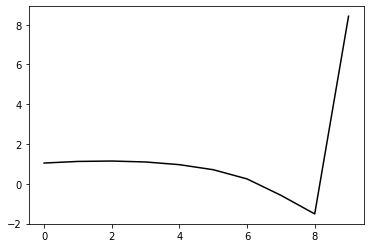

434500 0.25400791609852025
0.2665006324711347 -0.17547556453284635 -0.19636237986605592 -0.12503202418593384
[ 1.07905063  1.19590216  1.25331356  1.23064347  1.11347749  0.87029982
  0.41596191 -0.39967789 -1.32850611  8.43760595]


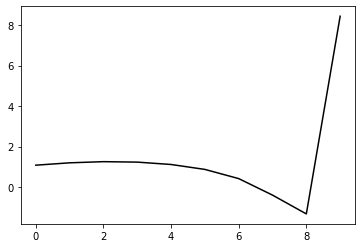

435600 0.22058152068413636
0.2565745609231665 -0.1877412407225825 -0.20394215820307005 -0.12101666836239908
[ 1.07223968  1.00744328  1.01963679  1.00559203  0.9016016   0.66719193
  0.2206708  -0.58570282 -1.50193357  8.41203547]


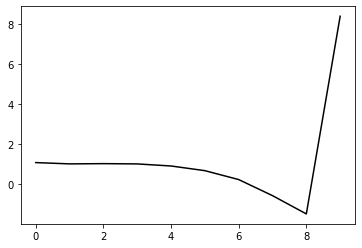

436700 0.21450102174146052
0.25549280301713473 -0.18713331246148404 -0.20303705204504388 -0.12387238236110129
[ 1.09873146  1.03286677  1.03601751  1.0209309   0.93082323  0.70908196
  0.27284302 -0.52303721 -1.42696439  8.38553225]


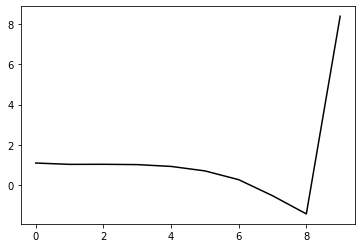

437800 0.18900970703729503
0.2575083159526278 -0.1853680761979475 -0.2022749858457253 -0.12499059320226535
[ 1.04776872  1.15414413  1.14730335  1.11993609  1.03119156  0.81276002
  0.37579762 -0.42353228 -1.33346191  8.45332961]


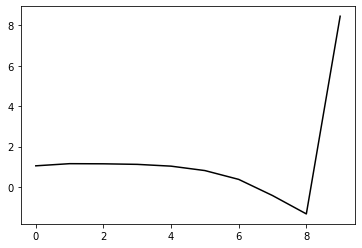

438900 0.21078001376007466
0.26137000357485507 -0.18731812633485478 -0.20529332925783675 -0.12036615505936166
[ 1.05626935  1.08139485  1.09042776  1.05197958  0.95380061  0.73020733
  0.28686851 -0.51978945 -1.43744809  8.40833554]


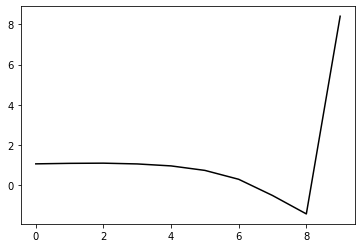

440000 0.20418433230425917
0.2592621670578107 -0.18090456802849436 -0.19991351916031766 -0.1250388770828314
[ 1.0969799   1.10879284  1.12916891  1.09632015  0.99931394  0.77851452
  0.33634572 -0.47114945 -1.39091839  8.44288564]


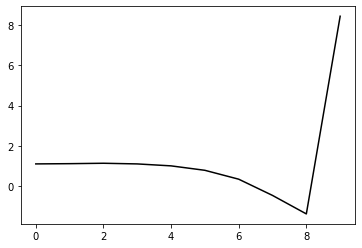

441100 0.18740296163630954
0.25658025236782 -0.17824206141414373 -0.19742675792165185 -0.12672400158029268
[ 1.09565261  1.09914881  1.12841828  1.10125575  1.00283016  0.78080836
  0.33654451 -0.47480922 -1.3998452   8.38939766]


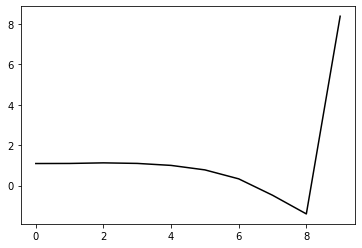

442200 0.14452435744811165
0.25386626596346085 -0.17785283899246535 -0.1966299063980953 -0.12324259744233594
[ 1.06309713  0.97471281  0.97675174  0.93995903  0.83084893  0.60046742
  0.15033332 -0.66520992 -1.59190328  8.41566256]


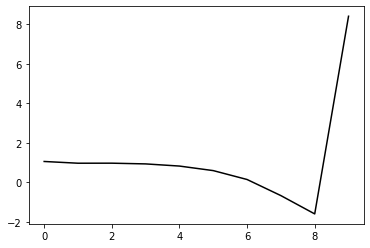

443300 0.25463482621767747
0.2604548386104387 -0.17635170511911788 -0.19712407175907634 -0.12500087855554354
[ 1.07189184  1.15929482  1.16766752  1.13067088  1.02291787  0.79198329
  0.34015201 -0.47849742 -1.40919197  8.39470381]


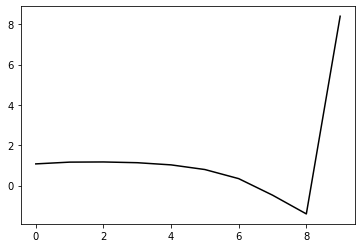

444400 0.2030553939460577
0.2536018192881315 -0.1816103289021319 -0.1991978599522973 -0.12547265129200882
[ 1.06510585  1.01702923  1.01839028  0.99116013  0.89092084  0.66829635
  0.22583721 -0.58262087 -1.50058843  8.43042808]


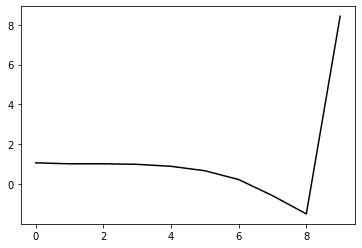

445500 0.25469228314052994
0.2538437981824574 -0.18077958378758477 -0.19872768213172814 -0.12599705981749515
[ 1.06566069  1.07587829  1.06858718  1.03576577  0.93368451  0.70823412
  0.26237515 -0.55021291 -1.47237375  8.40461093]


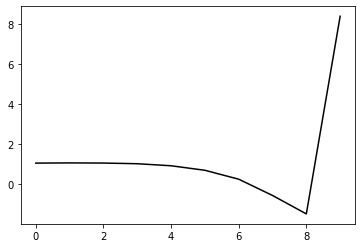

446600 0.21272246102610726
0.25616651551047914 -0.1835496828912777 -0.2012925647780747 -0.12753362470512972
[ 1.06977659  1.11897423  1.14741737  1.12535288  1.03460437  0.82030303
  0.38448909 -0.41937325 -1.33303497  8.42963055]


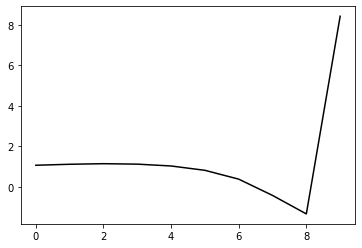

447700 0.2264514877134724
0.2544654011188874 -0.1865443303310002 -0.20341135414419645 -0.1222268027821869
[ 1.03236327  0.99743689  0.98984197  0.95377509  0.84792649  0.61994877
  0.17126887 -0.64560119 -1.57256435  8.39288296]


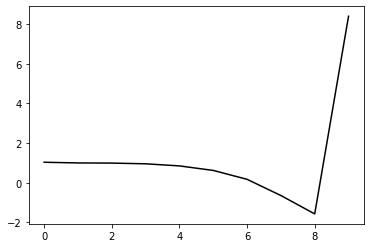

448800 0.19545081840139747
0.2588918484162474 -0.180994188654506 -0.20004109041683113 -0.12507949844504535
[ 1.06496535  1.10880011  1.10720437  1.065962    0.95920811  0.73025249
  0.28014641 -0.53886682 -1.46805506  8.42612628]


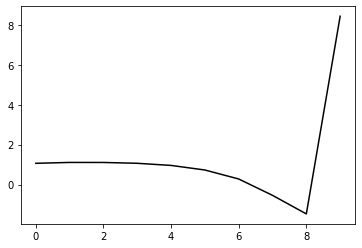

449900 0.22802360552956083
0.25557485823577136 -0.1844054526503438 -0.20187635171988014 -0.12575488473681193
[ 1.06604418  1.05399664  1.03718686  1.00613578  0.90950656  0.6902382
  0.24877959 -0.56260978 -1.48305631  8.41932552]


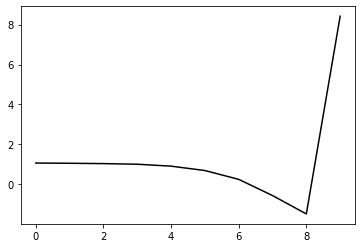

451000 0.1702472129438006
0.2558252137136964 -0.18753796830596015 -0.20462407073588695 -0.1252431039137376
[ 1.06762096  1.07109093  1.05575851  1.02721914  0.94356123  0.73824271
  0.3082583  -0.49479241 -1.40828229  8.44027341]


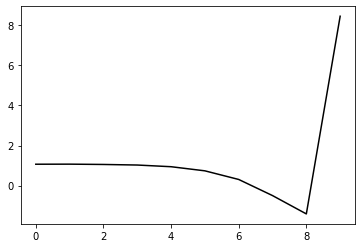

452100 0.19954775902994615
0.2559820668898853 -0.17902490195205087 -0.19836787610653808 -0.12784681218501498
[ 1.10079559  1.14706115  1.17591829  1.14047846  1.04120918  0.82224063
  0.37735218 -0.44444815 -1.38184315  8.43699118]


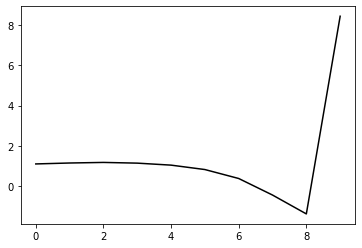

453200 0.15621158725529924
0.2531806428555079 -0.18268351802900762 -0.20094846185373913 -0.12417349025502142
[ 1.03151648  0.96456633  0.96456605  0.92213612  0.80733379  0.57445354
  0.11876675 -0.71265903 -1.6582222   8.42200841]


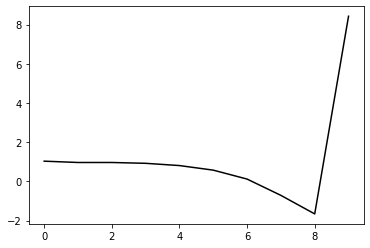

454300 0.25758120302917525
0.25892578927334037 -0.1769622979172781 -0.19758423841287742 -0.1271537770237747
[ 1.09470089  1.1389519   1.14414913  1.10261546  0.9898145   0.75610014
  0.29891597 -0.53537191 -1.48508358  8.41996325]


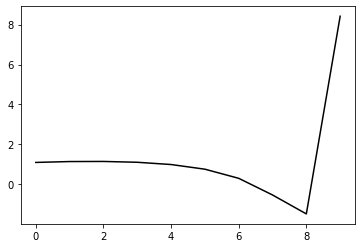

455400 0.2141860703224777
0.2604497892686662 -0.18165107253297327 -0.20199370192782526 -0.12377651557485687
[ 1.00056919  1.06725542  1.07499757  1.04222671  0.93541646  0.70618903
  0.25381127 -0.57603124 -1.52080101  8.42232469]


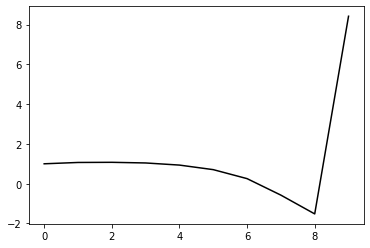

456500 0.2608761428383641
0.2611218977955805 -0.18101568822586178 -0.20171735684968156 -0.12458036064083336
[ 1.04932274  1.10587199  1.11751295  1.09166223  0.99698318  0.77828384
  0.33521417 -0.48672798 -1.42421126  8.43376939]


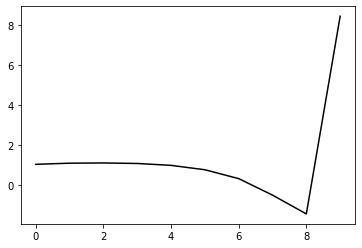

457600 0.21405137146836406
0.2590471058978995 -0.17991925887132182 -0.2005006213854235 -0.12435101717929355
[ 1.02737362  1.03381673  1.0415855   1.00575604  0.90136557  0.67367156
  0.22143053 -0.6106272  -1.55967389  8.41205061]


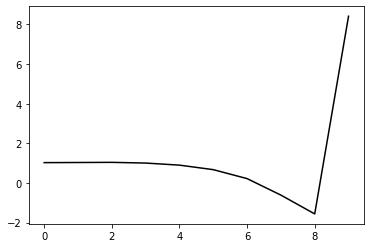

458700 0.21939791571204503
0.2561074925871705 -0.1833193146361384 -0.20251978730277675 -0.12339628950225762
[ 1.08005961  1.05183135  1.04401103  1.01385389  0.91888757  0.70046523
  0.25663909 -0.5681208  -1.510245    8.40186888]


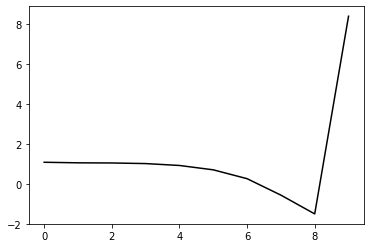

459800 0.2011470164826903
0.257703401628152 -0.1828169030888501 -0.2024545076689652 -0.12425107703419203
[ 1.03467495  1.12742119  1.12380038  1.08987134  0.99321787  0.77450139
  0.3302455  -0.49549113 -1.43877512  8.43249662]


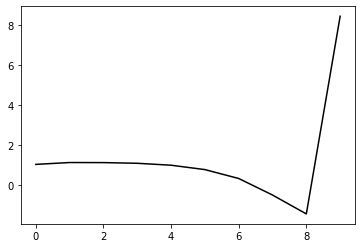

460900 0.22907982974772928
0.2573127392004428 -0.1808575263832327 -0.2009751720325248 -0.12467601372930405
[ 1.07373439  1.10584786  1.11013511  1.07030186  0.96817743  0.74505153
  0.29602338 -0.53582433 -1.4869036   8.39958485]


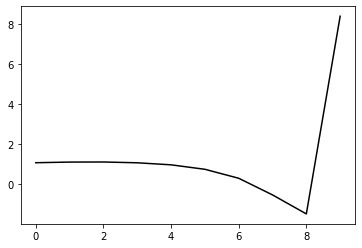

462000 0.17567186191364095
0.25717452864995866 -0.18358342316283247 -0.2030850511139995 -0.12443379400611987
[ 1.08818238  1.06197063  1.0688395   1.03664126  0.94028903  0.72441128
  0.28346813 -0.54052559 -1.48329598  8.42410958]


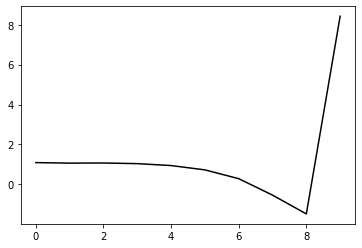

463100 0.30713073529960816
0.2489390259401909 -0.17727254702267287 -0.19566523831731236 -0.12936128952435041
[ 1.14412398  0.98929831  0.95311413  0.90587828  0.79825043  0.57324459
  0.12508836 -0.70525849 -1.65355253  8.38265226]


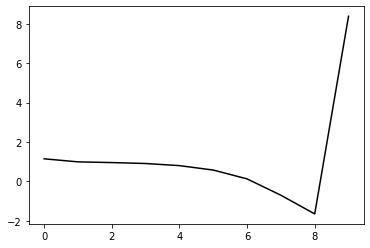

464200 0.1338397178442207
0.2596869090015716 -0.17907953492630796 -0.19946367350094504 -0.1268833025526677
[ 1.08042199  1.20308579  1.17116339  1.09539581  0.9700562   0.73211565
  0.27367893 -0.56561842 -1.52220378  8.42755293]


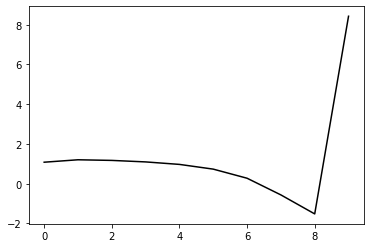

465300 0.2711547697199342
0.26085944613648365 -0.17966476838621276 -0.20043034583687822 -0.1261540303646953
[ 1.06711026  1.16982526  1.16559172  1.10432338  0.98061295  0.74523258
  0.28961421 -0.54839513 -1.50563827  8.40680665]


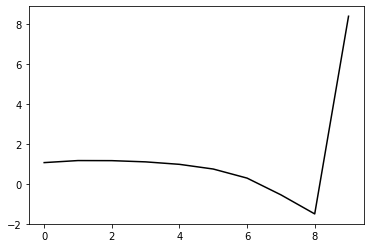

466400 0.19405156969757648
0.2576164185958734 -0.1849804340151265 -0.20380953131799007 -0.12695539919304782
[ 1.03142916  1.12250208  1.13271082  1.09253749  0.98050316  0.75507214
  0.31116417 -0.51430204 -1.45767242  8.42203704]


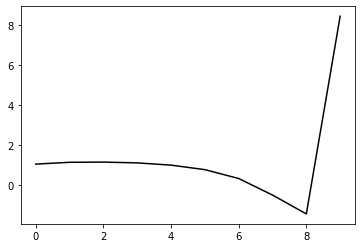

467500 0.2566779039237414
0.2567303406935522 -0.1892799604781505 -0.20722465913913374 -0.12554041632818597
[ 1.05397554  1.06026559  1.07442884  1.05403545  0.96661538  0.76367041
  0.34329085 -0.45883566 -1.37961519  8.37033413]


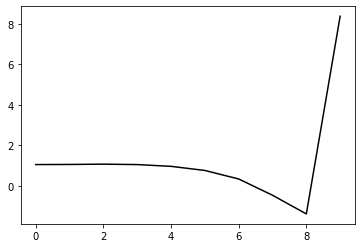

468600 0.21509108623294088
0.2566032602069603 -0.18375753532659678 -0.2029419883320427 -0.12514803151621048
[ 1.08095393  1.0302423   1.02717519  0.97715875  0.85834728  0.62303975
  0.17175726 -0.65925371 -1.60846435  8.38871557]


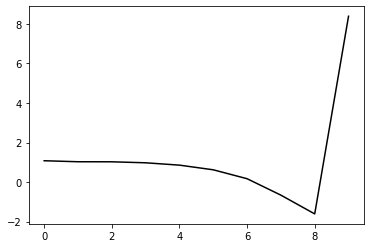

469700 0.2127857675209516
0.25410522885028086 -0.18619304958694505 -0.20389134617914587 -0.1277411857980187
[ 1.09716953  1.12604364  1.11067993  1.06110749  0.94265831  0.70646727
  0.25447239 -0.57631416 -1.52439136  8.42105134]


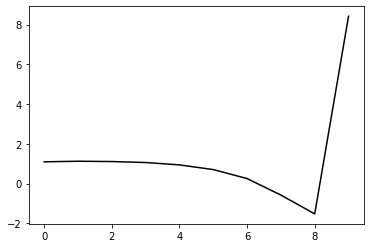

470800 0.1860937793097649
0.2568563706060025 -0.18378026163457056 -0.2028611566148672 -0.1268588250759535
[ 1.06181511  1.13095308  1.12879852  1.07862501  0.95687198  0.71641461
  0.25968279 -0.57608626 -1.5301985   8.44584774]


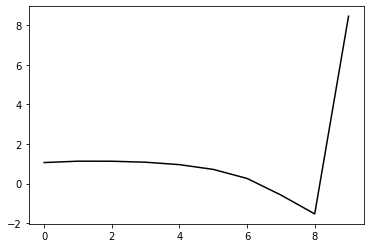

471900 0.22734773860749624
0.25933089235112866 -0.1829800565129172 -0.2031355636366219 -0.12554471145150578
[ 1.0640054   1.09845157  1.10314162  1.06407647  0.94781641  0.70967737
  0.25384622 -0.58185581 -1.53734033  8.39717614]


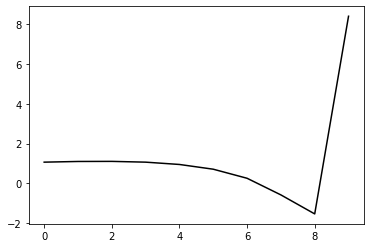

473000 0.18766124170974907
0.26017877601226796 -0.18005029759507196 -0.20113235951141642 -0.12720218841478284
[ 1.07715539  1.07454624  1.11648207  1.08838656  0.97751609  0.74146691
  0.28579489 -0.55106959 -1.5102869   8.4315263 ]


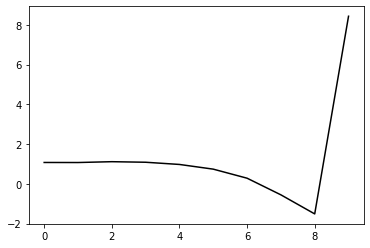

474100 0.19149473293418123
0.25609249260332106 -0.1776299792055493 -0.19849799042648467 -0.12917029312808123
[ 1.10100843  1.04458254  1.07756781  1.05978426  0.95485293  0.72025174
  0.26403223 -0.57404944 -1.53549402  8.37894767]


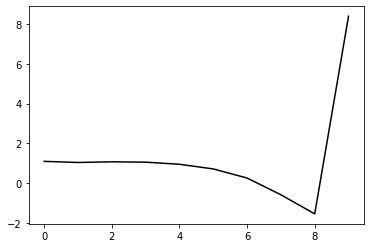

475200 0.15069713700955173
0.25511140357782747 -0.17966126286705272 -0.19965347085954233 -0.12968535696292752
[ 1.07869005  1.07742961  1.07314192  1.05091207  0.94992868  0.71743379
  0.26232272 -0.57390777 -1.53235667  8.41542406]


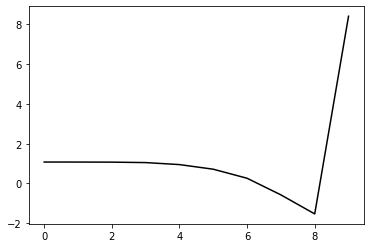

476300 0.28144418026931617
0.2632176317355411 -0.17706917952187504 -0.2002871365718156 -0.1254866695857531
[ 1.0447827   1.08415938  1.10986418  1.07811214  0.97070021  0.73123722
  0.26608448 -0.58196556 -1.55489187  8.40208488]


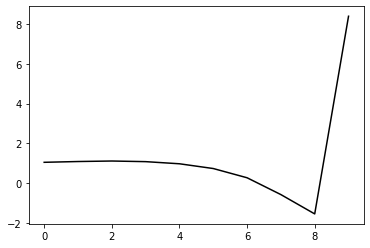

477400 0.20273364754030587
0.2550098601497008 -0.17959532466603018 -0.2002248043498932 -0.12773292866930877
[ 1.05573555  1.00110185  1.0007396   0.98379769  0.89035307  0.66504144
  0.21259808 -0.62323054 -1.58347713  8.44037893]


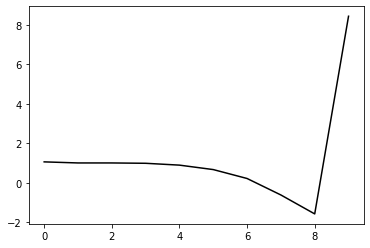

478500 0.2599979829319397
0.26214129451793977 -0.1750322673707558 -0.19871065777000793 -0.12901543075494576
[ 1.07296032  1.14442711  1.16635198  1.14972996  1.06199878  0.84101301
  0.38934588 -0.44847456 -1.41342808  8.42215363]


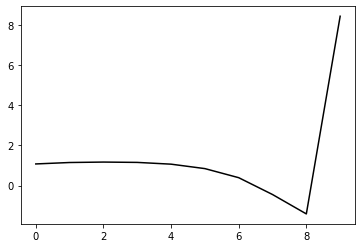

479600 0.21908243790819773
0.2585870585687039 -0.18149369205756344 -0.2028557700733762 -0.12634373823093242
[ 1.02984777  1.08824743  1.06864521  1.04306505  0.95505412  0.7368389
  0.28786086 -0.54697199 -1.50767002  8.42182013]


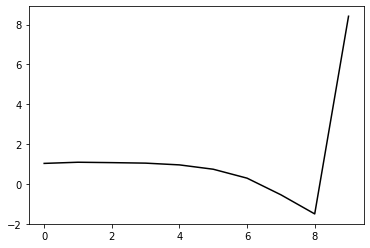

480700 0.21941539946075767
0.2540330483695453 -0.18309634161698726 -0.20316221671535453 -0.12709733853233598
[ 1.06706105  0.99436688  0.97148224  0.94701533  0.86929198  0.66589731
  0.23058189 -0.59196649 -1.54016133  8.40233597]


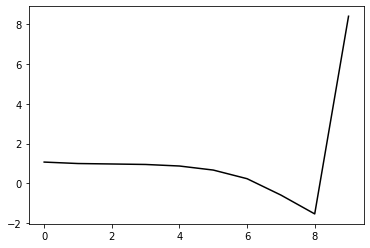

481800 0.23738959944279256
0.2569142745384502 -0.18516466302158252 -0.20546176291079976 -0.1266772851515766
[ 1.00797383  1.09697131  1.0764084   1.04264116  0.96261297  0.76296826
  0.33187333 -0.48734616 -1.43216818  8.4304475 ]


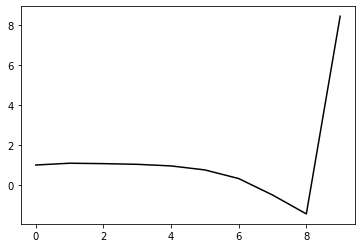

482900 0.21826942044507452
0.2596605136627314 -0.1845634499364366 -0.20547183087988746 -0.1273716251784366
[ 1.00298544  1.13344043  1.13202483  1.09331829  1.00552421  0.80503245
  0.37573894 -0.44191062 -1.38483878  8.39771693]


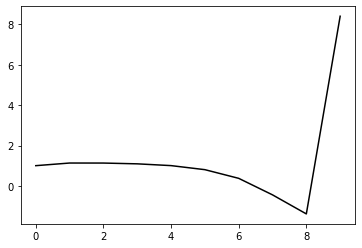

484000 0.258617727402725
0.25710066851337293 -0.17606006266721114 -0.19895928471679095 -0.12755104145287877
[ 1.11778312  0.93945007  0.94837049  0.90620181  0.81023597  0.60395154
  0.1701747  -0.6539254  -1.60623178  8.43437376]


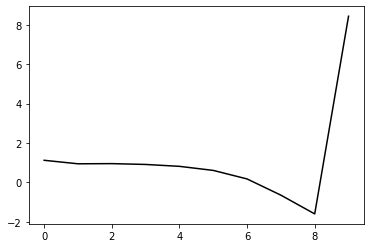

485100 0.2059665654600764
0.2587915280403036 -0.18025317434264201 -0.20224331104293652 -0.12599577314225763
[ 1.05410681  1.10855247  1.08001453  1.02657748  0.92156893  0.707934
  0.2693455  -0.55901962 -1.51527273  8.40220772]


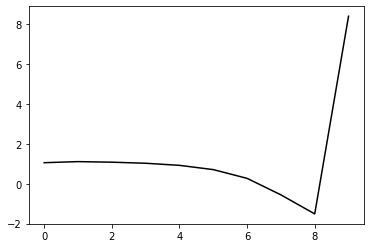

486200 0.1336554641302864
0.25458966768274505 -0.17945771733351842 -0.20030810593327805 -0.13004089232173519
[ 1.0605737   1.0799404   1.05478603  1.0004819   0.89400043  0.6804397
  0.24414685 -0.58186384 -1.53553807  8.41898476]


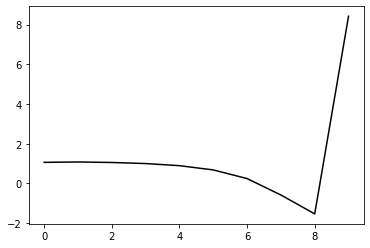

487300 0.2448443165455938
0.2519588695007517 -0.1785194020083761 -0.1991553236886041 -0.13014605634078913
[ 1.0913291   1.03711085  1.01825551  0.96403408  0.85394291  0.63726357
  0.19959348 -0.62843844 -1.5857726   8.35442241]


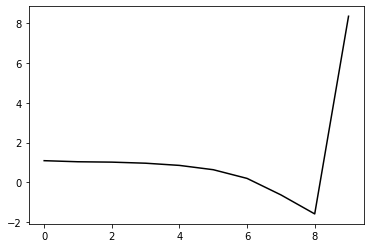

488400 0.24693882854249638
0.25154988386746396 -0.1835729865912659 -0.20314874923465412 -0.12692711890064776
[ 1.1227928   0.88164369  0.89753904  0.85246434  0.74497889  0.53001981
  0.09505165 -0.73087856 -1.68744811  8.43060188]


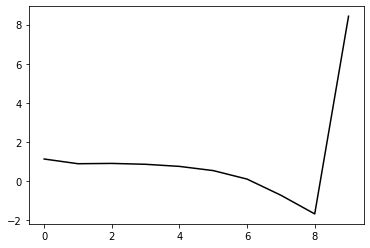

489500 0.260141765039938
0.25194085088896806 -0.17995381579810144 -0.20035920110594121 -0.12962084686533884
[ 1.06016165  1.06508731  1.03752372  0.98745956  0.87456339  0.65277934
  0.21109431 -0.62220741 -1.587861    8.38669075]


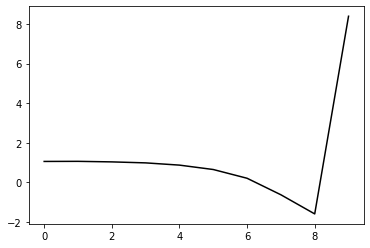

490600 0.21442913185349463
0.2567799002783945 -0.18059440053433945 -0.20241789775409819 -0.12831641703618557
[ 1.06184062  1.02996846  1.03305819  0.98768428  0.88011071  0.66294903
  0.22665765 -0.60125148 -1.56193268  8.40319252]


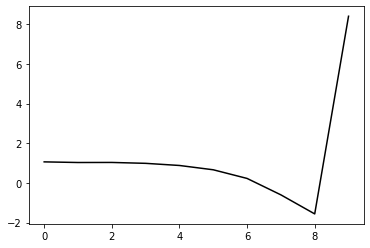

491700 0.21703633637424363
0.25416142529605934 -0.1813919634820191 -0.20253580687088285 -0.12898521520007863
[ 1.0612757   1.00548233  1.00693268  0.9693411   0.86647823  0.652957
  0.22141902 -0.60138423 -1.55735145  8.40166153]


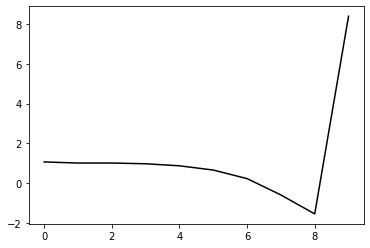

492800 0.19835137277885165
0.25448388428734664 -0.18049178813544978 -0.20201832981076548 -0.12919429271162935
[ 1.04836079  1.05190871  1.03296899  0.9913369   0.88739821  0.67101459
  0.23696675 -0.58831421 -1.54791913  8.4253092 ]


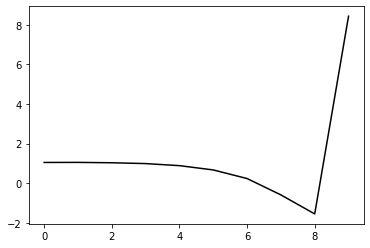

493900 0.22562364703590615
0.25590834514714966 -0.18166668633064995 -0.2034430905216969 -0.12853028919594556
[ 1.04188035  1.07239875  1.05175139  1.01032966  0.91193803  0.7003258
  0.27039517 -0.55128255 -1.50864909  8.40407632]


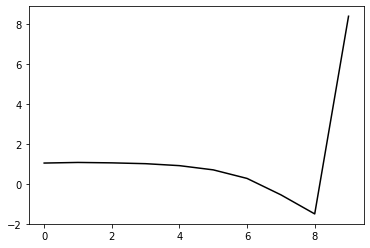

495000 0.20144513791863183
0.2532410394736609 -0.18451058524836478 -0.20514243109471478 -0.12854356490566043
[ 1.09720262  0.92437064  0.94420634  0.92236931  0.83673053  0.63784631
  0.21976865 -0.59105478 -1.53943004  8.38694684]


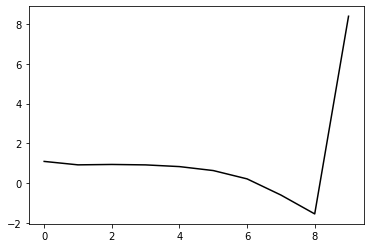

496100 0.1827429310428743
0.25270587618638385 -0.18083882833855905 -0.20230004965448922 -0.1306605716111353
[ 1.09605154  1.0449864   1.03612405  1.00819315  0.92579516  0.72966073
  0.31356352 -0.49657731 -1.44742897  8.42639325]


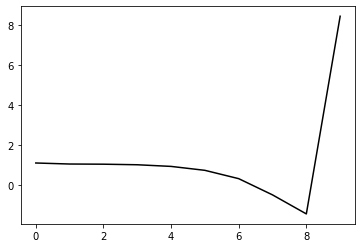

497200 0.15281068770710388
0.2530597146616031 -0.17888646018101917 -0.20089054430980874 -0.1318169530932259
[ 1.07184094  1.09113669  1.07687267  1.039175    0.95059979  0.75112165
  0.33239838 -0.4802976  -1.43507572  8.42844915]


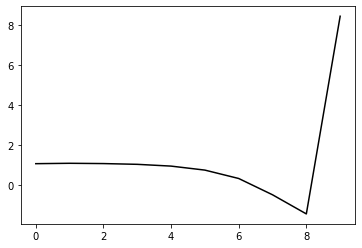

498300 0.2555339061952879
0.2536397362676915 -0.17533805124807827 -0.19863273193132575 -0.13112831921409904
[ 1.08148351  1.06417247  1.04884247  1.00515366  0.90781176  0.70209708
  0.27819612 -0.54004733 -1.50280922  8.37794276]


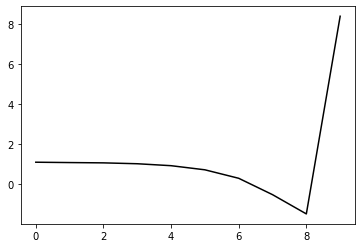

499400 0.16643780992217638
0.25661718376320747 -0.1758582969813644 -0.20001232885774298 -0.12914564261923264
[ 1.02815969  1.10952068  1.10143205  1.05517732  0.95400042  0.74576686
  0.32093792 -0.49752309 -1.46113442  8.43508523]


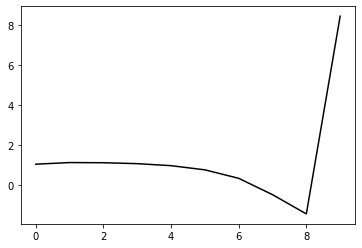

In [160]:
optimizer=tf.optimizers.Adam(learning_rate=0.0005)
for j in range (5000):    
    with tf.GradientTape() as g:
        loss=Error_func(h, m2, lam, alpha, beta, Positive[j%10], Negative[j%10])
        gradients=g.gradient(loss, [h, m2, lam, alpha, beta])
        if np.isnan(loss)==True: break
    for i in range (90):
        optimizer.apply_gradients(zip(gradients, [h]))
        if any(np.isnan(h.numpy()))==True: break
    for i in range (10):
        optimizer.apply_gradients(zip(gradients, [h, m2, lam, alpha, beta]))
        if any(np.isnan(h.numpy()))==True: break
    if j%11==0: 
        print(j*100, Error_func(h, m2, lam, alpha, beta, Positive[j%10], Negative[j%10]).numpy())
        print(m2.numpy(), lam.numpy(), alpha.numpy(), beta.numpy()), print(h.numpy())
        plt.plot(h.numpy(), 'k-'), plt.show()

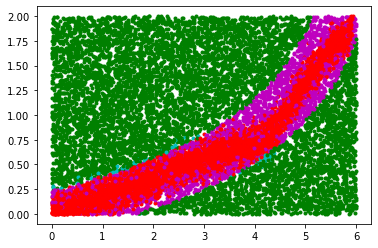

In [161]:
for i in range (set):
    [Positive0[i], Positive1[i]]=NN_func_01(h, m2, lam, alpha, beta, Positive[i])
    [Negative0[i], Negative1[i]]=NN_func_01(h, m2, lam, alpha, beta, Negative[i])
for i in range (set):
    x_data1[i]=[v[0] for v in Positive0[i]]
    y_data1[i]=[v[1] for v in Positive0[i]]
    x_data2[i]=[v[0] for v in Positive1[i]]
    y_data2[i]=[v[1] for v in Positive1[i]]
    x_data3[i]=[v[0] for v in Negative0[i]]
    y_data3[i]=[v[1] for v in Negative0[i]]
    x_data4[i]=[v[0] for v in Negative1[i]]
    y_data4[i]=[v[1] for v in Negative1[i]]
    plt.plot(x_data4[i], y_data4[i], 'g.')
    plt.plot(x_data2[i], y_data2[i], 'c.')
    plt.plot(x_data1[i], y_data1[i], 'r.')
    plt.plot(x_data3[i], y_data3[i], 'm.')
plt.show()